## **3<sup>rd</sup> Year Project eDiary:** *Project 72 - Classifying Cosmological Data with Machine Learning*


#### **Week Starting January 29th:**

##### **Thursday Febuary 1st 10am-11am: SUPERVISOR MEETING**
- Met with Adam Moss and discussed project, we will be classifying galaxies using deep learning similar to the galaxy zoo project. https://www.zooniverse.org/projects/zookeeper/galaxy-zoo/
- Discussed previous knowledge of machine learning and got introduced to the fundamentals of machine learning.
- Discussed problems faced in classifcation problems with convoloutional neural networks and discussed techniques to fix these problems, i.e. domain adaptation.
- Created timeline for project and drafted a project plan

- Read up to section 1.3 of the Machine Learning Notes:
    - 1.1 introduction to deep learning:
       - Notation
       - Loss functions
       - Neurons
       - Activation functions
    - 1.2 Basic Types of Networks:
        - Linear model
        - Perceptron
        - Logistic Regression
        - Multi-Layer perceptron
    - 1.3 Back propagation:

##### **11am-1pm PROJECT PARTNER MEETING:**
- Drafted project plan
- Divided tasks
- Look at galaxy zoom and familarised ourselves with the classification classes.

#### **PROJECT PLAN:**
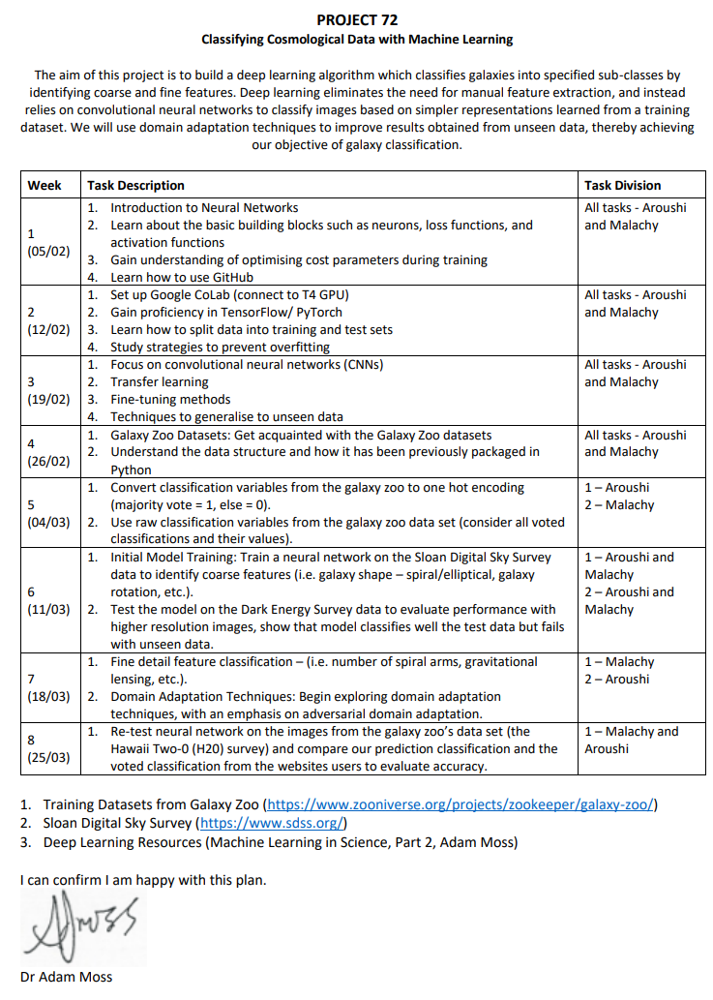


- ### **1 Introduction to deep learning:**

    Deep learning algorithms have the advantage of automatically discovering the representations needed for feature detection or classification from raw data, eliminating the need for manual feature extraction. This ability to learn complex, hierarchical features at multiple levels of abstraction allows deep learning models to handle a wide range of tasks with higher accuracy, especially as the volume and variety of data increase.

    - #### **1.1 Neural Network Basics:**
        - ##### **1.1.1 Notation**

             We were introduced to the mathematical symbols for data representation, including input $X$ and target $Y$, and how they form a dataset. This dataset can be split into training, test and validation datasets.

        - ##### **1.1.2 Loss functions**
        
            Describes the function $J(\theta)$ to evalaute predicition errors, using per loss dependent on the task, like MSE or BCE. It is defined as
            
            $ J(\theta) = \frac{1}{N} \sum_{i}^{N} l(\hat{y}^{(i)}(\theta) , y^{(i)}) $
            
            where $\hat{y}$ and $y$ are the prediciton and the target respectively.
            
            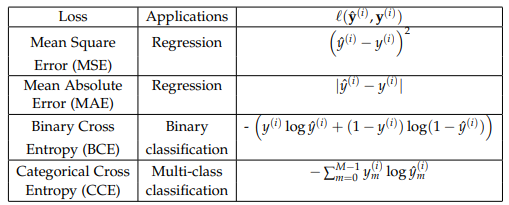

            *Common loss functions and their typical applications*

            For the purpose of this project, Galaxy Zoo target data contains probabilities of galaxy classifications rather than a single correct answer, due to the ambiguitity of some galaxy images. We will be trying two different approaches - one wherein we use the probability matrix as the target output, and one where we create a 'one-hot' target vector for the algorithm to aim towards.

        - ##### **1.1.3 Neurons**
            
            Explains artificial neurons that output a weighted sum of inputs passed through an activation function. This is represented by the following equation,
            
            $z = \mathbf{x}^\mathbf{T} \mathbf{w} + b$
            and
            $a = \Phi(z)$
            
            where $\Phi$ is an activation function.
            
            A multi-layer perceptron consists of many such neurons stacked into layers, with the output of one layer serving as the input for the next

        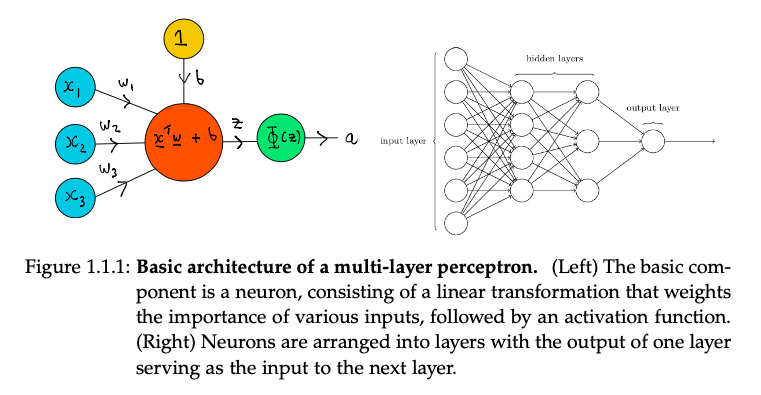


        - ##### **1.1.4 Activation functions**
        
            Discusses non-linear functions like sigmoid or ReLU essential for learning complex patterns.

        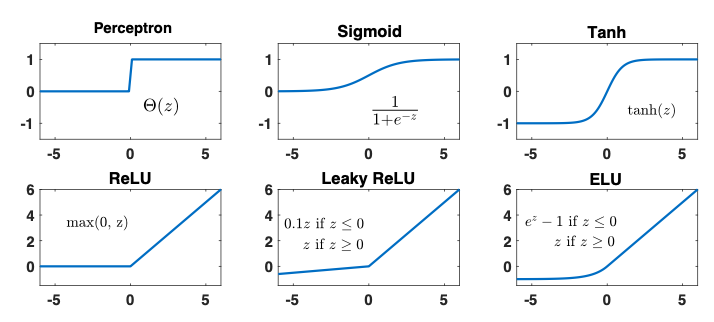


    - #### **1.2 Basic Types of Networks:**

        - ##### **1.2.1 Linear model**
        
            Covers the simplest neural model using a linear activation function, showing its limitation with non-linear data like XOR
            
        - ##### **1.2.2 Perceptron**
        
            Introduces the binary classifier perceptron with a step function and weight update rules based on the perceptron learning algorithm.

        - ##### **1.2.3 Logistic Regression**
        
            Describes logistic regression using the sigmoid function for binary classification and its training via gradient descent.

        - ##### **1.2.4 Multi-Layer perceptron**
        
            Describes MLPs capable of learning non-linear functions, detailing their structure and function, including the ReLU activation and training considerations.

    - #### **1.3 Back propagation:**
    
        - Core algorithm for training neural networks, especially MLPs.
        - Involves two phases: forward pass (computing activations) and backward pass (propagating errors backward).
        - Errors calculated at the output layer are propagated back to update weights.
        - Mathematically, this involves the chain rule to compute gradients for weight updates.        
        - Process is repeated iteratively for a number of epochs or until convergence.

[[1 0 0]
 [1 0 1]
 [1 1 0]
 [1 1 1]]
[[0]
 [0]
 [0]
 [1]]


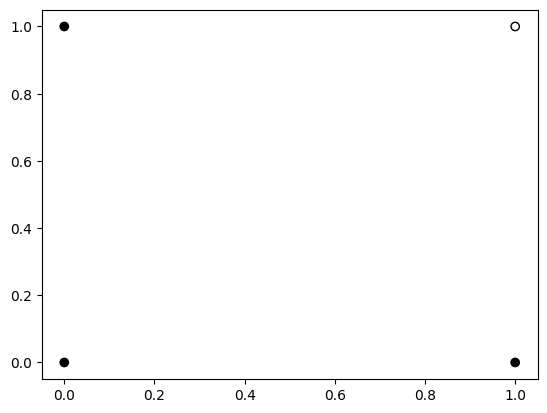

[[-0.25]
 [ 0.5 ]
 [ 0.5 ]]
[[-0.25]
 [ 0.25]
 [ 0.25]
 [ 0.75]]


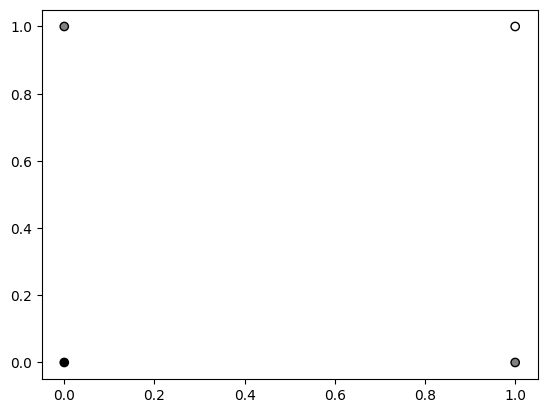

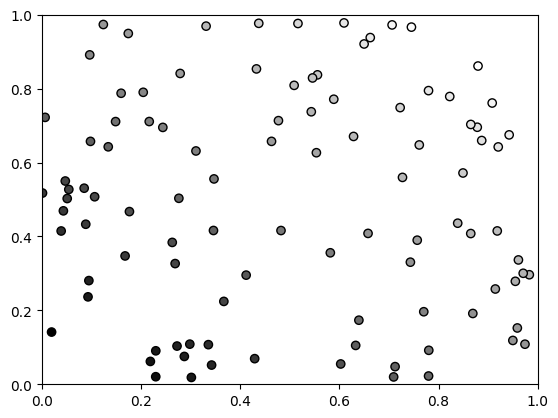

[[0]
 [1]
 [1]
 [0]]
[[0.5]
 [0. ]
 [0. ]]
[[0.5]
 [0.5]
 [0.5]
 [0.5]]


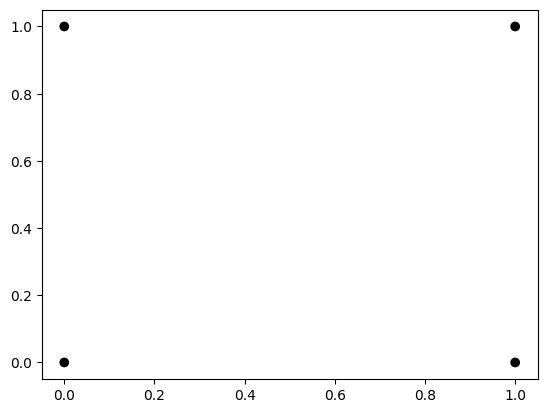

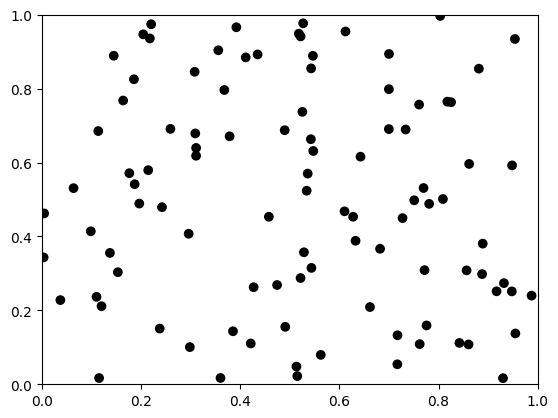

In [6]:
import numpy as np
import matplotlib.pyplot as plt

run = False

if run:
    #AND function:
    X = np.array([[1,0,0], [1,0,1], [1,1,0], [1,1,1]]) #x1, x2
    print(X)

    inv = np.linalg.inv(np.matmul(X.T, X))
    Y = np.array([[0], [0], [0], [1]]) #AND gate output
    print(Y)

    plt.scatter(X[:,1], X[:,2],c=np.reshape(Y,4), edgecolors='black', cmap='gray')
    plt.show() #AND gate outputs

    w = np.matmul(inv,  np.matmul(X.T, Y)) #weights, found by choosing to model as a linear regression problem -> so MSE loss function is used.
    print(w) 

    Yhat = np.matmul(X, w)
    print(Yhat)

    plt.scatter(X[:,1], X[:,2],c=np.reshape(Yhat,4), edgecolors='black', cmap='gray') #plot the predictions
    plt.show() #AND gate predictions

    #if we have new points, we cab use the trained model to predict the Y values

    n = 100
    Xtest = np.transpose(np.reshape(np.append(np.ones(n),np.random.uniform(0,1,n*2)),(3,n)))
    Yhattest = np.matmul(Xtest, w)

    plt.scatter(Xtest[:,1], Xtest[:,2],c=np.reshape(Yhattest,n), edgecolors='black', cmap='gray')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.show() 

    #XOR function:
    Y = np.array([[0], [1], [1], [0]])
    print(Y)

    w = np.matmul(inv,  np.matmul(X.T, Y))
    print(w)

    Yhat = np.matmul(X, w)
    print(Yhat)

    plt.scatter(X[:,1], X[:,2],c=np.reshape(Yhat,4), edgecolors='black', cmap='gray')
    plt.show() #XOR gate outputs

    #The model is not able to predict the XOR gate outputs, outputting 1/2 for all examples.

    n=100
    Xtest = np.transpose(np.reshape(np.append(np.ones(n),np.random.uniform(0,1,n*2)),(3,n)))
    Yhattest = np.matmul(Xtest, w)

    plt.scatter(Xtest[:,1], Xtest[:,2],c=np.reshape(Yhattest,n), edgecolors='black', cmap='gray')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.show() 

    #This is true for the test samples as well.

[[1 0 0]
 [1 0 1]
 [1 1 0]
 [1 1 1]]
[[0]
 [0]
 [0]
 [1]]
[[0.05488135]
 [0.07151894]
 [0.06027634]]
[[-0.24511865]
 [ 0.17151894]
 [ 0.16027634]]
[[0.]
 [0.]
 [0.]
 [1.]]


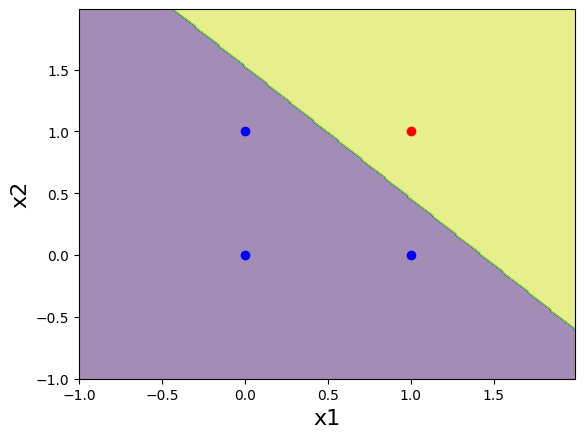

[[0]
 [1]
 [1]
 [0]]
[[0.05488135]
 [0.07151894]
 [0.06027634]]
[[0.05488135]
 [0.07151894]
 [0.06027634]]
[[1.]
 [1.]
 [1.]
 [1.]]


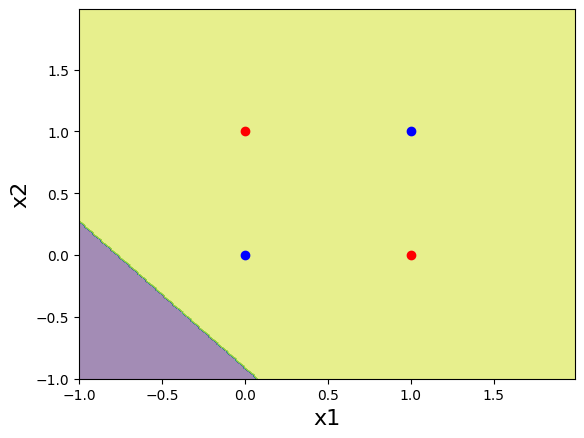

In [7]:
import numpy as np 
import matplotlib.pyplot as plt 

run = False

#perceptron model is given by:
#yhat = ϴ (x^T w)
#where ϴ is the Heaviside step function. This is an example of a binary classifier.
#due to the non-linearty of the Heaviside step function we cannot solve for the weights using the normal equations
#we can use the perceptron learning algorithm to iteratively find the weights depending on the size of the prediction error.
#1/ Initialise the weights to 0 or small random values
#2/ Iteravitely update the weights by w -> w + αX^T (Yhat - Y), where α is the learning rate.
#3/ Repeat step 2 until a stopping codition is met, this could be a maximum number of iterations or that the 
# loss has not improved significantly from the previous iteration.

if run:
    #AND function:

    X = np.array([[1,0,0], [1,0,1], [1,1,0], [1,1,1]]) #x1, x2
    print(X)

    Y = np.array([[0], [0], [0], [1]]) #AND gate output
    print(Y)

    np.random.seed(0) 
    w = 0.1 * np.random.random(size=(3, 1)) #initialise the weights to small random values
    print(w)

    num_epochs = 10 
    learning_rate = 0.1 #α

    for i in range(num_epochs): 
        Yhat = np.heaviside(np.matmul(X, w), 0) 
        w -= learning_rate * np.matmul(X.T, Yhat - Y)
    print(w)

    #check the classification of the training samples
    Yhat = np.heaviside(np.matmul(X, w), 0) 
    print(Yhat)

    #plot the descision boundary for all values of x
    id0 = np.where(Y[:, 0] == 0) 
    id1 = np.where(Y[:, 0] == 1)

    xx, yy = np.mgrid[-1:2:.01, -1:2:.01] 
    Yhat = np.heaviside(w[0] + w[1] * xx + w[2] * yy, 0)

    plt.figure() 
    plt.contourf(xx, yy, Yhat, alpha=0.5) 
    plt.scatter(X[id0, 1], X[id0, 2], color='blue') 
    plt.scatter(X[id1, 1], X[id1, 2], color='red') 
    plt.xlabel('x1', fontsize=16) 
    plt.ylabel('x2', fontsize=16) 
    plt.show()

    #XOR function:
    Y = np.array([[0], [1], [1], [0]]) #XOR gate output
    print(Y)

    np.random.seed(0) 
    w = 0.1 * np.random.random(size=(3, 1)) #initialise the weights to small random values
    print(w)

    for i in range(num_epochs): 
        Yhat = np.heaviside(np.matmul(X, w), 0) 
        w -= learning_rate * np.matmul(X.T, Yhat - Y)
    print(w)

    #check the classification of the training samples
    Yhat = np.heaviside(np.matmul(X, w), 0) 
    print(Yhat)

    #plot the descision boundary for all values of x
    id0 = np.where(Y[:, 0] == 0) 
    id1 = np.where(Y[:, 0] == 1)

    xx, yy = np.mgrid[-1:2:.01, -1:2:.01] 
    Yhat = np.heaviside(w[0] + w[1] * xx + w[2] * yy, 0)

    plt.figure() 
    plt.contourf(xx, yy, Yhat, alpha=0.5) 
    plt.scatter(X[id0, 1], X[id0, 2], color='blue') 
    plt.scatter(X[id1, 1], X[id1, 2], color='red') 
    plt.xlabel('x1', fontsize=16) 
    plt.ylabel('x2', fontsize=16) 
    plt.show()

#The perceptron manages to classify the AND gate outputs correctly, but not the XOR gate outputs, giving all examples the same value
#or class. This is because the perceptron is a linear classifier and will never be able to classify all examples correctly if the training
#data is not linearly separable, that is all examples of one class cannot be seperated from the other by a hyperplane.
#This is the case for the XOR gate outputs.

#The perceptron algorith is guaranteed to converge on some solution if the training data is linearly separable, but it may still pick any
#solution, depending on the inital weights and the training procedure. In the case of the AND example, there are infinitely many solutions
#seperating the two classes.

[[1 0 0]
 [1 0 1]
 [1 1 0]
 [1 1 1]]
[[0]
 [0]
 [0]
 [1]]
[[0.05488135]
 [0.07151894]
 [0.06027634]]
[[-15.5074077 ]
 [ 10.22541225]
 [ 10.22541225]]
[[1.84169761e-07]
 [5.05658027e-03]
 [5.05658027e-03]
 [9.92920285e-01]]


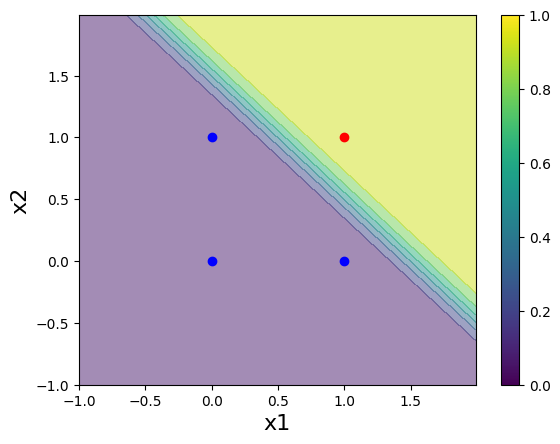

[[0]
 [1]
 [1]
 [0]]
[[0.05488135]
 [0.07151894]
 [0.06027634]]
[[-3.28399609e-16]
 [ 2.41896476e-16]
 [ 2.47572506e-16]]
[[0.5]
 [0.5]
 [0.5]
 [0.5]]


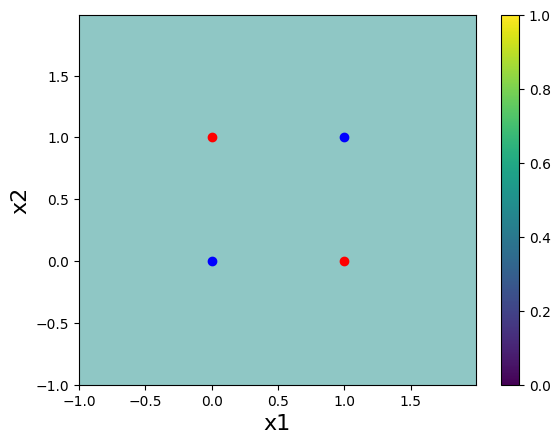

In [8]:
#The logistic model is given by:
#yhat = σ (x^T w)
#where σ is the sigmoid function. This is an example of a binary classifier.
#logistic regression is used to estimate the probability that an example belongs to a specific binary class.
#yhat = P(Y=1|x)
#There is no closed form solution for the weights, so we use a iterative procedure to find the weights.
#since the activation function is differentiable, we can use gradient descent, and if the loss function is
#convex it is guaranteed to converge to the global minimum.
#gradient descent proposes a new set of weights:
#w -> w - α∇L(w)
#where α is the learning rate, a positive scalar that determines the size of the update. There are several
#ways to choose α. For now we will set it to a small constant value.
#we will attempt to classify the AND and XOR functions but this time use the BCE loss function.
#In the logistic model, the gradient of the BCE loss with respect to the weights can be shown to be:
#∇L(w) = 1/N * X^T (Yhat - Y)
#gradient descent for logistic regression strongly resembles that of the perceptron.

import numpy as np 
import matplotlib.pyplot as plt 

run = False

if run:
    def sigmoid(x): 
        return 1/(1 + np.exp(-x))

    X = np.array([[1,0,0], [1,0,1], [1,1,0], [1,1,1]]) #x1, x2
    print(X)

    Y = np.array([[0], [0], [0], [1]]) #AND gate output
    print(Y)

    np.random.seed(0) 
    w = 0.1 * np.random.random(size=(3, 1)) #initialise the weights to small random values
    print(w)

    num_epochs = 10000 
    learning_rate = 0.1

    for i in range(num_epochs): #gradient descent
        Yhat = sigmoid(np.matmul(X, w)) 
        w -= learning_rate * np.matmul(X.T, Yhat - Y)
    print(w)

    Yhat = sigmoid(np.matmul(X, w)) 
    print(Yhat)

    id0 = np.where(Y[:, 0] == 0) 
    id1 = np.where(Y[:, 0] == 1)

    xx, yy = np.mgrid[-1:2:.01, -1:2:.01] 
    Yhat = sigmoid(w[0] + w[1] * xx + w[2] * yy)

    plt.figure() 
    plt.contourf(xx, yy, Yhat, alpha=0.5) 
    plt.scatter(X[id0, 1], X[id0, 2], color='blue') 
    plt.scatter(X[id1, 1], X[id1, 2], color='red') 
    plt.xlabel('x1', fontsize=16) 
    plt.ylabel('x2', fontsize=16) 
    plt.colorbar() 
    plt.show()

    #XOR function:
    Y = np.array([[0], [1], [1], [0]]) #XOR gate output
    print(Y)

    np.random.seed(0)
    w = 0.1 * np.random.random(size=(3, 1)) #initialise the weights to small random values
    print(w)

    for i in range(num_epochs): #gradient descent
        Yhat = sigmoid(np.matmul(X, w)) 
        w -= learning_rate * np.matmul(X.T, Yhat - Y)
    print(w)

    Yhat = sigmoid(np.matmul(X, w)) 
    print(Yhat)

    id0 = np.where(Y[:, 0] == 0) 
    id1 = np.where(Y[:, 0] == 1)
    xx, yy = np.mgrid[-1:2:.01, -1:2:.01] 
    Yhat = sigmoid(w[0] + w[1] * xx + w[2] * yy)

    plt.figure() 
    plt.contourf(xx, yy, Yhat, alpha=0.5) 
    plt.scatter(X[id0, 1], X[id0, 2], color='blue') 
    plt.scatter(X[id1, 1], X[id1, 2], color='red') 
    plt.xlabel('x1', fontsize=16) 
    plt.ylabel('x2', fontsize=16) 
    plt.colorbar() 
    plt.show()

#logistic regression correctly predicts the AND function, but fails to predict the XOR function, giving all examples a probability of 1/2.
#Similar to the peceptron, it is not able to classify all examples correctly if the training data is not linearly separable.

[[1. 0. 0.]
 [1. 0. 1.]
 [1. 1. 0.]
 [1. 1. 1.]]
[[0]
 [1]
 [1]
 [0]]
[[ 0. -1.]
 [ 1.  1.]
 [ 1.  1.]]
[[ 0.]
 [ 1.]
 [-2.]]
[[1. 0. 0.]
 [1. 1. 0.]
 [1. 1. 0.]
 [1. 2. 1.]]
[[0.]
 [1.]
 [1.]
 [0.]]


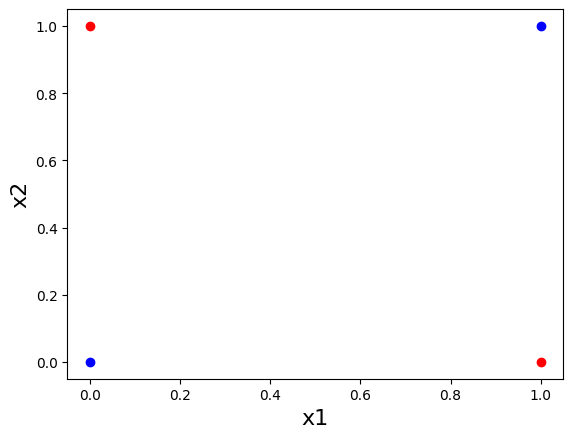

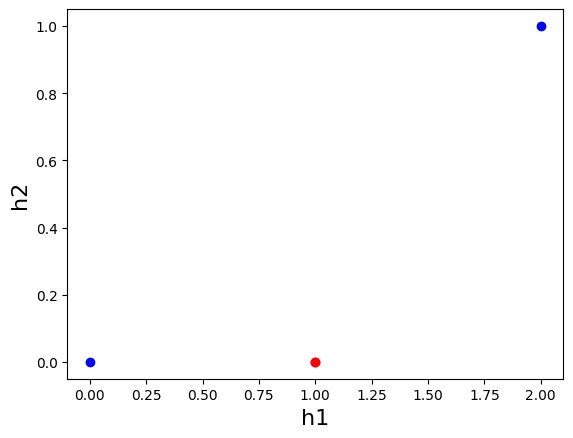

In [9]:
#multi-layer perceptron model used to reproduce the XOR function is given by:
#Yhat = (ReLU(XW))w,
#with one hidden layer containing two hidden units.
#the optimal weights are W =[[0, -1], [1, 1], [1, 1]] and w = [[0], [1], [2]].

import numpy as np 
import matplotlib.pyplot as plt

run = False

if run:
    X = np.array([[0,0], [0,1], [1,0], [1,1]]) 
    X = np.hstack((np.ones(shape=(X.shape[0], 1)), X)) 
    print(X)

    Y = np.array([[0], [1], [1], [0]]) 
    print(Y)

    W = np.array([[0, -1], [1,1], [1,1]], dtype=float) 
    print(W)

    w = np.array([[0], [1], [-2]], dtype=float) 
    print(w)

    h = np.maximum(np.matmul(X, W), 0) 
    h = np.hstack((np.ones(shape=(h.shape[0], 1)), h)) 
    print(h)

    Yhat = np.matmul(h, w) 
    print(Yhat)

    #It is instructive to see how the MLP is able to learn the XOR function
    #by plotting the rep- resentation of data it learns in the hidden space
    id0 = np.where(Y[:, 0] == 0) 
    id1 = np.where(Y[:, 0] == 1)

    plt.figure() 
    plt.scatter(X[id0, 1], X[id0, 2], color='blue') 
    plt.scatter(X[id1, 1], X[id1, 2], color='red') 
    plt.xlabel('x1', fontsize=16) 
    plt.ylabel('x2', fontsize=16) 
    plt.show()

    plt.figure() 
    plt.scatter(h[id0, 1], h[id0, 2], color='blue') 
    plt.scatter(h[id1, 1], h[id1, 2], color='red') 
    plt.xlabel('h1', fontsize=16) 
    plt.ylabel('h2', fontsize=16) 
    plt.show()

#The original data is not linearly separable, but in the representation space
#it has mapped the two points with output 1 into a single point, and this space is now separable

[[0 0]
 [0 1]
 [1 0]
 [1 1]]
[[0]
 [1]
 [1]
 [0]]
0.0
0 0.5523485297294992
100 0.20759268485068139
200 0.11289892843584107
300 0.0014812675618753757
400 3.4251827763134314e-06


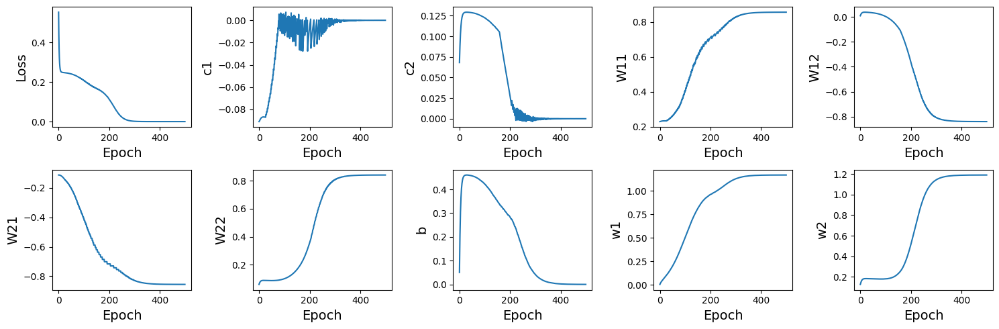

[[ 2.89951162e-06 -5.72659156e-06]
 [ 8.55850924e-01 -8.40680620e-01]
 [-8.55849632e-01  8.40673755e-01]]
[[9.82877968e-05]
 [1.16823513e+00]
 [1.18931798e+00]]
[[1.01675108e-04]
 [9.99919890e-01]
 [9.99936789e-01]
 [1.03184563e-04]]


In [12]:
import numpy as np
import matplotlib.pyplot as plt

#attempt to model the XOR function using a multi-layer perceptron (MLP)
#using backpropagation with simple gradient descent

#the heaviside step function is the derivative of the ReLU function.

run = False

if run:
  np.random.seed(2)

  X = np.array([[0,0], [0,1], [1,0], [1,1]])
  print(X)

  Y = np.array([[0], [1], [1], [0]])
  print(Y)

  #define the MLP model
  class MLP(object):
    def __init__(self):
      """
      Simple MLP with 2 input nodes, 2 hidden nodes and 1 output node
      """
      # Initialise with random weights
      self.weights_1 = 0.1 * np.random.normal(size=(3,2))
      self.weights_2 = 0.1 * np.random.normal(size=(3,1))

    def forward(self, x):
      """
      Forward pass through the network
      """
      if len(x.shape) == 1:
        # Single example, so add a batch dimension of 1
        x = np.expand_dims(x, axis=0)
      # Hidden layer 
      z_1 = np.matmul(np.hstack((np.ones(shape=(x.shape[0], 1)), x)), self.weights_1)
      # Apply ReLU activation function
      a_1 = np.maximum(z_1, 0)
      # Output layer
      z_2 = np.matmul(np.hstack((np.ones(shape=(a_1.shape[0], 1)), a_1)), self.weights_2)
      # Linear activation 
      a_2 = z_2
      return z_1, a_1, z_2, a_2

  #push the true solution through the network and check it gives zero loss

  m = MLP()
  m.weights_1 = np.array([[0, -1], [1,1], [1,1]], dtype=float)
  m.weights_2 = np.array([[0], [1], [-2]], dtype=float)
  z_1, a_1, z_2, a_2 = m.forward(X)
  print(0.25 * np.sum((a_2 - Y)**2))

  num_epochs = 500
  learning_rate = 0.1

  #update the weights and biases using backpropagation

  m = MLP()
  loss_history = []
  weights_1_history = []
  weights_2_history = []

  for epoch in range(num_epochs):
      
    # Do forward pass
    z_1, a_1, z_2, a_2 = m.forward(X)
    loss = 0.25 * np.sum((a_2 - Y)**2)
    loss_history.append(loss)
    if epoch % 100 == 0:
      print(epoch, loss)
      
    # Delta_2 has shape(4, 1), the first dimension being the batch dimension
    delta_2 = 0.5 * ( a_2 - Y)
    g_prime_1 = np.heaviside(z_1, 0)
    
    # Delta_1 has shape (4, 2)
    delta_1 = np.matmul(delta_2, m.weights_2[1:3, :].T) * g_prime_1
    
    # Biases of layers connecting input and hidden layers
    m.weights_1[0, :] -= learning_rate * np.sum(delta_1[:, :], axis=0)
    
    # Weights of layers connecting input and hidden layers 
    m.weights_1[1:3, :] -= learning_rate * np.matmul(X.T, delta_1)
    
    # Biases of layers connecting hidden and output layers
    m.weights_2[0, :] -= learning_rate * np.sum(delta_2[:, :], axis=0)
    
    # Weights of layers connecting hidden and output layers
    m.weights_2[1:3, :] -= learning_rate * np.matmul(a_1.T, delta_2)
    weights_1_history.append(np.copy(m.weights_1))
    weights_2_history.append(np.copy(m.weights_2))
    
  loss_history = np.array(loss_history)
  weights_1_history = np.array(weights_1_history)
  weights_2_history = np.array(weights_2_history)

  #plotting the loss and weights over the epochs
  plt.figure(figsize=(15, 5))
  ax = plt.subplot(2, 5, 1)
  ax.plot(loss_history[:])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('Loss', fontsize=14)
  ax = plt.subplot(2, 5, 2)
  ax.plot(weights_1_history[:,0,0])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('c1', fontsize=14)
  ax = plt.subplot(2, 5, 3)
  ax.plot(weights_1_history[:,0,1])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('c2', fontsize=14)
  ax = plt.subplot(2, 5, 4)
  ax.plot(weights_1_history[:,1,0])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('W11', fontsize=14)
  ax = plt.subplot(2, 5, 5)
  ax.plot(weights_1_history[:,1,1])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('W12', fontsize=14)
  ax = plt.subplot(2, 5, 6)
  ax.plot(weights_1_history[:,2,0])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('W21', fontsize=14)
  ax = plt.subplot(2, 5, 7)
  ax.plot(weights_1_history[:,2,1])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('W22', fontsize=14)
  ax = plt.subplot(2, 5, 8)
  ax.plot(weights_2_history[:,0,0])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('b', fontsize=14)
  ax = plt.subplot(2, 5, 9)
  ax.plot(weights_2_history[:,1,0])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('w1', fontsize=14)
  ax = plt.subplot(2, 5, 10)
  ax.plot(weights_2_history[:,2,0])
  ax.set_xlabel('Epoch', fontsize=14)
  ax.set_ylabel('w2', fontsize=14)
  plt.tight_layout()
  plt.show()

  print(m.weights_1)

  print(m.weights_2)

  z_1, a_1, z_2, a_2 = m.forward(X)
  print(a_2)

#### **Week Starting January 5th:**

*Read sections 1.1 - 1.3:*

##### **Thursday Feburary 8th 10am-11am: SUPERVISOR MEETING**
- Discussed information from sections 1.1 - 1.3 and tested understanding.
- Contexualised this information to galaxy classification.
- Adam looked over our plan draft and gave feedback.
- Introduced us to google colab and how to use it (& why it is useful for machine learning, $$$ GPU)

- Look at tensorflow documentation, quickstart guide & tutorials
- Look at google colab.
- Read up to section of the notes.

##### **11am-1pm PROJECT PARTNER MEETING**
- Finalised project plan, considering recived feeback.
- Submitted project plan.
- Looked at google colab (Emailed Matt Young as we have problems acessing repo through this).
- Set up eDiary.
- Introduced Aroushi to github pushing/pulling changes breifely.

- ### **1 Continued:** 
    - #### **1.4 Deep Learning Frameworks:**
    
        Facilitate building and training neural networks by abstracting the complexity.
        Provides pre-built layers, activation functions, and optimizers.
        Enables automatic differentiation, simplifying the implementation of backpropagation.
        Offers various levels of abstraction, from high-level (easy to use, less flexible) to low-level (complex, more control). For the purpose of this project, we plan to use xyz
    
    - #### **1.5 Optimisation:**
    
        - The learning rate must be optimised to prevent the situations illustrated in Fig x. 
        - Since cost functions can have multiple local and saddle points, we must ensure that in flat directions (small gradients), one would like to take large step sizes to adjust learning rate, and in steep directions, one must take small step sizes. There are various popular optimisation methods.
        
         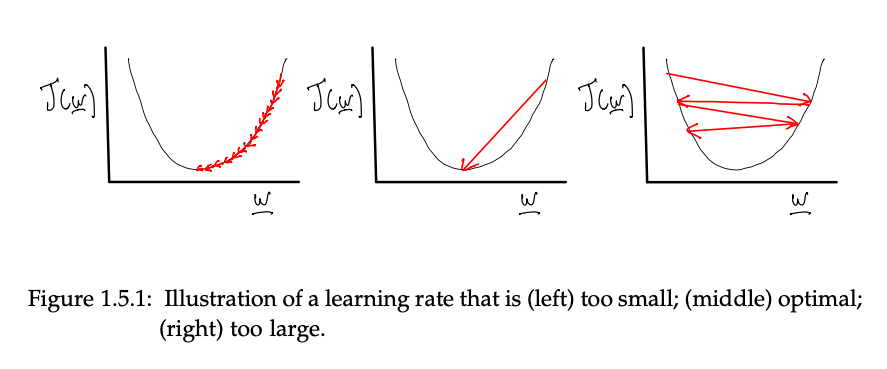 
         
        - ##### **1.5.1 Stochastic Gradient Descent**
        
            Fundamental technique for minimizing the loss function, adjusting weights in the direction of the negative gradient multiplied by the learning rate $\alpha$. It uses gradient values over a mini-batch of $B$ examples such that
            
            $\mathbf{\hat{g}} = \frac{1}{B} \nabla_w \sum_{i}^{B} l(\hat{y}^{(i)}(\theta) , y^{(i)})$
        
        - ##### **1.5.2 Stochastic Gradient Descent with Momentum**
        
            Variation of gradient descent using a subset of data, reducing computation and adding noise that can prevent local minima convergence.
           It accelerates gradients vectors in the right direction, leading to faster converging.
        
        - ##### **1.5.3 RMSprop**
        
            Adjusts the learning rate for each weight based on recent magnitudes of gradients for the weight, which helps in faster convergence.
        
        - ##### **1.5.5 Adam**
        
            Combines momentum and RMSprop, adjusting the learning rate based on first and second moments of the gradients.
            
        - ##### **Comparison**
        
          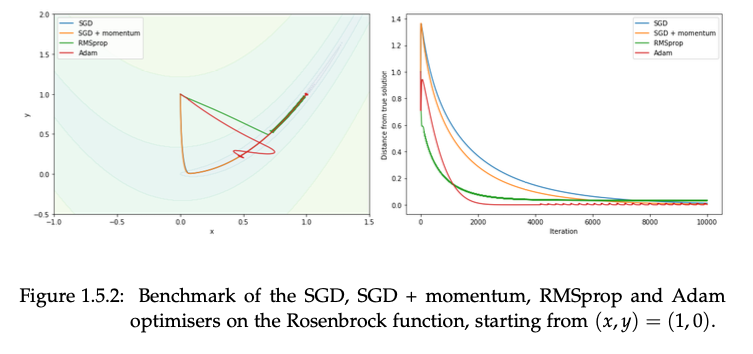

            Fig. X we show the trajectories of each update, along with the distance from the global minimum as a function of iteration. SGD takes the longest to reach the minimum, but the addition of momentum helps move along the flat region more quickly. The adaptive methods work best, and it is noticeable how initially, rather than moving almost vertically, they track towards the minima, as the result of the larger learning rate in the x direction.
        
    - #### **1.6 Initialisation:**
    
        Proper initialization of weights is vital for effective training.
        Poor initialization can lead to vanishing/exploding gradients or slow convergence.
        Strategies include random initialization, Xavier/Glorot initialization, and He initialization.
        
    - #### **1.7 Regularisation:** 
    
        Purpose: Techniques to reduce overfitting, ensuring the model generalizes better to unseen data.
        
        - ##### **1.7.1 Early Stopping**
        
            Stops training as soon as the performance on a validation set starts to deteriorate.
        
        - ##### **1.7.2 L_1/L_2 regularisation**
        
            Adds penalty terms to the loss function proportional to the magnitude of coefficients to encourage simpler models.
            
        - ##### **1.7.3 Dropout**
        
            Randomly sets a fraction of input units to 0 at each update during training time, which helps prevent overfitting.
            
        - ##### **1.7.4 Batch Normalisation**
        
            Standardises the inputs to a layer for each mini-batch, stabilizing the learning process and reducing the number of epochs required to train deep networks.
        
        - ##### **1.7.5 Data Augmentation**
        
            Increases the diversity of data available for training models, without actually collecting new data.

2.10.0
[[0 0]
 [0 1]
 [1 0]
 [1 1]]
[[0]
 [1]
 [1]
 [0]]
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2)                 6         
                                                                 
 dense_1 (Dense)             (None, 1)                 3         
                                                                 
Total params: 9
Trainable params: 9
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
1/1 [==============================] - 1s 641ms/step - loss: 0.6346 - mae: 0.6144 - mse: 0.6346
Epoch 2/300
1/1 [==============================] - 0s 10ms/step - loss: 0.5060 - mae: 0.5278 - mse: 0.5060
Epoch 3/300
1/1 [==============================] - 0s 8ms/step - loss: 0.4371 - mae: 0.4967 - mse: 0.4371
Epoch 4/300
1/1 [==============================] - 0s 5ms/step - loss: 0.3916 

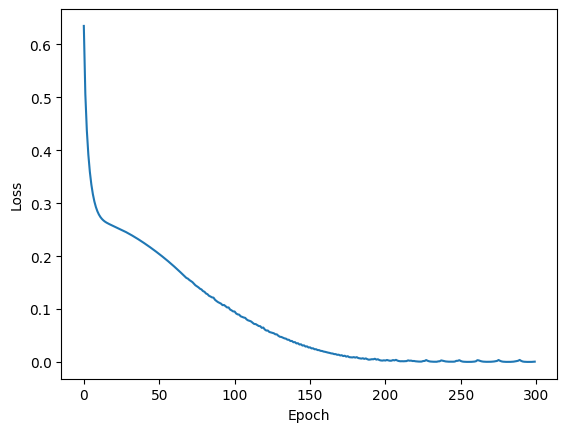

1/1 [==============================] - 0s 75ms/step


In [14]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np

run = False

if run:
    tf.random.set_seed(1)
    print(tf.__version__)

    X = np.array([[0,0], [0,1], [1,0], [1,1]]) #x1, x2
    print(X)

    Y = np.array([[0], [1], [1], [0]]) #XOR gate output
    print(Y)

    def build_model():
        """
        Builds a simple neural network with 2 input nodes, 2 hidden nodes and 1 output node.
        """
        #build the model, define the number of layers, the number of nodes in each layer, the activation function, and the input shape
        model = keras.Sequential([
            layers.Dense(2, activation='relu', input_shape=[X.shape[1]]),
            layers.Dense(1)
        ])

        optimizer = keras.optimizers.RMSprop(0.01) #optimisation algorithm, Root Mean Square Propagation

        #compile the model
        model.compile(loss='mse',
                        optimizer=optimizer,
                        metrics=['mae', 'mse']) 
        
        return model

    model = build_model()
    model.summary()

    num_epochs = 300

    model.fit(X, Y, epochs=num_epochs, verbose=1)

    plt.plot(model.history.history['loss'])
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show()

    model.predict(X)

C:\Users\Ma1a_\AppData\Local\Temp\ipykernel_5328\2609381022.py:58: RuntimeWarning: divide by zero encountered in log
  ax.contourf(xx, yy, np.log(zz), alpha=0.1)


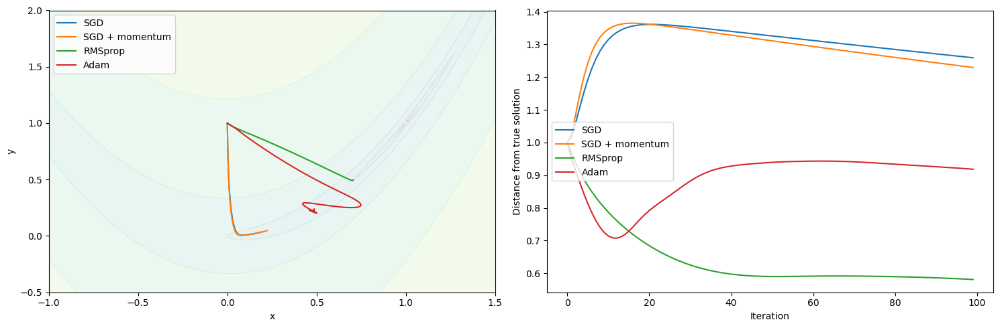

In [15]:
#the rosenbrock function is a non-convex function used for bench-marking optimization methods.
#it is defined as f(x,y) = (1-x)^2 + 100(y-x^2)^2
#and has a global minimum at (x,y) = (1,1)

#benchmark the optimisers included with tensorflow, SGD, SGD with momentum, RMSprop, and Adam
#starting from (x,y) = (0,1).

from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import numpy as np

run = False
if run:

    def rosenbrock(x, y): #rosenbrock function
        return (1 - x)**2 + 100 * (y - x**2)**2

    #benchmark function
    def benchmark(f, opt, iterations, x_init, y_init):
        
        x = tf.Variable(x_init) 
        y = tf.Variable11(y_init) 
        history = []
        
        for i in range(iterations):
            with tf.GradientTape() as tape:
                z = f(x, y)
                
                grads = tape.gradient(z, [x, y])
                history.append([x.numpy(), y.numpy(), grads[0].numpy(), grads[1].numpy()])
                
                processed_grads = [g for g in grads]
                grads_and_vars = zip(processed_grads, [x, y])
                
                opt.apply_gradients(grads_and_vars)
                
        return np.array(history)

    iterations = 100
    x_init = 0.0
    y_init = 1.0

    #benchmark the optimisers
    sgd_history = benchmark(rosenbrock, keras.optimizers.SGD(learning_rate=0.001), iterations, x_init, y_init)
    momentum_history = benchmark(rosenbrock, keras.optimizers.SGD(learning_rate=0.001, nesterov=True, momentum=0.2), iterations, x_init, y_init)
    rmsprop_history = benchmark(rosenbrock, keras.optimizers.RMSprop(learning_rate=0.01), iterations, x_init, y_init)
    adam_history = benchmark(rosenbrock, keras.optimizers.Adam(learning_rate=0.05), iterations, x_init, y_init)
        
    xx, yy = np.mgrid[-1:2:.01, -0.5:2:.01]
    zz = rosenbrock(xx, yy)

    #plotting
    plt.figure(figsize=(15, 5))
    ax = plt.subplot(1, 2, 1)
    ax.contourf(xx, yy, np.log(zz), alpha=0.1)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.plot(sgd_history[:, 0], sgd_history[:, 1], label='SGD')
    ax.plot(momentum_history[:, 0], momentum_history[:, 1], label='SGD + momentum')
    ax.plot(rmsprop_history[:, 0], rmsprop_history[:, 1], label='RMSprop')
    ax.plot(adam_history[:, 0], adam_history[:, 1], label='Adam')
    ax.set_xlim([-1,1.5])
    ax.set_ylim([-0.5,2])
    ax.legend(loc='upper left')
    ax = plt.subplot(1, 2, 2)
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Distance from true solution')
    ax.plot(((sgd_history[:, 0] - 1)**2 + (sgd_history[:, 1] - 1)**2)**0.5, label = 'SGD')
    ax.plot(((momentum_history[:, 0] - 1)**2 + (momentum_history[:, 1] - 1)**2)**0.5, label = 'SGD + momentum')
    ax.plot(((rmsprop_history[:, 0] - 1)**2 + (rmsprop_history[:, 1] - 1)**2)**0.5, label = 'RMSprop')
    ax.plot(((adam_history[:, 0] - 1)**2 + (adam_history[:, 1] - 1)**2)**0.5, label = 'Adam')
    ax.legend()
    plt.tight_layout()
    plt.show()

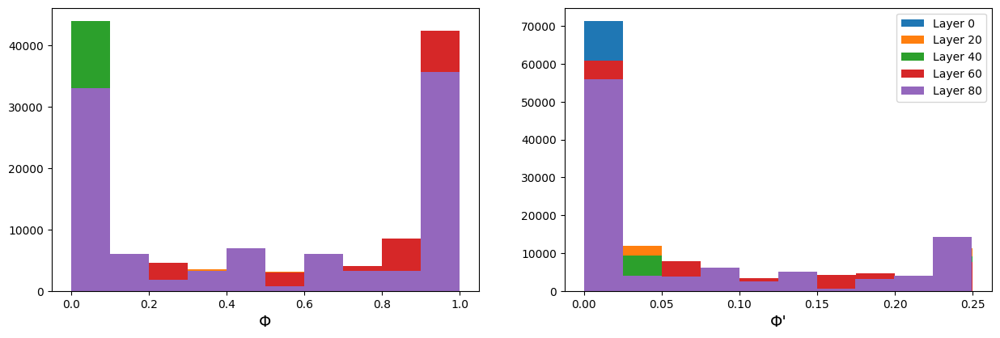

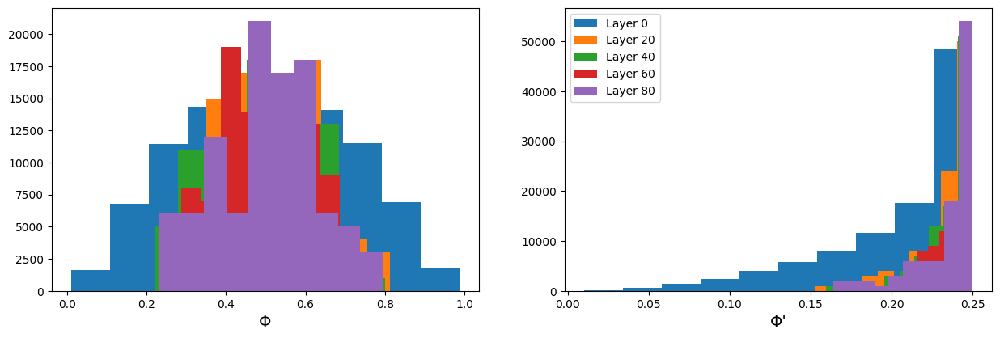

In [16]:
# during backpropagation, it is important that the gradients do not become too large or too small, as
# the alogirthm progresses down to the lower layers of the network. This is known as the vanishing gradients
# or exploding gradients problem. This can be mitigated by using activation functions that do not saturate 
# too quickly, and by using batch normalisation.

# consider a MLP with 100 hidden layers, each with 100 hidde units (with zero bias) and a sigmoid activation function.
# we assume the input data (with dimension 100) and the weights are normally distributed with mean 0 and variance 1.

import numpy as np
import matplotlib.pyplot as plt

run = False

if run:
    np.random.seed(0)

    def sigmoid(x):
        return 1/(1 + np.exp(-x))

    hidden_units = 100

    X = np.random.normal(size=(1000, hidden_units))

    def test_initialisation(X, num_layers, activation, scale): 
        """
        Test the initialisation of the weights and biases for a MLP with 100 hidden layers, 
        each with 100 hidden units (with zero bias) and a sigmoid activation function.
        """
        a = np.copy(X)
        plt.figure(figsize=(15,10))
    
        for i in range(num_layers):
            
            W = np.random.normal(scale=scale, size=(hidden_units, hidden_units)) #initialise the weights to small random values
            z = np.matmul(a, W)
            a = np.copy(activation(z))

            if i % 20 == 0: #plot the activation and its derivative every 20 layers
                
                ax = plt.subplot(2,2,1)
                _ = ax.hist(a.flatten(), label='Layer ' + str(i))
                ax.set_xlabel('Φ', fontsize=14)
                ax = plt.subplot(2,2,2)
                _ = ax.hist(a.flatten() * (1 - a.flatten() ), label='Layer ' + str(i))
                ax.set_xlabel("Φ'", fontsize=14)
                
        plt.legend()
        plt.show()
            
    test_initialisation(X, 100, sigmoid, 1)

    # ideally, we preserve the signal variance as we pass through the network, such that it neither vanishes nor saturates.
    # The variance of the output of a neuron should therefore be equal to the variance of its input. 
    # In order for the variance ot to be preserved, we need to set the variance of the weights to 1/number_of_inputs.
    # During backpropagationm, we would like to preserve the variance of the gradients as well, which can be achieved by setting 
    # the variance of the weights to 1/number_of_outputs, where number_of_outputs is the number outputs from a neuron.

    # a heuristic for balancing both requirements is a weight initialsation of either:
    # W = uniform(-sqrt(6/(n_in + n_out)), sqrt(6/(n_in + n_out)))
    #This is Xavier initialisation.

    #if the weights are drawn from a uniform distribution and the inital weights are drawn from a normal distribution.
    # W = normal(0, sqrt(2/(n_inputs + n_outputs)))
    #This is Glorot initialisation.

    test_initialisation(X, 100, sigmoid, np.sqrt(1 / hidden_units))

#### **Week Starting Febuary 12th:**

*Read sections 1.4 - 1.7.5*

##### **Thursday Febuary 15th 12pm-1pmL SUPERVISOR MEETING**
- looked at basic image classifcation in tensorflow.

- ### 2 Convolutional Neural Networks:

    Convolutional neural networks (CNNs) are a specialized type of neural network designed for processing tensor-like data, such as images. They utilize convolutional layers, where input tensors are convolved with learnable kernels instead of traditional matrix multiplication. The objective of training a CNN is to optimize the weights and biases within these kernels, typically achieved through techniques like backpropagation and gradient descent. CNNs are widely used for tasks such as image classification, object detection, and image segmentation.

    - #### **2.1 History:**

        Before deep learning, image classification relied on feature extraction and data compression, they would look for complex non-linear relationships between the features. Deep supervised neural networks, perform well but are too difficult to train due to the huge number of parameters and non convex loss functions.

        In 1988 neural networks were used on image datasets similar to the MNIST dataset, a handwritten 10-digit recognition problem, it was shown that multi-layered networks in a hierachical manner reduce the number of free parameters and provide significant improvement in the generalisation and peformance of a network.

        This concept was refined and in 1998 LeNet-5, a convolutional network trained with gradient descent back propagation, caused a paradigm shift in machine learning, and deep learning.

    - #### **2.2 Architecture:**

        The architecture of a network is the sequence of layers that it contains.
        Each layer has a different function, and not all layers have trainable parameters.

        - ##### **2.2.1 Convolution**

            Convolution (*) is an operation on 2 functions f(t) and g(t), that produces a new smoothed signal s(t) at time t,

            $$ s(t) = f(t) * g(t) = \int_{-\infty}^{+\infty} f(\tau)g(t - \tau) \,d\tau $$

            - s(t) = feature map
            - f(t) = input 
            - g(t) = kernel filter

            (Convolution does not have to be time specific)

            For signals at discrete intervals we have discrete convolution:

            $$ s(t)  = \sum_{\tau = -\infty}^{\infty} f(\tau)g(t - \tau) $$

            The convolutional layer is the principle layer type in a CNN.
            Whilst time series data is most commonly a 1D problem, image data is a 2D problem.

            In a 2D discrete convolution layer, the input (**I**) is a feature map of size $$ I_x \times I_y \times I_z $$
            
            For an RGB image the feature map can be represented as a tensor, a 2D matrix where each element of the matrix is a vector containing the RGB values of a pixel (overall a 3D matrix).

            A Kernel (**K**) of size $$ K_x \times K_y \times I_z \times N $$ is applied to the input tensor (**I**) where N is the number of filters, and produces an output feature map (**O**) of size $$ O_x \times O_y \times O_z $$

            The output of a fully connected neural network node is,

            $$ \hat{y} = \phi \sum_{i} w_i x_i + b $$

            where x is the input, w are the multiplicative weights, b is the additive bias, and Φ is the activation function.

            The 2D discrete convolutional layer is given by

            $$ \hat{Y} = \phi \sum_{}^{} \underline{I} * \underline{K} + \vec{b} $$

            $$ \vec{b} $$ 
            is the bias, which is a vector of length: $$ O_z $$ i.e a scalar value additive bias is applied to every pixel for each output channel.

            For stride one and no pading, the convolutional part is
            
            $$ \underline{O}_{i,j,k} = (\underline{I} * \underline{K})(i,j,k) $$
            $$ = \sum_{l,m,n}^{} \underline{K}_{l,m,k,n} \cdot \underline{I}_{i+l-1,j+m-1,n} $$

            The convolution of the kernel is applied at each position of the image. Each kernel element is multiplied bu the overlapping image values and summed.

            For a N x N x 1 image matrix, it can be reshaped into a column vector of size (N x N) x 1.

            and the kernel can be unrolled into a convolutional matrix of size

            $$ (I_x - K_x + 1)(I_y - K_y + 1) \times (I_x I_y)$$

            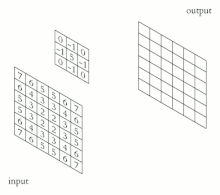
            
            *Animation of Discrete 2D Convolution*
            
            The values in the kernel are unknown parameters and are determined during the training of the network.

            The total number of parameters in a convolutional layer is

            $$ N_{param} = (K_x \times K_y \times O_z + 1) \times I_z $$

            The + 1 is due to the biases.

            Convolutional layers have 4 hyperparameters which control the output volume of each layer that must be defined. These are the kernel size, number of fiters, padding, and stride.
            
        - ##### **2.2.2 Kernel size**

            Kenel size is also called the receptive field.

            Most images have 3 channels (Red, Green, Blue) and the number of channels increases with the depth of the network. In the case of Inception moduels (section 2.5) where parallel feature maps are concatenated together, the number of channels can increase rapidly.

            For multi-channel inputs, a kernel with the same number of channels is applied and the resulting feature maps are summed together before the bias is applied to produce the output feature map.

            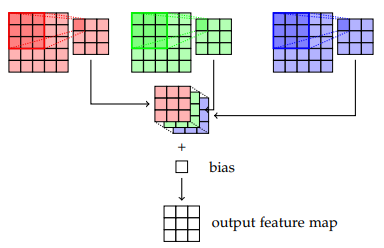

            *2D Convolution for multi-channel inputs, the resulting feature maps are summed to give a single channel map and a bias is added to produce a single channel output feature map*

            The number of filters determines the number of channels of the output (feature map), and the depth of the filter must always be the same as the number of input channels.

            Each filter is looking for different features within the image.
            Each of the feature maps have their own bias applied, and these are then concatenated together to output a feature map with the same number of channels are the number of filters.

            ##### Padding:

            Due to the way convolution is applied, the size of the input image will very quickly shrink after a series of convoloutions -> loss of information.

            The pixels at the edges of each input feature are convolved with the kernel less frequently than the inner pixels.

            This can be solved with padding, a margin is added around the input image. Typically this is filled with zeroes (zero padding).

            Half padding or same padding is when the padding value is

            $$ P = (K - 1) / 2 $$

            This results in an output image of the same dimensions as the input image.

            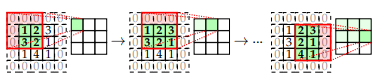
            
            *Convolution of a 3x3 input with same padding applied with a 3x3 kernel to output a 3x3 output feature map.*

            Full padding occurs when the padding value is 

            $$ P = K - 1 $$

            This ensures that every possible convolution of the kernel with the input is taken into account equally.

            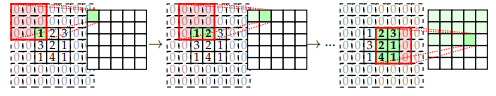

            *Convolution of a 3x3 input with sfull padding applied with a 3x3 kernel to output a 5x5 output feature map.*

            Any other value of passing can be used and it does not have to be symmetric to any of the 4 corners (bottom left, bottom right, top left, top right).

            Valid padding refers to no padding being applied to the input image.

            ##### Stride:

            The stride determines how many pixels each kernel moves across the input before it is applied.

            The output of a fully connected layer used in traditional neural networks is independent of input size, this is not the case for convolutional layers. The output is dependent on the input size, but also the stride, padding, and kernel size.

            The output of the convolutional layer is a matrix of size

            $$ W_2 \times H_2 \times D_2 $$

            pixels, where:

            $$ O_x = (I_x - K + 2P)/S + 1 $$
            $$ O_y = (I_y - K + 2P)/S + 1 $$
            $$ O_z = N $$

            Where N is the number of filters, P is the padding, S is the stride, and K is the kernel size.
            These equations also apply to pooling layers, where by default P = 0 .

            NOTE: For S > 1, If (I - K + 2P) % S = 0 . Then the output size will always be the same regardless of the input size. The number of parameters in the network is therefore independent of the input image size, and only dependent on the size and number of filters.

            ##### Activation:

            After convolving the image with the filters, a bias value is added and an activation function is applied elementwise for the aggregation of information.

            The most common activation function used in CNNs is the rectified linear unit (ReLU).
            It is common because its derivative is simple and therefore fast to compute.

            Activation functions add non-linearity to the network and are typically applied after each convolutional layer since convolution is a linear operation.

        - ##### **2.2.3 Pooling**

            Pooling is used to down sample, to reduce the dimensionality of the input and thus reducing the number of free parameters in the network.

            Pooling helps with the invariance of the network to small shifts and transformations in the data.

            The Pooling layer has no trainable parameters but the kernel size, stride, and padding must be defined.

            There are many different kinds of pooling layers, the max pooling layer has a max pool kernel, which maps the largest value of the input within the kernel to the output for each stride. The average pool layer similary returns the mean value of the input within the kernel.

            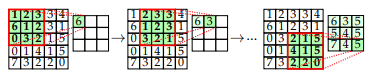

            *Max pool operation where a 5x5 input is convolved with a 3x3 max pool kernel that returns the maximum value in regions of size 3x3 in the image.*

        - ##### **2.2.4 Fully connected**

            The convolutional and pooling layers can be thought of as feature extractors. They enchance the relevant features or absence of features.

            The fully connected (or dense) layers aggregate together this information across the final feature maps. In this layer every input element has its own weight to map it to the output layer.

            They are typically the last layer that provides the results of final classification.

            The fully connected layer takes 2 hyperparameters - the number of nodes, which is typically the same as the number of classes (C), and the activation function.

            If the layer is used as a classification then usually this will be the softmax function:

            $$ S(x_i) = \frac{exp(x_i)}{\sum_{j}^{C} exp(x_j)} $$

            To ensure the sum of scores over all classes is normalised, since the softmax is a discrete probability distribution. The derivative of the softmax is then,

            $$ \frac{\delta S(x_i)}{\delta x_j} = 
            \begin{cases} 
                \ S(x_i)(1 - S(x_j)), & \text{if }  i = j \\
                - S(x_i)S(x_j),      & \text{otherwise} 
            \end{cases}$$

            NOTE: softmax can be numerically unstable for large values of x, since the exponential of a large number is astronomically large. Therefore we rescale the data first, often the largest value of x is subtracted from each element of x such that the largest value of the data is 1.

    - #### **2.3 Other layers:**

        - ##### **2.3.1 Batch normalisation**

            In CNNs, after each layer the values of the elements in the feature maps can grown very quickly.
            This can cause issues for the convergence of weights because the parameter search can be very large and thus slow.

            CNNs are therefore restricted to a slow learning rate values and can be sensitive to the initialisation of weights.

            Batch Normalisation improves the efficiency and performance of CNNs.

            $$ \hat{x}_i = \frac{x_i - {\mu}_x}{\sqrt{{\sigma}^{2}_x + \epsilon}}$$

            $$ \text {Where, } {\mu}_x \text{ is the mean of } x \text{ and }{\sigma}^{2}_x \text{ is its variance. } \epsilon \text{ is a small arbitary constant added for numerical stability.} $$

            The layer renormalises the input such that it has a mean of 0 and a variance of 1 when 
            $$ \epsilon = 0 $$

            $$ \text{This changes the representation of the layer so an additional scale } (\gamma) \text{ and shift } (\beta) $$ 
            
            parameters are introduced to restore the representation of the layer and these parameters are learned during training.

            $$ y = \gamma \hat{x}_i + \beta $$

            In the cases of stochastic and batch gradient descent, batch norm can be applied on mini-batches.
            They are applied after the activation function.

            Batch norm improves effficiency and introduces noise into the network which helps to regularise the network.

            Batch norm should be used instead of dropout (section 2.2.4).

        - ##### **2.3.2 Pointwise convolution**

            Since the number of  channels quickly increases with the depth of the network, so does the number of parameters and consequently the computational complexity increases.

            So we haave to reduce the number of parameters in the layers, however pooling only reduces the dimensionality in the width and height.

            $$ \text{Pointwise convolutions are } 1 x 1 x I_z \text{ kernel filters.} $$ 
            $$\text{Where } I_z \text{ are the number of input channels.} $$

            The number of pointwise filters applied will give the same number of output channels in this layer. Pointwise convolution can be used to reduce or inncrease the depth of the input, and thus reduce or increase it's dimensionality.

            Or they can be used to increase the non-linearity of the layers.

            Sometimes described as a cross channel pooling filter.

            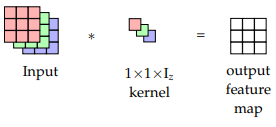

            *Pointwise convolution of a 3x3x3 input with a 1x1x3 kernel. The number of kernels determines the number of output channels.*

        - ##### **2.3.3 Depthwise convolution**

            In depthwise convolution, each channel of the multi-channel input is convolved with the respective channel of the filter as per the standard multi-channel convolution, however the output features are not summed together but instead are concatenated.

            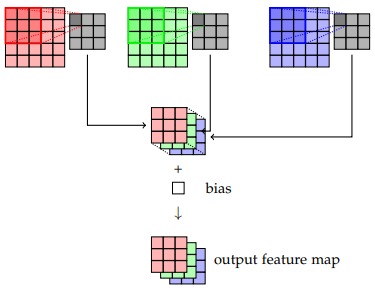
                
            *Depthwise convolution. A 5x5x3 input is convolved with a single 3x3 kernel.*

            This operation specifically uses only 1 filter. Section 2.5 covers the use of this operation for dimensionality reduction.

        - ##### **2.3.4 Dilated convolution**

            Dilated convolution is where the kernel is applied with padding between kernel values.
            This layer can be used to integrate information from different spatial scales, balancing between high accuracies on the pixel lvel whilst also inferring information from the global context. i.e., super resolution and denoisinng problems.

        - ##### **2.3.5 Locally connected layer**

            The locally connected layer is a cross between a standard convolutional layer and a fully connected layer.
            In a fully connected layer each input pixel has its ownn weights andn biases connecting it to each output pixel and therefore the number of parameters is very high.

            For a 5x5 input the number of parameters is 5x5+1 = 26 (+1 for the bias).

            In convolutional layers, local regions share the weights of the filter kernel, significantly reducing the number of parameters. The same 5x5 input using a 3x3 kernel would only have 3x3+1 parameters (+1 for the bias).
            
            Locally connected layers have a median number of parameters, like a convolutional layer its looking for specific features and therefore uses a small kernel with weights, but these weights are not shared over all regions of the image and instead focus on specific regions.

            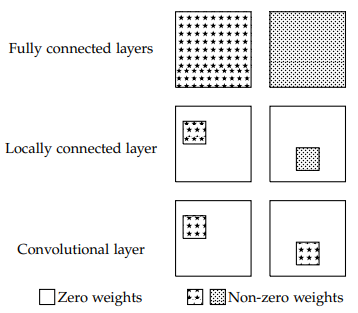

            *A visual comparison of fully connected layers, locally connected layers, and convolutional layers.*
            - *In fully connected layers all elements of the input have their own weights and biases*
            - *In convolutional layers, weights and biases are shared across local regions of the size of the kernel, and the kernel is applied across the entire input*
            - *In locally connected layers the kernel is only applied over a small region of the input and there is no weight and bias sharing*

            This layer is useful for when classifying objects with known locations of features, i.e., when classifying humans based on portrait images, the nose is always at the centre of the image and thus the kernels responsible for picking out this feature will only be applie to the centre of the image.

        - ##### **2.3.6 Up sampling**

            CCNs are not limited to classification problems, you for example may want to keep the dimensions of the network output the same or larger than the input dimensions. For this up sampling of layers is required.

            ##### Transposed Convolution:

            Transposed convolution is an up sampling layer. It takes an input and returns a spatially larger output.

            It is sometimes known as a deconvolution layer (IT IS NOT THE DECOVOLUTION OPERATION - THE INVERSE OF A CONVOLUTION OPERATION)

            The transpose of the convolutional matrix that represents the kernel filter is multiplied by the unrolled input matrix to produce an output matrix with higher dimensions than the input.

            With the same padding, the output size of the convolution layer is the I x S, and with vald padding, the output size is (I- 1)S + K.

            Images created using transposed convolution can leave a checkerboard like artefact caused by the uneven overlapping of the mapping from the input to the output at each kernel operation. This occurs when the kernel size is non-divisible by the stride. Trying to avoid such choices of hyperparmaters in these layers can help reduce this effect, but they generally cannot completely mitigate the problem since CNNs use multiple layers of transpose convolution futher complicating the effect.

            ##### Resize-convolution:

            An alternative method that avoids the checkerboard artefacts.

            This involves first upsampling the input feature map using an interpolation method such as Bi-linear interpolation or nearest neightbour interpolation and then applying a normal convolutional layer.

    - #### **2.4 Reguarisation:**

        In deep learning there are many more parameters than a standard neural network so you are more likely to overfit to your training data if the training data set is small.

        One way to improve the generalisability of a model is to increase the size of the training dataset.
        
        - ##### **2.4.1 Augmentation**

            Augmentation is the process of increasing the size of your training dataset by applying transformations to the already existing training data. 
            
            This could be:
            - cropping an image
            - changing the brightness or contrast
            - rescaling and translation 
            - rotation and mirroring

            It might be tempting to use all the possible augmentation to maximise the training data size, however, not all the transformatios will have impactful gains on the perfomance of the network and many significantly increase training time.

            The types of transformations chosen should be carefully considered within the context of the problem.
            Horizontally flipping an image for detecting car lanes would be a good idea, however the same transformation on handwriting images, i.e. distinguishing the letter 'b' from 'd', would only confuse the network.

        - ##### **2.4.2 Dropout**

            You can prevent over fitting on small datasets by training multiple different architectures on a dataset and take the average.

            This is known as ensemble learning methods.

            These methods are computationally expensive, and memory intensive to store the networks.

            The dropout method can be used instead.
            Here random nodes in the model are randomly ignored according to a set probability during the training.
            This simulates having a large number of different architectures. 
            
            Having dropout in a layer means the activation to the layer is sparse and allows the network to learn a sparse represenntation.

            Dropout is commonly used in deep networks, however dropout in a fully connected layer is not the same as dropout in a convolutional layer. After a convolutional layer, dropout can be seen as adding noise to the network and therefore it is perferable to use batch normalisation instead.

    - #### **2.5 Architectures:**

        Architecture refers to the layout of different neurons, layers and activation functions. Typically it is designed through trial and error, although there are some proven techniques.

        Convolutional networks are powerful however they do not work well unless the data reflects the real world.
        Imagenet is a compilation of 14 million everyday objects categorised into over 200,000 classes with hand made bounding boxes.

        Imagenet allowed for the development of multipurpose architectures.
        Most notably Alexnet.

        ##### Alexnet:

        LeNet-5 had 5 layers; 3 convolutional and 2 fully connected layers, giving it around 60,000 parameters.
        Alexnet has 5 convolutional layers and 3 fully connected layers, giving it around 60 million parameters.
        Alexnet was the first deep convolutional neural network. 

        CNNs were limited depthwise due to the lack of computational power which limited their perfomance however Alexnet was one of the first networks to use GPU hardware acceleration, the Alexnet architecture is designed for use with 2 GPUs. It's record breaking performace was due to the training on the huge Imagenet dataset, along with the use of reguarisation techniques, like data augmentation and dropout. Along with the use of the RELU activation function which significantly improved training efficiency. Despite this the network still almost took a week to train.

        ##### MobileNet:

        The design of architectures is a trade off between efficiency and accuracy. A big, complex network may be more accurate, howerever it will have a large number of parameters and be slow to train.

        MobileNet is designed to be a small and low latency architecture, such that training can be performed on mobile devices.

        The main concept behind the architecture is that the standard convolutional filter is computationally expensive. For layers where there is more than 1 filter being used, the standard convolutional layer is replaced with 2 layers; a depthwise convolution followed by a pointwise convolution with the same depth as the number of filters required when using the standard convolutional layer. 

        This is the depthwise separable filter.

        It recuces the number of parameters in the layer but also the number of multiplication operations and hence the speed.

        MobileNet uses a series of 3x3 depthwise separable filters for a factor of 8 increase over conventional convolutional layers.

        ##### VGGNet:

        VGGNet demonstrated that two 3x3 convolutional layers is equivalent to a 5x5 receptive field and thus able to capture larger features whilst maintaining a small number of parameters to train for.

        This is why 3x3 kernels are commonly used in CNNs. As they reduce the complexity of the network but allow for deep architectures that save on memory and power and are more generalisable. 

        ##### Inception:

        Whilst previous architectures used linearly stacked convolutional layers, Inception uses an inception module.

        The main concept behind the inception module is to apply different sized filters in parallel and then concatenate them together. In Inception v1, the inception module was essentially a 1x1, a 3x3 and a 5x5 filter.

        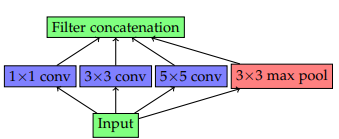

        *The naive Inception cell contains various sized filters in parallel. The full Inception cell also contians various pointwise convolutions to obtain consistnent dimensions*

        This allows for learning on multiple scales. i.e., classifying the same objects but of different sizes.

        ##### Resnet:

        An ultradeep CNN with 152 layers. Given that the best human top 5 error on the Imagenet dataset is 5%, Resnet supassed humans with a 3.6% top 5 error.

        Naively, it may appear that simply increasing the depth of a network can improve testing accuracies, however the authors show this is not the case.

        The main feature of Renset is the use of a residual cell.

        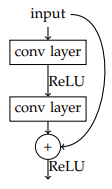

        *Residual cell use in Resnet consists of a convolutional-ReLU convolution before the output is summed with the input and another ReLU is applied.*

        The residual net cell consists of the operations of a convolutional layer, followed by ReLU activation, followed by convolution. The output of this is then summed with the input before another ReLU activation is applied.

        If a traditional convolutional layer takes an input x and ouputs s(x), the residual cell instead outputs s(x) + x. 

        The cell is computing the residual changes to the input image, which is easier to optimise than the traditional convolutional layer.

        ##### Region based-CNNs:

        Are CNNs designed specifically for object detection. The problem is no longer simply classificaton, but also localisation of objects. The input to an R-CNN would be an image, and the output would be a vector containing the class of object, classification score and coordinates for a bounding box around the object of interest.

        R-CNNNs do this by splitting the problem into two networks.

        The first extracts region proposals from the image using a selective search to generate thousands of regions in the image where there is a high probability of a positive detection. These propoals are then resized to a common size for input into the second part of R-CNNs.

        A CNN that extracts the features in the proposed regions. Here the output vector enters a linear SVM and bounding box regressor to train for the classification and bounding box coordinates.

    - #### **2.6 Applications:**
        
        CNNs typically refer to 2D convolution, such as images. However CCNs are not exclusive to image classification. They can be applied to 1D data such as audio or other time series data, they can be applied to 3D data such as videos.

        For 1D data CNNs are searching from fixed-length features, irrespective of the location.

        - ##### **2.6.1 Image recognition**

            Image recognition is the term to descibe computer vision tasks for identifying objects in images.
            It can be divided into 4 main categories:

            ##### 1. Classification:

            Here the task is to predict the class that features in an image. i.e., an image may contain a cat, and the task could be to predictr the breed of the cat.

            ##### 2. Localisation:

            In image classification, you typically have only one object in the image, and although you may have more, the object types will be the same.

            Sometimes you may not be interested in the object itself but instead where they are located in the image.

            Image localisation using CNNs works exactly the same way as classification but instead of returning a score for a given class, we CNN returns 8 numbers to describe the location of the object, this could be the 4 coordinates of the bounding box of the object.

            $$ ( \underline{C}_{i,j} ) $$

            or more typically the width, height and centre coordinate of the box.

            $$ \text{The loss function could be the L2 loss, equivalent to the euclidean} $$
            $$ \text{ distance between the true coordinates and the predicted } \underline{\hat{C}}_{i,j} $$

            $$ l = \sum_{i = 1}^{2} \sum_{j = 1}^{2} ||\underline{C}_{i,j} - \underline{\hat{C}}_{i,j}||_{2} $$

            $$\text{where } ||x||_{2} \text{ is the L2 norm.}$$

            ##### 3. Detection:

            For images wherein exists multiple objects of different classes, image detection can be used to both localise objects and classify them. Object detection is a combination of image classification and localisation.

            The output of the network would be the bounding box parameters for the detected objects amd their classification scores.

            One way to to this would to use sliding boxes of various scales to apply a classical CNN for image classification each patch of the input image, this however is extremely inefficient and the choice of box scale and aspect ratio needs to be determined.

            Architectures like R-CNN were developed to obtain a more principled delection of boxes to apply the standard CNN, using selective search to propose regions of interset, a CNN to classify and then regression to optimise.

            The variations on R-CNN such as as fast RCNN and faster RCNN, split the tasks of classification and localisation.

            These methods do not process the entire image at once, instead they look at high resolution patches.

            The selective search algorithm can be very slow - thousands of forward passes through the CNN are required for each proposal region. So R-CNN architectures are not ideal for real time processing.

            Single shot detectors SSDs use a single CNN architecture to obtain both bounding box parameters and object class. In an SSd, convolutional layers are first applied to reduce the dimensionality of the input.

            The input is split into a grid of cells and at each cell, anchors (predefined initial guesses of the box) are then used to make detections.

            These types of models use low resolution images to make the detection, they are very fast but trade off accuracy. They are more adapted to real time processing for this reason.

            The performance on low resolution images is scale dependent, affecting the detection of small scale objects.

            ##### 4. Segmentation:

            In segmentation, objects are classified on a pixel-by-pixel basis. This is desired if you have multiple overlapping objects or prehaps are interested in the outlines of objects.

            Image segmentation can be split into two different categories:

            - Semantic Segmentation:
                Classifies each pixel of an input to identify the object class it belongs to. Using a sliding box CNN approach to classify every pixel would be possible but very inefficient. Fully convolutional layers are commonly used for image segmentation. They use a combinatiopn of downsampling (e.g. convolution) and upsampling (transpose convolution) layers to produce an output wth the same size as the input image.
            - Instance Segmentation:
                Classifies each pixel of an input to identify the object instance it belongs to. For example a litter of puppies segmented using semantic segmentation would produce a single segment for all the puppies, but instance segmentation provides segments for each individual puppy.

                Instance segmentation is a combination of semantic segmentation and object detection.

                Mask-RCNN is a popular architecture for instance segmentation, it is based on Faster R-CNN.
                In addition to the object class scoe, and bounding box, the output of the CNN will also be an image mask to represent the segmentation.

                The image mask is produced by taking into account each region of intrest separately.

            Applications of image segmentation are: facial recognition, medical imaging, and autonomous driving.

        - ##### **2.6.2 Image enhancement**

            Fully convolutional networks are used in image enhancement and restoration problems including:
            - denoising
            - deblurring
            - artefact removal
            - super resolution (taking a low resolution image and transforming it to a high resolution output)

    - #### **2.7 Model Evaluation:**

        During training, the loss if often the metric that is used to monitor how the model is performing as a function of training time.

        Simultanesouly monitoring both the loss of the training dataset and the validation data, can tell you if the model is performing as it should (i.e. dropping loss), if it's underfitting (i.e. dropping validation loss) or if it's overfitting (i.e. increasing validation loss).

        However, the loss cannot tell you how well the model is performing. The value of the loss is relative and depends on the loss function used.

        Other metrics are required to describe the performance of a network and enable comparison between other models.

        - ##### **2.7.1 Confusion Matrix**

            For CNNs classification is the most common task.
            For binary classification, i.e. if an image is of a galaxy or not a galaxy, we can log the classifications of a network on a test data set in a confusion matrix.

            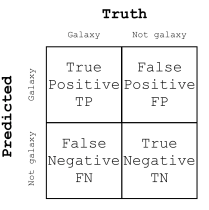

            *Confusion Matrix of a binary classification model, the matix values are filled with the numbers from the model prediction.*

            - True positives TP are the number of images correctly classified as being a galaxy
            - True Negatives TN are the number of images correctly classified as not being a galaxy
            - False Positives FP are the number of non-galaxy images incorrectly classified as a galaxy.
            - False Negatives FN are the number of galaxy images incorretly classified as not being a galaxy.

            The sum of the columns tell you the total number of galaxies P and non-galaxies N.

            This matrix can be extended for multi-class classification by extending the number of rows and columns to represent each class.

            The confusion matrix can be used to spot biases in the model.

        - ##### **2.7.2 Accuracy**

            The accuracy of a model is given by

            $$ ACC = \frac{TP + TN}{P + N}$$

            The accuracy in general is a good metric to use for classification since it tells us with a single number how well the networks performs on a scale of 0-1.

            However it is not a good metric if the data classes are unbalanced. Accuracy favours the larger class. i.e., if there were 9 non-galaxies and 1 galaxy, if the model predicts all objects as non-galaxies, it would still get a 90% accuracy, even though it is a terrible galaxy classifier. 

        - ##### **2.7.3 Precision, Recall, and F1 score**

            - Precision tells us the purity of the predictions,

            $$ PRE = \frac{TP}{TP + FP} $$

            - Recall tells us the completeness of the predictions,

            $$ REC = \frac{TP}{TP + FN} $$

            Precision is more important where you need predictions free of contaminants. e.g. supernoca lightcurves, you wouldn't want a variable star to contaminate the signal.

            Recall is more important where you need to know even if there is a slight possibility, e.g. cancer detection.

            - The F1 Score is a mid point between being pure and complete,

            $$ F1 = 2\frac{PRE \times REC}{PRE + REC}$$

        - ##### **2.7.4 Multiclass metrics**

            For multiple classes, the above metrics can be calculated as a micro-average to give equal weights to each individual classification, e.g.

            $$ PRE_{mic} = \frac{TP_1 + TP_2 + ...}{TP_1 + TP_2 + ... + FP_1 + FP_2 + ...} $$

            This metric is biased towards large classes, therefore the macro-average is more preferable and give equal weight to each class, e.g.,

            $$ PRE_{mac} = \frac{PRE_1 + PRE_2 + ... + PRE_K}{K}$$

            where K is the number of classes.

        - ##### **2.7.5 ROC curve and AUC**

            The receiver operating characteristic (ROC) curve is a common visual used to show the performance of a classification network, it plots the true positive rate (TPR) which is the recall, against the false positive rate (FPR),

            $$ FPR = \frac{FP}{FP + TN} $$

            for different threshold values of positive prediction.

            The area under the ROC curve (AUC) summaries the ROC into a single metric between 0 and 1.

            $$ \int_{x = 0}^{1} TPR(TPR^{-1}(x))\, dx $$

            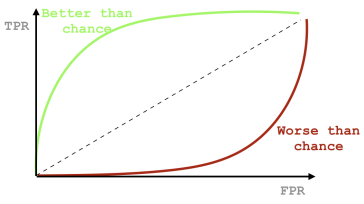

            *ROC curve. The dashed line is if the model perfomance is equal to chance. The green line is for a network performing better than chance, and the red line is for a network performing worse than chance.*

        - ##### **2.7.6 IoU and mAP**

            A common metric for interpreting the perfomance of a localisation model is the intersection over union (IoU) score, which measures the area of overlap between the true bounding box A and the predicted box B.

            $$ IoU(A,B) = \frac{A \cap B}{A \cup B}$$

            The IoU score scales from 0-1 and higher values are better.

            The average precision, given as the area under the precision-recall curve for various threshold value sof IoU scores is another common metric, and for multiple classes the mean average precision (mAP) can be used - the mean average precison over each class.

            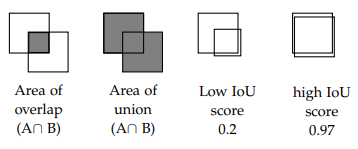

            *IoU is a metric used to quantify accuracy in image localisation tasks. Taking into account the area of overlap and the area of union.*

    - #### **2.8 Sparse Coding:**
        
        In deep learning, we are working in the domain of big data, the data may be very different, but the data contains structure. The purpose in machine learning is to exploit the structure in data. In general reliable models tend to be simple ones. Sparse representation is already a popular concept for priors in the signal processing community.

        Sparse coding is an unsupervised learning method to learn a set of bases that can more efficiently represent data.

        It reduces the complexity of neural networks with minimal decrease in performance.

        $$\text{ In image processing each small patch in an image, } (\underline{X}) \text{ has a sparse representation} \underline{\alpha}. $$
        $$\text{With respect to a common dictionary } \underline{D} \text{ such that,} $$

        $$ \underline{X} = \underline{D} \underline{\alpha} $$

        $$ \underline{D}\ \text{ and } \underline{\alpha} \text{ are redundant matrices,}$$

        since typically their combined dimensions are larger than the input.

        $$ \text{The nature of the sparse matrix } \underline{\alpha} \text{ can lead to increased efficency in CNNs.} $$

        $$ \text {When} \underline{X} \text{ and } \underline{D} \text{are known, } \underline{\alpha} \text{ can take on many different solutions.}$$

        $$ \text {We require } \underline{\alpha} \text{ to take on the sparset solution - that is containing the least non-zero values.}$$ 

        $$ min||\alpha||_0 \text{ s.t. } \underline{X} = \underline{D} \underline{\alpha}, $$

        $$ \text{Where } ||\alpha||_2 \text{ is the L2 norm of } \alpha \text{ and } \epsilon \text{ is the noise.}$$
        Both these equations are NP-hard - their computational cost to solve increases exponentially with the number of elements in the dictionary. 

        This problem of element decomposition can be solved using approximation algorithms.
        There are two main approaches, greedy methods - such as orthogonal matching pursuit (OMP) gradually introduces non-zeros to the sprase representation to solve:

        $$ min||\alpha||_0 \text{ s.t. } \underline{X} = \underline{D} \underline{\alpha}, $$

        $$ \text{and stops when the error falls below } \epsilon $$

        and relaxation methods such as basis pursuit (BP) relaxes the L0-norm into a L1-norm which is easier to solve for.

        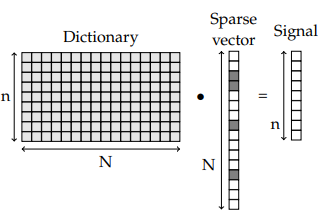

        *Any image can be approximated as a linear combination of basis images, it therefore can be represented as the dot product between a dictionary of bases and a sparse matrix. There are N columns in the dictionary each representing a small image patch of size n, the matrix multiplication with the size N sparse vector produces a signal with the same size as each column.*
        
        - ##### **2.8.1 Multi-layered convolutional sparse coding**

            $$ \text{Larger images } (\underline{X}) \text{ can be writtern as the sum of N filters } (\underline{K}) $$
            $$ \text{convolved with their sparse representations, where } \Gamma_{i} \text{is a feature map that} $$
            holds the sparse representation of the ith filter.

            $$ \underline{X} = \sum_{i = 1}{N} \underline{K}_{i} * \Gamma_{i} $$

            For the first layer in a CNN the input signal X of size I can be written in terms of the
            convolutional dictionary 
            $$ D_1 \text{ with dimensions } I \times IN_1 \text{ and the locally sparse representation of } $$
            $$ \Gamma_{1} \text{ of size } IN_1, \underline{X} = \underline{D}_{1} \underline{\Gamma}_{1}$$
            where locally sparse refers to the constraint:

            $$ ||\underline{\Gamma}_{1}||_{0} \le N_1(2n_0 -1),$$

            $$ \text{ with, } N_1 \text{ ,fitlers in the first layer of length, } n_0 $$
            In the 2nd convolutional layer, the input is the sparse representation of layer 1, and this too can represented in the form of

            $$ \underline{\Gamma}_{1} = \underline{D}_{2} \underline{\Gamma}_{2} $$

            $$ \underline{D}_2 \text{ has dimensions, } IN_1 \times IN_2 \text{ and } \underline{\Gamma}_2 \text{ has dimensions } IN_2 . $$
            $$ \underline{\Gamma}_2 \text{ is subject to the sparsity constraint of: }$$
            $$ ||\underline{\Gamma}_2||_0 \le N_2(2n_1N_1 - 1),$$
            $$\text{where } N_2 \text{ is the number of filters in the 2nd layer and } n_1 \text{ are their lengths.}$$
            
            This structure is cascaded through the layers of the CNN.

            A M-layered sparse convolutional neural network can be written as:

            $$ \underline{X} = \underline{D}_1 \underline{D}_2 ... \underline{D}_M \underline{\Gamma}_M \text{ or } \underline{X} = \underline{D}_{eff} \underline{\Gamma}_M $$
            $$ \text{where the effective dictionary } \underline{D}_{eff} \text{ is a chain of each layer's dictionary.} $$
            
        - ##### **2.8.2 Comparison to classic CNN**

            The sparse vector in the first layer has solution:

            $$ min||\underline{\Gamma}_{1}||_0 \text{ s.t } \underline{\hat{X}} = \underline{D}_1 \underline{\Gamma}_1 + \underline{E} $$

            where E is the noise. This can be described as solving:

            $$ \underline{\hat{\Gamma}} = \underset{\Gamma}{\text{min}} \frac{1}{2} || \underline{\hat{X}} - \underline{D}_{1}^{T} \underline{\Gamma}_1||_{2}^{2} + \beta || \underline{\Gamma}_1||_0$$

            $$ \text{for some scalar value of } \beta .$$

            A simple way to solve this is with a threshold algorithm, where the inner product of the elements in the dictionary and the signal is computed and then the lowest responses are removed via thereshold.

            $$ \mathcal{T}_1(\underline{D}_{1}^{T} \underline{\hat{X}})$$ 
            
            The thresholding is applied sequentially for each layer such that the 2nd layer would take the form,

            $$ \mathcal{T}_2(\underline{D}_{2}^{T} \mathcal{T}_1 (\underline{D}_{1}^{T} \underline{\hat{X}}))$$ 

            if the sparse vector is non-negative, we can use the soft non-negative threshold function 

            $$ \mathcal{T(x)} = 
                \begin{cases}
                    0,              & x \le \beta \\
                    x,              & x > \beta \\
                \end{cases}
            $$
            
            therefore 

            $$ \mathcal{T}_2(\underline{D}_{2}^{T} \mathcal{T}_1 (\underline{D}_{1}^{T} \underline{\hat{X}}))$$ 

            can be written as:

            $$ ReLU_2 (\underline{D}_{2}^{T} ReLU_1 (\underline{D}_{1}^{T} \underline{\hat{X}} + \beta_1) + \beta_2) $$

            This is equivalent to a 2 layer CNN.

        - ##### **2.8.3 Learning the dictionary**

            Sparse coding traditionally uses pre-defined dictionaries, or analytically derived dictionaries from known transformations (e.g. wavelet, discrete cosine transform ect.).

            However another approach is to instead learn the dictionary from the data.
            This can be done if there are multiple signals, and hence multiple sparse representations of the data with respect to a common dictionary.

            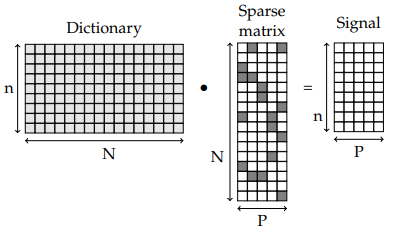

            *Multiple signals can be represented by a single dictionary multipled by a sparse matrix, where each column corresponds to the sparse vector representation of each column in the signal matrix*

            To obtain a sparse representation for all the signals we need to solve,

            $$ \underset{D,\Gamma}{\text{min}} \sum_{j = 1}^{P} || \underline{X}_j - \underline{D} \underline{\Gamma}_j ||_{2}^{2} + \beta || \Gamma_j ||_0 $$

            Where P is the number of signals.

            The dictionary can be learned in either a supervised or unsupervised manner following these general steps:

            1. Initiate the elements in the dictionary by randomly sampling them from the signal

            2. Using the dictionary and signal, compute the sparse representation by cycling through each column of the sparse matrix and using a pursuit algorithm, i.e., solving:

            $$ \underline{\Gamma}^{*}(\underline{X}_{j},\underline{D}) = \underset{\Gamma}{\text{min}} || \underline{\Gamma}_{j}||_{0} \\ \text{s.t.} \\ \underline{X}_{j} = \underline{D} \underline{\Gamma}_{j}$$

            3. These sparse representations can be fed to a classifier with parameters U and the dictionary is updated by solving:

            $$ \underset{D,U}{\text{min}} \sum_{j}^{} \mathcal{l}(h(\underline{X}_{j}), \underline{U}, \underline{\Gamma}^{*}(\underline{X}_{j}, \underline{D})) $$

            $$ \text{where } \mathcal{l} \text{ is the loss with respect to the true signal } (h(\underline{X})_{j}). $$

            This can be solved via gradient descent in a supervised manner.

            If U is of no importance, it reduces to the unsupervised form,

            $$ \underset{D}{\text{min}} || \underline{X} - \underline{D} \underline{\Gamma}^{*}||_{2}^{2} $$

            using K-SVD, this is solved element wise, by taking all the signals that use the given element, subtracting the contribution from other elements, and using a method such as singular value decomposition (SVD) to update the element and reduce the residuals.

            4. Steps 2-3 are repeated iteratively. 
                   
    - #### **2.9 Geometric deep learning:**

        So far we have only considered CNNs in the euclidean domain, acting on grid based, structured data.

        However there are cases where the data of interest is non-eucliidean in nature. Things like trees, networks, manifolds. This kind of data is generally not structured.

        - ##### **2.9.1 Graph Theory**

            $$ \text{Graphs } \underline{G} = (\underline{V},\underline{E}) \text{ consist of vertices }  \underline{V} = \{v_1, v_2,...,v_n\} $$

            $$ \text{known as the vertex set and a set of edges } \underline{E} = \{e_11,e_12,..,e_{i,j}\} $$
            that link pairs of vertices together.

            The number of neighbours of a node graph is known as the degree, defined as,

            $$ d(v_i) = \sum_{}^{} e_{i,j} $$

            where the sum is made of neighbouring nodes.

        - ##### **2.9.2 Graph convolution**

            Graph neural networks are inspired by recurrent neural networks. They take graph data as inputs and sequentially process it through hidden layers that are equivalent to intermediate feature representations in neural networks in order to classify the vertices (nodes) or the edges (connections) according to a class label.

            Example of graph data would be social networks, where individuals are nodes, and interactions between people are the edges, and the classes could be their age, additionally you may havbe feature vectors for each of the nodes, such as their favourite music genre, and favourite food. If the edges represent transactions between people, the classes could be fraud and valid transcations. 

            Standard neural networks would not work well on this data, since the nodes are not fixed spatially (they can move around), and the nodes that are close spatially do not necessairly connect via an edge.

            Given how large graph data can grow it may make sense to use a method analagous to convolutional neural networks - graph convolutional networks.

            In 2D convolution, the data is structured. Each pixel can be represented as a node, and the filter size determines which nodes are neighbours. The filters extract features in the local neighbourhood and aggregate neighbouring features in subsequent layers. Here the nodes are ordered and they have the same size (all pixels are equivalent).

            In graph convolution, the data is not structured. Like in 2D convolution, in order to get the representation of a node, one way is to take the average of its neighbouring nodes, however graph data is not structured. Nodes can vary in size and the filter size cannot be used to determine which nodes are neighbours.

            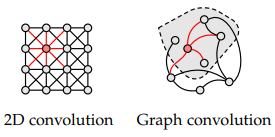

            *2D convolution represented in graph form: The circles represent nodes and the lines the connections. The data is sturctured and all neighbouring nodes, determined by the filter size are connected.*
            
            *Convolution aggregates information together of neighbouring nodes.*

            *In graph convolution, the nodes are not structured and can vary in size, and therefore neighbours are less well defined.*

            Convolution, the method of sequentially aggregating node feature, on graph data must therefore be redefined.

            In order to generalise convolution to graph data, we need to define the parameterised filters used in the convolutional layers. There are 2 main methods to do so:

            - Spatial Methods: are problem specific architectures that aggregate features in neighbouring nodes

            - Spectral Methods: Involve eigenvalue decomposition like in Principle Component Analysis, however here, it is the smaller eignevalues that describe the structure.

            For graph data to be used in a GCN we need to project it onto an adjacency matrix A which encodes the information about the nodes and the connections and has size NxN where N is the number of nodes in the input.

            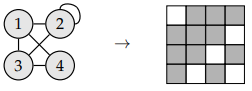

            *Visualisation of some graph data with nodes and connections labelled arbitrarily. The right shows the corresponding adjacent matrix, where the grey elements are corresponding to connections and the white elements correspond to no connections. At (1,2), and (2,1) the elements of the adjacent matrix are grey showing the connections between nodes 1 and 2. At (1,1) the element is white to show there is no self connection at node 1.*

            Note that the adjacency matrix has to be symmetric and so one limitation is that edges are treatedd as undirected. This restriction means that representational hierarchy can only be built by graph convolutional operation followed by pooling or expansion, whch was common for early CNN methods. This has since been replaced by strided and transpose convolutions and skip connections.

            There are ways around this by example using Bipartite graph convolutions or weighted directed graphs where each edge is represented by a 3-tuple rather than a 2-tuple.

            Furthermore ajacent matrices unlike classic CNNs are not invariant to small shifts or transformations. 
            
            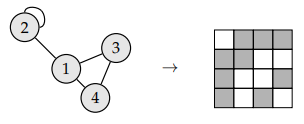
            
            *We have changed just ome pixel in the adjacent matrix but the structure of the graph data is now drastically different.*

            However regardless of how the graphs are sampled to produce the adjacent matrix, the targets will always be the same.
            
            The input to the graph convolution layer is a feature matrix X which consists of a value for each of the F features, for each of the N nodes and therefore has size F x N. Each neural layer is a non-linear function of the adjacent and feature matrix.

            $$ \underline{H}^{(l)} = f(\underline{H}^{(l-1)},A) $$

            $$ \text{where l is the lth layer in the network. in the first layer } \underline{H}^{(0)} = \underline{X}, $$

            but since the features may not be known a priori, they can either be randomly initialised or X can be taken as the identity matrix.

            The difference between spectral and spatial GCNs is how f(x,y) is defined and parameterised. Following in the context of CNNs, we could naively use,

            $$ f(\underline{H}^(l), \underline{A}) = \phi (\underline{A} \underline{H}^(l) \underline{K}^(l))$$

            $$\text{where } \underline{K}^(l) \text{ is a matrix of weights of the lth layer and } \phi(x) $$
            
            is a non-linear activation function like ReLU.

            $$\text{The problem is that } AH^{(l)} \text{ sums up the feature vectors all neighbouring} $$
            nodes but not the feature vector of the node itself unless a self connection is imposed.

            $$ \text{Therefore we replace } \underline{A} \text{ with } \underline{\hat{A}} = \underline{A} + \underline{I} \text{ where } \underline{I} \text{ is  the identity matrix.}$$
            
            Additionally for large graph data, the number of neighbours of nodes can be very large, and consequently the number of aggregated features will become increasingly large at each layer.

            For this reason A is normalised by the degree matrix D, a diagonal matrix where:

            $$ D_{ii} = \sum_{j}^{} A_{ij}$$

            Since A is a symmetric matrix, to ensure the normalised matrix is also symmetirc, this is applied as:

            $$ \underline{D}^{-1/2} \underline{A}\underline{D}^{-1/2}$$

            $$ \text{thus } f(\underline{H}^(l), \underline{A}) = \phi (\underline{A} \underline{H}^(l) \underline{K}^(l)) \text{ becomes:}$$

            $$ f(\underline{H}^{(l)},\underline{A}) = \phi (\underline{\hat{D}}^{-1/2}\underline{\hat{A}}\underline{\hat{D}}^{-1/2}\underline{H}^{(l)}\underline{K}^{l})$$

            Just like CNNs, a simple 2 layer semi supervised GCN could look like:

            $$ \underline{\hat{Y}} = \text{softmax}(\underline{\hat{A}}\text{ReLU}(\underline{\hat{A}}\underline{X}\underline{W}^{(0)})\underline{W}^{(1)})$$

            In semi supervised classification, some nodes are labeled and others are not. Any loss can be used, e.g. cross entropy, however when calculating the loss only the labelled nodes are taken into account. This assumes that locally connected nodes are likely to share the same label.

            ##### Graph Downsampling:

            The hierarchical structure of CNNs is largely down to the downsampling (pooling) layers. 
            
            Graph networks require first clustering the graph before the pooling layers can be applied. This is known as graph coarsening, and can be done with various algorithms.

            For point cloud data there is VoxelGrid and self organising networks, for general weighted graphs there is Graculus.

            The max or average pooling occurs across collapsed vertices, and this coarsening structure can be represented as a binary tree.

            ##### GCN Applications:

            GCNs are not only looking for patterns in the direct connections between nodes, but also the indirect connections. The features of nodes become increasingly more abstract at each consecutive layer. 
            
            The applications are not limited to classification, but also generation of new drug candidates, detecting fraudulent bank transactions, ect.

            GCNs are still an area of active reseach, graph data is difficult to store in vRAM because the adjacency matrix needs to be stored. It has been show that for large graphs, CPUs can be used without too much loss in efficiency.
            
        - ##### **2.9.3 Riemannian manifolds**

            The graph networks mentioned so far are in a fixed domain - the connections between the nodes are fixed. There are cases where we would want to have varying domains, i.e., for 3D moving objects.

            A 3D shape can be described by a topological surface called a Manifold, χ.
            At any point x on the surface, the local area has a Euclidean representation of χ, $$\text{known as the tangent plane } T_x\chi .$$
            The Riemannian metric is defined as the family of inner products of all tangent planes about x,

            $$ g_x \langle .,. \rangle _{T_x\chi} : T_x\chi \times T_x\chi \rightarrow \mathbb{R}$$

            this describes the smooth local intrinsic structure at x, and allows us to measure lengths and angles. The scalar fields f describe a scalar quantitu at all points over

            $$ \chi,f : \chi \rightarrow \mathbb{R}$$

            and the vector fields F describe a tangent vector quantity at all points over 

            $$ \chi, F : \chi \rightarrow T\chi$$

            The laplacian is important for learning on non-euclidean domains, as its eigenfunctions are used to generalise the classical fourier bases in spectral analyses. The laplacian is the divergence of the gradient of a function on euclidean space.

            $$ \text{div } \vec{F}(x) = \vec{\nabla} \cdot \vec{F}(x)$$
            $$ \text{grad } f(x) = \vec{\nabla} f(x) $$

            $$ \Delta f(x) = -\vec{\nabla} \cdot \vec{\nabla} f(x) $$

            In non-Euclidean space, the laplacian uses the intrinsic gradient - the direction of greatest change in slope as represented by a tangent vector,

            $$ \vec{\nabla}f : L^2(\chi) \rightarrow L^2(T\chi)$$

            and the intrinsic divergence - the density of outward flux of F from an infinitesimal sphere about tangent vector fields,

            $$ \vec{\nabla} \cdot \vec{F} : L^2(T\chi) \rightarrow L^2(\chi)$$

            The laplacian is the difference between the average of a function on an infinitesimal sphere around a point and the value of the function at that point.

            On a manifold the eigendecomposition of the laplacian is:

            $$ \Delta_\chi \phi_k = \lambda_k \phi_k$$

            $$ \text{ where } \lambda_k \text{ are the eigenvalues and } \phi_k \text{ are the eigenvectors }$$

            The non-euclidean laplacian has the propeties that it is intrinsic, so can be expressed soley in terms of the Riemannian metric, it is isometry invariant, so it doesn't change with the deformation of the manifold, and it's positive semidefinite.

            A function f on χ can be written a a linear combination of the eigenvectors:

            $$ f(x) = \sum_{i \geq 0}^{} \langle f, \phi_i \rangle _{L^2(\chi)} \phi_i(x) $$
            $$ = \sum_{i \geq 0}^{} \hat{f}_i \phi_i(x) $$

            $$ \text{with } \hat{f} \text{ serving as the coordinates of the eigenbasis.} $$ 
            $$\text{Here } \hat{f} \text{ is the forward fourier transform of } f $$

            In euclidean space, the convolution of two functions in the spectral domain is the element-wise product of their fourier transforms,

            $$ (\widehat{f * g})(\omega) = \hat{f}(\omega) \cdot \hat{g}(\omega) $$

            In non-euclidean space the operation x - x' cannot be defined on the manifold, so an equivalent transformation cannot be made, however if we use the above equation as a definition, then

            $$ (f * g)(x) = \sum_{k \geq 0}^{} \langle f, \phi_k \rangle _{L^2(\chi)} \langle g, \phi_k \rangle _{L^2(\chi)} \phi_k(x) $$

            spectral convolution in non-euclidean space is basis dependent.
            
            This means that a filter applied in this domain is basis dependent and will not generalise across domains.

            A basis independent, non-euclidean convolution can be obtained by construction of a local system of geodesic polar coordinates on a manifold,

            $$ \underline{u}(x,x') = (p(x,x'), \theta(x,x'))$$

            where p is the radial component that describes the geodesic distance from x to x' and θ is the angular component that describes the direction from x to x'. Additionally, their locally defined weights can be written as:

            $$ w_1(\underline{u}(x,x')) = (v_p(x,x'),v_\theta (x,x'))$$

            for a function f, the patch operator produces a local representation of f around a point x.

            $$ (D(x)f)\underline{u} = \frac{\int_{\chi}^{} \ v_p(x,x'),v_\theta (x,x')f(x') \ dx'}{\int_{\chi}^{} \ v_p(x,x'),v_\theta (x,x') \ dx'} $$

            The spatial convolution can then be defined as a filter g applied on local patches,

            $$ (f*g)(x) = sum_{p,\theta}^{} (D(x)f)(\underline{u})g(\underline{u}) $$

            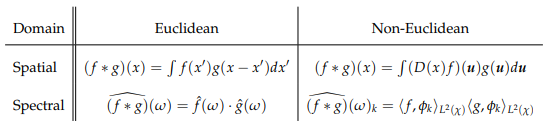

            *Spatial and Spectral convolutions for Euclidean and non-Euclidean domains.*

Device Number: 0, Name: NVIDIA GeForce RTX 2080 SUPER, VRAM: 8192 MiB, PCIe: 00000000:0A:00.0
Train sample:  48000
Validation sample:  12000
Test sample:  10000
image 1 shape:  (28, 28, 1)


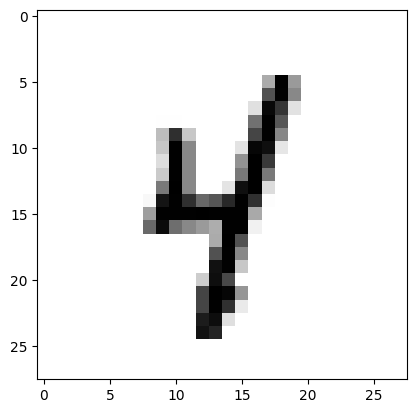

image shape:  (1, 26, 26, 1)


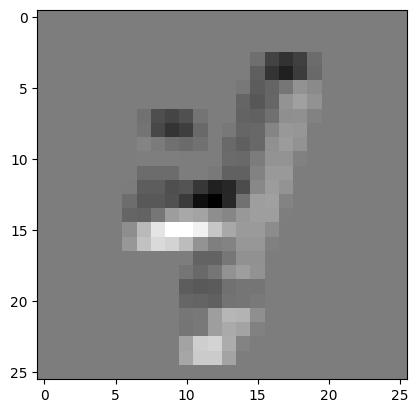

image shape:  (1, 26, 26, 1)


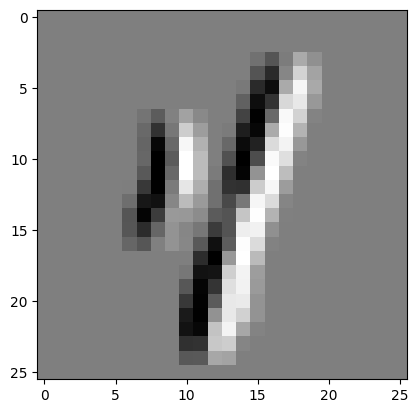

image shape:  (1, 26, 26, 1)


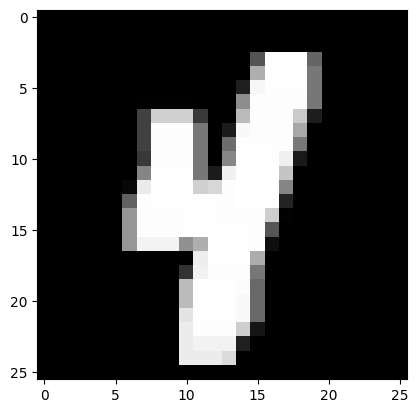

image shape:  (1, 19, 19, 1)


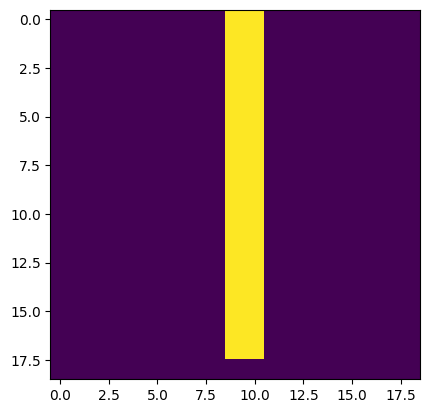

[[[[35.9372559]]]]
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 26, 26, 32)        320       
                                                                 
 pool1 (MaxPooling2D)        (None, 8, 8, 32)          0         
                                                                 
 conv2 (Conv2D)              (None, 6, 6, 10)          2890      
                                                                 
 pool2 (MaxPooling2D)        (None, 2, 2, 10)          0         
                                                                 
 flatten (Flatten)           (None, 40)                0         
                                                                 
 dense1 (Dense)              (None, 20)                820       
                                                                 
 dense2 (Dense)              (None, 1

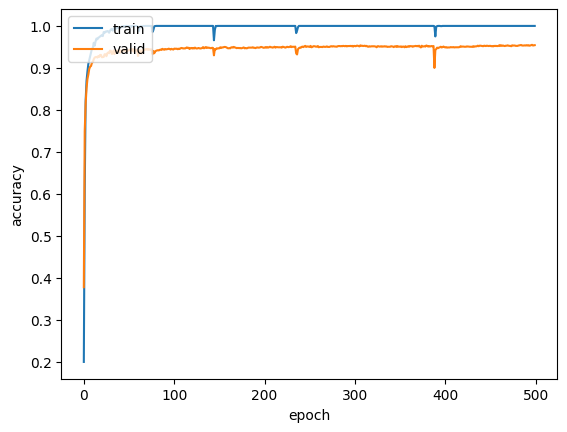

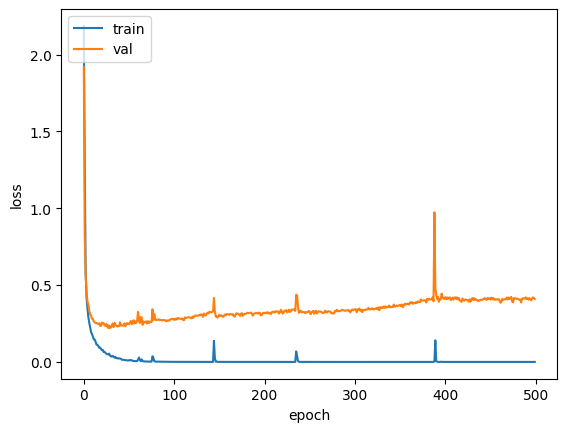

In [5]:
# CNN using keras.

import tensorflow as tf
import numpy as np
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

import subprocess

run = False # set to True to run the code below
print_confusion = False # set to True to print confusion matrix

if run:

    def print_gpu_info():
        
        output = subprocess.check_output(['nvidia-smi', '--query-gpu=index,name,memory.total,pci.bus_id', '--format=csv,noheader'])
        gpu_info = output.decode().strip().split('\n')
        
        for info in gpu_info:
            index, name, vram, pcie = info.split(',')
            print(f"Device Number: {index.strip()}, Name: {name.strip()}, VRAM: {vram.strip()}, PCIe: {pcie.strip()}")
        
    print_gpu_info()

    # download mnist dataset
    (train_ds, validation_ds, test_ds), metadata = tfds.load(
        
    'mnist',
    split=['train[:80%]', 'train[80%:100%]', 'test'],
    with_info=True,
    as_supervised=True
    )

    ntrain = len([image[0] for image in train_ds])
    nvalid = len([image[0] for image in validation_ds])
    ntest = len([image[0] for image in test_ds])

    print('Train sample: ', ntrain)
    print('Validation sample: ', nvalid)
    print('Test sample: ', ntest)

    # take 1 image from training dataset and convert to float64 and normalise it.

    data1 = train_ds.map(
        lambda image, label: (tf.image.convert_image_dtype(image, tf.float64), label)
    ).take(1)

    # get first image data and label and plot it
    features, labels = iter(data1).next()
    print('image 1 shape: ', np.shape(features))
    plt.imshow(features[:,:,0], cmap='gray_r')
    plt.show()

    # ======================================== Edge Detection Example with convolution ========================================

    # horizontal edge detection kernal = [[1, 1, 1], [0, 0, 0], [-1, -1, -1]]
    # vertical edge detection kernal = [[1, 0, -1], [1, 0, -1], [1, 0, -1]]

    hor_kernal = [[1,1,1],
                [0,0,0],
                [-1,-1,-1]]

    #2D convolution 
    output = tf.nn.conv2d(
        input=np.reshape(features, [1,28,28,1]), # batch, height, width, depth
        filters=np.reshape(hor_kernal, [3,3,1,1]), # height, width, in_channels, out_channels
        strides=[1,1,1,1], # amount to move the kernel across the input tensor
        padding="VALID" 
    )

    print('image shape: ', np.shape(output))
    plt.imshow(output[0,:,:,0], cmap='gray')
    plt.show()

    # NOTE: output image shape is 26x26 because of padding="VALID" and 28x28 input image size. (valid padding means no padding)
    # If padding="SAME" then output image size will be same as input image size.

    vert_kernal = [[1,0,-1],
                [1,0,-1],
                [1,0,-1]]

    output = tf.nn.conv2d(
        input=np.reshape(features, [1,28,28,1]),
        filters=np.reshape(vert_kernal, [3,3,1,1]),
        strides=[1,1,1,1], #in batch, x, y, channel
        padding="VALID"   
    )

    print('image shape: ', np.shape(output))
    plt.imshow(output[0,:,:,0], cmap='gray')
    plt.show()

    # ======================================== Pooling Example with max pooling ========================================

    # The pooling layer is used to reduce the spatial dimensions of the input volume. The max pooling operation 
    # returns the maximum value from the portion of the image covered by the kernel.
    # Lets plot a 3x3 max pooling output of our image.

    output = tf.nn.max_pool(
        input=np.reshape(features, [1,28,28,1]),
        ksize=3,
        strides=1,
        padding="VALID"    
    )

    print('image shape: ', np.shape(output))
    plt.imshow(output[0,:,:,0], cmap='gray')
    plt.show()

    # if we increase the kernal size to 10, we get even more shrinkage in the output image size.

    output = tf.nn.max_pool(
        
        input=np.reshape(features, [1,28,28,1]),
        ksize=10,
        strides=1,
        padding="VALID"   
    )

    print('image shape: ', np.shape(output))
    plt.imshow(output[0,:,:,0], cmap='gray')

    # ======================================== Fully connected layer example ========================================

    # set a weight matrix of 1 in the 10th and 11th columns and 0 elsewhere.

    weights = np.zeros([19,19])
    weights[0:18,9]=1
    weights[0:18,10]=1

    plt.imshow(weights)
    plt.show()

    output2 = tf.nn.conv2d(
        input=np.reshape(output, [1,19,19,1]), #batch, height, width, depth
        filters=np.reshape(weights, [19,19,1,1]), #height, width, in_channels, out_channels
        strides=[1,1,1,1], 
        padding="VALID"
    )

    tf.print(output2)

    # ======================================== CNN model example ========================================

    # First we will take make a training dataset which the model sees and uses to update model parameters,
    # a validation dataset that is not used to update model parameters, but ensures that the model is not overfitting,
    # and decide when to stop training, and a test dataset that is used to evaluate the model's performance. These
    # are sampled from the original dataset.

    # we apply augmentation to the training dataset to increase the number of training samples.

    # NOTE : we use shuffle to shuffle buffer 100 images batch split into batches of 24 take 1 batch and repeat the process.
    # NOTE: order of operations is important. If we take a batch of 24 images and then shuffle, we will shuffle the 24 images

    train = train_ds.map(
        lambda image, label: (tf.image.convert_image_dtype(image, tf.float64), label) 
    ).shuffle(100
    ).batch(24).take(100)

    valid = validation_ds.map(
        lambda image, label: (tf.image.convert_image_dtype(image, tf.float64), label) 
    ).shuffle(100
    ).batch(24).take(100)

    test = test_ds.map(
        lambda image, label: (tf.image.convert_image_dtype(image, tf.float64), label) 
    ).batch(100).take(100)

    # We can now build a CNN model. Let's start with a simple model with 2 convolutional layers each with 10 3x3 kernals,
    # 2 max pooling layers with 3x3 kernal, and 2 fully connected layers.

    tf.keras.backend.clear_session() #Clear keras session

    num_classes = 10 
    input_shape = [28, 28, 1] 

    # define the model
    model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),activation='relu', name='conv1',input_shape=input_shape), 
    tf.keras.layers.MaxPool2D(pool_size=(3,3), name='pool1'), 
    tf.keras.layers.Conv2D(filters=10,kernel_size=(3,3),strides=1,padding='valid',activation='relu', name='conv2'), 
    tf.keras.layers.MaxPool2D(pool_size=(3,3), name='pool2'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(20, activation='relu',name='dense1'),
    tf.keras.layers.Dense(num_classes, activation='softmax', name='dense2') 
    ])

    model.summary() 

    LR = 0.001 # learning rate

    model.compile(
        loss=tf.keras.losses.sparse_categorical_crossentropy,
        optimizer=tf.keras.optimizers.Adam(LR),
        metrics=['accuracy']
    )

    history = model.fit(train, epochs=500, validation_data=valid)
    score = model.evaluate(test, verbose=0)

    print('Test loss:', score[0])
    print('Test accuracy:', score[1])

    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    plt.show()


    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

    if print_confusion:
        for image, label in test:
            pred = model.predict(image)
            for idx in label:
                tf.print('predicted:', np.argmax(pred[idx]), '- truth:', label[idx])


#### **Week Starting Febuary 19th:**

*Read sections 2 - 2.9.3*

##### **Thursday Febuary 22nd 10am-11am SUPERVIOR MEETING**
- look at galaxy dataset, galaxy zoo 2 . https://pypi.org/project/galaxy-datasets/
- get comfortable with data and labels
- concentrate on top part of the classification tree
- being to classify basic galaxy classify


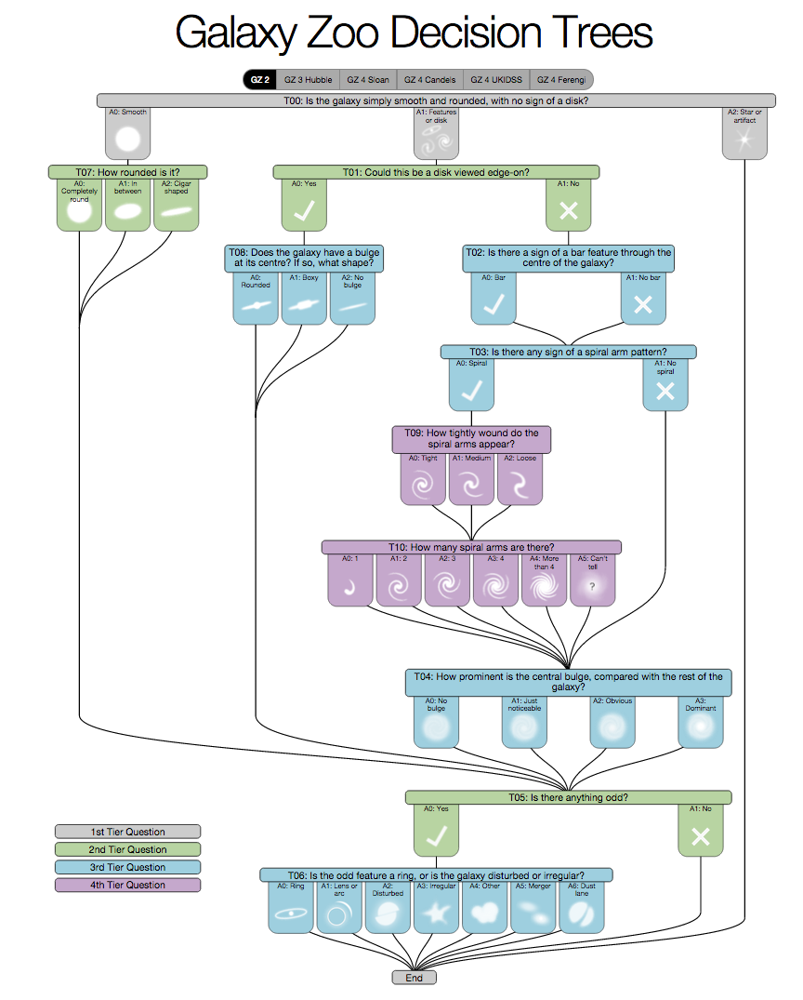

*Galaxy zoo classification decision tree diagrams*

167434 images of distinct galaxies in the dataset
Images are 424 x 424 JPG files 3 Channels - RGB 8-bit colour depth.

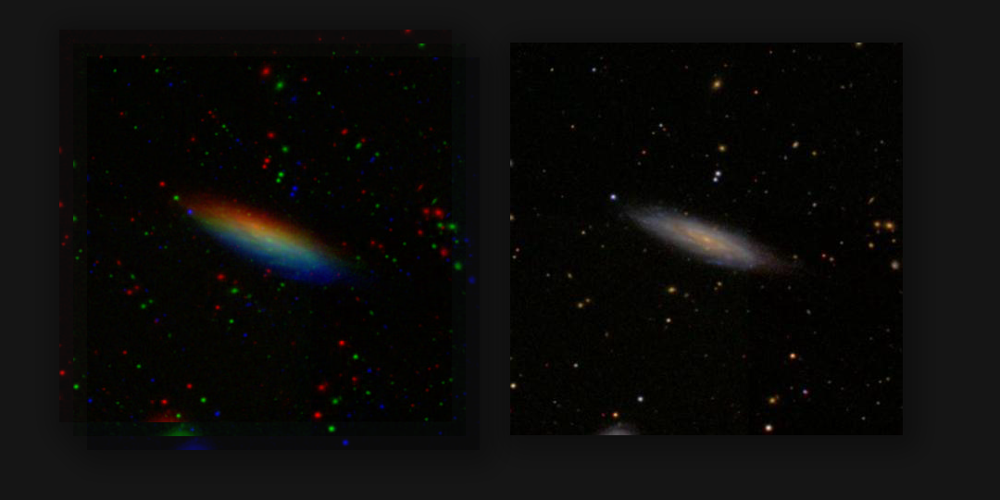

*Colour Channels of Example Galaxy Image*

class labels are a number from 0 to 6, each number represents a different class, with -1 being an unclassified class
class names: 7 distinct classes. 1 unclassified class. 

 -----------------------------------------------------------------------------------------------------------
 | Class Label |                   Class Name                       |  Number of Galaxies  | % of Galaxies |    
 |-------------|----------------------------------------------------|----------------------|---------------|                        
 |    -1       | Missing Value (could be unclassified or artifact)  |    9461 galaxies     |     5.65%     |
 |     0       | "smooth_inbetween"                                 |    62857 galaxies    |     37.54%    |
 |     1       | "smooth_round"                                     |    43800 galaxies    |     26.16%    |
 |     2       | "smooth_cigar"                                     |    15801 galaxies    |     9.44%     |
 |     3       | "edge_on_disk"                                     |    3729 galaxies     |     2.23%     |
 |     4       | "unbarred_spiral"                                  |    20992 galaxies    |     12.54%    |
 |     5       | "barred_spiral"                                    |    7346 galaxies     |     4.39%     |
 |     6       | "featured_without_bar_or_spiral"                   |    3448 galaxies     |     2.06%     |
 -----------------------------------------------------------------------------------------------------------

*can interpret these as the basic classes of galaxies. coarse features of galaxies that are easy to classify.*
*the other features are more fine grained, and are not as easy to classify as they are rarer.*

Galaxy Zoo 2 decision tree:
37 Options in total in the decision tree

 - **Percentages of answers to the questions in the decision tree: (data from datawrangler, need to go through this manually do some more analysis and get information on some of the questions)**

    - is the galaxy simply smooth and rounded with no sign of a disk, or is it featured/disk, or a aritfact?

         - 75% of the galaxies are classified as smooth
         - 24% of the galaxies are classified as featured-or-disk
         - <1% of the galaxies are classified as deadlock
         - <1% of the galaxies are classified as artifact

    - is the galaxy disk viewed edge on?

         - 76% of the galaxies are unclassified in the disk edge on question
         - 24% of the galaxies are classified as no
         - 3% of the galaxies are classified as yes
         - <1% of the galaxies are classified as deadlock

    - is there any sign of a spiral arm pattern?

         - 76% of the galaxies are unclassified in the has spiral arms question
         - 18% of the galaxies are classified as yes
         - 4% of the galaxies are classified as no
         - 2% of the galaxies are classified as deadlock

    - is there a sign of a bar feature through the centre of the galaxy?

         - 76% of the galaxies are unclassified in the bar question
         - 6% of the galaxies are classified as yes
         - 16% of the galaxies are classified as no
         - 2% of the galaxies are classified as deadlock

    - how prominent is the central bulge, compared to the rest of the galaxy?

         - 76% of the galaxies are unclassified in the bulge size question
         - 13% of the galaxies are classified as just noticable
         - 7% of the galaxies are classified as obvious
         - 3% of the galaxies are classified as dominant or deadlock

    - is there anything odd?

         - 91% of the galaxies do not have something odd
         - 8% of the galaxies do have something odd
         - <1% of the galaxies are deadlock

    - how round is the galaxy?

         - 26% of the galaxies are unclassified in the how rounded question
         - 26% of the galaxies are classified as round
         - 38% of the galaxies are classified as in-between
         - 10% of the galaxies are classified as cigar or deadlock

    - does the galaxy have a bulge at its centre? if so, what is the shape of the bulge?

         - 97% of the galaxies are unclassified in the bulge shape question
         - 2% of the galaxies are classified as round
         - 1% have no bulge
         - <1% are classified as boxy

    - how tightly wound do the spiral arms appear?

         - 87% of the galaxies are unclassified in the spiral winding question
         - 6% of the galaxies are classified as medium
         - 4% of the galaxies are classified as tight
         - 2% of the galaxies are classified as loose

    - how many spiral arms are there?

         - 87% of the galaxies are unclassified in the spiral arm count question
         - 8% of the galaxies are classified as 2
         - 3% of the galaxies are classified as can't tell
         - 2% of the galaxies are classified as 3, 4, or more than 4

 - final classifications:

      - 38% of the galaxies are smooth inbetween
      - 26% of the galaxies are smooth round
      - 13% of the galaxies are unbared spiral
      - 18% of the galaxies are "other"

NOTE: percentages obtained from datawrangler, I need to go through this manually do some more analysis

### Dataset Structure: Key-Value Table .parquet 

There are 90 columns in the dataset with keys and values (of vectors) corresponding to:

- 'ra' =  right ascension
- 'dec' = declination
- 'smooth-or-featured-gz2_smooth' = number of votes for smooth
- 'smooth-or-featured-gz2_featured-or-disk' = number of votes for featured or disk
- 'smooth-or-featured-gz2_artifact' =  number of votes for artifact
- 'disk-edge-on-gz2_yes' = number of votes for seen edge on
- 'disk-edge-on-gz2_no' = number of votes for not seen edge on
- 'bar-gz2_yes' = number of votes for bar
- 'bar-gz2_no' = number of votes for no bar
- 'has-spiral-arms-gz2_yes' = number of votes for spiral arms
- 'has-spiral-arms-gz2_no'  = number of votes for no spiral arms
- 'bulge-size-gz2_no' = number of votes for no bulge
- 'bulge-size-gz2_just-noticeable' = number of votes for just noticeable bulge
- 'bulge-size-gz2_obvious' = number of votes for obvious bulge
- 'bulge-size-gz2_dominant' = number of votes for dominant bulge
- 'something-odd-gz2_yes' = number of votes for something odd in the image
- 'something-odd-gz2_no' = number of votes for nothing odd in the image
- 'how-rounded-gz2_round' = number of votes for round galaxy shape
- 'how-rounded-gz2_in-between'= number of votes for inbetween galaxy shape
- 'how-rounded-gz2_cigar' = number of votes for cigar galaxy shape
- 'bulge-shape-gz2_round' = number of votes for round bulge shape
- 'bulge-shape-gz2_boxy' = number of votes for boxy bulge shape
- 'bulge-shape-gz2_no-bulge' = number of votes for no bulge
- 'spiral-winding-gz2_tight' = number of votes for tight spiral arm winding
- 'spiral-winding-gz2_medium' = number of votes for medium spiral arm winding
- 'spiral-winding-gz2_loose' = number of votes for loose spiral arm winding
- 'spiral-arm-count-gz2_1' = number of votes for 1 spiral arm
- 'spiral-arm-count-gz2_2' = number of votes for 2 spiral arms
- 'spiral-arm-count-gz2_3' = number of votes for 3 spiral arms
- 'spiral-arm-count-gz2_4' = number of votes for 4 spiral arms
- 'spiral-arm-count-gz2_more-than-4' = number of votes for more than 4 spiral arms
- 'spiral-arm-count-gz2_cant-tell' = number of votes for can't tell the no. of spiral arms
- 'smooth-or-featured-gz2_total-votes' = total number of votes to the smooth or featured question
- 'smooth-or-featured-gz2_smooth_fraction' = probability that the galaxy in the image is smooth
- 'smooth-or-featured-gz2_featured-or-disk_fraction'= probability that the galaxy in the image is featured or a disk
- 'smooth-or-featured-gz2_artifact_fraction'= probability that the galaxy in the image is an artifact
- 'disk-edge-on-gz2_total-votes' = total number of votes to the disk edge on question
- 'disk-edge-on-gz2_yes_fraction' = probability that the galaxy in the image is seen edge on
- 'disk-edge-on-gz2_no_fraction' = probability that the galaxy in the image is not seen edge on
- 'has-spiral-arms-gz2_total-votes' = total number of votes to the has spiral arms question
- 'has-spiral-arms-gz2_yes_fraction' = probability that the galaxy in the image has spiral arms
- 'has-spiral-arms-gz2_no_fraction' = probability that the galaxy in the image has no spiral arms
- 'bar-gz2_total-votes' = total number of votes to the bar question
- 'bar-gz2_yes_fraction' = probability that the galaxy in the image has a bar
- 'bar-gz2_no_fraction' = probability that the galaxy in the image doesn't have bar
- 'bulge-size-gz2_total-votes' = total number of votes to the bulge size question
- 'bulge-size-gz2_dominant_fraction' = probability that the galaxy in the image has a dominant bulge
- 'bulge-size-gz2_obvious_fraction' = probability that the galaxy in the image has an obvious bulge
- 'bulge-size-gz2_just-noticeable_fraction' = probability that the galaxy in the image has a just noticeable bulge
- 'bulge-size-gz2_no_fraction' = probability that the galaxy in the image has no bulge
- 'something-odd-gz2_total-votes' = total number of votes for the something odd question
- 'something-odd-gz2_yes_fraction' = probability that the galaxy in the image has something odd in it
- 'something-odd-gz2_no_fraction' = probability that the galaxy in the image doesn't have something odd in it
- 'how-rounded-gz2_total-votes' = total number of votes to the how rounded question
- 'how-rounded-gz2_round_fraction' = probability that the galaxy in the image is round in shape
- 'how-rounded-gz2_in-between_fraction' = probability that the galaxy in the image is in between in shape
- 'how-rounded-gz2_cigar_fraction' = probability that the galaxy in the image is cigar like in shape
- 'bulge-shape-gz2_total-votes' =  total number of votes to the bulge shape question
- 'bulge-shape-gz2_round_fraction' = probability that the galaxy in the image has a round bulge
- 'bulge-shape-gz2_boxy_fraction' = probability that the galaxy in the image has a boxy bulge
- 'bulge-shape-gz2_no-bulge_fraction' = probability that the galaxy in the image has no bulge
- 'spiral-winding-gz2_total-votes' = total number of votes to the spiral winding question
- 'spiral-winding-gz2_tight_fraction' = probability that the galaxy in the image has tight spiral winding
- 'spiral-winding-gz2_medium_fraction' = probability that the galay in the image has medium spiral winding
- 'spiral-winding-gz2_loose_fraction' = probability that the galaxy in the image has loose spiral winding
- 'spiral-arm-count-gz2_total-votes' = total number of votes to the spiral arm count question
- 'spiral-arm-count-gz2_1_fraction' = probability that the galaxy in the image has 1 spiral arm
- 'spiral-arm-count-gz2_2_fraction' = probability that the galaxy in the image has 2 spiral arms
- 'spiral-arm-count-gz2_3_fraction' = probability that the galaxy in the image has 3 spiral arms
- 'spiral-arm-count-gz2_4_fraction' = probability that the galaxy in the image has 4 spiral arms
- 'spiral-arm-count-gz2_more-than-4_fraction' = probability that the galaxy in the image has more than 4 spiral arms
- 'spiral-arm-count-gz2_cant-tell_fraction' = probability that the galaxy in the image has ??? spiral arms
- 'file_loc' = file location of the image, it's path
- 'subfolder' = subfolder of the image, it's root
- 'iauname' = IAU Name of the galaxy
- 'smooth-or-featured-gz2_semantic' = final classification of the galaxy feature, either smooth or featured/disk
- 'disk-edge-on-gz2_semantic' = final classification of the galaxy feature, either edge on or not edge on
- 'has-spiral-arms-gz2_semantic' = final classifiction of the galaxy feature, either has spiral arms or doesn't
- 'bar-gz2_semantic' = final classification of the galaxy feature, either has a bar or doesn't
- 'bulge-size-gz2_semantic' = final classification of the galaxy feature, either has a just noticeable, obvious, dominant, or no bulge
- 'something-odd-gz2_semantic' = final classification of the galaxy feature, either has something odd or doesn't
- 'how-rounded-gz2_semantic' = final classification of the galaxy feature, either is rounded, inbetween, or cigar shaped
- 'bulge-shape-gz2_semantic' = final classification of the galaxy feature, either is round, boxy, or no bulge
- 'spiral-winding-gz2_semantic' = final classification of the galaxy feature, either loose, medium, or tight spiral arm winding
- 'spiral-arm-count-gz2_semantic' = final classification of the galaxy feature, either 1, 2, 3, 4, more than 4, or ??? number of spiral arm(s)
- 'summary' = final classification of the galaxy based off the final classifications of the other galaxy features.
- 'leaf_prob' = probability of being a leaf
- 'label' = final classification of the galaxy as an integer label
- 'filename' = the filename of the image containing the galaxy
- 'id_str' = the unique id given to the galaxy within the dataset


TO DO: 
- BASIC VISUALISATION OF SOME OF THE DATA, SUCH AS HISTOGRAMS OF THE VOTES AT EACH LAYER & PIE CHARTS OF CLASSES
- will have to clean-up data as there is a fair bit of missing data or incomplete data, possibly just delete these entries. 
- will have to augment the classes that are rare/ low probability, i.e try to make probability dist for all classes somewhat uniform.

Thursday 29th Feb SUPERVISOR MEETING

- techniques to get around class imbalences 
- undersampling, use less of claases with high % (wasteful)
- oversampling, use more of classes with low % (augment more of the smaller % classes to match larger classes)

- guassian blur - go to fourier space, low amplitudes of high frequency modes 
- discrete resolution changing

- visualise data (to figure out how to crop images to remove unwanted surrounding features / reduce size of input matrix)

- see how model performs with no augmentation to start with, using the 8 classes from summary column

- could augment before training (manually)
- could agument on the fly (might be difficult to do)

- convert labels to 0 - 8 (add -1 to end so -1 -> 8) catalog["label"] + 1

In [ ]:
#Can use catalog as a pandas dataframe and access data directly in python using the following lines

#catalog['summary'] accesses summary column

#catalog['file_loc'] accesses file locations, this can be directly input into model.fit which improves efficiency

#im = PIL.Image.open(catalog['file_loc'].iloc[10]) to look at images easily

"""
Can give model.fit file names instead of numpy arrays
it will randomly sample a batch of file names

flow_from_dataframe
"""


Number of Galaxies in the dataset: 167434

class labels:  [-1, 0, 1, 2, 3, 4, 5, 6]

Number of galaxies in each class: 

Artifact: 9461 = 5.65 %
Smooth Inbetween: 62857 = 37.54 %
Smooth Round: 43800 = 26.16 %
Smooth Cigar: 15801 = 9.44 %
Edge on Disk: 3729 = 2.23 %
Unbarred Spiral: 20992 = 12.54 %
Barred Spiral: 7346 = 4.39 %
Featured without bar or spiral: 3448 = 2.06 %


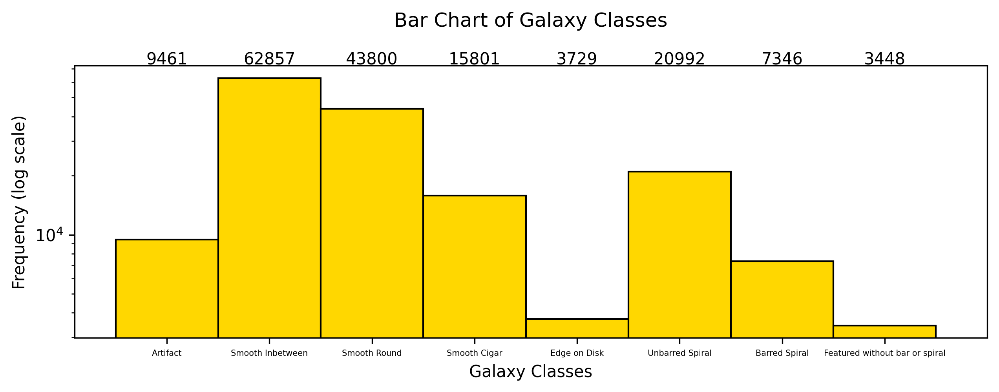

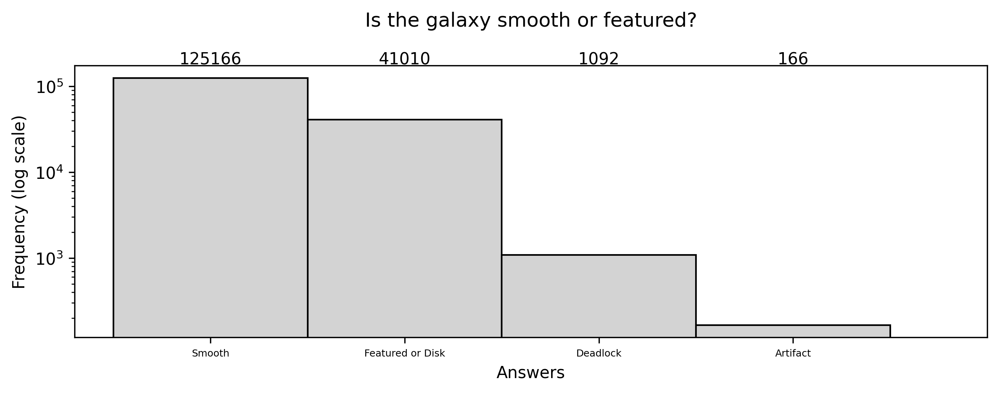

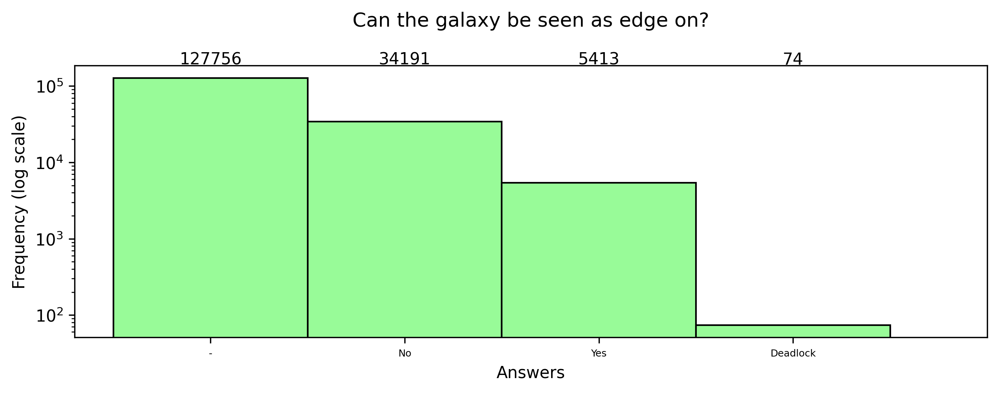

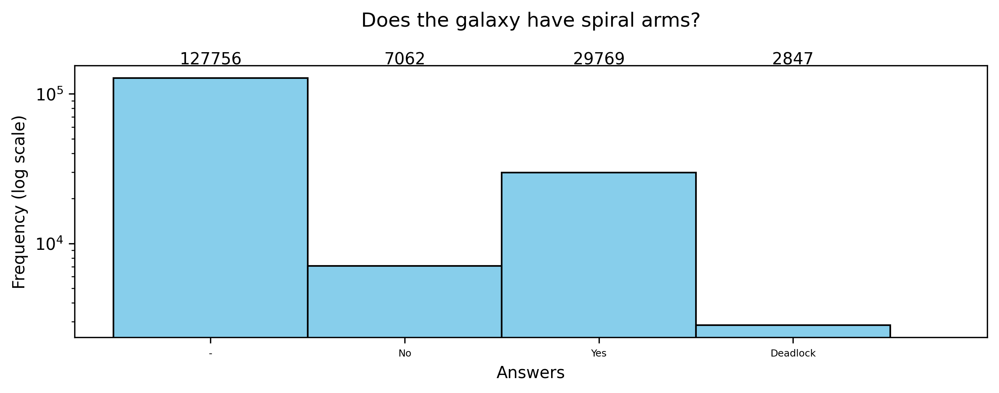

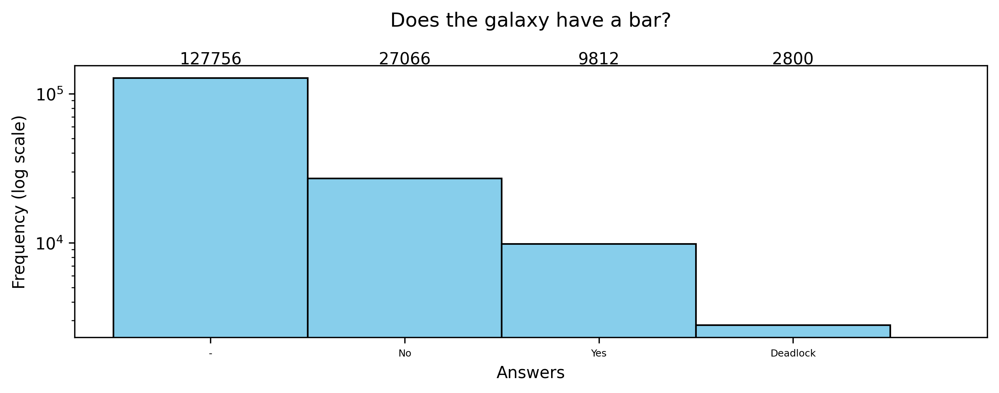

...

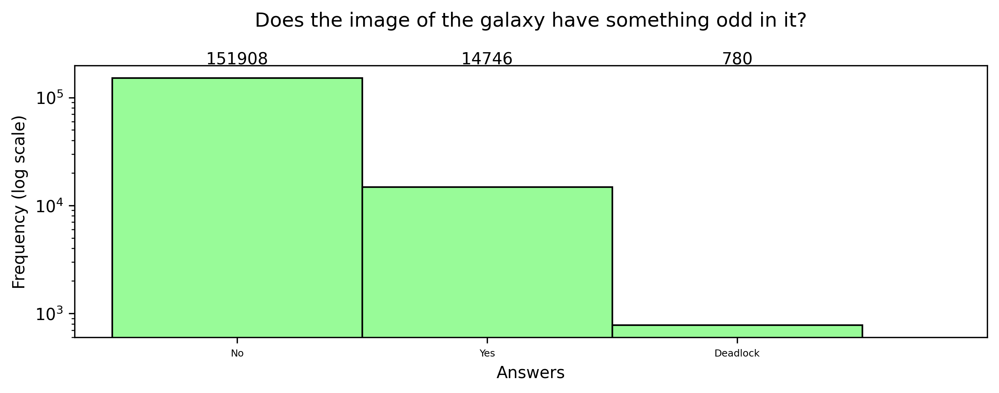

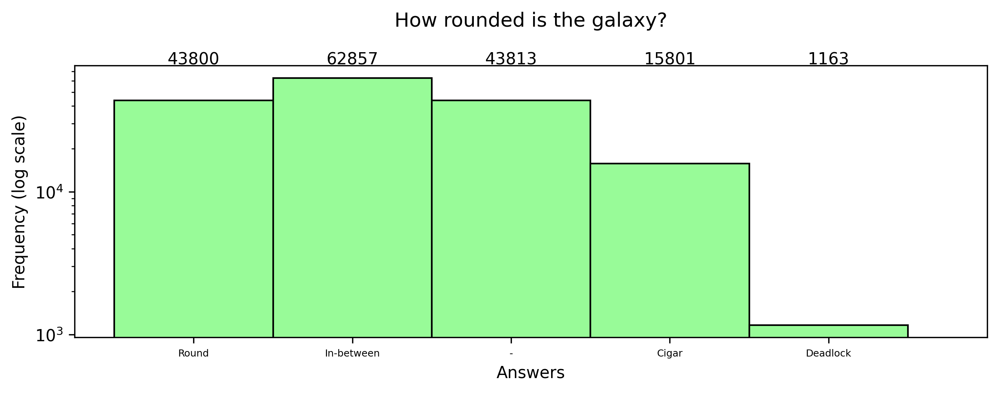

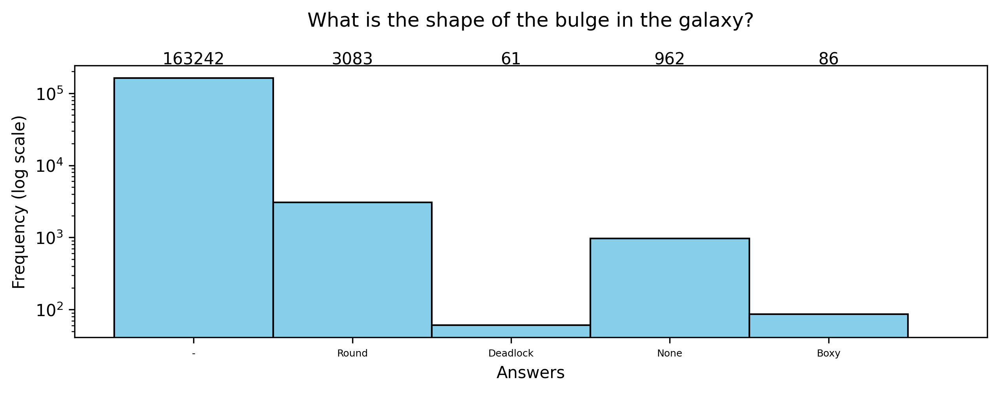

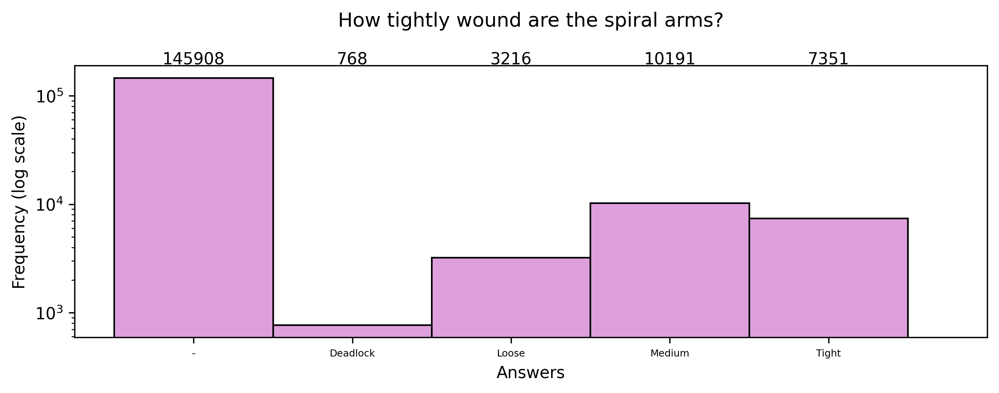

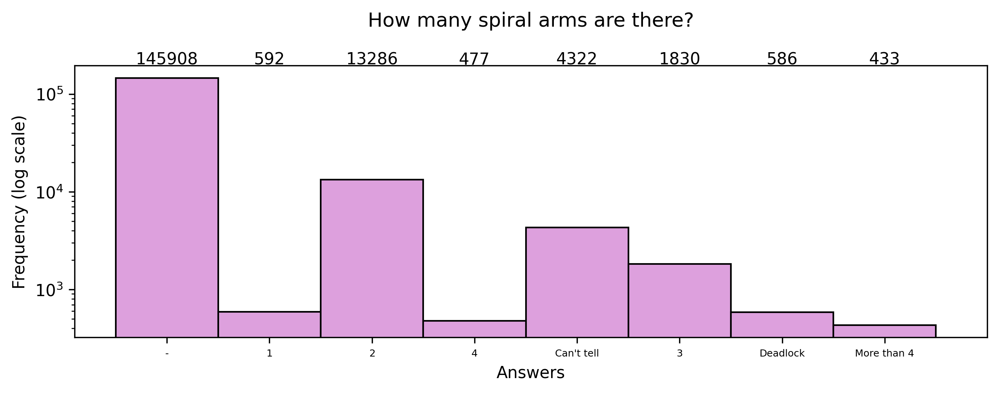

In [19]:
# Galaxy Zoo 2 dataset analysis

import pandas as pd
import os
import matplotlib.pyplot as plt

dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet' 

parquet_file_path = os.path.join(dataset_root, catalog_name)

# Read the Parquet file
df = pd.read_parquet(parquet_file_path)

class_labels = df['label']

print(f"\nNumber of Galaxies in the dataset: {len(class_labels)}\n")
print(f"class labels:  {sorted(class_labels.unique())}\n")
print("Number of galaxies in each class: \n")
print(f"Artifact: {len(class_labels[class_labels == -1])} = {len(class_labels[class_labels == -1])/len(class_labels)*100:.2f} %")
print(f"Smooth Inbetween: {len(class_labels[class_labels == 0])} = {len(class_labels[class_labels == 0])/len(class_labels)*100:.2f} %")
print(f"Smooth Round: {len(class_labels[class_labels == 1])} = {len(class_labels[class_labels == 1])/len(class_labels)*100:.2f} %")
print(f"Smooth Cigar: {len(class_labels[class_labels == 2])} = {len(class_labels[class_labels == 2])/len(class_labels)*100:.2f} %")
print(f"Edge on Disk: {len(class_labels[class_labels == 3])} = {len(class_labels[class_labels == 3])/len(class_labels)*100:.2f} %")
print(f"Unbarred Spiral: {len(class_labels[class_labels == 4])} = {len(class_labels[class_labels == 4])/len(class_labels)*100:.2f} %")
print(f"Barred Spiral: {len(class_labels[class_labels == 5])} = {len(class_labels[class_labels == 5])/len(class_labels)*100:.2f} %")
print(f"Featured without bar or spiral: {len(class_labels[class_labels == 6])} = {len(class_labels[class_labels == 6])/len(class_labels)*100:.2f} %")


# #plot histogram of data

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)
        
n, bins, patches = ax.hist(class_labels, np.arange(9)-1.5, color='gold', ec = 'k')

#Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# #label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')

ax.set_title('Bar Chart of Galaxy Classes', pad =24)
plt.xlabel('Galaxy Classes')
plt.ylabel('Frequency (log scale)')

# Add class names below x axis numbers
class_names = ['Artifact', 'Smooth Inbetween', 'Smooth Round', 'Smooth Cigar', 'Edge on Disk', 'Unbarred Spiral', 'Barred Spiral', 'Featured without bar or spiral', None]

# Set the fontsize for x tick labels
ax.tick_params(axis='x', which='major', labelsize=5)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 7])

# Set the y-axis to log scale
ax.set_yscale('log')

plt.show()

# Histogram of smooth or featured

smooth_or_featured = df['smooth-or-featured-gz2_semantic']

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(smooth_or_featured, np.arange(5)-0.5, color='lightgray', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')
    
ax.set_title('Is the galaxy smooth or featured?', pad =24)
plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')

# Add class names below x axis numbers
class_names = ['Smooth', 'Featured or Disk', 'Deadlock', 'Artifact', None]

# Set the fontsize for x tick labels
ax.set_xticklabels(class_names)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 4])

plt.show()

# Histogram of disk edge on

disk_edge_on = df['disk-edge-on-gz2_semantic']

class_names = ['-','No', 'Yes', 'Deadlock', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(disk_edge_on, np.arange(5)-0.5, color='palegreen', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')

ax.set_title('Can the galaxy be seen as edge on?', pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 4])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# Histogram of has spiral arms

has_spiral_arms = df['has-spiral-arms-gz2_semantic']

class_names = ['-','No', 'Yes', 'Deadlock', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(has_spiral_arms, np.arange(5)-0.5, color='skyblue', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')

ax.set_title('Does the galaxy have spiral arms?', pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 4])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# Histogram of bar

bar = df['bar-gz2_semantic']

class_names = ['-','No', 'Yes', 'Deadlock', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(bar, np.arange(5)-0.5, color='skyblue', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')
    
ax.set_title('Does the galaxy have a bar?', pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 4])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# histogram of bulge size

bulge_size = df['bulge-size-gz2_semantic']

class_names = ['-','Dominant', 'Just Noticable', 'Obvious', 'Deadlock', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(bulge_size, np.arange(6)-0.5, color='skyblue', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')
    
ax.set_title("Does the Galaxy have a central bulge? If so, what it's size?", pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 5])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# histogram of something odd

something_odd = df['something-odd-gz2_semantic']

class_names = ['No','Yes', 'Deadlock', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(something_odd, np.arange(4)-0.5, color='palegreen', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')

ax.set_title('Does the image of the galaxy have something odd in it?', pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 3])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# histogram of how rounded

how_rounded = df['how-rounded-gz2_semantic']

class_names = ['Round','In-between', '-', 'Cigar', 'Deadlock',None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(how_rounded, np.arange(6)-0.5, color='palegreen', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')

ax.set_title('How rounded is the galaxy?', pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 5])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# histogram of bulge shape

bulge_shape = df['bulge-shape-gz2_semantic']

class_names = ['-', 'Round', 'Deadlock', 'None', 'Boxy', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(bulge_shape, np.arange(6)-0.5, color='skyblue', ec = 'k')

# Set the y-axis to log scale

ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')

ax.set_title('What is the shape of the bulge in the galaxy?', pad =24)
ax.set_xticklabels(class_names)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 5])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# histogram of spiral winding

spiral_winding = df['spiral-winding-gz2_semantic']

class_names = ['-', 'Deadlock', 'Loose', 'Medium', 'Tight', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(spiral_winding, np.arange(6)-0.5, color='plum', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')
    
ax.set_title('How tightly wound are the spiral arms?', pad =24)
ax.set_xticklabels(class_names, fontsize=6)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 5])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

# histogram of spiral arm count

spiral_arm_count = df['spiral-arm-count-gz2_semantic']

class_names = ['-', '1', '2', '4', "Can't tell", '3', 'Deadlock', 'More than 4', None]

fig, ax = plt.subplots(1,1, figsize=(10,3), dpi = 300)

n, bins, patches = ax.hist(spiral_arm_count, np.arange(9)-0.5, color='plum', ec = 'k')

# Set the y-axis to log scale
ax.set_yscale('log')

# Set the ticks to be at the centres of the bins.
ax.set_xticks(bins+0.5)

# Label bins and place frequency above them
bin_centers = 0.5 * np.diff(bins) + bins[:-1]

for n, x in zip(n, bin_centers):
    # Label the frequency
    ax.annotate(str(int(n)), xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, 175), textcoords='offset points', va='top', ha='center', color = 'k')
    
ax.set_title('How many spiral arms are there?', pad =24)
ax.tick_params(axis='x', which='major', labelsize=6)
ax.set_xticklabels(class_names)
ax.set_xticks(ax.get_xticks()[ax.get_xticks() != 8])

plt.xlabel('Answers')
plt.ylabel('Frequency (log scale)')
plt.show()

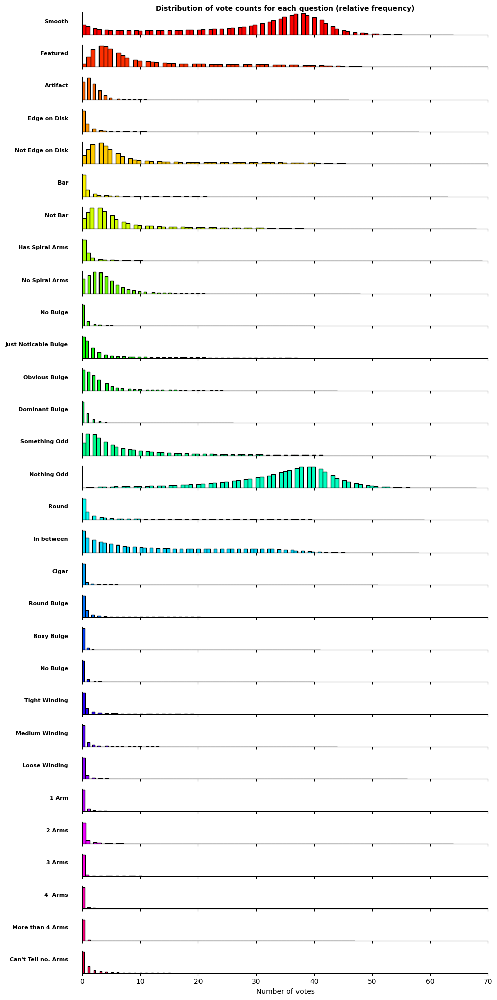

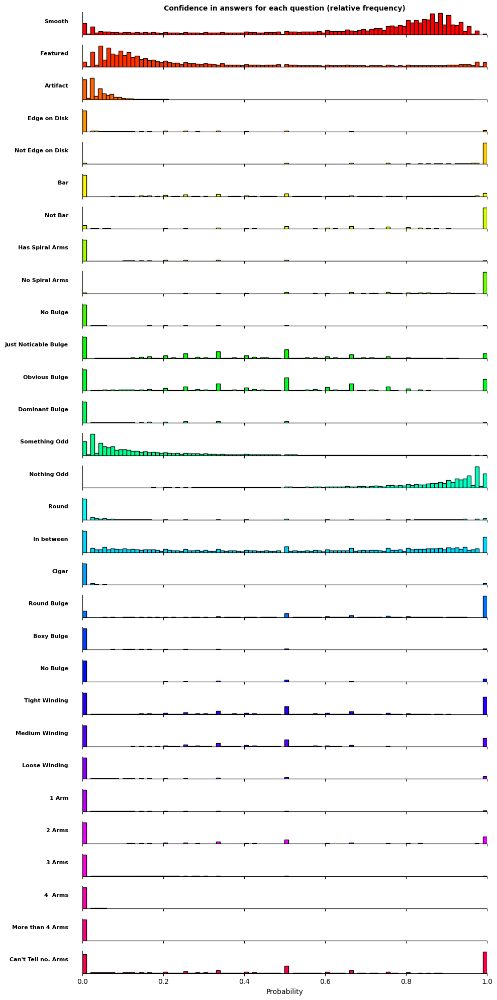

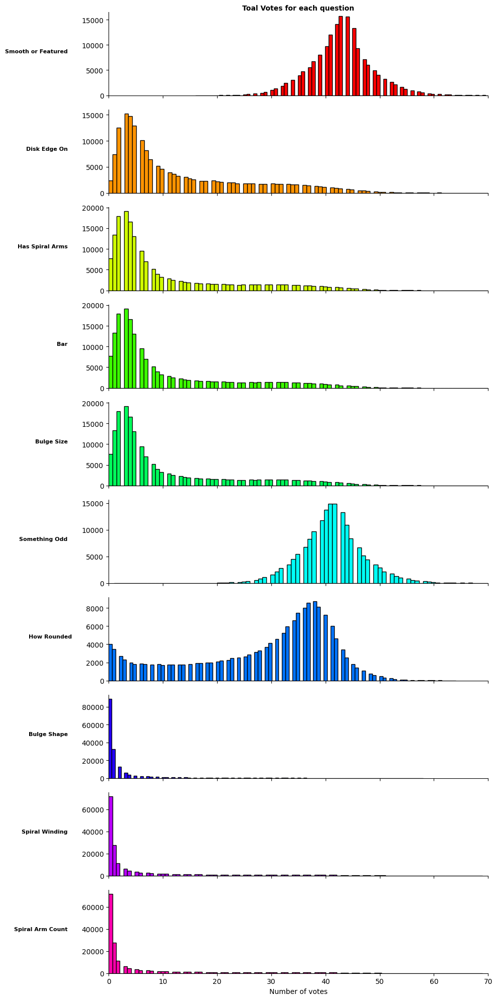

In [4]:
import pandas as pd
import os
import matplotlib.pyplot as plt

run = True

if run:
    dataset_root = 'galaxyzoo2-dataset/'
    catalog_name = r'gz2_train_catalog.parquet' 

    parquet_file_path = os.path.join(dataset_root, catalog_name)

    # Read the Parquet file
    df = pd.read_parquet(parquet_file_path)

    #Plot answers to every classifying question in the decision tree (index smooth-or-featured-gz2_smooth to spiral-arm-count-gz2_cant_tell) as a histogram

    smooth = df['smooth-or-featured-gz2_smooth']
    featured = df['smooth-or-featured-gz2_featured-or-disk']
    artifact = df['smooth-or-featured-gz2_artifact']
    edge_on_yes = df['disk-edge-on-gz2_yes']
    edge_on_no = df['disk-edge-on-gz2_no']
    bar_yes = df['bar-gz2_yes']
    bar_no = df['bar-gz2_no']
    has_spiral_arms_yes = df['has-spiral-arms-gz2_yes']
    has_spiral_arms_no = df['has-spiral-arms-gz2_no']
    bulge_no = df['bulge-size-gz2_no']
    bulge_just_noticable = df['bulge-size-gz2_just-noticeable']
    bulge_obvious = df['bulge-size-gz2_obvious']
    bulge_dominant = df['bulge-size-gz2_dominant']
    something_odd_yes = df['something-odd-gz2_yes']
    something_odd_no = df['something-odd-gz2_no']
    round = df['how-rounded-gz2_round']
    in_between = df['how-rounded-gz2_in-between']
    cigar = df['how-rounded-gz2_cigar']
    bulge_round = df['bulge-shape-gz2_round']
    bulge_boxy = df['bulge-shape-gz2_boxy']
    bulge_no_bulge = df['bulge-shape-gz2_no-bulge']
    spiral_winding_tight = df['spiral-winding-gz2_tight']
    spiral_winding_medium = df['spiral-winding-gz2_medium']
    spiral_winding_loose = df['spiral-winding-gz2_loose']
    spiral_count_1 = df['spiral-arm-count-gz2_1']
    spiral_count_2 = df['spiral-arm-count-gz2_2']
    spiral_count_3 = df['spiral-arm-count-gz2_3']
    spiral_count_4 = df['spiral-arm-count-gz2_4']
    spiral_count_more_than_4 = df['spiral-arm-count-gz2_more-than-4']
    spiral_count_cant_tell = df['spiral-arm-count-gz2_cant-tell']

    data = [smooth, featured, artifact, edge_on_yes, edge_on_no, bar_yes, bar_no, has_spiral_arms_yes, has_spiral_arms_no, bulge_no, bulge_just_noticable, 
            bulge_obvious, bulge_dominant, something_odd_yes, something_odd_no, round, in_between, cigar, bulge_round, bulge_boxy, bulge_no_bulge, spiral_winding_tight, 
            spiral_winding_medium, spiral_winding_loose, spiral_count_1, spiral_count_2, spiral_count_3, spiral_count_4, spiral_count_more_than_4, spiral_count_cant_tell]

    class_names = ['Smooth', 'Featured', 'Artifact', 'Edge on Disk', 'Not Edge on Disk', 'Bar', 'Not Bar', 'Has Spiral Arms', 'No Spiral Arms', 'No Bulge', 'Just Noticable Bulge',
                    'Obvious Bulge', 'Dominant Bulge', 'Something Odd', 'Nothing Odd', 'Round', 'In between', 'Cigar', 'Round Bulge', 'Boxy Bulge', 'No Bulge', 'Tight Winding', 
                    'Medium Winding', 'Loose Winding', '1 Arm', '2 Arms', '3 Arms', '4  Arms', 'More than 4 Arms', "Can't Tell no. Arms"]

    fig, axs = plt.subplots(len(data), 1, figsize=(10, 20), sharex=True)

    cmap = plt.cm.hsv

    for i, ax in enumerate(axs):
        if i == 0:
            ax.set_title('Distribution of vote counts for each question (relative frequency)', fontsize=10, color='k', ha='center', va='center', fontweight='bold')
            
        ax.hist(data[i], bins=100, color=cmap(i/len(data)), edgecolor='black')  # Add edgecolor='black'
        ax.set_ylabel(f'{class_names[i]}', rotation=0, labelpad=20, fontsize=8, fontweight='bold', ha='right')
        
        # Remove spines and ticks
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.tick_params(axis='y', which='both', direction='out')
        ax.set_xlim(0, 70)
        ax.set_yticks([])  # Add this line to remove y ticks

    plt.xlabel('Number of votes')

    plt.tight_layout()  # Add this line to remove gaps between subplots
    plt.show()
    
    smooth_frac = df['smooth-or-featured-gz2_smooth_fraction']
    disk_frac = df['smooth-or-featured-gz2_featured-or-disk_fraction']
    artifact_frac = df['smooth-or-featured-gz2_artifact_fraction']
    disk_edge_on_yes_frac = df['disk-edge-on-gz2_yes_fraction']
    disk_edge_on_no_frac = df['disk-edge-on-gz2_no_fraction']
    has_spiral_arms_yes_frac = df['has-spiral-arms-gz2_yes_fraction']
    has_spiral_arms_no_frac = df['has-spiral-arms-gz2_no_fraction']
    bar_yes_frac = df['bar-gz2_yes_fraction']
    bar_no_frac = df['bar-gz2_no_fraction']
    bulge_size_no_frac = df['bulge-size-gz2_no_fraction']
    bulge_size_just_noticable_frac = df['bulge-size-gz2_just-noticeable_fraction']
    bulge_size_obvious_frac = df['bulge-size-gz2_obvious_fraction']
    bulge_size_dominant_frac = df['bulge-size-gz2_dominant_fraction']
    something_odd_yes_frac = df['something-odd-gz2_yes_fraction']
    something_odd_no_frac = df['something-odd-gz2_no_fraction']
    how_rounded_round_frac = df['how-rounded-gz2_round_fraction']
    how_rounded_in_between_frac = df['how-rounded-gz2_in-between_fraction']
    how_rounded_cigar_frac = df['how-rounded-gz2_cigar_fraction']
    bulge_shape_round_frac = df['bulge-shape-gz2_round_fraction']
    bulge_shape_boxy_frac = df['bulge-shape-gz2_boxy_fraction']
    bulge_shape_no_bulge_frac = df['bulge-shape-gz2_no-bulge_fraction']
    spiral_winding_tight_frac = df['spiral-winding-gz2_tight_fraction']
    spiral_winding_medium_frac = df['spiral-winding-gz2_medium_fraction']
    spiral_winding_loose_frac = df['spiral-winding-gz2_loose_fraction']
    spiral_arm_count_1_frac = df['spiral-arm-count-gz2_1_fraction']
    spiral_arm_count_2_frac = df['spiral-arm-count-gz2_2_fraction']
    spiral_arm_count_3_frac = df['spiral-arm-count-gz2_3_fraction']
    spiral_arm_count_4_frac = df['spiral-arm-count-gz2_4_fraction']
    spiral_arm_count_more_than_4_frac = df['spiral-arm-count-gz2_more-than-4_fraction']
    spiral_arm_count_cant_tell_frac = df['spiral-arm-count-gz2_cant-tell_fraction']

    data = [smooth_frac, disk_frac, artifact_frac, disk_edge_on_yes_frac, disk_edge_on_no_frac, has_spiral_arms_yes_frac, has_spiral_arms_no_frac, bar_yes_frac, bar_no_frac,
            bulge_size_no_frac, bulge_size_just_noticable_frac, bulge_size_obvious_frac, bulge_size_dominant_frac, something_odd_yes_frac, something_odd_no_frac, how_rounded_round_frac,
            how_rounded_in_between_frac, how_rounded_cigar_frac, bulge_shape_round_frac, bulge_shape_boxy_frac, bulge_shape_no_bulge_frac, spiral_winding_tight_frac, spiral_winding_medium_frac,
            spiral_winding_loose_frac, spiral_arm_count_1_frac, spiral_arm_count_2_frac, spiral_arm_count_3_frac, spiral_arm_count_4_frac, spiral_arm_count_more_than_4_frac, spiral_arm_count_cant_tell_frac]

    class_names = ['Smooth', 'Featured', 'Artifact', 'Edge on Disk', 'Not Edge on Disk', 'Bar', 'Not Bar', 'Has Spiral Arms', 'No Spiral Arms', 'No Bulge', 'Just Noticable Bulge',
                    'Obvious Bulge', 'Dominant Bulge', 'Something Odd', 'Nothing Odd', 'Round', 'In between', 'Cigar', 'Round Bulge', 'Boxy Bulge', 'No Bulge', 'Tight Winding', 
                    'Medium Winding', 'Loose Winding', '1 Arm', '2 Arms', '3 Arms', '4  Arms', 'More than 4 Arms', "Can't Tell no. Arms"]

    fig, axs = plt.subplots(len(data), 1, figsize=(10, 20), sharex=True)

    cmap = plt.cm.hsv

    for i, ax in enumerate(axs):
        if i == 0:
            ax.set_title('Confidence in answers for each question (relative frequency)', fontsize=10, color='k', ha='center', va='center', fontweight='bold')
            
        ax.hist(data[i], bins=100, color=cmap(i/len(data)), edgecolor='black')  # Add edgecolor='black'
        ax.set_ylabel(f'{class_names[i]}', rotation=0, labelpad=20, fontsize=8, fontweight='bold', ha='right')

        # Remove spines and ticks
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.tick_params(axis='y', which='both', direction='out')
        ax.set_yticks([])  # Add this line to remove y ticks
        ax.set_xlim(0, 1)

    plt.xlabel('Probability')

    plt.tight_layout()  # Add this line to remove gaps between subplots
    plt.show()
    
    smooth_or_featured_total = df['smooth-or-featured-gz2_total-votes']
    disk_edge_on_total = df['disk-edge-on-gz2_total-votes']
    spiral_arms_total = df['has-spiral-arms-gz2_total-votes']
    bar_total = df['bar-gz2_total-votes']
    bulge_size_total = df['bulge-size-gz2_total-votes']
    something_odd_total = df['something-odd-gz2_total-votes']
    how_rounded_total = df['how-rounded-gz2_total-votes']
    bulge_shape_total = df['bulge-shape-gz2_total-votes']
    spiral_winding_total = df['spiral-winding-gz2_total-votes']
    spiral_arm_count_total = df['spiral-arm-count-gz2_total-votes']

    data = [smooth_or_featured_total, disk_edge_on_total, spiral_arms_total, bar_total, bulge_size_total, something_odd_total, how_rounded_total, bulge_shape_total, spiral_winding_total, spiral_arm_count_total]

    class_names = ['Smooth or Featured', 'Disk Edge On', 'Has Spiral Arms', 'Bar', 'Bulge Size', 'Something Odd', 'How Rounded', 'Bulge Shape', 'Spiral Winding', 'Spiral Arm Count']

    fig, axs = plt.subplots(len(data), 1, figsize=(10, 20), sharex=True)

    cmap = plt.cm.hsv

    for i, ax in enumerate(axs):
        if i == 0:
            ax.set_title('Toal Votes for each question', fontsize=10, color='k', ha='center', va='center', fontweight='bold')
            
        ax.hist(data[i], bins=100, color=cmap(i/len(data)), edgecolor='black')  # Add edgecolor='black'
        ax.set_ylabel(f'{class_names[i]}', rotation=0, labelpad=20, fontsize=8, fontweight='bold', ha='right')

        # Remove spines and ticks
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        ax.tick_params(axis='y', which='both', direction='out')
        ax.set_xlim(0, 70)

    plt.xlabel('Number of votes')

    plt.tight_layout()  # Add this line to remove gaps between subplots
    plt.show()

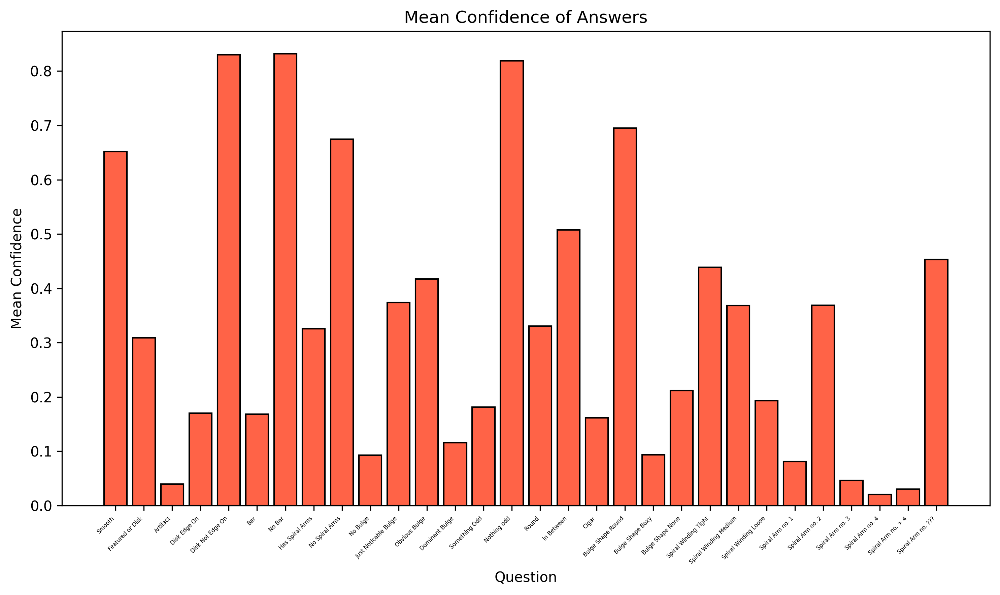

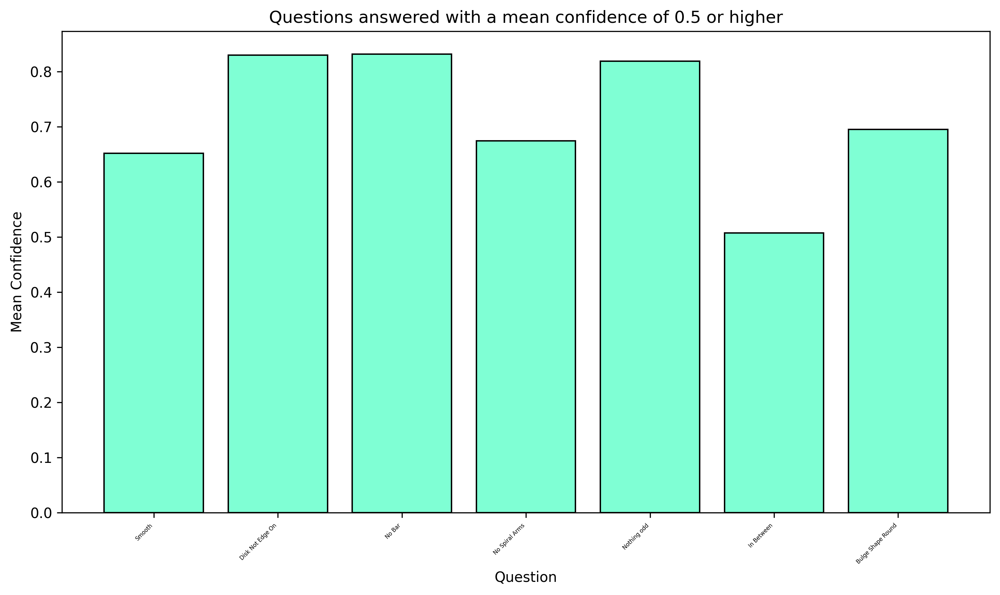

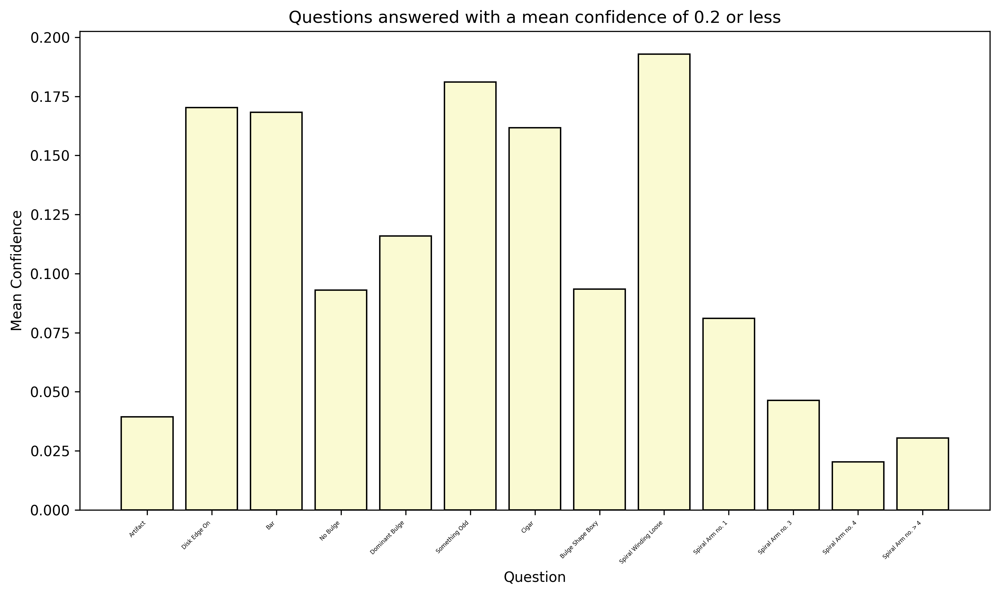

In [11]:
import pandas as pd
import os
import matplotlib.pyplot as plt


dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet' 
parquet_file_path = os.path.join(dataset_root, catalog_name)

# Read the Parquet file
df = pd.read_parquet(parquet_file_path)

mean_confidence_smooth_or_featured_smooth = df['smooth-or-featured-gz2_smooth_fraction'].mean()
mean_confidence_smooth_or_featured_featured = df['smooth-or-featured-gz2_featured-or-disk_fraction'].mean()
mean_confidence_smooth_or_featured_artifact = df['smooth-or-featured-gz2_artifact_fraction'].mean()
mean_confidence_disk_edge_on_yes = df['disk-edge-on-gz2_yes_fraction'].mean()
mean_confidence_disk_edge_on_no = df['disk-edge-on-gz2_no_fraction'].mean()
mean_confidence_bar_yes = df['bar-gz2_yes_fraction'].mean()
mean_confidence_bar_no = df['bar-gz2_no_fraction'].mean()
mean_confidence_has_spiral_arms_yes = df['has-spiral-arms-gz2_yes_fraction'].mean()
mean_confidence_has_spiral_arms_no = df['has-spiral-arms-gz2_no_fraction'].mean()
mean_confidence_bulge_size_no = df['bulge-size-gz2_no_fraction'].mean()
mean_confidence_bulge_size_just_noticable = df['bulge-size-gz2_just-noticeable_fraction'].mean()
mean_confidence_bulge_size_obvious = df['bulge-size-gz2_obvious_fraction'].mean()
mean_confidence_bulge_size_dominant = df['bulge-size-gz2_dominant_fraction'].mean()
mean_confidence_something_odd_yes = df['something-odd-gz2_yes_fraction'].mean()
mean_confidence_something_odd_no = df['something-odd-gz2_no_fraction'].mean()
mean_confidence_how_rounded_round = df['how-rounded-gz2_round_fraction'].mean()
mean_confidence_how_rounded_in_between = df['how-rounded-gz2_in-between_fraction'].mean()
mean_confidence_how_rounded_cigar = df['how-rounded-gz2_cigar_fraction'].mean()
mean_confidence_bulge_shape_round = df['bulge-shape-gz2_round_fraction'].mean()
mean_confidence_bulge_shape_boxy = df['bulge-shape-gz2_boxy_fraction'].mean()
mean_confidence_bulge_shape_no_bulge = df['bulge-shape-gz2_no-bulge_fraction'].mean()
mean_confidence_spiral_winding_tight = df['spiral-winding-gz2_tight_fraction'].mean()
mean_confidence_spiral_winding_medium = df['spiral-winding-gz2_medium_fraction'].mean()
mean_confidence_spiral_winding_loose = df['spiral-winding-gz2_loose_fraction'].mean()
mean_confidence_spiral_arm_count_1 = df['spiral-arm-count-gz2_1_fraction'].mean()
mean_confidence_spiral_arm_count_2 = df['spiral-arm-count-gz2_2_fraction'].mean()
mean_confidence_spiral_arm_count_3 = df['spiral-arm-count-gz2_3_fraction'].mean()
mean_confidence_spiral_arm_count_4 = df['spiral-arm-count-gz2_4_fraction'].mean()
mean_confidence_spiral_arm_count_more_than_4 = df['spiral-arm-count-gz2_more-than-4_fraction'].mean()
mean_confidence_spiral_arm_count_cant_tell = df['spiral-arm-count-gz2_cant-tell_fraction'].mean()

data = [mean_confidence_smooth_or_featured_smooth, mean_confidence_smooth_or_featured_featured, mean_confidence_smooth_or_featured_artifact,
        mean_confidence_disk_edge_on_yes, mean_confidence_disk_edge_on_no, mean_confidence_bar_yes, mean_confidence_bar_no, mean_confidence_has_spiral_arms_yes, 
        mean_confidence_has_spiral_arms_no, mean_confidence_bulge_size_no, mean_confidence_bulge_size_just_noticable, mean_confidence_bulge_size_obvious, 
        mean_confidence_bulge_size_dominant, mean_confidence_something_odd_yes, mean_confidence_something_odd_no, mean_confidence_how_rounded_round, 
        mean_confidence_how_rounded_in_between, mean_confidence_how_rounded_cigar, mean_confidence_bulge_shape_round, mean_confidence_bulge_shape_boxy, 
        mean_confidence_bulge_shape_no_bulge, mean_confidence_spiral_winding_tight, mean_confidence_spiral_winding_medium, mean_confidence_spiral_winding_loose, 
        mean_confidence_spiral_arm_count_1, mean_confidence_spiral_arm_count_2, mean_confidence_spiral_arm_count_3, mean_confidence_spiral_arm_count_4, 
        mean_confidence_spiral_arm_count_more_than_4, mean_confidence_spiral_arm_count_cant_tell]

class_names = ['Smooth', 'Featured or Disk', 'Artifact', 'Disk Edge On', 'Disk Not Edge On', 'Bar', 'No Bar', 'Has Spiral Arms', 'No Spiral Arms', 'No Bulge', 
               'Just Noticable Bulge', 'Obvious Bulge', 'Dominant Bulge', 'Something Odd', 'Nothing odd', 'Round', 'In Between', 
               'Cigar', 'Bulge Shape Round', 'Bulge Shape Boxy', 'Bulge Shape None', 'Spiral Winding Tight', 'Spiral Winding Medium', 'Spiral Winding Loose', 
               'Spiral Arm no. 1', 'Spiral Arm no. 2', 'Spiral Arm no. 3', 'Spiral Arm no. 4', 'Spiral Arm no. > 4', 'Spiral Arm no. ???']

#plot the mean confidence of answers as a bar chart

fig, ax = plt.subplots(1,1, figsize=(10,6), dpi = 300)

bars = ax.bar(class_names, data, color='tomato', edgecolor='black')

ax.set_ylabel('Mean Confidence')
ax.set_xlabel('Question')
ax.set_title('Mean Confidence of Answers')
plt.xticks(rotation=(45), ha='right', fontsize=4)
plt.tight_layout()
plt.show()

filtered_data = [d for d in data if d >= 0.5]
filtered_class_names = [cn for d, cn in zip(data, class_names) if d > 0.5]

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)

bars = ax.bar(filtered_class_names, filtered_data, color='aquamarine', edgecolor='black')

ax.set_ylabel('Mean Confidence')
ax.set_xlabel('Question')
ax.set_title('Questions answered with a mean confidence of 0.5 or higher')
plt.xticks(rotation=(45), ha='right', fontsize=4)
plt.tight_layout()
plt.show()

filtered_data = [d for d in data if d <= 0.2]
filtered_class_names = [cn for d, cn in zip(data, class_names) if d <= 0.2]

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)

bars = ax.bar(filtered_class_names, filtered_data, color='lightgoldenrodyellow', edgecolor='black')

ax.set_ylabel('Mean Confidence')
ax.set_xlabel('Question')
ax.set_title('Questions answered with a mean confidence of 0.2 or less')
plt.xticks(rotation=(45), ha='right', fontsize=4)
plt.tight_layout()
plt.show()



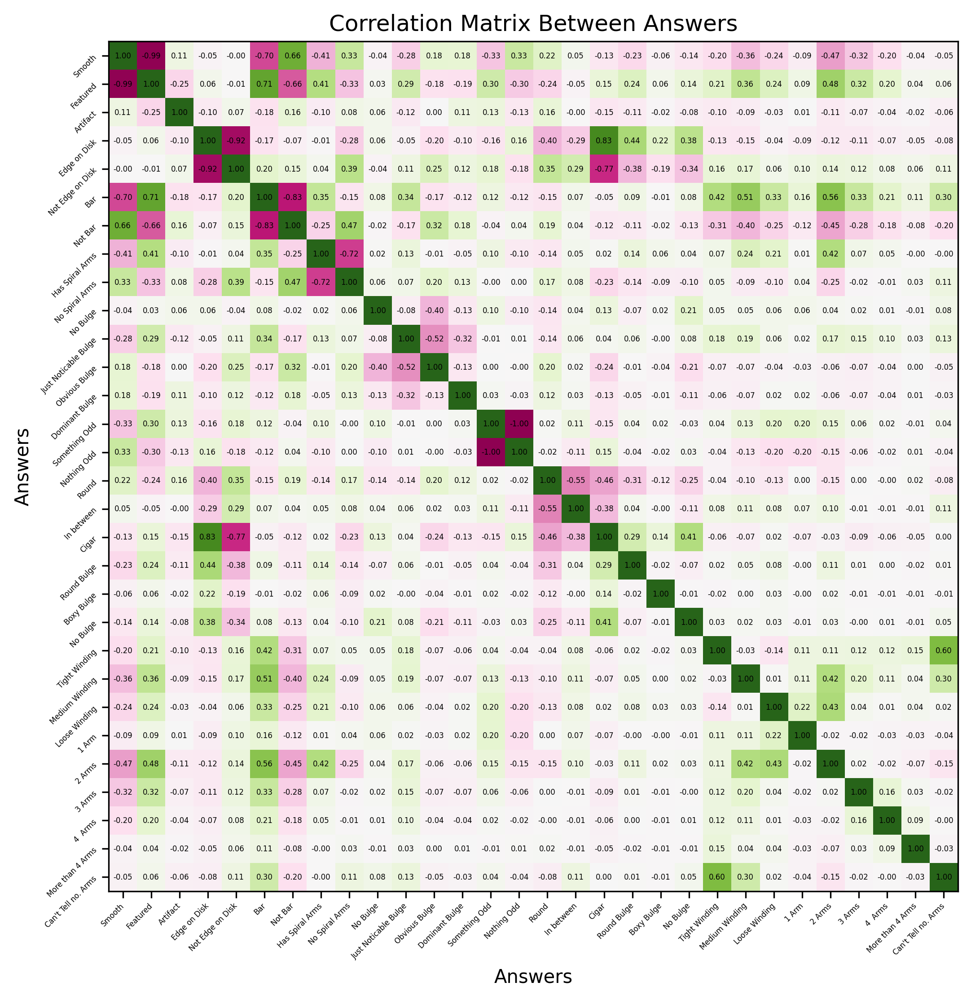

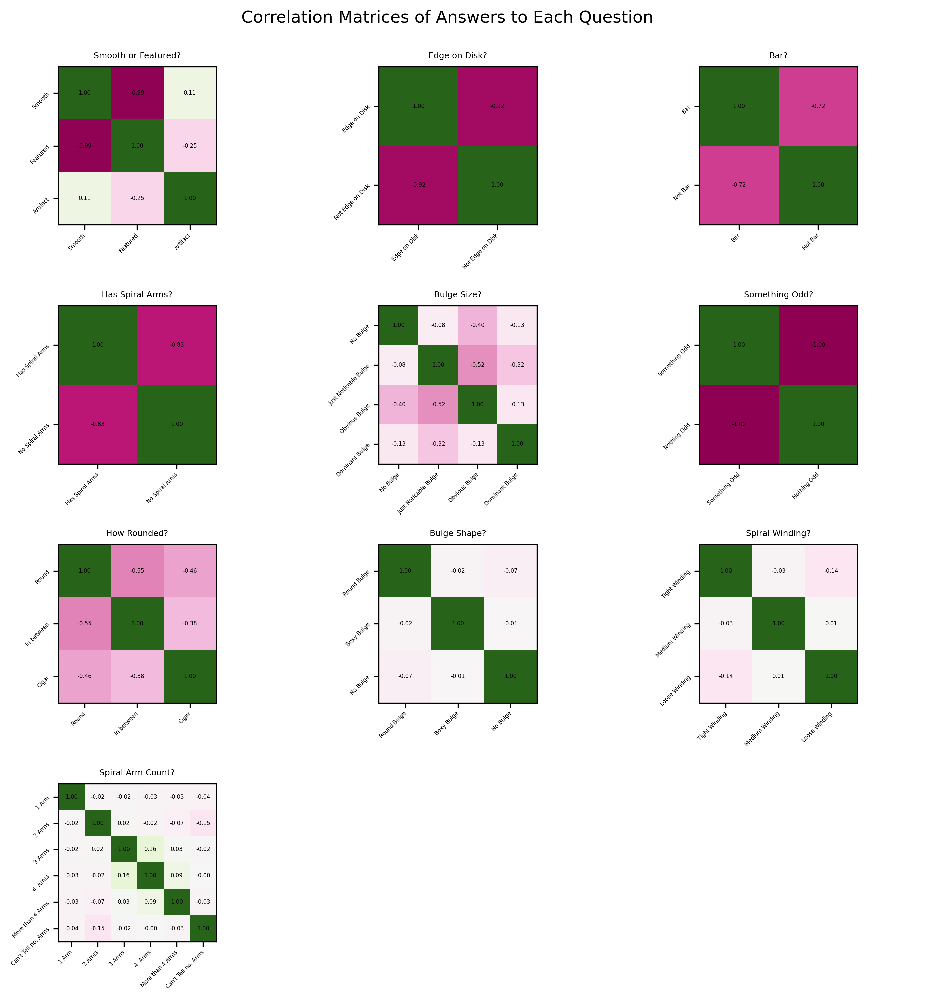

In [34]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet' 

parquet_file_path = os.path.join(dataset_root, catalog_name)

# Read the Parquet file
df = pd.read_parquet(parquet_file_path)

# plot a correlation matrix of the dataset

smooth_frac = df['smooth-or-featured-gz2_smooth_fraction']
disk_frac = df['smooth-or-featured-gz2_featured-or-disk_fraction']
artifact_frac = df['smooth-or-featured-gz2_artifact_fraction']
disk_edge_on_yes_frac = df['disk-edge-on-gz2_yes_fraction']
disk_edge_on_no_frac = df['disk-edge-on-gz2_no_fraction']
has_spiral_arms_yes_frac = df['has-spiral-arms-gz2_yes_fraction']
has_spiral_arms_no_frac = df['has-spiral-arms-gz2_no_fraction']
bar_yes_frac = df['bar-gz2_yes_fraction']
bar_no_frac = df['bar-gz2_no_fraction']
bulge_size_no_frac = df['bulge-size-gz2_no_fraction']
bulge_size_just_noticable_frac = df['bulge-size-gz2_just-noticeable_fraction']
bulge_size_obvious_frac = df['bulge-size-gz2_obvious_fraction']
bulge_size_dominant_frac = df['bulge-size-gz2_dominant_fraction']
something_odd_yes_frac = df['something-odd-gz2_yes_fraction']
something_odd_no_frac = df['something-odd-gz2_no_fraction']
how_rounded_round_frac = df['how-rounded-gz2_round_fraction']
how_rounded_in_between_frac = df['how-rounded-gz2_in-between_fraction']
how_rounded_cigar_frac = df['how-rounded-gz2_cigar_fraction']
bulge_shape_round_frac = df['bulge-shape-gz2_round_fraction']
bulge_shape_boxy_frac = df['bulge-shape-gz2_boxy_fraction']
bulge_shape_no_bulge_frac = df['bulge-shape-gz2_no-bulge_fraction']
spiral_winding_tight_frac = df['spiral-winding-gz2_tight_fraction']
spiral_winding_medium_frac = df['spiral-winding-gz2_medium_fraction']
spiral_winding_loose_frac = df['spiral-winding-gz2_loose_fraction']
spiral_arm_count_1_frac = df['spiral-arm-count-gz2_1_fraction']
spiral_arm_count_2_frac = df['spiral-arm-count-gz2_2_fraction']
spiral_arm_count_3_frac = df['spiral-arm-count-gz2_3_fraction']
spiral_arm_count_4_frac = df['spiral-arm-count-gz2_4_fraction']
spiral_arm_count_more_than_4_frac = df['spiral-arm-count-gz2_more-than-4_fraction']
spiral_arm_count_cant_tell_frac = df['spiral-arm-count-gz2_cant-tell_fraction']

data = [smooth_frac, disk_frac, artifact_frac, disk_edge_on_yes_frac, disk_edge_on_no_frac, has_spiral_arms_yes_frac, has_spiral_arms_no_frac, bar_yes_frac, bar_no_frac,
    bulge_size_no_frac, bulge_size_just_noticable_frac, bulge_size_obvious_frac, bulge_size_dominant_frac, something_odd_yes_frac, something_odd_no_frac, how_rounded_round_frac,
    how_rounded_in_between_frac, how_rounded_cigar_frac, bulge_shape_round_frac, bulge_shape_boxy_frac, bulge_shape_no_bulge_frac, spiral_winding_tight_frac, spiral_winding_medium_frac,
    spiral_winding_loose_frac, spiral_arm_count_1_frac, spiral_arm_count_2_frac, spiral_arm_count_3_frac, spiral_arm_count_4_frac, spiral_arm_count_more_than_4_frac, spiral_arm_count_cant_tell_frac]

# Remove any NaN values from the data
data = [np.nan_to_num(d) for d in data]

class_names = ['Smooth', 'Featured', 'Artifact', 'Edge on Disk', 'Not Edge on Disk', 'Bar', 'Not Bar', 'Has Spiral Arms', 'No Spiral Arms', 'No Bulge', 'Just Noticable Bulge',
        'Obvious Bulge', 'Dominant Bulge', 'Something Odd', 'Nothing Odd', 'Round', 'In between', 'Cigar', 'Round Bulge', 'Boxy Bulge', 'No Bulge', 'Tight Winding', 
        'Medium Winding', 'Loose Winding', '1 Arm', '2 Arms', '3 Arms', '4  Arms', 'More than 4 Arms', "Can't Tell no. Arms"]

questions = ['Smooth?', 'Featured?', 'Artifact?', 'Edge on Disk?', 'Not Edge on Disk?', 'Bar?', 'Not Bar?', 'Has Spiral Arms?', 'No Spiral Arms?', 
            'No Bulge?', 'Just Noticable Bulge?', 'Obvious Bulge?', 'Dominant Bulge?', 'Something Odd?', 'Nothing Odd?', 'Round?', 'In between?', 'Cigar?',
            'Round Bulge?', 'Boxy Bulge?', 'No Bulge?', 'Tight Winding?', 'Medium Winding?', 'Loose Winding?', '1 Arm?', '2 Arms?', '3 Arms?', '4  Arms?',
            'More than 4 Arms?', "Can't Tell no. Arms?"]

fig, ax = plt.subplots(1,1, figsize=(10,10), dpi = 300)

correlation_matrix = np.corrcoef(data)

for i in range(len(class_names)):
    for j in range(len(class_names)):
        ax.text(j, i, f"{correlation_matrix[i, j]:.2f}", ha="center", va="center", color="black", fontsize=4)

cax = ax.matshow(correlation_matrix, cmap='PiYG')

ax.set_xticks(np.arange(len(class_names)))
ax.set_yticks(np.arange(len(class_names)))

ax.set_xticklabels(class_names, rotation = 45, fontsize=4, ha = 'right', va = 'center', rotation_mode = 'anchor')
ax.xaxis.set_ticks_position('bottom')
ax.set_xticklabels(class_names, rotation = 45, fontsize=4, ha = 'right', va = 'center', rotation_mode = 'anchor')
ax.xaxis.set_ticks_position('bottom')
ax.set_yticklabels(class_names, rotation = 45, fontsize=4, ha = 'right', va = 'center', rotation_mode = 'anchor')

ax.set_xlabel('Answers')
ax.set_ylabel('Answers')
ax.set_title('Correlation Matrix Between Answers')

fig.tight_layout(pad=10.0)
plt.show()

groups = [
    [smooth_frac, disk_frac, artifact_frac],
    [disk_edge_on_yes_frac, disk_edge_on_no_frac],
    [bar_yes_frac, bar_no_frac],
    [has_spiral_arms_yes_frac, has_spiral_arms_no_frac],
    [bulge_size_no_frac, bulge_size_just_noticable_frac, bulge_size_obvious_frac, bulge_size_dominant_frac],
    [something_odd_yes_frac, something_odd_no_frac],
    [how_rounded_round_frac, how_rounded_in_between_frac, how_rounded_cigar_frac],
    [bulge_shape_round_frac, bulge_shape_boxy_frac, bulge_shape_no_bulge_frac],
    [spiral_winding_tight_frac, spiral_winding_medium_frac, spiral_winding_loose_frac],
    [spiral_arm_count_1_frac, spiral_arm_count_2_frac, spiral_arm_count_3_frac, spiral_arm_count_4_frac, spiral_arm_count_more_than_4_frac, spiral_arm_count_cant_tell_frac]
]

names = [
    ['Smooth', 'Featured', 'Artifact'],
    ['Edge on Disk', 'Not Edge on Disk'],
    ['Bar', 'Not Bar'],
    ['Has Spiral Arms', 'No Spiral Arms'],
    ['No Bulge', 'Just Noticable Bulge', 'Obvious Bulge', 'Dominant Bulge'],
    ['Something Odd', 'Nothing Odd'],
    ['Round', 'In between', 'Cigar'],
    ['Round Bulge', 'Boxy Bulge', 'No Bulge'],
    ['Tight Winding', 'Medium Winding', 'Loose Winding'],
    ['1 Arm', '2 Arms', '3 Arms', '4  Arms', 'More than 4 Arms', "Can't Tell no. Arms"]

]

titles = [
    'Smooth or Featured?',
    'Edge on Disk?',
    'Bar?',
    'Has Spiral Arms?',
    'Bulge Size?',
    'Something Odd?',
    'How Rounded?',
    'Bulge Shape?',
    'Spiral Winding?',
    'Spiral Arm Count?'
]
fig, ax = plt.subplots(4, 3, figsize=(10,10), dpi=300)

for idx, group in enumerate(groups):
    row = idx // 3
    col = idx % 3

    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    group = [np.nan_to_num(g) for g in group]
    ax[row, col].set_title(titles[idx], fontsize=6)

    corr_matrix = np.corrcoef(group)
    cax = ax[row, col].matshow(corr_matrix, cmap='PiYG', vmin=-1.0, vmax=1.0)

    for i in range(len(group)):
        for j in range(len(group)):
            ax[row, col].text(j, i, f"{corr_matrix[i, j]:.2f}", ha="center", va="center", color="black", fontsize=4)

    ax[row, col].set_xticks(np.arange(len(group)))
    ax[row, col].set_yticks(np.arange(len(group)))

    ax[row, col].set_xticklabels(names[idx], rotation=45, fontsize=4, ha='right', va='center', rotation_mode='anchor')
    ax[row, col].xaxis.set_ticks_position('bottom')

    ax[row, col].set_yticklabels(names[idx], rotation=45, fontsize=4, ha='right', va='center', rotation_mode='anchor')  

for idx in range(10, 12):
    ax.flatten()[idx].axis('off')


fig.suptitle('Correlation Matrices of Answers to Each Question', fontsize=12, ha = 'center', va = 'bottom')
fig.tight_layout()
plt.show()

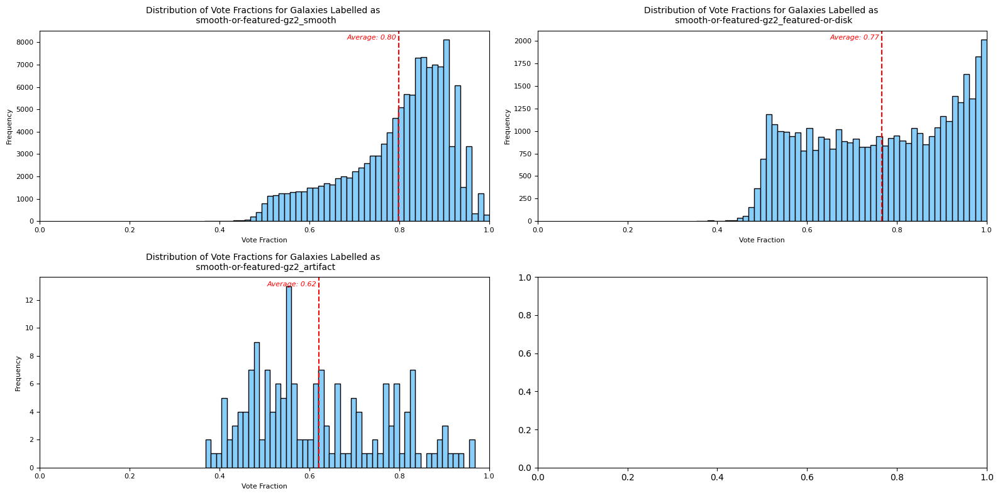

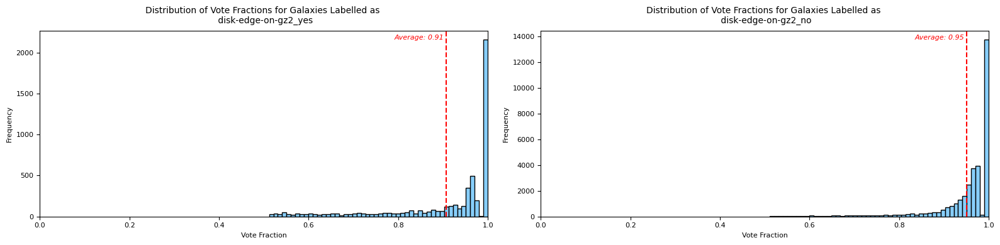

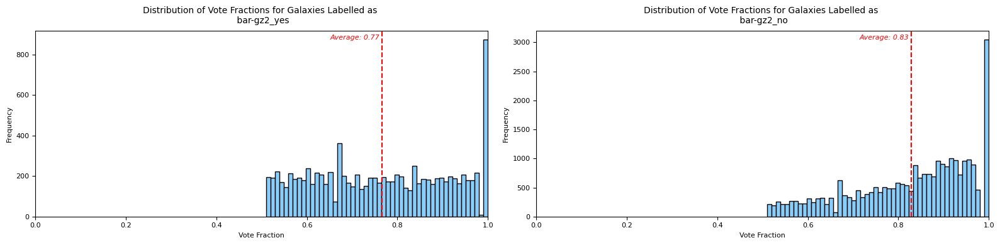

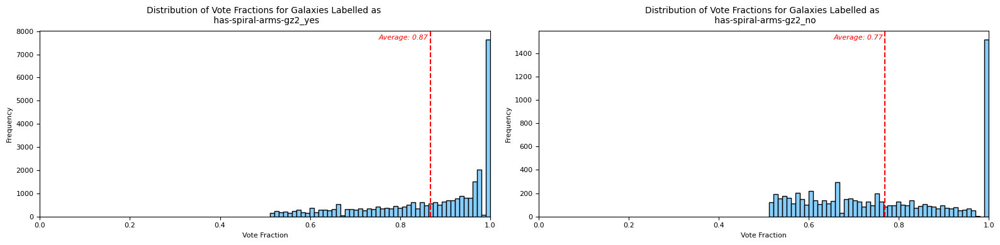

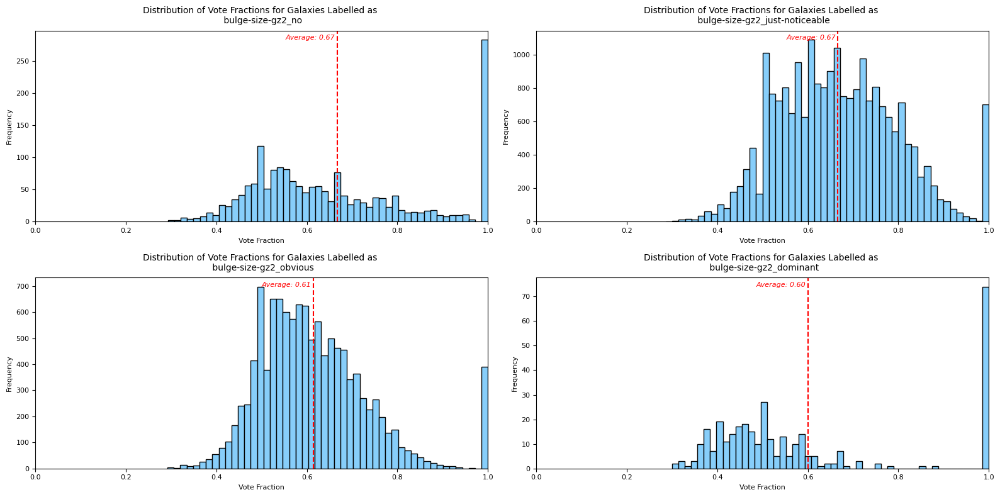

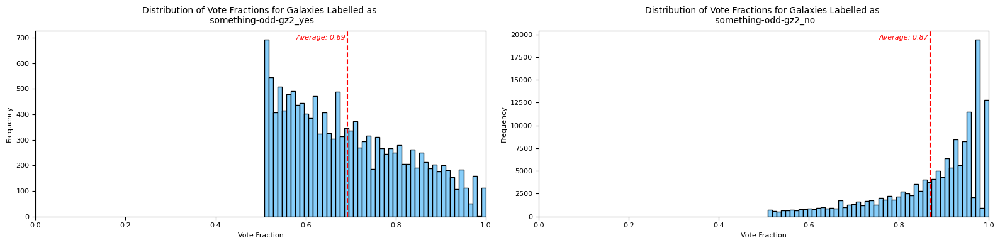

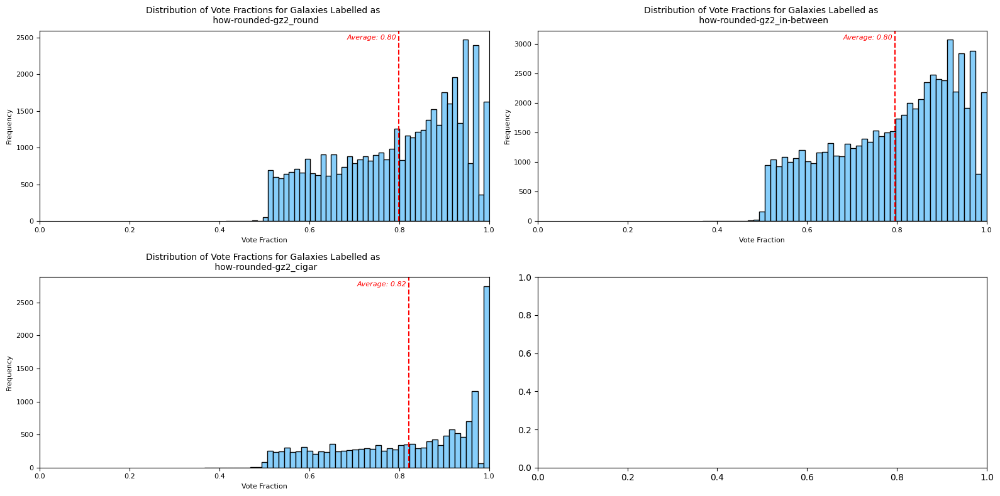

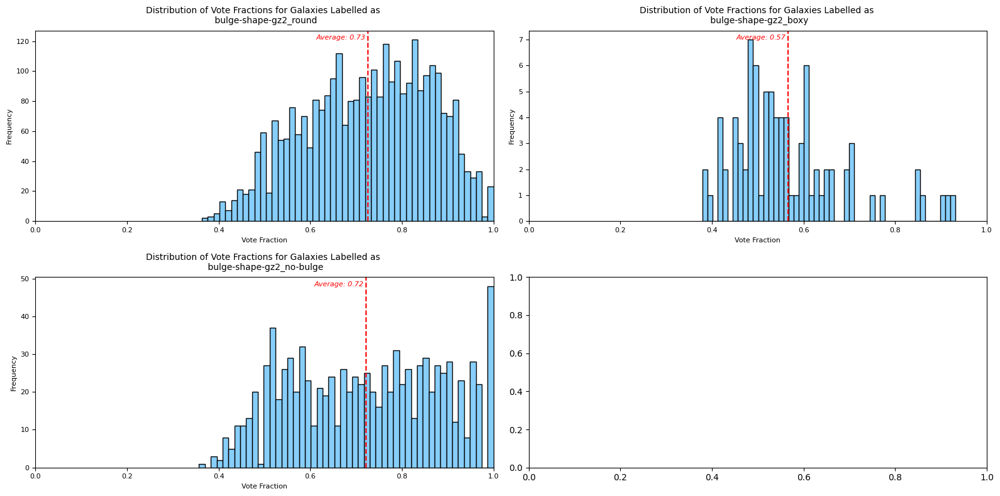

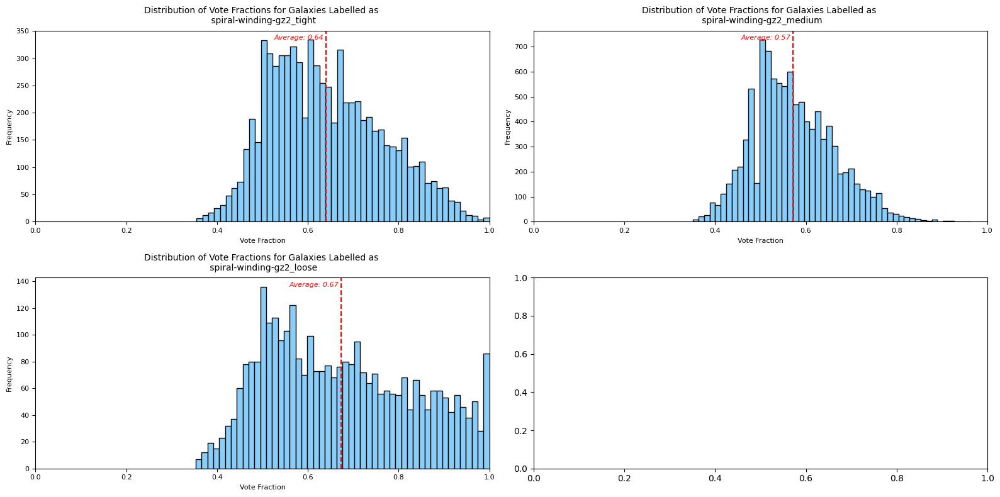

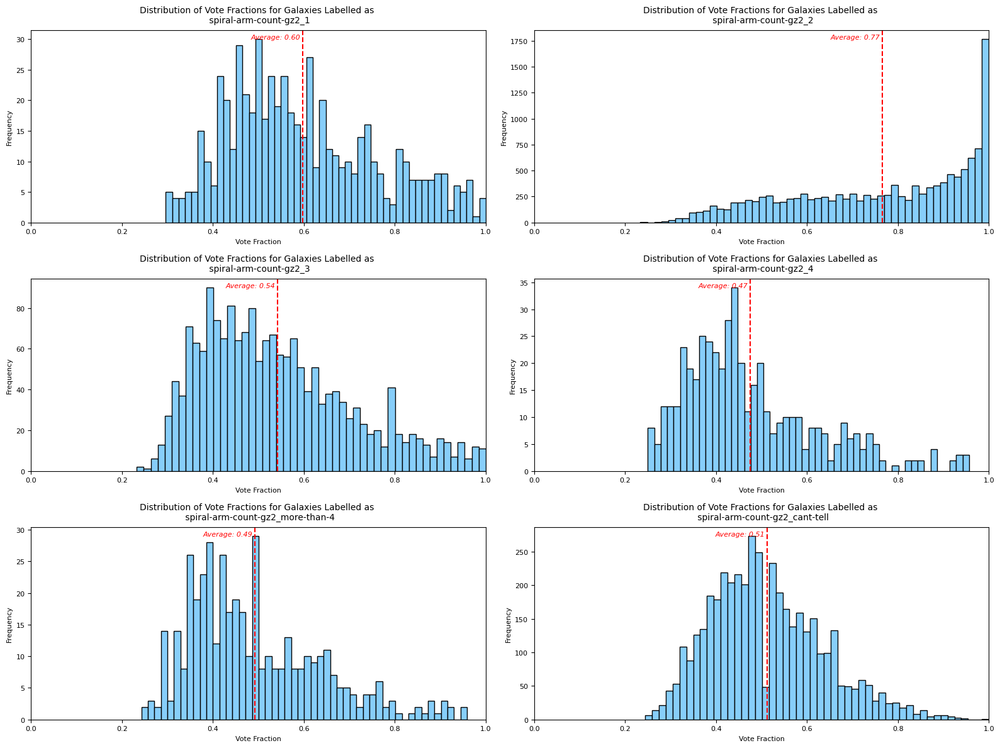

In [45]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet' 

parquet_file_path = os.path.join(dataset_root, catalog_name)

df = pd.read_parquet(parquet_file_path)

#find all the galaxies labelled as having smooth_semantic and find the average smooth_fraction 

def plot_label_dist(semantic, labels, fraction, df, colour='lightskyblue'):
    num_labels = len(labels)
    num_rows = int(np.ceil(num_labels / 2))
    num_cols = min(2, num_labels)

    fig, ax = plt.subplots(num_rows, num_cols, figsize=(8 * num_cols, 4 * num_rows), dpi=100)

    for idx, label in enumerate(labels):
        data = [df[fraction[idx]][i] for i in range(df['id_str'].size) if df[semantic][i] == label]

        row = idx // num_cols
        col = idx % num_cols

        if num_rows == 1:
            current_ax = ax[col]
        else:
            current_ax = ax[row, col]

        current_ax.hist(data, bins=50, color=colour, edgecolor='black')

        average_fraction = np.mean(data)

        current_ax.axvline(average_fraction, color='red', linestyle='--')
        current_ax.text(average_fraction, current_ax.get_ylim()[1], f'\n\nAverage: {average_fraction:.2f} ', color='red', ha='right', va='center', fontsize=8, fontstyle='oblique')

        current_ax.set_xlim(0, 1)
        current_ax.set_ylabel('Frequency', fontsize=8)
        current_ax.set_xlabel('Vote Fraction', fontsize=8)

        # Set the x and y tick label sizes
        current_ax.tick_params(axis='x', labelsize=8)
        current_ax.tick_params(axis='y', labelsize=8)

        current_ax.set_title(f'Distribution of Vote Fractions for Galaxies Labelled as \n {label}', fontsize=10, ha='center', va='bottom')
    
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    plt.tight_layout()
    plt.show()
    
semantic = 'smooth-or-featured-gz2_semantic'
labels = ['smooth-or-featured-gz2_smooth', 'smooth-or-featured-gz2_featured-or-disk', 'smooth-or-featured-gz2_artifact']
fraction = ['smooth-or-featured-gz2_smooth_fraction', 'smooth-or-featured-gz2_featured-or-disk_fraction', 'smooth-or-featured-gz2_artifact_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'disk-edge-on-gz2_semantic'
labels = ['disk-edge-on-gz2_yes', 'disk-edge-on-gz2_no']
fraction = ['disk-edge-on-gz2_yes_fraction', 'disk-edge-on-gz2_no_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'bar-gz2_semantic'
labels = ['bar-gz2_yes', 'bar-gz2_no']
fraction = ['bar-gz2_yes_fraction', 'bar-gz2_no_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'has-spiral-arms-gz2_semantic'
labels = ['has-spiral-arms-gz2_yes', 'has-spiral-arms-gz2_no']
fraction = ['has-spiral-arms-gz2_yes_fraction', 'has-spiral-arms-gz2_no_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'bulge-size-gz2_semantic'
labels = ['bulge-size-gz2_no', 'bulge-size-gz2_just-noticeable', 'bulge-size-gz2_obvious', 'bulge-size-gz2_dominant']
fraction = ['bulge-size-gz2_no_fraction', 'bulge-size-gz2_just-noticeable_fraction', 'bulge-size-gz2_obvious_fraction', 'bulge-size-gz2_dominant_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'something-odd-gz2_semantic'
labels = ['something-odd-gz2_yes', 'something-odd-gz2_no']
fraction = ['something-odd-gz2_yes_fraction', 'something-odd-gz2_no_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'how-rounded-gz2_semantic'
labels = ['how-rounded-gz2_round', 'how-rounded-gz2_in-between', 'how-rounded-gz2_cigar']
fraction = ['how-rounded-gz2_round_fraction', 'how-rounded-gz2_in-between_fraction', 'how-rounded-gz2_cigar_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'bulge-shape-gz2_semantic'
labels = ['bulge-shape-gz2_round', 'bulge-shape-gz2_boxy', 'bulge-shape-gz2_no-bulge']
fraction = ['bulge-shape-gz2_round_fraction', 'bulge-shape-gz2_boxy_fraction', 'bulge-shape-gz2_no-bulge_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'spiral-winding-gz2_semantic'
labels = ['spiral-winding-gz2_tight', 'spiral-winding-gz2_medium', 'spiral-winding-gz2_loose']
fraction = ['spiral-winding-gz2_tight_fraction', 'spiral-winding-gz2_medium_fraction', 'spiral-winding-gz2_loose_fraction']
plot_label_dist(semantic, labels, fraction, df)

semantic = 'spiral-arm-count-gz2_semantic'
labels = ['spiral-arm-count-gz2_1', 'spiral-arm-count-gz2_2', 'spiral-arm-count-gz2_3', 'spiral-arm-count-gz2_4', 'spiral-arm-count-gz2_more-than-4', 'spiral-arm-count-gz2_cant-tell']
fraction = ['spiral-arm-count-gz2_1_fraction', 'spiral-arm-count-gz2_2_fraction', 'spiral-arm-count-gz2_3_fraction', 'spiral-arm-count-gz2_4_fraction', 'spiral-arm-count-gz2_more-than-4_fraction', 'spiral-arm-count-gz2_cant-tell_fraction']
plot_label_dist(semantic, labels, fraction, df)


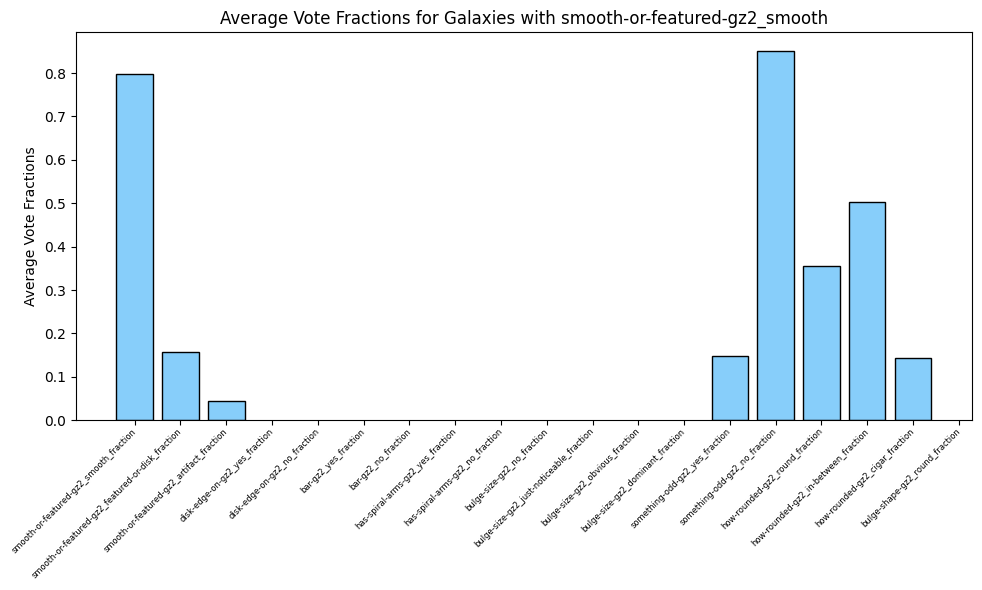

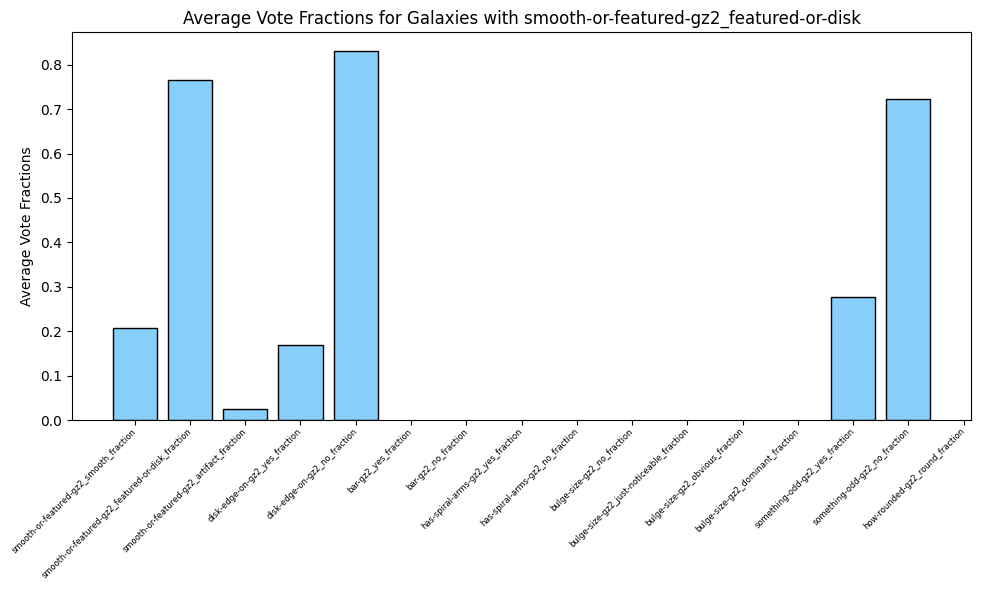

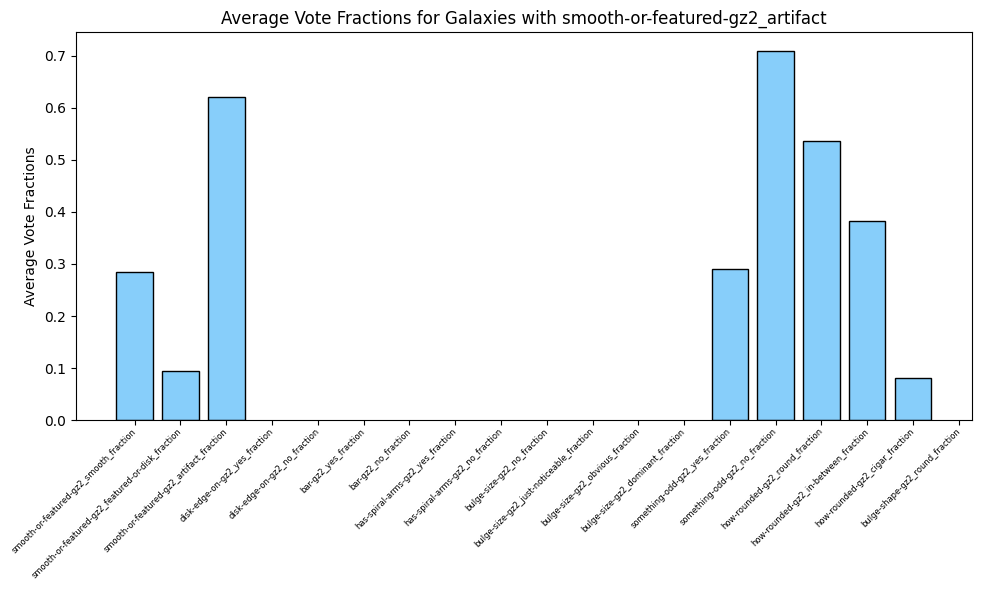

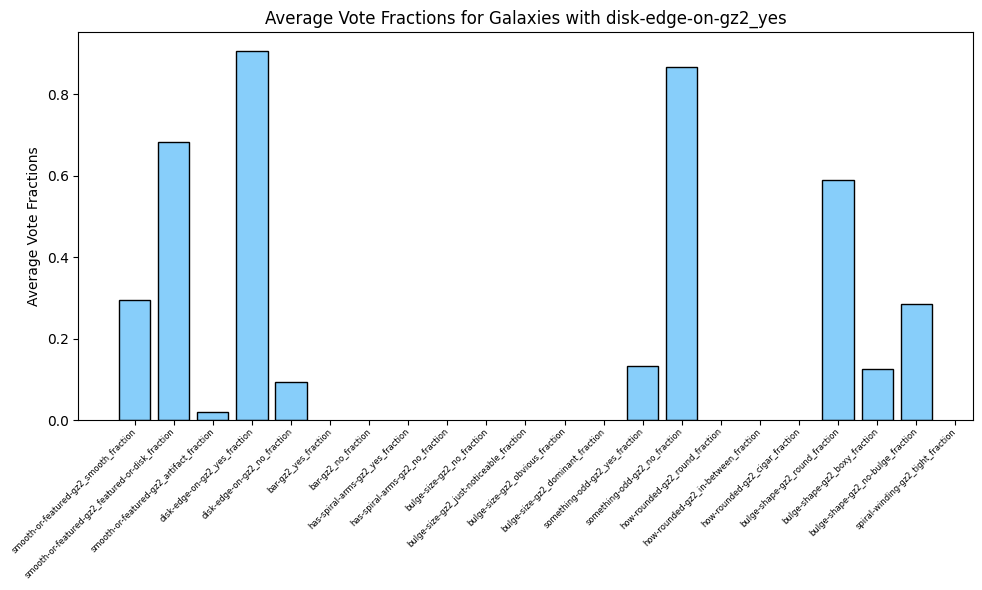

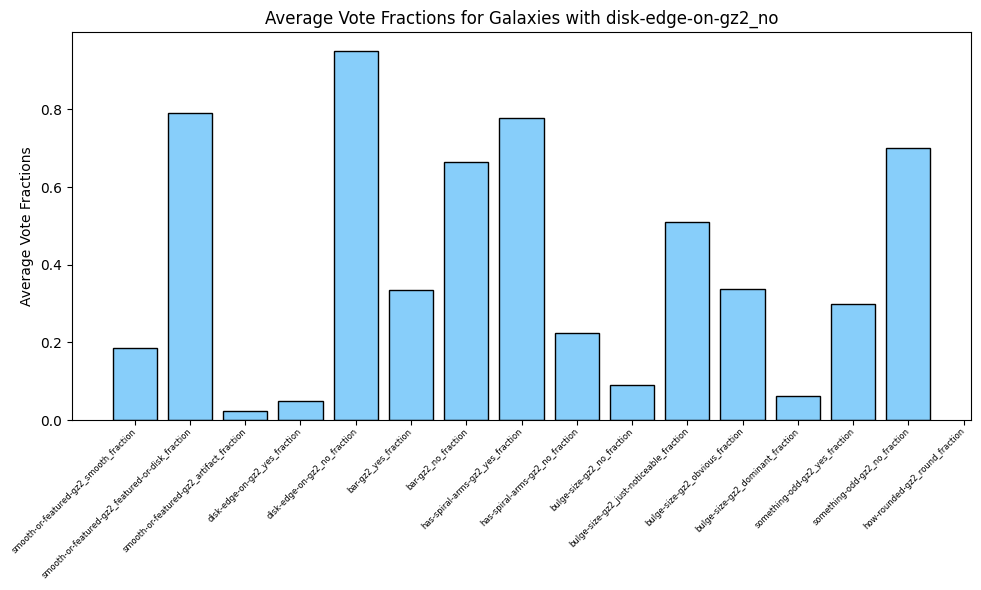

...

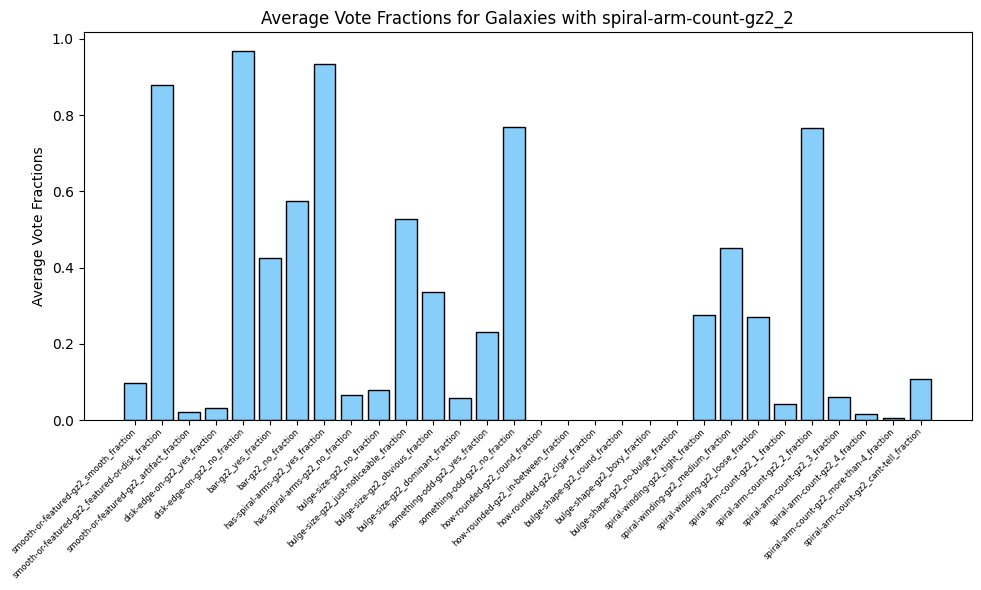

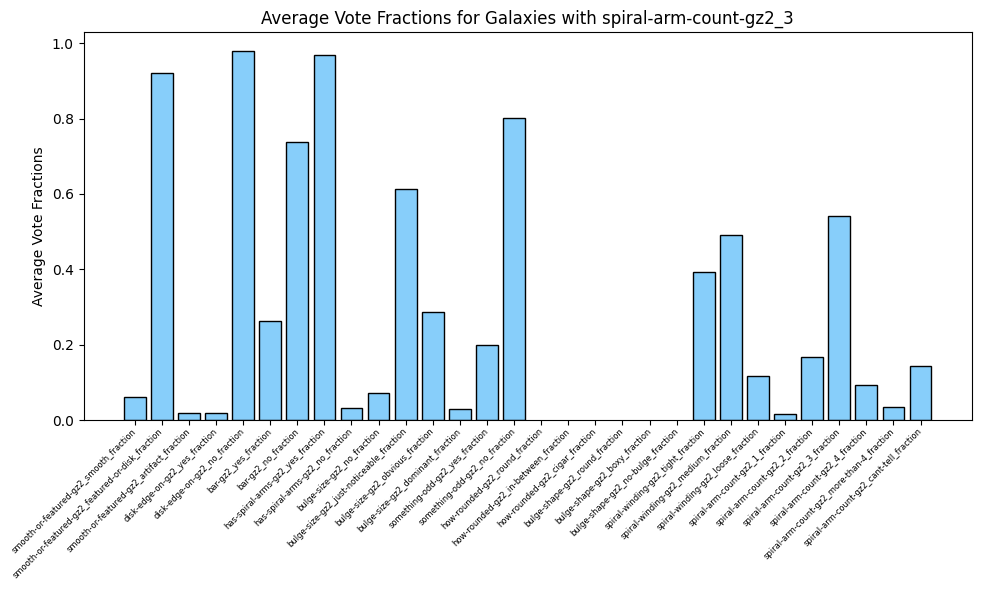

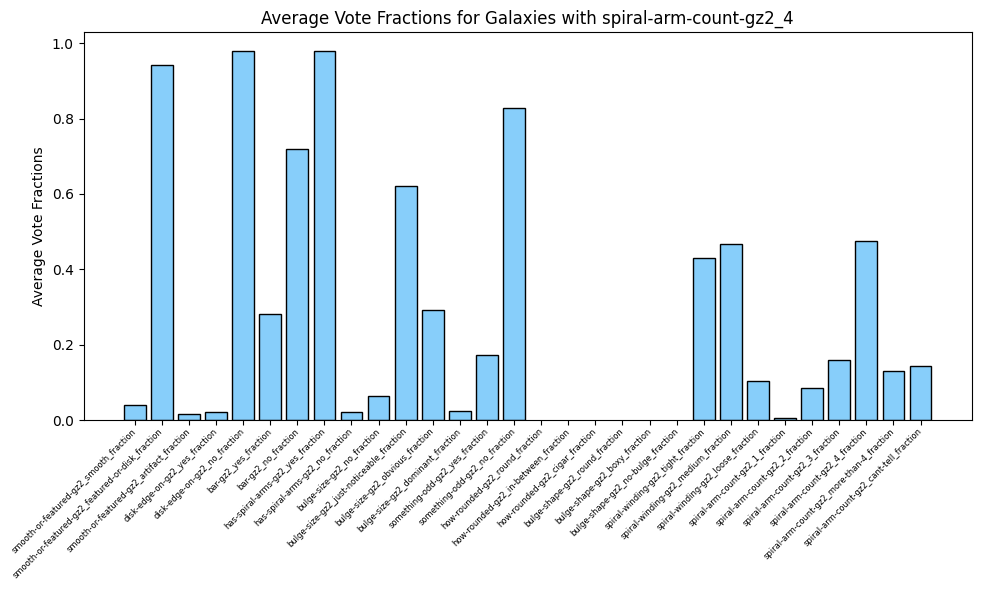

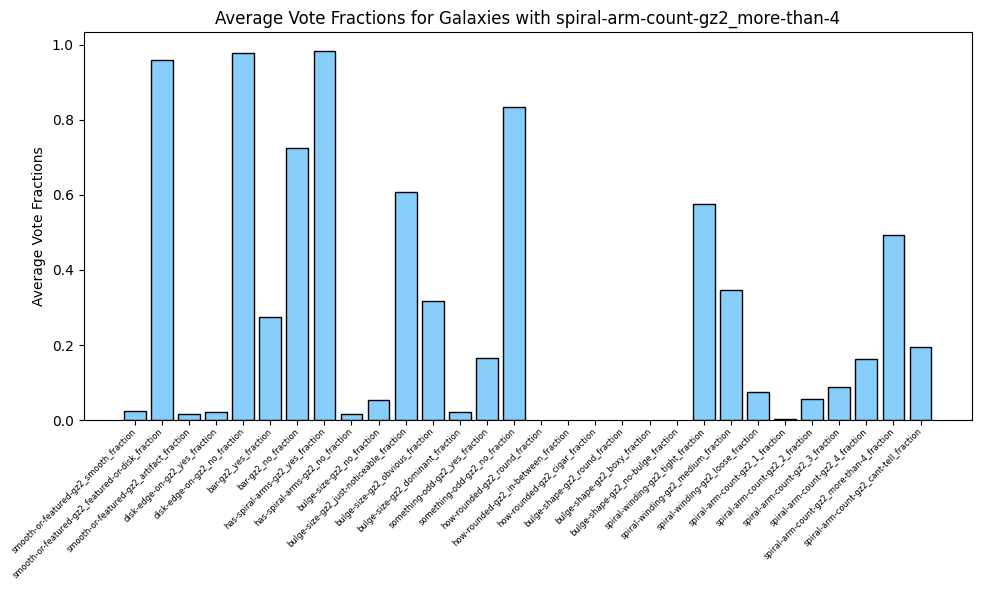

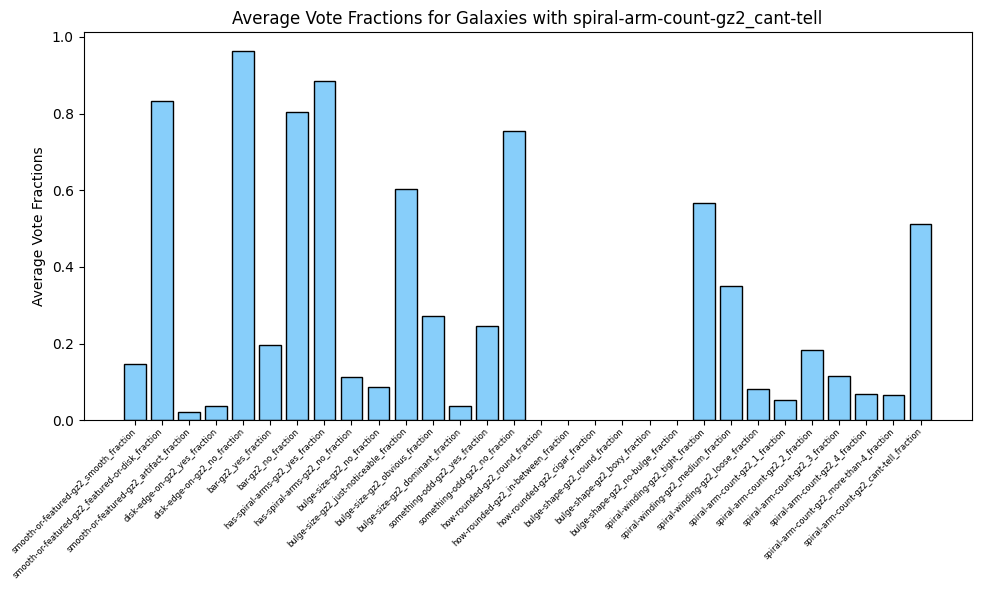

In [125]:
# TODO: Go through every galaxy image, find its corresponding semantic labels, then find the vote fractions for each semantic label for the image.
# i.e smooth-or-featured-gz2_semantic : smooth-or-featured-gz2-smooth - label => smooth-or-featured-smooth_fraction - vote fraction ect
# Then plot the average the of vote fractions for each semantic label

# do the same again but for the 2nd and 3rd most voted label for each galaxy image (or for labels above a certain threshold)
# this will show the most commonly mixed up labels?

#IDEA: correlation matrix between semantic labels and vote fractions for each label????

#plot the highest vote fraction for each semantic label and the corresponding image 
#find the average image of the dataset to help determine cropping bounding box

import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet' 

parquet_file_path = os.path.join(dataset_root, catalog_name)

df = pd.read_parquet(parquet_file_path)

semantic_labels = ['smooth-or-featured-gz2_semantic', 'disk-edge-on-gz2_semantic', 'bar-gz2_semantic', 'has-spiral-arms-gz2_semantic', 'bulge-size-gz2_semantic', 
                   'something-odd-gz2_semantic', 'how-rounded-gz2_semantic', 'bulge-shape-gz2_semantic', 'spiral-winding-gz2_semantic', 'spiral-arm-count-gz2_semantic']

feature_to_id = {
    'smooth-or-featured-gz2_smooth': [], 
    'smooth-or-featured-gz2_featured-or-disk': [],
    'smooth-or-featured-gz2_artifact': [],
    'disk-edge-on-gz2_yes': [],
    'disk-edge-on-gz2_no': [],
    'bar-gz2_yes': [],
    'bar-gz2_no': [],
    'has-spiral-arms-gz2_yes': [],
    'has-spiral-arms-gz2_no': [],
    'bulge-size-gz2_no': [],
    'bulge-size-gz2_just-noticeable': [],
    'bulge-size-gz2_obvious': [],
    'bulge-size-gz2_dominant': [],
    'something-odd-gz2_yes': [],
    'something-odd-gz2_no': [],
    'how-rounded-gz2_round': [],
    'how-rounded-gz2_in-between': [],
    'how-rounded-gz2_cigar': [],
    'bulge-shape-gz2_round': [],
    'bulge-shape-gz2_boxy': [],
    'bulge-shape-gz2_no-bulge': [],
    'spiral-winding-gz2_tight': [],
    'spiral-winding-gz2_medium': [],
    'spiral-winding-gz2_loose': [],
    'spiral-arm-count-gz2_1': [],
    'spiral-arm-count-gz2_2': [],
    'spiral-arm-count-gz2_3': [],
    'spiral-arm-count-gz2_4': [],
    'spiral-arm-count-gz2_more-than-4': [],
    'spiral-arm-count-gz2_cant-tell': [],
    'deadlock': [],
    '-': []
}

keys = [
    'smooth-or-featured-gz2_smooth_fraction',
    'smooth-or-featured-gz2_featured-or-disk_fraction',
    'smooth-or-featured-gz2_artifact_fraction',
    'disk-edge-on-gz2_yes_fraction',
    'disk-edge-on-gz2_no_fraction',
    'bar-gz2_yes_fraction',
    'bar-gz2_no_fraction',
    'has-spiral-arms-gz2_yes_fraction',
    'has-spiral-arms-gz2_no_fraction',
    'bulge-size-gz2_no_fraction',
    'bulge-size-gz2_just-noticeable_fraction',
    'bulge-size-gz2_obvious_fraction',
    'bulge-size-gz2_dominant_fraction',
    'something-odd-gz2_yes_fraction',
    'something-odd-gz2_no_fraction',
    'how-rounded-gz2_round_fraction',
    'how-rounded-gz2_in-between_fraction',
    'how-rounded-gz2_cigar_fraction',
    'bulge-shape-gz2_round_fraction',
    'bulge-shape-gz2_boxy_fraction',
    'bulge-shape-gz2_no-bulge_fraction',
    'spiral-winding-gz2_tight_fraction',
    'spiral-winding-gz2_medium_fraction',
    'spiral-winding-gz2_loose_fraction',
    'spiral-arm-count-gz2_1_fraction',
    'spiral-arm-count-gz2_2_fraction',
    'spiral-arm-count-gz2_3_fraction',
    'spiral-arm-count-gz2_4_fraction',
    'spiral-arm-count-gz2_more-than-4_fraction',
    'spiral-arm-count-gz2_cant-tell_fraction',
]

def plot_label_dist(semantic_labels, df, color='lightskyblue'):
    for semantic_label in semantic_labels:
        feature_to_id[semantic_label] = []  

    for idx, _ in enumerate(df['id_str']):
        id = df['id_str'][idx]
        for semantic_label in semantic_labels:
            feature_value = df[semantic_label][idx]
            feature_to_id[feature_value].append(id)

    for feature, galaxies in feature_to_id.items():
        if len(galaxies) == 0:
            continue
        if feature == 'deadlock' or feature == '-':
            return
        fractions = {key: [] for key in keys}

        for galaxy_id in galaxies:
            galaxy_idx = df.index[df['id_str'] == galaxy_id][0]
            for k in keys:
                if df[k].loc[galaxy_idx] is None:
                    fractions[k].append(0)
                else:
                    fractions[k].append(df[k].loc[galaxy_idx])
                    
        avg_fractions = {k: np.mean(v) for k, v in fractions.items()}

        plt.figure(figsize=(10, 6))
        plt.bar(avg_fractions.keys(), avg_fractions.values(), color=color, edgecolor='black')
        plt.ylabel('Average Vote Fractions')
        plt.title(f'Average Vote Fractions for Galaxies with {feature}')
    
        plt.xticks(rotation=45, fontsize=6, ha='right', va='center', rotation_mode='anchor')
        plt.tight_layout()
        plt.show()
        
plot_label_dist(semantic_labels, df, color='lightskyblue')


21


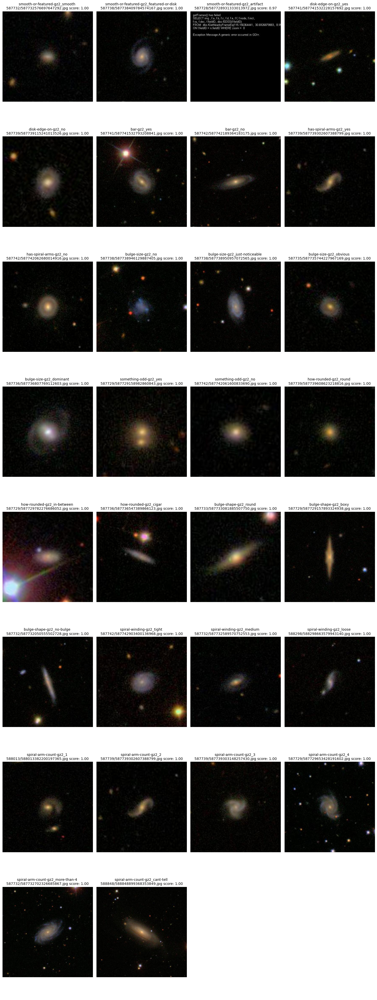

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

"""	
The Galaxies with the higest vote confidence for a given feature. 
The dataset was filtered such that galaxies with fewer than (the average number of votes plus 2 standard deviations) 21 votes
for a given feature were excluded to prevent galaxies with comically small total votes, and therefore inaccurate classifications
from dominating the dataset.
"""

dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet' 

parquet_file_path = os.path.join(dataset_root, catalog_name)

df = pd.read_parquet(parquet_file_path)

features = {
    'smooth-or-featured-gz2_smooth_fraction': [], 
    'smooth-or-featured-gz2_featured-or-disk_fraction': [],
    'smooth-or-featured-gz2_artifact_fraction': [],
    'disk-edge-on-gz2_yes_fraction': [],
    'disk-edge-on-gz2_no_fraction': [],
    'bar-gz2_yes_fraction': [],
    'bar-gz2_no_fraction': [],
    'has-spiral-arms-gz2_yes_fraction': [],
    'has-spiral-arms-gz2_no_fraction': [],
    'bulge-size-gz2_no_fraction': [],
    'bulge-size-gz2_just-noticeable_fraction': [],
    'bulge-size-gz2_obvious_fraction': [],
    'bulge-size-gz2_dominant_fraction': [],
    'something-odd-gz2_yes_fraction': [],
    'something-odd-gz2_no_fraction': [],
    'how-rounded-gz2_round_fraction': [],
    'how-rounded-gz2_in-between_fraction': [],
    'how-rounded-gz2_cigar_fraction': [],
    'bulge-shape-gz2_round_fraction': [],
    'bulge-shape-gz2_boxy_fraction': [],
    'bulge-shape-gz2_no-bulge_fraction': [],
    'spiral-winding-gz2_tight_fraction': [],
    'spiral-winding-gz2_medium_fraction': [],
    'spiral-winding-gz2_loose_fraction': [],
    'spiral-arm-count-gz2_1_fraction': [],
    'spiral-arm-count-gz2_2_fraction': [],
    'spiral-arm-count-gz2_3_fraction': [],
    'spiral-arm-count-gz2_4_fraction': [],
    'spiral-arm-count-gz2_more-than-4_fraction': [],
    'spiral-arm-count-gz2_cant-tell_fraction': [],
}

keys = [
    'smooth-or-featured-gz2_smooth_fraction',
    'smooth-or-featured-gz2_featured-or-disk_fraction',
    'smooth-or-featured-gz2_artifact_fraction',
    'disk-edge-on-gz2_yes_fraction',
    'disk-edge-on-gz2_no_fraction',
    'bar-gz2_yes_fraction',
    'bar-gz2_no_fraction',
    'has-spiral-arms-gz2_yes_fraction',
    'has-spiral-arms-gz2_no_fraction',
    'bulge-size-gz2_no_fraction',
    'bulge-size-gz2_just-noticeable_fraction',
    'bulge-size-gz2_obvious_fraction',
    'bulge-size-gz2_dominant_fraction',
    'something-odd-gz2_yes_fraction',
    'something-odd-gz2_no_fraction',
    'how-rounded-gz2_round_fraction',
    'how-rounded-gz2_in-between_fraction',
    'how-rounded-gz2_cigar_fraction',
    'bulge-shape-gz2_round_fraction',
    'bulge-shape-gz2_boxy_fraction',
    'bulge-shape-gz2_no-bulge_fraction',
    'spiral-winding-gz2_tight_fraction',
    'spiral-winding-gz2_medium_fraction',
    'spiral-winding-gz2_loose_fraction',
    'spiral-arm-count-gz2_1_fraction',
    'spiral-arm-count-gz2_2_fraction',
    'spiral-arm-count-gz2_3_fraction',
    'spiral-arm-count-gz2_4_fraction',
    'spiral-arm-count-gz2_more-than-4_fraction',
    'spiral-arm-count-gz2_cant-tell_fraction',
]

questions = [
    'smooth-or-featured-gz2_smooth',
    'smooth-or-featured-gz2_featured-or-disk',
    'smooth-or-featured-gz2_artifact',
    'disk-edge-on-gz2_yes',
    'disk-edge-on-gz2_no',
    'bar-gz2_yes',
    'bar-gz2_no',
    'has-spiral-arms-gz2_yes',
    'has-spiral-arms-gz2_no',
    'bulge-size-gz2_no',
    'bulge-size-gz2_just-noticeable',
    'bulge-size-gz2_obvious',
    'bulge-size-gz2_dominant',
    'something-odd-gz2_yes',
    'something-odd-gz2_no',
    'how-rounded-gz2_round',
    'how-rounded-gz2_in-between',
    'how-rounded-gz2_cigar',
    'bulge-shape-gz2_round',
    'bulge-shape-gz2_boxy',
    'bulge-shape-gz2_no-bulge',
    'spiral-winding-gz2_tight',
    'spiral-winding-gz2_medium',
    'spiral-winding-gz2_loose',
    'spiral-arm-count-gz2_1',
    'spiral-arm-count-gz2_2',
    'spiral-arm-count-gz2_3',
    'spiral-arm-count-gz2_4',
    'spiral-arm-count-gz2_more-than-4',
    'spiral-arm-count-gz2_cant-tell',
]

# Find the image with the highest vote fraction for each feature and plot it

num_features = len(features)
num_cols = 4
num_rows = num_features // num_cols + (num_features % num_cols > 0)

average_votes = {}

for question in questions:
    avg_votes_per_question = df[question].mean()
    average_votes[question] = avg_votes_per_question

overall_average_votes = sum(average_votes.values()) / len(questions)

VOTESMIN = int(round(overall_average_votes) + 2 * np.std(list(average_votes.values()))) 
print(VOTESMIN)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, (question, ax) in enumerate(zip(questions, axes.flatten())):
    # Get the corresponding key for the question
    key = keys[questions.index(question)]
    
    # Filter dataframe to exclude rows with fewer votes than VOTESMIN for the current question
    df_filtered = df[df[question] > VOTESMIN]
    
    if not df_filtered.empty:
        # Find the row with the highest vote fraction for the current question
        max_vote_fraction_row = df_filtered[df_filtered[key] == df_filtered[key].max()]
        
        image_filename = max_vote_fraction_row['filename'].values[0]
        image_root = 'images/'
        image_subfolder = max_vote_fraction_row['subfolder'].values[0] + r'/'
        image_path = os.path.join(dataset_root, image_root, image_subfolder, image_filename)
        question_label = max_vote_fraction_row[question].values[0]

        img = plt.imread(image_path)
        ax.imshow(img)
        ax.set_title(f'{question} \n{os.path.join(image_subfolder, image_filename)} score: {(df[key].max()):.2f}', fontsize=10)
        ax.axis('off')
    else:
        # If no images meet the minimum vote requirement, display a placeholder
        ax.text(0.5, 0.5, 'No images meet\nminimum vote count', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        ax.axis('off')

# Hide empty subplots
for j in range(i + 1, num_rows * num_cols):
    axes.flatten()[j].axis('off')

plt.tight_layout()
plt.show()

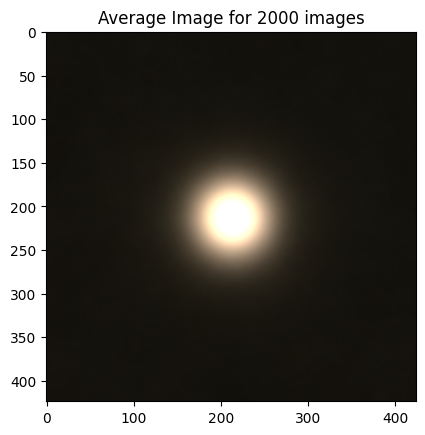

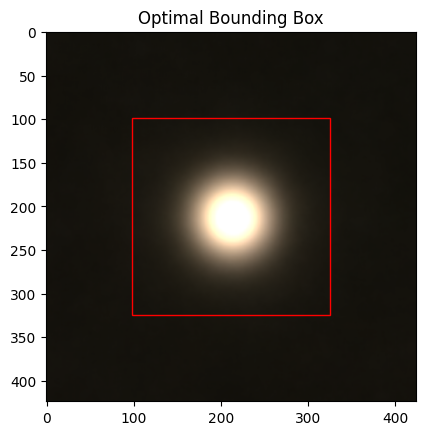

In [10]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import time as time
import os

dataset_root = 'galaxyzoo2-dataset/'
catalog_name = r'gz2_train_catalog.parquet'

parquet_file_path = os.path.join(dataset_root, catalog_name)

df = pd.read_parquet(parquet_file_path)

average_image = np.zeros((424, 424, 3)) 
num_images = 2000

for idx, _ in enumerate(df['id_str']):
    
    if idx == num_images:
        break
    else:
        id = df['id_str'][idx]
        image_filename = df['filename'][idx]
        image_root = 'images/'
        image_subfolder = df['subfolder'][idx] + r'/'
        
        image_path = os.path.join(dataset_root, image_root, image_subfolder, image_filename)
        image = plt.imread(image_path)
        
        average_image += image
    
average_image /= len(df)
average_image = np.clip(average_image, 0, 1) # Ensure the average image is in the range [0, 1] for matplotlib


plt.imshow(average_image)
plt.title(f'Average Image for {num_images} images')
plt.show()

def loss_function(image, bbox, threshold):
    """
    Loss function to minimize the distance of the corners from the brightest pixels.
    """
    x1, y1, x2, y2 = bbox
    brightest_pixels = np.where(image >= threshold)
    
    for x, y in zip(brightest_pixels[1], brightest_pixels[0]):
        loss = np.sqrt((x - x1)**2 + (y - y1)**2) + np.sqrt((x - x2)**2 + (y - y2)**2)
        
    return loss

#use the brightness loss function to find the bounding box for the average image
def find_bounding_box(image, max_iterations, threshold, step):
    """
    Find the bounding box for the image such that the brightness loss
    is less than max_loss.
    """
    iteration = 0
    bbox = [0, 0, image.shape[1] - 1, image.shape[0] - 1] 
    loss = loss_function(image, bbox, threshold)
    prev_loss = loss_function(image, bbox, threshold)
    
    while iteration < max_iterations:
        
        # If the bounding box corners are on a pixel with a brightness greater than or equal the threshold increase the bounding box size
        if np.any(image[bbox[1], bbox[0]] >= threshold) or np.any(image[bbox[1], bbox[2]] >= threshold) or np.any(image[bbox[3], bbox[0]] >= threshold) or np.any(image[bbox[3], bbox[2]] >= threshold): 
            bbox[0] = max(0, int(bbox[0] - step))
            bbox[1] = max(0, int(bbox[1] - step))
            bbox[2] = min(image.shape[1] - 1, bbox[2] + step)
            bbox[3] = min(image.shape[0] - 1, bbox[3] + step)
            
            # Ensure bounding box coordinates stay within image bounds
            bbox[2] = max(bbox[0], bbox[2])  
            bbox[3] = max(bbox[1], bbox[3])  
            
            loss = loss_function(image, bbox, threshold)
            prev_loss = loss
        
        # decreaase the bounding box size to minimize the loss, the distance from the brightest pixels    
        else:
            bbox[0] = max(0, int(bbox[0] + step))
            bbox[1] = max(0, int(bbox[1] + step))
            bbox[2] = min(image.shape[1] - 1, bbox[2] - step)
            bbox[3] = min(image.shape[0] - 1, bbox[3] - step)
            
            bbox[2] = max(bbox[0], bbox[2])  
            bbox[3] = max(bbox[1], bbox[3])  
            
            loss = loss_function(image, bbox, threshold)
            prev_loss = loss
            
        iteration += 1
        print(f'iter: {iteration} loss: {prev_loss:.2f} Bounding Box Corners: ({bbox[0]}, {bbox[1]}), ({bbox[2]}, {bbox[3]}) Side Length: {bbox[2] - bbox[0]}\t', end='\r', flush=True)

    return bbox

bbox = find_bounding_box(average_image, max_iterations=200, threshold=0.085, step=1)

fig, ax = plt.subplots()

ax.imshow(average_image)
rect = plt.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='r', facecolor='none', alpha = 1)
ax.add_patch(rect)
plt.title('Optimal Bounding Box')
plt.show()

In [ ]:
"""

09/03/2024 - Aroushi: CNN Code Draft 1

-Developed function to import data from parquet files
-Developed function to process image files
-Developed function to convert class label data into one-hot format
-Divided data into test, train and validation sets
-Defined basic CNN Model Architecture

"""

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
import pandas as pd
import numpy as np
import os
from sklearn.model_selection import train_test_split
from PIL import Image


#Function to load the class label data from parquet files, and turning it into one-hot format
def load_class_data(file_path):
    df = pd.read_parquet(file_path)
    class_labels = df['label'] + 1
    class_labels_one_hot = to_categorical(class_labels, num_classes=8) #turns into one-hot
    return pd.DataFrame({'label': class_labels, 
                         **{f'class_{i}': class_labels_one_hot[:, i] for i in range(class_labels_one_hot.shape[1])}})

#To process the image 
def load_image(full_image_path):
    image = tf.io.read_file(full_image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [128, 128])  # Resize as necessary
    image = image / 255.0  # Normalize pixel values if needed
    return image  # Make sure to return the processed image tensor

#Loads all image tensors into a list
def load_images(catalog, image_path):
    images = []
    for relative_path in catalog['file_loc']:
        relative_path = relative_path[-29:]
        full_image_path = os.path.join(image_path, str(relative_path))
        image = load_image(full_image_path)  # This should now return a TensorFlow tensor, not None
        if image is not None:  # Optionally check if image is not None before appending
            images.append(image)
    return images

# Displays individual images for observation
def display_image_from_catalog(catalog, image_path, index):
    full_image_path = os.path.join(image_path, catalog['file_loc'].iloc[index])
    im = Image.open(full_image_path)
    im.show()

#Define paths to relevant files (needs to be changed based on user)
#Functions take care of choosing specific files beyond these paths
file_path = r'/Users/aroushijimulia/Documents/GitHub/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset/gz2_train_catalog.parquet'
image_path = r'/Users/aroushijimulia/Documents/GitHub/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset/images'

#For Windows
#file_path = r''
#image_path = r''

#Loads class labels into class_data
class_data = load_class_data(file_path)

#Loads all parquet data into catalog
catalog = pd.read_parquet(file_path)  

#Add one hot encoded labels to catalog
#class_data = class_data.merge(catalog[['label', 'file_loc']], on='label', how='left')
#merge_data = class_data.merge(catalog[['label', 'file_loc']], on='label', how='left')

#%%
# Split the data
train_df, test_df = train_test_split(class_data, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Create TensorFlow datasets
train_ds = tf.data.Dataset.from_tensor_slices((train_df['image'], train_df['class_label_one_hot']))
val_ds = tf.data.Dataset.from_tensor_slices((val_df['image'], val_df['class_label_one_hot']))
test_ds = tf.data.Dataset.from_tensor_slices((test_df['image'], test_df['class_label_one_hot']))

# Map the datasets to load the images
train_ds = train_ds.map(lambda x, y: (load_image(x), y))
val_ds = val_ds.map(lambda x, y: (load_image(x), y))
test_ds = test_ds.map(lambda x, y: (load_image(x), y))

# Batch and shuffle the datasets
train_ds = train_ds.shuffle(1000).batch(32)
val_ds = val_ds.batch(32)
test_ds = test_ds.batch(32)

# Define the CNN model
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(len(class_data['class_label'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [ ]:
"""
10/03/2024 - Malachy: CCN code so far. 

Created a class for the CNN and a class for the dataframe. 
The DataFrame class is used to create a dataframe of the training and test data in the required format, i.e one-hot or vote fraction, and has methods for batching the datasets. 
The ConvolutionalNeuralNetwork class is used to create a Convolutional Neural Network of a specified architecture (will have methods for training and testing the network).
"""
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras as keras
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import MaxPooling3D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
 
class ConvolutionalNeuralNetwork():
    def __init__(self, display_summary, architecture, learning_rate, weight_reg, train_class_labels, test_class_labels, representation, input_dim = 3):
        """
        Construct a Convolutional Neural Network of a specified architecture.
        
        args:
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        learning_rate (float): the learning rate of the network
        weight_reg (str): the weight regularization of the network
        train_class_labels (list): the class labels of the training data
        test_class_labels (list): the class labels of the test data
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_dim (int): the input dimension of the data
        """
        
        self.display_summary = display_summary
        self.architecture = architecture
        self.learning_rate = learning_rate
        self.weight_reg = weight_reg
        self.network = self.__init_network(display_summary, architecture)
        
        self.representation = representation
        self.train_class_labels = train_class_labels
        self.test_class_labels = test_class_labels
        self.input_dim = input_dim
        
    def __init_network(self, display_summary: bool = False, architecture: str = "216x64") -> tf.keras.Model:
        lr = self.learning_rate
        
        # Weight regularization
        if self.weight_reg is None:
            wr = None
        else:
            wr = tf.keras.regularizers.l2(self.weight_reg)
        
        if architecture == '128x64xn':
            
            network = Sequential()
            network.add(Conv2D(filters = 32, kernal_size = (7, 7), strides = 3, activation = 'relu', kernel_regularizer = wr, input_shape = (424,424,self.inpit_dim), name = "Convolutional_1"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernal_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernal_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_3"))
            network.add(Flatten())
            network.add(Dense(units = 128, activation = 'relu', kernel_regularizer = wr, name = "Dense_1"))
            network.add(Dropout(0.5))
            network.add(Dense(units = 64, activation = 'relu', kernel_regularizer = wr, name = "Dense_2"))
            network.add(Dropout(0.5))
            network.add(Dense(len(self.class_labels), activation = None, kernel_regularizer = wr))
            
            network.compile(loss = 'mean_squared_error', optimizer = tf.keras.optimizers.Adam(learning_rate = lr, epsilon = 1e-07))
            
        elif architecture == '400xn':
            
            pass
             
        else:
            raise ValueError(f"Invalid architecture parameter provided: {architecture}")
        
        if (display_summary):
            network.summary()
            
        return network
    
    def batch_train():
        pass
    
    def test():
        pass
    
class DataFrame():
    def __init__(self, dataset_root, train_catalog, test_catalog, keys, representation, input_dim = 3, seed = 0):
        """
        Construct a DataFrame containing the represenation of the training and test data in the required format, i.e one-hot or vote fraction.
        
        args:
        dataset_root (str): path to the dataset root directory
        train_catalog (str): name of the training catalog file
        test_catalog (str): name of the test catalog file
        keys (list): list of the keys to be used when acessing the class labels
        representation (str): the representation of the data, i.e one-hot or vote fraction
        """
        
        self.dataset_root = dataset_root
        
        self.train_parquet_file_path = os.path.join(self.dataset_root, train_catalog)
        self.test_parquet_file_path = os.path.join(self.dataset_root, test_catalog)
        
        self.representation = representation
        self.input_dim = input_dim
        self.keys = keys
        
        self.train_dataset = self.__init_train_dataframe()
        self.test_dataset = self.__init_test_dataframe()
        
        self.RNG = np.random.default_rng(seed)
        
    def __init_train_dataframe(self):
        if representation == 'one_hot':
            
            pandas_df = pd.read_parquet(self.train_parquet_file_path)
            pandas_df = pandas_df.fillna(0) 
            class_labels = pandas_df['label'] + 1
            one_hot = pd.get_dummies(class_labels).astype(int) # convert the class labels to one-hot encoding
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) # delete the information contained in 'file_loc' 
            
            for idx, _ in enumerate(pandas_df['id_str']):  # construct the actual path to the image file and add it to 'file_loc'
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return np.concatenate((np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array(one_hot)), axis = 1)
             
        elif representation == 'vote_fraction':
            
            pandas_df = pd.read_parquet(self.train_parquet_file_path)
            pandas_df = pandas_df.fillna(0)
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']):  
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
               
            return np.concatenate((np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array([pandas_df[key] for key in keys])), axis = 1)
        else:
            raise ValueError(f"Training DataFrame: Invalid representation parameter provided: {representation}")
        
    def __init_test_dataframe(self):
        if representation == 'one_hot':
            
            pandas_df = pd.read_parquet(self.test_parquet_file_path)
            pandas_df = pandas_df.fillna(0) 
            class_labels = pandas_df['label'] + 1
            one_hot = pd.get_dummies(class_labels).astype(int) 
                        
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']):  
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return  np.concatenate((np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array(one_hot)), axis = 1)
            
        elif representation == 'vote_fraction':
            
            pandas_df = pd.read_parquet(self.test_parquet_file_path)
            pandas_df = pandas_df.fillna(0)
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']): 
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return  np.concatenate((np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array([pandas_df[key] for key in keys])), axis = 1)
        else:
            raise ValueError(f"Test DataFrame: Invalid representation parameter provided: {representation}")
    
    def load_image(self, image_path, input_dim):
        
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels = input_dim)
        image = tf.image.convert_image_dtype(image, tf.float32) /255  # Convert image dtype from tf.uint8 to tf.float32 to allow for image normalisation
        
        return image
    
    def shuffle_datset(self, data):
        return self.RNG.choice(data, size=(len(data)), replace=False, axis=0, shuffle=True) # randomly shuffle the dataset without replacement so each entry appears only once
        
    def get_batch(self, data, batch_size, batch):
        
        num_batches = len(data) // batch_size + (len(data) % batch_size != 0) 
        
        # slice the data array into num_batches batches of size batch_size
        if len(data) % batch_size == 0 :
            batched_ds = data[batch * batch_size : (batch + 1) * batch_size] 
        else:
            if batch == num_batches - 1: # case when the last batch is smaller than batch_size
                batched_ds = data[batch * batch_size : len(data)]
            else:
                batched_ds = data[batch * batch_size : (batch + 1) * batch_size]

        batched_labels = batched_ds[:, 1:] # extract the labels from the batch
        
        image_paths = batched_ds[:, 0] # extract the first column of the batch, the image paths
        batched_images = np.array([self.load_image(image_path, self.input_dim) for image_path in image_paths]) 
        
        return batched_images, batched_labels
            
dataset_root = 'Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset/'
train_catalog = r'gz2_train_catalog.parquet' 
test_catalog = r'gz2_test_catalog.parquet'

representation = 'one_hot' 

if representation == 'one_hot':
    keys = [
    0, 
    1, 
    2, 
    4, 
    5, 
    6, 
    7
]         
elif representation == 'vote_fraction':
    keys = [
        'smooth-or-featured-gz2_smooth_fraction',
        'smooth-or-featured-gz2_featured-or-disk_fraction',
        'smooth-or-featured-gz2_artifact_fraction',
        'disk-edge-on-gz2_yes_fraction',
        'disk-edge-on-gz2_no_fraction',
        'bar-gz2_yes_fraction',
        'bar-gz2_no_fraction',
        'has-spiral-arms-gz2_yes_fraction',
        'has-spiral-arms-gz2_no_fraction',
        'bulge-size-gz2_no_fraction',
        'bulge-size-gz2_just-noticeable_fraction',
        'bulge-size-gz2_obvious_fraction',
        'bulge-size-gz2_dominant_fraction',
        'something-odd-gz2_yes_fraction',
        'something-odd-gz2_no_fraction',
        'how-rounded-gz2_round_fraction',
        'how-rounded-gz2_in-between_fraction',
        'how-rounded-gz2_cigar_fraction',
        'bulge-shape-gz2_round_fraction',
        'bulge-shape-gz2_boxy_fraction',
        'bulge-shape-gz2_no-bulge_fraction',
        'spiral-winding-gz2_tight_fraction',
        'spiral-winding-gz2_medium_fraction',
        'spiral-winding-gz2_loose_fraction',
        'spiral-arm-count-gz2_1_fraction',
        'spiral-arm-count-gz2_2_fraction',
        'spiral-arm-count-gz2_3_fraction',
        'spiral-arm-count-gz2_4_fraction',
        'spiral-arm-count-gz2_more-than-4_fraction',
        'spiral-arm-count-gz2_cant-tell_fraction',
    ]
else:
    raise ValueError(f"Invalid representation parameter provided: {representation}")

df = DataFrame(dataset_root, train_catalog, test_catalog, keys, representation, input_dim = 3, seed = 0)
print(f" train ds shape: {df.train_dataset.shape}")
print(f" test ds shape: {df.test_dataset.shape}")

rand_indexes = df.get_train_data_batch(256)
print(f"rand idx shape: {rand_indexes.shape}")
print(rand_indexes)

# NOTE:
# At the start of each epoch call the shuffle_dataset method to shuffle the training dataset
# then call the get_batch method to get the next batch of images and labels, and then train the network on the batch
# increment the batch counter and repeat the process until the end of the epoch.

# TODO: will need to implement this in the batch_train method of the ConvolutionalNeuralNetwork class
# and possibly look into custom training loops in tensorflow

In [2]:
"""

16/03/24 - Aroushi: Researching CNN architectures used in literature


"""

### Architecture 1 ###

#Source: https://github.com/nitarshan/densenet-galaxy-zoo/blob/master/DenseNet%20Galaxy%20Zoo.ipynb

"""

DenseLayer:

Always starts with batch normalization and an activation function.
If a bottleneck is used, it includes a 1x1x1 convolution for dimensionality reduction, followed by batch normalization.
The main part of the dense layer is a 3D convolution with k filters and a kernel size of 1x3x3, maintaining spatial dimensions (padding='same').
If dropout is specified, it applies dropout for regularization.
Output: Returns the concatenated tensor of the input and the processed path, increasing the depth (channel dimension).

"""
def DenseLayer(inputs, k, bn=None, drop=None):
    x = BatchNormalization()(inputs)
    if bn: # Bottleneck
        x = Activation('relu')(x)
        x = Conv3D(k*bn, (1,1,1))(x)
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv3D(k, (1,3,3), padding='same')(x)
    if drop:
        x = Dropout(drop)(x)
    return concatenate([inputs, x], axis=4)


"""

DenseBlock:

Process: Repeatedly applies the DenseLayer function L times on the output of the previous layer.
Output: The output tensor after L dense layers.

"""
def DenseBlock(x, k, L, bn=None, drop=None):
    for l in range(L):
        x = DenseLayer(x, k, bn, drop)
    return x

"""

TransitionLayer:
Process: Includes batch normalization, activation, a 1x1x1 convolution to adjust filter numbers, and an average pooling operation to reduce spatial dimensions by half.
Output: The output tensor after transition processing.

"""
def TransitionLayer(x, k):
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv3D(k, (1,1,1))(x)
    x = AvgPool3D((1,2,2), strides=(1,2,2), padding='same')(x)
    return x

"""

DenseNet:
Process: Starts with an initial convolution, followed by batch normalization and pooling. 
Then, iterates over B dense blocks, applying a transition layer between each (except after the last block). 
Ends with batch normalization, a convolution to adjust to the desired output size, global average pooling, and a sigmoid activation for the final classification.
Output: A Keras Model instance with the specified architecture.


"""
def DenseNet(shape, k, bn, theta, drop, B, L, outs):
    img_input = Input(shape=(4,shape,shape,3))
    x = Conv3D(k*2, (1,7,7), strides=(1,2,2), padding='same')(img_input)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPool3D((1,3,3), strides=(1,2,2), padding='same')(x)
    for i in range(B):
        x = DenseBlock(x, k, L, bn, drop)
        if i != B-1:
            k = int(k*theta) # compression
            x = TransitionLayer(x, k)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv3D(37, (1,7,7))(x)
    x = GlobalAveragePooling3D()(x)
    x = Activation('sigmoid')(x)
    return Model(inputs=img_input, outputs=x)


### Archiecture 2 ###

#Source: https://link.springer.com/chapter/10.1007/978-3-031-23092-9_1

"""

The paper describes the model in this way: 
The model that we are proposing is a ConvNet galaxy architecture consists of one input layer having 16 filters, 
followed by 4 hidden layers, 1 penultimate dense layer, along with an Output Softmax layer. 
We also included data augmentation such as shear, zoom, rotation, rescaling, and flip.

"""
def build_galaxy_convnet(input_shape=(128, 128, 3)):  # Example input shape, adjust as necessary
    model = models.Sequential([
        # Input layer with data augmentation
        layers.experimental.preprocessing.Rescaling(1./255, input_shape=input_shape),
        layers.Conv2D(16, (3, 3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2, 2)),
        
        # Hidden layers
        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        
        # Penultimate Dense layer
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        
        # Output Softmax layer
        layers.Dense(10, activation='softmax')  # Adjust the number of units to match the number of classes
    ])
    
    return model

model = build_galaxy_convnet()
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


### Archiecture 3 ###

#AlexNet

def AlexNet(input_shape=(224, 224, 3), num_classes=10):  # Adjust num_classes based on your dataset
    model = Sequential([
        Conv2D(96, (11, 11), strides=4, activation='relu', input_shape=input_shape, padding='same'),
        BatchNormalization(),
        MaxPooling2D(3, strides=2),
        Conv2D(256, (5, 5), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(3, strides=2),
        Conv2D(384, (3, 3), activation='relu', padding='same'),
        Conv2D(384, (3, 3), activation='relu', padding='same'),
        Conv2D(256, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(3, strides=2),
        Flatten(),
        Dense(4096, activation='relu'),
        Dropout(0.5),
        Dense(4096, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

### Archiecture 4 ###

#VGGNet

from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense

def VGGNet(input_shape=(224, 224, 3), num_classes=10):  # Adjust num_classes based on your dataset
    # Load the VGG model with ImageNet weights, exclude top layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False
    
    # Add custom layers on top for galaxy classification
    x = base_model.output
    x = Flatten()(x)
    x = Dense(4096, activation='relu')(x)
    x = Dense(4096, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    
    # This is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


### Further architectures can be explored if models stated above do not perform up to standard


NameError: name 'models' is not defined

Defined above are options for model architectures that we will manually test to see how they perform on our dataset. However, another potential method to test models is k-fold cross validation

K-fold cross-validation is a statistical method used to evaluate the performance of a machine learning model on a limited data sample. It's particularly useful for assessing how well a model is likely to perform when making predictions on unseen data. The process involves dividing the data into "k" equal parts, or folds, then running "k" separate learning experiments. Here's a breakdown of how it works:

Splitting: The entire dataset is randomly divided into "k" equal-sized subsets (or folds).

Training and Validation: For each unique group:

Take one fold as the validation set for testing the model.
Take the remaining k-1 folds as the training set.
Train the model on the training set and evaluate it on the validation set.
Retain the evaluation score and discard the model.
Iteration: Repeat this process k times, each time with a different fold as the validation set and the remaining folds as the training set.

Aggregation: Once all k experiments are done, aggregate the evaluation scores from each experiment to come up with a single score that represents the model's overall performance.

Benefits of K-fold Cross-validation:
Reduced Bias: Since each data point gets to be in a validation set exactly once and gets to be in a training set k-1 times, the variance and bias are reduced.

Efficient Use of Data: It allows every observation to be used for both training and validation, which is particularly useful when dealing with small datasets.

Generalizability: By using different subsets of the data for training and validation, you can assess how well your model generalizes to unseen data.

Considerations:
Computational Cost: K-fold cross-validation can be computationally expensive as it requires training k models. This might not be feasible with very large datasets or very complex models.

Choosing K: A common choice for "k" is 5 or 10, but the optimal number depends on the size and specifics of the dataset. A larger "k" provides less bias toward overestimating the true expected error (as there's less variance between the training sets), but also increases the computational cost.

Randomness in Splitting: The way the data is split can affect the outcomes, so it's a good practice to perform the cross-validation multiple times with different random splits and average the results for more stable estimates.

K-fold cross-validation is a widely used technique in machine learning for model evaluation, especially when tuning parameters and comparing different models to select the best performing one.

https://machinelearningmastery.com/k-fold-cross-validation/

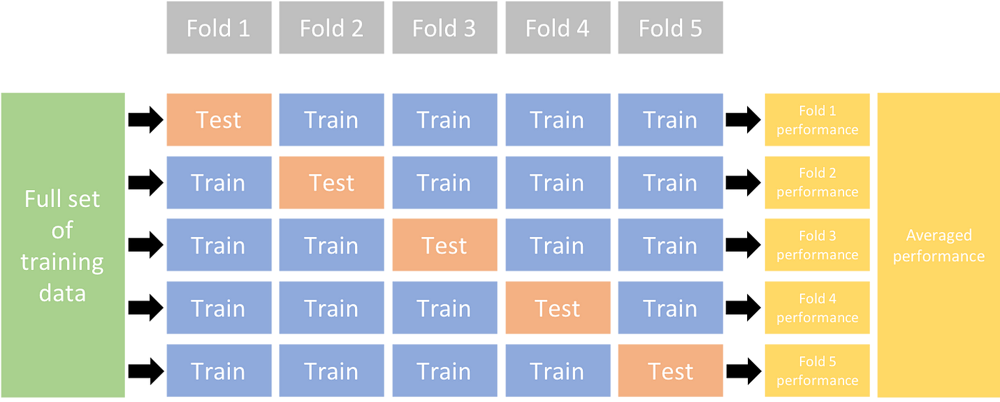

In [ ]:
"""
Malachy -
17/03/2024 

- Added changes to the ConvolutionalNeuralNetwork class and the DataFrame class
    - changed the batching method to use the tensorflow dataset API
    - implemented the training and testing methods for the CNN
    - implemented k-fold cross validation for the CNN
    - implemented validation test splitting of the data
    - implemented the ability to save/load the CNN model to/from a file
    - added command line arguments to the script to allow for the user to specify the architecture, learning rate, weight regularization, representation ect.

- Added additional comments here explaining the code and the changes made for Aroushi to understand.
"""

import pandas as pd
import argparse
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras as keras
import datetime as datetime
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import MaxPooling3D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

#================================================================ CLASSES AND FUNCTIONS ===================================================================
class ConvolutionalNeuralNetwork(): # this is the ConvolutionalNeuralNetwork class, it contains the CNN and methods to train and test the CNN among other things
    def __init__(self, display_summary, architecture, learning_rate, weight_reg, train_class_labels, test_class_labels, representation, input_shape, input_dim): #__init__ is the constructor method for a class, it is the blueprint for the object created when the class is called
        """                                                                                                                                                      # i.e this creates a CNN with its own personal attributes and methods, from this "template"
        Construct a Convolutional Neural Network of a specified architecture.                                                                                    # multiple objects can be created from this class, each with their own attributes and methods. This means you can create multiple CNNs 
                                                                                                                                                                 # of different architectures, learning rates, weight regularizations etc. from this one class. by calling object = ConvolutionalNeuralNetwork()
        args:                                                                                                                                                    # and passing in the required arguments to the constructor method. This means you write less code overall and can do more.
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        learning_rate (float): the learning rate of the network
        weight_reg (str): the weight regularization of the network
        train_class_labels (list): the class labels of the training data
        test_class_labels (list): the class labels of the test data
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_dim (int): the input dimension of the data
        """
        
        self.display_summary = display_summary # the "self." parameter refers to the specific instance of the class (object) that is created when the class is called, it is used to access variables that belong to that object.
        self.architecture = architecture       # i.e self.architecture = architecture gives the object created the attribute self.architecture, and assigns it the value of the argument architecture.
        self.learning_rate = learning_rate     # Only the object created has this attribute, not the class itself and multiple objects can be created from the same class ("blueprint"), each with its own unique attribute values.
        self.weight_reg = weight_reg
        self.network = self.__init_network(display_summary, architecture) # This is a method call, it calls the __init_network method to create the network 
                                                                          # methods are functions that belong to a class, and determine the behaviour of the objects created from the class and how they can interact with other objects.
        self.representation = representation
        self.train_class_labels = train_class_labels
        self.test_class_labels = test_class_labels
        self.input_shape = input_shape
        self.input_dim = input_dim
        
    #------------------------------------------------------------------------- NETWORK INITIALIZATION -----------------------------------------------------------------------    
    def __init_network(self, display_summary: bool = False, architecture: str = "216x64") -> tf.keras.Model: # the __init_network method is a private method (signified by the '__' at the start of the name)
        lr = self.learning_rate                                                                              # private methods are used to perform actions within the class, and are not meant to be called from outside the class.
        
        # Weight regularization
        if self.weight_reg is None:
            wr = None
        else: # do weight regularization
            wr = tf.keras.regularizers.l2(self.weight_reg)
        
        if architecture == '128x64xn': # this if statement checks the architecture parameter and creates the CNN based on the architecture specified, the architecture is specified when the class is called.
            
            network = Sequential()
            network.add(Conv2D(filters = 32, kernel_size = (7, 7), strides = 3, activation = 'relu', kernel_regularizer = wr, input_shape = (self.input_shape,self.input_dim), name = "Convolutional_1"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_3"))
            network.add(Flatten())
            network.add(Dense(units = 128, activation = 'relu', kernel_regularizer = wr, name = "Dense_1"))
            network.add(Dropout(0.5))
            network.add(Dense(units = 64, activation = 'relu', kernel_regularizer = wr, name = "Dense_2"))
            network.add(Dropout(0.5))
            network.add(Dense(len(self.class_labels), activation = None, kernel_regularizer = wr))
            
            network.compile(loss = 'mean_squared_error', optimizer = tf.keras.optimizers.Adam(learning_rate = lr, epsilon = 1e-07))
            
        elif architecture == '400xn':
            
            pass # pass is used as a placeholder, it is used when a statement is required syntactically but the program requires no action, it is used to prevent an error.
             
        else:
            raise ValueError(f"Invalid architecture parameter provided: {architecture}") # raise an error if the architecture parameter is not valid
        
        if (display_summary):
            network.summary()
            
        return network # methods can return values, in this case the method returns the network that was created, not all methods need to return values, some are used to perform actions without returning anything.
                       # this method is used to create the CNN, and is called in the class constructor, when the class is called an object is created from it containing the CNN.
    #------------------------------------------------------------------------- NETWORK TRAINING AND TESTING ---------------------------------------------------------------------------
    def train(self, images, labels): # this method is used to train the network on a batch of images and labels, it is a public method and can be called from outside the class by performing object.method() where object is a variable assigned to an object created from this class.
        """
        Train the network on a batch of images and labels.
        
        args:
        images (np.array): the batch of training images
        labels (np.array): the batch of training labels
        """
        self.network.train_on_batch(images, labels) # trains the network on a single batch
        # see how this method doesn't return anything, it is used to perform an action, that being train the CNN instead of returning a value.
        # calling this method with the correct arguments of images and labels will train the CNN on the batch of images and labels and update the weights and biases of the CNN contained in the network attribute.
        # this train method will be called in a loop to train the CNN on the entire training dataset, outside the class. By calling object.train(images, labels), object being a variable assigned to an object created from this class and .train(images, labels) being the method
        
    def test(self, images, labels): # the self parameter in the method arguments is used to link this method to the object created by this class, and allows the method to access the attributes of the created object.
        """
        Test the network on a batch of images and labels.
        
        arrgs:
        images (np.array): the batch of test images
        labels (np.array): the batch of test labels
        """
        test_loss, test_accuracy = self.network.evaluate(images, labels) # tests the network on a single batch
    
    #----------------------------------------------------------------- NETWORK WEIGHTS AND BIASES SAVING AND LOADING ----------------------------------------------------------------   
    def save(self, checkpoint_path):
        """
        Save the network weights and biases to a file.
        
        args:
        checkpoint_path (str): the path to the directory to save the network weights and biases
        """
        timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S") # get the current date and time
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)  # create a file path to save the network weights and biases, the file name is checkpoint-<timestamp>
        self.network.save_weights(path) # save the network weights and biases to the file
        
    
    def load(self, checkpoint_path, timestamp):
        """
        Load the network weights and biases from a file.
        
        args:
        checkpoint_path (str): the path to the directory to load the network weights and biases
        """
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp) # create a file path to load the network weights and biases, the file name is checkpoint-<timestamp>
        self.network.load_weights(path) # load the network weights and biases from the file
    
class DataFrame(): # this class is used to create a DataFrame object, which contains the training and test data, the dataframe object handels all the data processing and manipulation, this is done as each class should have a single responsibility. The responsibility of the CNN class is to train and test the CNN.
    def __init__(self, dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, seed): # The responsibility of the DataFrame class is to handle the data, and provide the data to the CNN class when required.
        """
        Construct a DataFrame containing the represenation of the training and test data in the required format, i.e one-hot or vote fraction.
        
        args:
        dataset_root (str): path to the dataset root directory
        train_catalog (str): name of the training catalog file
        test_catalog (str): name of the test catalog file
        keys (list): list of the keys to be used when acessing the class labels
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_shape (tuple): the input shape of the data, x, y
        input_dim (int): the input dimension of the data, i.e 3 for RGB image
        """
        
        self.dataset_root = dataset_root
        
        self.train_parquet_file_path = os.path.join(self.dataset_root, train_catalog) # create the file path to the training catalog file
        self.test_parquet_file_path = os.path.join(self.dataset_root, test_catalog)  # create the file path to the test catalog file
        
        self.representation = representation # representation of the data, i.e one-hot or vote fraction
        self.input_shape = input_shape
        self.input_dim = input_dim
        self.keys = self.__get_keys(representation) # this calls the __get_keys method to get the keys of the class labels when accessing the class labels from a Pandas DataFrame, this allows the data to be read from the Pandas DataFrame.
        
        self.train_dataset = self.__init_train_dataset(self.keys) # this cretes the training dataset
        self.test_dataset = self.__init_test_dataset(self.keys) # this creates the test dataset
        
        self.RNG = np.random.default_rng(seed)
        
    #--------------------------------------------------------------------- DATASET(S) INITIALIZATION ---------------------------------------------------------------------------------------
    def __init_train_dataset(self, keys): # this method is identical functionally to the __init_test_dataset method, it is used to create the training dataset in the required format and discards all other information that is not required to save memory.
        """
        Initialise the training dataset, containing paths to the image files and the labels in the required representation.
        
        returns:
        train_dataset (tf.data.Dataset): the training dataset in the required format, file path column then class label columns
        """
        if self.representation == 'one-hot':
            
            pandas_df = pd.read_parquet(self.train_parquet_file_path) # read the training catalog file into a Pandas DataFrame
            pandas_df = pandas_df.fillna(0) # remove all NaN values from the DataFrame
            class_labels = pandas_df['label'] + 1
            one_hot = pd.get_dummies(class_labels).astype(int) # convert the class labels to one-hot encoding
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) # delete the information contained in 'file_loc' 
            
            for idx, _ in enumerate(pandas_df['id_str']):  # construct the actual path to the image file and add it to 'file_loc'
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array(one_hot) # return the training dataset as a tuple of the file paths and the one-hot encoded class labels
             
        elif self.representation == 'vote-fraction':
            
            pandas_df = pd.read_parquet(self.train_parquet_file_path) # read the training catalog file into a Pandas DataFrame
            pandas_df = pandas_df.fillna(0) # remove all NaN values from the DataFrame
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) # delete the information contained in 'file_loc'
            
            for idx, _ in enumerate(pandas_df['id_str']): # construct the actual path to the image file and add it to 'file_loc'
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
               
            return np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array([pandas_df[key] for key in keys]).reshape((len(pandas_df), len(keys))) # return the training dataset as a tuple of the file paths and the class labels
        else:
            raise ValueError(f"Training DataFrame: Invalid representation parameter provided: {self.representation}")
        
    def __init_test_dataset(self, keys): # this is functionally identical to the __init_train_dataset method, it is used to create the test dataset in the required format and discards all other information that is not required to save memory.
        """
        Initialise the test dataset, containing paths to the image files and the labels in the required representation.
        
        returns:
        test_dataset (tf.data.Dataset): the test dataset in the required format, file path column then class label columns
        """
        if self.representation == 'one-hot':
            
            pandas_df = pd.read_parquet(self.test_parquet_file_path)
            pandas_df = pandas_df.fillna(0) 
            class_labels = pandas_df['label'] + 1
            one_hot = pd.get_dummies(class_labels).astype(int) 
                        
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']):  
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return  np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array(one_hot) # return the test dataset as a tuple of the file paths and the one-hot encoded class labels
            
        elif self.representation == 'vote-fraction':
            
            pandas_df = pd.read_parquet(self.test_parquet_file_path)
            pandas_df = pandas_df.fillna(0)
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']):  
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return  np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array([pandas_df[key] for key in keys]).reshape((len(pandas_df), len(keys))) # return the test dataset as a tuple of the file paths and the class labels
        else:
            raise ValueError(f"Test DataFrame: Invalid representation parameter provided: {self.representation}")
    
    def __get_keys(self, representation): # this method is used to obtain the keys of the class labels when accessing the class labels from a Pandas DataFrame, it allows the data in the catalogs to be read.
        """
        Obtain the keys of the class labels when accessing the class labels from a Pandas DataFrame.
        """
        if representation == 'one-hot': # one-hot class labels
            keys = [
            0, 
            1, 
            2, 
            4, 
            5, 
            6, 
            7
        ] 
            return keys     
        elif representation == 'vote-fraction': # vote fraction class labels
            keys = [
                'smooth-or-featured-gz2_smooth_fraction',
                'smooth-or-featured-gz2_featured-or-disk_fraction',
                'smooth-or-featured-gz2_artifact_fraction',
                'disk-edge-on-gz2_yes_fraction',
                'disk-edge-on-gz2_no_fraction',
                'bar-gz2_yes_fraction',
                'bar-gz2_no_fraction',
                'has-spiral-arms-gz2_yes_fraction',
                'has-spiral-arms-gz2_no_fraction',
                'bulge-size-gz2_no_fraction',
                'bulge-size-gz2_just-noticeable_fraction',
                'bulge-size-gz2_obvious_fraction',
                'bulge-size-gz2_dominant_fraction',
                'something-odd-gz2_yes_fraction',
                'something-odd-gz2_no_fraction',
                'how-rounded-gz2_round_fraction',
                'how-rounded-gz2_in-between_fraction',
                'how-rounded-gz2_cigar_fraction',
                'bulge-shape-gz2_round_fraction',
                'bulge-shape-gz2_boxy_fraction',
                'bulge-shape-gz2_no-bulge_fraction',
                'spiral-winding-gz2_tight_fraction',
                'spiral-winding-gz2_medium_fraction',
                'spiral-winding-gz2_loose_fraction',
                'spiral-arm-count-gz2_1_fraction',
                'spiral-arm-count-gz2_2_fraction',
                'spiral-arm-count-gz2_3_fraction',
                'spiral-arm-count-gz2_4_fraction',
                'spiral-arm-count-gz2_more-than-4_fraction',
                'spiral-arm-count-gz2_cant-tell_fraction',
            ]
            return keys # return the keys of the class labels
        else:
            raise ValueError(f"Invalid representation parameter provided: {representation}")
    #--------------------------------------------------------------------------------- IMAGE PROCESSING -------------------------------------------------------------------------------------
    def load_image(self, image_path, input_shape, input_dim): # load and image for the CNN to process
        """
        Load an image from a file path and convert it to a tf tensor.
        
        args:
        image_path (str): path to the image file
        input_dim (int): the input dimension of the data
        
        returns:
        image (tf.tensor): the image as a tf.tensor
        """
        
        image = tf.io.read_file(image_path) # read the image from the file path
        image = tf.image.decode_jpeg(image, channels = input_dim) # decode the image from a jpeg file to a tf.tensor
        image = tf.image.convert_image_dtype(image, tf.float32) /255  # Convert image dtype from tf.uint8 to tf.float32 to allow for image normalisation
        image = tf.image.resize(image, input_shape) # resize the image to the input shape of the CNN
        
        return image # returns the image as a tf.tensor, this method is used to load an image from a file path and convert it to a tf.tensor, it is used to process the images in the dataset.
    #TODO: implement image augmentation methods here, i.e rotation, flipping, scaling, translation, brightness, contrast, saturation, hue, denoising, adding noise, reducing resolution, blurring
    #----------------------------------------------------------------------------- VALIDATION DATA SPLITTING ---------------------------------------------------------------------------------
    def get_train_val_split(self, data, val_percent, shuffle, seed): # this method is used to split the training dataset into a training and validation dataset
        """
        Split the training dataset into a training and validation dataset.
        
        args:
        data (tuple): the training dataset to be split
        val_percent (float): the percentage of the training dataset to be used as the validation dataset range (0, 1)
        shuffle (bool): if to shuffle the data before splitting
        """
        images, labels = data
        
        if shuffle: # if to randomly shuffle the data before splitting
            images, labels = tf.random.shuffle(images, seed = seed), tf.random.shuffle(labels, seed = seed)
            
        val_size = int(len(images) * val_percent) # get the size of the validation dataset
        
        train_images, train_labels = images[val_size:], labels[val_size:] # split the training dataset into a training and validation dataset
        val_images, val_labels = images[:val_size], labels[:val_size] # split the training dataset into a training and validation dataset
        
        train_images, train_labels = tf.data.Dataset.from_tensor_slices(np.array(train_images)), tf.data.Dataset.from_tensor_slices(np.array(train_labels)) # convert the training and validation datasets into a tf.data.Dataset for tensorflow
        val_images, val_labels = tf.data.Dataset.from_tensor_slices(np.array(val_images)), tf.data.Dataset.from_tensor_slices(np.array(val_labels)) # convert the training and validation datasets into a tf.data.Dataset for tensorflow
        
        train_split, validation_split = tf.data.Dataset.zip((train_images, train_labels)), tf.data.Dataset.zip((val_images, val_labels)) # zip the training and validation datasets into a single dataset
        
        return train_split, validation_split # returns the training and validation datasets as a tuple
        
    def get_kfolds(self, data, k, split, RNGstate, shuffle): # this method is used to obtain a split of the dataset using k-fold cross validation, containing the k-1 training folds and 1 validation fold.
        """
        Obtain a split of the dataset using k-fold cross validation, containing the k-1 training folds and 1 validation fold.
        
        args:
        data (tuple): the dataset to be split into k-folds
        k (int): the number of folds to be used
        split (int): the split to be returned
        RNGstate (int): random integer from self.RNG to set the random state of the k-fold cross validation
        shuffle (bool): if to shuffle the data before splitting
        """
        images, labels = data
        
        kFold = KFold(n_splits = k, shuffle = shuffle, random_state = RNGstate) # create a k-fold cross validation object
        
        for split_num, (train_indices, val_indices) in enumerate(kFold.split(images, labels)): # get the indices of the training and validation data from the desired split
            if split_num == split: # convert the indices to the image paths and labels for the desired split
                
                train_images, train_labels = tf.data.Dataset.from_tensor_slices(np.array(images[train_indices])), tf.data.Dataset.from_tensor_slices(np.array(labels[train_indices])) # convert the training and validation datasets into a tf.data.Dataset for tensorflow
                val_images, val_labels = tf.data.Dataset.from_tensor_slices(np.array(images[val_indices])), tf.data.Dataset.from_tensor_slices(np.array(labels[val_indices])) # convert the training and validation datasets into a tf.data.Dataset for tensorflow
                
                train_split, validation_split = tf.data.Dataset.zip((train_images, train_labels)), tf.data.Dataset.zip((val_images, val_labels)) # zip the training and validation datasets into a single dataset
                  
        return train_split, validation_split # NOTE: perform batching on the returned split and then pass to the network
        
    #----------------------------------------------------------------------- DATA BATCHING -----------------------------------------------------------------------------------------     
    def batch_data(self, data, batch_size, drop): # this method is used to batch the dataset into batches of a specified batch size
        """
        Batch a dataset into batches of a specified batch size.
        
        args:
        data (tf.data.Dataset): the dataset to be batched
        batch_size (int): the size of the batch
        drop (bool): drop the remaining data if it is less than the batch size
        """
        return data.batch(batch_size, drop_remainder = drop).prefetch(tf.data.experimental.AUTOTUNE) # Enable prefetching to allow for the data to be batched in parallel with the training of the network
        
    def process_batch(self, data, batch): # this method is used to process a specified batch of images and labels from a batched dataset
        """
        Process a specified batch of images and labels from a batched dataset.
        
        args:
        data (tf.data.Dataset): the batched dataset
        batch (int): the batch number to be returned
        
        returns:
        batched_images (np.array): the batch of images
        batched_labels (np.array): the batch of labels
        """
        
        for images, labels in data.skip(batch).take(1): # Get the specified batch
            images = tf.squeeze(images, axis=1) # remove unnecessary singleton dimension from tensor
            batched_images = [self.load_image(image_path, self.input_shape, self.input_dim).numpy() for image_path in images]  # load the images from the file paths and convert them to a np.array
            batched_labels = labels.numpy() # convert the labels to a np.array

        return batched_images, batched_labels # returns the batch of images and labels as a tuple

#============================================================================== MAIN FUNCTION ============================================================================
def main(dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, display_summary, architecture, learning_rate, weight_reg, batch_size, epochs, seed): # this is the main function, it is the entry point of the program, and is used to call the classes and methods to train and test the CNN.
    # the main function is ran when the script is executed, this is where the training loop and testing loop will be implemented among other things.
    df = DataFrame(dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, seed)
    
    RNGstate = df.RNG.integers(0, 1000)
    train_split, validation_split = df.get_kfolds(df.train_dataset, k = 10, split = 0, RNGstate = RNGstate, shuffle = True)
    
    batched_train_split = df.batch_data(train_split, batch_size, drop = False)
    train_images, train_labels = df.process_batch(batched_train_split, 0)
    print(train_labels)
    
    #TODO: implement basic training loop here, i.e batch_data, process_batch, train, save, metrics
    # can then try a loop that implements basic 20% val 80% train split with early stopping.
    # then can implement a loop that implements k-fold cross validation with early stopping.

#===================================================================== COMMAND LINE ARGUMENT(S) PARSER ===================================================================  
if __name__ == "__main__": # this is the command line argument parser, it is used to parse the command line arguments and call the main function with the parsed arguments. Command line arguuments allow you to change the parameters of the program without changing the code.
    """run `python network.py --help` for argument information""" 
    # ensure you are in the correct directory where py file is located, can change directory by running `cd "<directory path>"`
    # i.e run `cd "C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/main"` to change directory
    
    parser = argparse.ArgumentParser(prog = "network.py")
    
    parser.add_argument("-dim",       "--inputdim", type = int,   default = 3,          help = "(int) The input dimension of the data") # i.e this allows you to change the input dimension of the data from the command line by running `python network.py -dim 1` to change the input dimension to 1
    parser.add_argument("-ixy",     "--inputshape", type = tuple, default = (424, 424), help = "(tuple) The input shape of the data, i.e (424, 424) for 424x424 images")
    
    parser.add_argument("-r",             "--root", type = str,   default = r"C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset", help = "(str) The path to the dataset root directory")
    parser.add_argument("-l",           "--labels", type = str,   default = r"gz2_train_catalog.parquet", help = "(str) The name of the training catalog file")
    parser.add_argument("-tl",      "--testlabels", type = str,   default = r"gz2_test_catalog.parquet",  help = "(str) The name of the test catalog file") 
    parser.add_argument("-rep", "--representation", type = str,   default = "vote-fraction",              help = "(str) The representation of the data, i.e one-hot or vote-fraction")
    
    parser.add_argument("-sum",        "--summary", type = bool,  default = False,      help = "(bool) Display the summary of the network")
    parser.add_argument("-a",     "--architecture", type = str,   default = "128x64xn", help = "(str) The architecture of the network")
    parser.add_argument("-lr",    "--learningrate", type = float, default = 0.001,      help = "(float) The learning rate of the network")
    parser.add_argument("-wr",       "--weightreg", type = str,   default = None,       help = "(str) The weight regularization of the network")
    parser.add_argument("-bs",       "--batchsize", type = int,   default = 256,        help = "(int) The batch size of the network")
    parser.add_argument("-e",           "--epochs", type = int,   default = 100,        help = "(int) The number of epochs to train the network")
    parser.add_argument("-s",             "--seed", type = int,   default = 0,          help = "(int) The seed for the random number generator")
    
    args = parser.parse_args()

    main(
        input_dim = args.inputdim,
        input_shape = args.inputshape,
        dataset_root = args.root,
        train_catalog = args.labels,
        test_catalog = args.testlabels,
        representation = args.representation,
        display_summary = args.summary,
        architecture = args.architecture,
        learning_rate = args.learningrate,
        weight_reg = args.weightreg,
        batch_size = args.batchsize,
        epochs = args.epochs,
        seed = args.seed
    )       
    
# NOTE:
# At the start of each epoch call the shuffle_dataset method to shuffle the training dataset
# then call the get_batch method to get the next batch of images and labels, and then train the network on the batch
# increment the batch counter and repeat the process until the end of the epoch.

# TODO: 
#       - implement train method and training loop
#       - implement the test method of the ConvolutionalNeuralNetwork class to test the network on the test dataset 
#       - implement the save and load methods of the ConvolutionalNeuralNetwork class to save and load the network weights and biases
#       - implement training and testing metrics, i.e accuracy, precision, recall, f1-score, confusion matrix



In [ ]:
"""
Malachy - 10/03/2021
-First attempt at basic training loop.
-Is really slow as the images are loaded from the dataset sequentially in the training loop.
-Would take over 9 days to train the network on the entire dataset. (need to speed it up by an order of magnitude to make it more reasonable to train)
"""

import pandas as pd
import argparse
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras as keras
import time as time
import datetime as datetime
import concurrent.futures
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import MaxPooling3D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

#================================================================ CLASSES AND FUNCTIONS ===================================================================
class ConvolutionalNeuralNetwork():
    def __init__(self, display_summary, architecture, learning_rate, weight_reg, representation, input_shape, input_dim):
        """
        Construct a Convolutional Neural Network of a specified architecture.
        
        args:
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        learning_rate (float): the learning rate of the network
        weight_reg (str): the weight regularization of the network
        train_class_labels (list): the class labels of the training data
        test_class_labels (list): the class labels of the test data
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_dim (int): the input dimension of the data
        """
        
        self.display_summary = display_summary
        self.architecture = architecture
        self.learning_rate = learning_rate
        self.weight_reg = weight_reg
        
        self.representation = representation
        self.label_length = len(get_keys(representation))
        
        self.input_x, self.input_y = input_shape
        self.input_dim = input_dim
        
        self.network = self.__init_network(display_summary, architecture)
    #------------------------------------------------------------------------- NETWORK INITIALIZATION -----------------------------------------------------------------------    
    def __init_network(self, display_summary: bool = False, architecture: str = "216x64") -> tf.keras.Model:
        lr = self.learning_rate
        
        # Weight regularization
        if self.weight_reg is None:
            wr = None
        else:
            wr = tf.keras.regularizers.l2(self.weight_reg)
        
        if architecture == '128x64xn':
            
            network = Sequential()
            network.add(Conv2D(filters = 32, kernel_size = (7, 7), strides = 3, activation = 'relu', kernel_regularizer = wr, input_shape = (self.input_x, self.input_y, self.input_dim), name = "Convolutional_1")) # input_shape doesn't work, issue with combining tuple self.input_shape and int self.input_dim
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_3"))
            network.add(Flatten())
            network.add(Dense(units = 128, activation = 'relu', kernel_regularizer = wr, name = "Dense_1"))
            network.add(Dropout(0.5))
            network.add(Dense(units = 64, activation = 'relu', kernel_regularizer = wr, name = "Dense_2"))
            network.add(Dropout(0.5))
            network.add(Dense(self.label_length, activation = None, kernel_regularizer = wr)) 
            
            network.compile(loss = 'mean_squared_error', optimizer = tf.keras.optimizers.Adam(learning_rate = lr, epsilon = 1e-07), metrics = ['accuracy'])
            
        elif architecture == '400xn':
            
            pass
             
        else:
            raise ValueError(f"Invalid architecture parameter provided: {architecture}")
        
        if (display_summary):
            network.summary()
            
        return network
    #------------------------------------------------------------------------- NETWORK TRAINING AND TESTING ---------------------------------------------------------------------------
    def train(self, images, labels):
        """
        Train the network on a batch of images and labels.
        
        args:
        images (np.array): the batch of training images
        labels (np.array): the batch of training labels
        """
        return self.network.train_on_batch(images, labels, return_dict = True) # trains the network on a single batch and returns the training metrics
        
    def test(self, images, labels):
        """
        Test the network on a batch of images and labels.
        
        arrgs:
        images (np.array): the batch of test images
        labels (np.array): the batch of test labels
        """
        return self.network.test_on_batch(images, labels, return_dict = True) # tests the network on a single batch
    
    #----------------------------------------------------------------- NETWORK WEIGHTS AND BIASES SAVING AND LOADING ----------------------------------------------------------------   
    def save(self, checkpoint_path):
        """
        Save the network weights and biases to a file.
        
        args:
        checkpoint_path (str): the path to the directory to save the network weights and biases
        """
        timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.save_weights(path)
        
    
    def load(self, checkpoint_path, timestamp):
        """
        Load the network weights and biases from a file.
        
        args:
        checkpoint_path (str): the path to the directory to load the network weights and biases
        """
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.load_weights(path)
    
class DataFrame():
    def __init__(self, dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, seed):
        """
        Construct a DataFrame containing the represenation of the training and test data in the required format, i.e one-hot or vote fraction.
        
        args:
        dataset_root (str): path to the dataset root directory
        train_catalog (str): name of the training catalog file
        test_catalog (str): name of the test catalog file
        keys (list): list of the keys to be used when acessing the class labels
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_shape (tuple): the input shape of the data, x, y
        input_dim (int): the input dimension of the data, i.e 3 for RGB image
        """
        
        self.dataset_root = dataset_root
        
        self.train_parquet_file_path = os.path.join(self.dataset_root, train_catalog)
        self.test_parquet_file_path = os.path.join(self.dataset_root, test_catalog)
        
        self.representation = representation
        self.input_shape = input_shape
        self.input_dim = input_dim
        self.keys = get_keys(representation)
        
        self.train_dataset = self.__init_dataset(self.keys, self.train_parquet_file_path)
        self.test_dataset = self.__init_dataset(self.keys, self.test_parquet_file_path)
        
        self.RNG = np.random.default_rng(seed)
        
    #--------------------------------------------------------------------- DATASET(S) INITIALIZATION ---------------------------------------------------------------------------------------
    def __init_dataset(self, keys, catalog_path):
        """
        Initialise a dataset, containing paths to the image files and the labels in the required representation.
        
        returns:
        dataset (tf.data.Dataset): a dataset in the required format, file path column then class label columns
        """
        if self.representation == 'one-hot':
            
            pandas_df = pd.read_parquet(catalog_path)
            pandas_df = pandas_df.fillna(0) 
            class_labels = pandas_df['label'] + 1
            one_hot = pd.get_dummies(class_labels).astype(int) # convert the class labels to one-hot encoding
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) # delete the information contained in 'file_loc' 
            
            for idx, _ in enumerate(pandas_df['id_str']):  # construct the actual path to the image file and add it to 'file_loc'
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
            
            return np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array(one_hot)
             
        elif self.representation == 'vote-fraction':
            
            pandas_df = pd.read_parquet(catalog_path)
            pandas_df = pandas_df.fillna(0)
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']):  
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
               
            return np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)), np.array([pandas_df[key] for key in keys]).reshape((len(pandas_df), len(keys)))
        else:
            raise ValueError(f"Training DataFrame: Invalid representation parameter provided: {self.representation}")
    
    #--------------------------------------------------------------------------------- IMAGE PROCESSING -------------------------------------------------------------------------------------
    def load_image(self, image_path, input_shape, input_dim):
        """
        Load an image from a file path and convert it to a tf tensor.
        
        args:
        image_path (str): path to the image file
        input_dim (int): the input dimension of the data
        
        returns:
        image (tf.tensor): the image as a tf.tensor
        """
        
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels = input_dim)
        image = tf.image.convert_image_dtype(image, tf.float32) /255  # Convert image dtype from tf.uint8 to tf.float32 to allow for image normalisation
        image = tf.image.resize(image, input_shape) 
        
        return image
    #TODO: implement image augmentation methods here, i.e rotation, flipping, scaling, translation, brightness, contrast, saturation, hue, denoising, adding noise, reducing resolution, blurring
    #----------------------------------------------------------------------------- VALIDATION DATA SPLITTING ---------------------------------------------------------------------------------
    def get_train_val_split(self, data, val_percent, shuffle, seed):
        """
        Split the training dataset into a training and validation dataset.
        
        args:
        data (tuple): the training dataset to be split
        val_percent (float): the percentage of the training dataset to be used as the validation dataset
        shuffle (bool): if to shuffle the data before splitting
        """
        images, labels = data
        
        if shuffle:
            state = self.RNG.integers(low=0, high=65535, size=1)[0]
            combined = tf.data.Dataset.from_tensor_slices((images, labels))
            combined = combined.shuffle(buffer_size = len(images), seed = state)
            images, labels = zip(*combined)
            
        val_size = int(len(images) * val_percent)
        
        train_images, train_labels = images[val_size:], labels[val_size:]
        val_images, val_labels = images[:val_size], labels[:val_size]
        
        train_images, train_labels = tf.data.Dataset.from_tensor_slices(np.array(train_images)), tf.data.Dataset.from_tensor_slices(np.array(train_labels))
        val_images, val_labels = tf.data.Dataset.from_tensor_slices(np.array(val_images)), tf.data.Dataset.from_tensor_slices(np.array(val_labels))
        
        train_split, validation_split = tf.data.Dataset.zip((train_images, train_labels)), tf.data.Dataset.zip((val_images, val_labels))
        
        return train_split, validation_split
        
    def get_kfolds(self, data, k, split, RNGstate, shuffle):
        """
        Obtain a split of the dataset using k-fold cross validation, containing the k-1 training folds and 1 validation fold.
        
        args:
        data (tuple): the dataset to be split into k-folds
        k (int): the number of folds to be used
        split (int): the split to be returned
        RNGstate (int): random integer from self.RNG to set the random state of the k-fold cross validation
        shuffle (bool): if to shuffle the data before splitting
        """
        images, labels = data
        
        kFold = KFold(n_splits = k, shuffle = shuffle, random_state = RNGstate)
        
        for split_num, (train_indices, val_indices) in enumerate(kFold.split(images, labels)): # get the indices of the training and validation data from the desired split
            if split_num == split: # convert the indices to the image paths and labels for the desired split
                
                train_images, train_labels = tf.data.Dataset.from_tensor_slices(np.array(images[train_indices])), tf.data.Dataset.from_tensor_slices(np.array(labels[train_indices]))
                val_images, val_labels = tf.data.Dataset.from_tensor_slices(np.array(images[val_indices])), tf.data.Dataset.from_tensor_slices(np.array(labels[val_indices]))
                
                train_split, validation_split = tf.data.Dataset.zip((train_images, train_labels)), tf.data.Dataset.zip((val_images, val_labels))
                  
        return train_split, validation_split # NOTE: perform batching on the returned split and then pass to the network
    
    #----------------------------------------------------------------------- DATA BATCHING -----------------------------------------------------------------------------------------     
    def batch_data(self, data, batch_size, drop, shuffle):
        """
        Batch a dataset into batches of a specified batch size.
        
        args:
        data (tf.data.Dataset): the dataset to be batched
        batch_size (int): the size of the batch
        drop (bool): drop the remaining data if it is less than the batch size
        """
        if shuffle:
            state = self.RNG.integers(low=0, high=65535, size=1)[0]
            batches = data.batch(batch_size, drop_remainder = drop).shuffle(buffer_size = data.cardinality(), seed = state).prefetch(tf.data.experimental.AUTOTUNE)
        else:
            batches = data.batch(batch_size, drop_remainder = drop).prefetch(tf.data.experimental.AUTOTUNE)
            
        return batches # Enable prefetching to allow for the data to be batched in parallel with the training of the network
        
    def process_batch(self, data, batch):
        """
        Process a specified batch of images and labels from a batched dataset.

        args:
        data (tf.data.Dataset): the batched dataset
        batch (int): the batch number to be returned

        returns:
        batched_images (np.array): the batch of images
        batched_labels (np.array): the batch of labels
        """

        batched_images, batched_labels = [], []
        
        for images, labels in data.skip(batch).take(1):  
            images = tf.squeeze(images, axis=1)
            image_paths = images.numpy()  
            labels = labels.numpy()  

            for idx, image_path in enumerate(image_paths):
                image = self.load_image(image_path, self.input_shape, self.input_dim).numpy() if image_path is not None else None
                if image is not None:
                    batched_images.append(image)
                    batched_labels.append(labels[idx])

        return np.array(batched_images), np.array(batched_labels)

def get_keys(representation):
    """
    Obtain the keys of the class labels when accessing the class labels from a Pandas DataFrame.
    """
    if representation == 'one-hot':
        keys = [
        0, 
        1, 
        2, 
        4, 
        5, 
        6, 
        7
    ] 
        return keys     
    elif representation == 'vote-fraction':
        keys = [
            'smooth-or-featured-gz2_smooth_fraction',
            'smooth-or-featured-gz2_featured-or-disk_fraction',
            'smooth-or-featured-gz2_artifact_fraction',
            'disk-edge-on-gz2_yes_fraction',
            'disk-edge-on-gz2_no_fraction',
            'bar-gz2_yes_fraction',
            'bar-gz2_no_fraction',
            'has-spiral-arms-gz2_yes_fraction',
            'has-spiral-arms-gz2_no_fraction',
            'bulge-size-gz2_no_fraction',
            'bulge-size-gz2_just-noticeable_fraction',
            'bulge-size-gz2_obvious_fraction',
            'bulge-size-gz2_dominant_fraction',
            'something-odd-gz2_yes_fraction',
            'something-odd-gz2_no_fraction',
            'how-rounded-gz2_round_fraction',
            'how-rounded-gz2_in-between_fraction',
            'how-rounded-gz2_cigar_fraction',
            'bulge-shape-gz2_round_fraction',
            'bulge-shape-gz2_boxy_fraction',
            'bulge-shape-gz2_no-bulge_fraction',
            'spiral-winding-gz2_tight_fraction',
            'spiral-winding-gz2_medium_fraction',
            'spiral-winding-gz2_loose_fraction',
            'spiral-arm-count-gz2_1_fraction',
            'spiral-arm-count-gz2_2_fraction',
            'spiral-arm-count-gz2_3_fraction',
            'spiral-arm-count-gz2_4_fraction',
            'spiral-arm-count-gz2_more-than-4_fraction',
            'spiral-arm-count-gz2_cant-tell_fraction',
        ]
        return keys
    else:
            raise ValueError(f"Invalid representation parameter provided: {representation}")
        
#============================================================================== MAIN FUNCTION ============================================================================
def main(dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, display_summary, architecture, learning_rate, weight_reg, batch_size, epochs, seed):
    
    gpus = tf.config.experimental.list_physical_devices('GPU')
    
    if gpus:
        for gpu in gpus:
            os.environ["TF_GPU_ALLOCATOR"] = "cuda_malloc_async"
            tf.config.experimental.set_memory_growth(gpu, True)
            tf.config.experimental.set_virtual_device_configuration(gpu, [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024*7)])
        
    df = DataFrame(dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, seed)
    cnn = ConvolutionalNeuralNetwork(display_summary, architecture, learning_rate, weight_reg, representation, input_shape, input_dim)
    
    train_split, val_split = df.get_train_val_split(df.train_dataset, val_percent = 0.2, shuffle = True, seed = seed)
    epoch_time_hist = []
    
    # NOTE: most of the runtime is spent on loading the images from disk, can try to preload as many batches of size 32 of images and labels that fit into memory to reduce the runtime...?
    for epoch in range(0,epochs):
        
        epoch_start_time = time.time()
        iteration = 0
        val_loss, val_accuracy = 0, 0 # no val metrics at start of epoch
        iter_time_hist = []
        
        if epoch == 0:
            pred_runtime = 0
        else: 
            pred_runtime = np.mean(epoch_time_hist) * (epochs - epoch)
            
        train_batches = df.batch_data(train_split, batch_size, drop = False, shuffle = True)
        
        for iteration in range(0, (len(train_batches))): # perform training on each batch
            
            iter_start_time = time.time()
            time_fetch_start = time.time()
            train_images, train_labels = df.process_batch(train_batches, iteration)
            time_fetch_end = time.time()
            history = cnn.train(train_images, train_labels)
            loss, accuracy = history['loss'], history['accuracy']
            iter_end_time = time.time()
            
            # Code to display the progress of the training as a progress bar
            iter_time = iter_end_time - iter_start_time
            iter_time_hist.append(iter_time)
            
            bar_length = 50
            progress_percentage = ((iteration + 1) / len(train_batches)) * 100
            num_chars = int(bar_length * (progress_percentage / 100))
            
            print(
                f'Epoch: {epoch}/{epochs} | Iter: {iteration}/{len(train_batches)} | Loss: {loss:.5f} | Accuracy: {accuracy:.5f} | ['
                f'{"■" * num_chars}{"⠀" * (bar_length - num_chars)}] {progress_percentage:.1f} %',
                f' | It: {iter_time:.2E} s | Imft: {time_fetch_end - time_fetch_start:.2E} s ({(((time_fetch_end - time_fetch_start)/iter_time)*100):.2f} %) | Tr: {np.mean(iter_time_hist) * (len(train_batches) - iteration):.2E} s | Pr: {pred_runtime:.2E} s',
                end = '\r',
                flush = True
            )
            
        # perform validation at the end of each epoch
        val_batches = df.batch_data(val_split, batch_size, drop = False, shuffle = True)
        val_images, val_labels = df.process_batch(val_batches, epoch)
        val_history = cnn.test(val_images, val_labels)
        val_loss, val_accuracy = val_history['loss'], val_history['accuracy']
        
        epoch_end_time = time.time()
        runtime = epoch_end_time - epoch_start_time
        epoch_time_hist.append(runtime)
        
        # print val metrics
        print(
            f' | Val loss: {val_loss:.5f} | Val accuracy: {val_accuracy:.5f} | Epoch runtime {runtime:.2E} s | Pred runtime: {pred_runtime:.2E} s ',
            end = '\n',
            flush = True
            )
        
    #TODO: implement basic training loop here, i.e batch_data, process_batch, train, save, metrics
    # can then try a loop that implements basic 20% val 80% train split with early stopping.
    # then can implement a loop that implements k-fold cross validation with early stopping.

#===================================================================== COMMAND LINE ARGUMENT(S) PARSER ===================================================================  
if __name__ == "__main__":
    """run `python network.py --help` for argument information""" 
    # ensure you are in the correct directory where py file is located, can change directory by running `cd "<directory path>"`
    # i.e run `cd "C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/main"` to change directory
    
    parser = argparse.ArgumentParser(prog = "network.py")
    
    parser.add_argument("-dim",       "--inputdim", type = int,   default = 3,          help = "(int) The input dimension of the data")
    parser.add_argument("-ixy",     "--inputshape", type = tuple, default = (424, 424), help = "(tuple) The input shape of the data, i.e (424, 424) for 424x424 images")
    
    parser.add_argument("-r",             "--root", type = str,   default = r"C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset", help = "(str) The path to the dataset root directory")
    #parser.add_argument("-r",             "--root", type = str,   default = r"/Users/aroushijimulia/Downloads/GitHub/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset", help = "(str) The path to the dataset root directory")
    parser.add_argument("-l",           "--labels", type = str,   default = r"gz2_train_catalog.parquet", help = "(str) The name of the training catalog file")
    parser.add_argument("-tl",      "--testlabels", type = str,   default = r"gz2_test_catalog.parquet",  help = "(str) The name of the test catalog file") 
    parser.add_argument("-rep", "--representation", type = str,   default = "vote-fraction",              help = "(str) The representation of the data, i.e one-hot or vote-fraction")
    
    parser.add_argument("-sum",        "--summary", type = bool,  default = False,      help = "(bool) Display the summary of the network")
    parser.add_argument("-a",     "--architecture", type = str,   default = "128x64xn", help = "(str) The architecture of the network")
    parser.add_argument("-lr",    "--learningrate", type = float, default = 0.001,      help = "(float) The learning rate of the network")
    parser.add_argument("-wr",       "--weightreg", type = str,   default = None,       help = "(str) The weight regularization of the network")
    parser.add_argument("-bs",       "--batchsize", type = int,   default = 32,        help = "(int) The batch size of the network")
    parser.add_argument("-e",           "--epochs", type = int,   default = 500,        help = "(int) The number of epochs to train the network")
    parser.add_argument("-s",             "--seed", type = int,   default = 0,          help = "(int) The seed for the random number generator")
    
    args = parser.parse_args()

    main(
        input_dim = args.inputdim,
        input_shape = args.inputshape,
        dataset_root = args.root,
        train_catalog = args.labels,
        test_catalog = args.testlabels,
        representation = args.representation,
        display_summary = args.summary,
        architecture = args.architecture,
        learning_rate = args.learningrate,
        weight_reg = args.weightreg,
        batch_size = args.batchsize,
        epochs = args.epochs,
        seed = args.seed
    )       
    
# TODO: 
#       - implement train method and training loop
#       - implement the test method of the ConvolutionalNeuralNetwork class to test the network on the test dataset 
#       - implement the save and load methods of the ConvolutionalNeuralNetwork class to save and load the network weights and biases
#       - implement training and testing metrics, i.e accuracy, precision, recall, f1-score, confusion matrix

# preload as many batches of size 32 of images and labels that fit into memory -> then train on each batch until need to load in more batches
# use tensorboard to store the training/test metrics and display them in a graph

In [ ]:
"""
22/03/2024
Malachy -
-Got the basic training/testing working, methods are implemented in the ConvolutionalNeuralNetwork class to train and test the network the dataset.
-Had to do refactoring to use tensorflow datasets API along with model.fit() and model.evaluate() methods to train and test the network.
dataset is now loaded in parallel when training and testing the network, this allows for faster training and testing of the network. (is faster by approx an order of magnitude)
"""

import pandas as pd
import argparse
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras as keras
import time as time
import datetime as datetime
import concurrent.futures
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import MaxPooling3D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

#================================================================ CLASSES AND FUNCTIONS ===================================================================
class ConvolutionalNeuralNetwork():
    def __init__(self, display_summary, architecture, learning_rate, weight_reg, representation, input_shape, input_dim):
        """
        Construct a Convolutional Neural Network of a specified architecture.
        
        args:
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        learning_rate (float): the learning rate of the network
        weight_reg (str): the weight regularization of the network
        train_class_labels (list): the class labels of the training data
        test_class_labels (list): the class labels of the test data
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_dim (int): the input dimension of the data
        """
        
        self.display_summary = display_summary
        self.architecture = architecture
        self.learning_rate = learning_rate
        self.weight_reg = weight_reg
        
        self.representation = representation
        self.label_length = len(get_keys(representation))
        
        self.input_x, self.input_y = input_shape
        self.input_dim = input_dim
        
        self.network = self.__init_network(display_summary, architecture)
        
        self.train_history = None
        self.test_history = None
    #------------------------------------------------------------------------- NETWORK INITIALIZATION -----------------------------------------------------------------------    
    def __init_network(self, display_summary: bool = False, architecture: str = "216x64") -> tf.keras.Model:
        lr = self.learning_rate
        
        # Weight regularization
        if self.weight_reg is None:
            wr = None
        else:
            wr = tf.keras.regularizers.l2(self.weight_reg)
        
        if architecture == '128x64xn':
            
            network = Sequential()
            network.add(Conv2D(filters = 32, kernel_size = (7, 7), strides = 3, activation = 'relu', kernel_regularizer = wr, input_shape = (self.input_x, self.input_y, self.input_dim), name = "Convolutional_1")) # input_shape doesn't work, issue with combining tuple self.input_shape and int self.input_dim
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_3"))
            network.add(Flatten())
            network.add(Dense(units = 128, activation = 'relu', kernel_regularizer = wr, name = "Dense_1"))
            network.add(Dropout(0.5))
            network.add(Dense(units = 64, activation = 'relu', kernel_regularizer = wr, name = "Dense_2"))
            network.add(Dropout(0.5))
            network.add(Dense(self.label_length, activation = None, kernel_regularizer = wr)) 
            
            network.compile(loss = 'mean_squared_error', optimizer = tf.keras.optimizers.Adam(learning_rate = lr, epsilon = 1e-07), metrics = ['accuracy'])
            
        elif architecture == '400xn':
            
            pass
             
        else:
            raise ValueError(f"Invalid architecture parameter provided: {architecture}")
        
        if (display_summary):
            network.summary()
            
        return network
    #------------------------------------------------------------------------- NETWORK TRAINING AND TESTING ---------------------------------------------------------------------------
    def train(self, train_data, validation_data, dataframe, train_batch_size, val_batch_size, val_steps, epochs, initial_epoch):
        
        train_data = train_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE # allow for tensorflow to dynamically decide the number of parallel calls to make
        ).batch(
            train_batch_size # batch the dataset into batches of size batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE # allow for prefetching to parallelize the loading of the images and labels with the training of the network
        )
        
        validation_data = validation_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE
        ).batch(
            val_batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE
        )
        
        self.train_history = self.network.fit(
            train_data,
            epochs = epochs,
            verbose = 1,
            callbacks = None,
            validation_data = validation_data,
            shuffle = True,
            initial_epoch = initial_epoch,
            steps_per_epoch = None,
            validation_steps = val_steps,
            validation_batch_size = val_batch_size,
            validation_freq = 1,
            max_queue_size = 10,
            workers = 1,
            use_multiprocessing = True
        )
        
    def test(self, test_data, dataframe, test_batch_size, test_steps):
        
        test_data = test_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE
        ).batch(
            test_batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE
        )
        
        self.test_history = self.network.evaluate(
            test_data,
            batch_size = test_batch_size,
            verbose = 1,
            steps = test_steps,
            callbacks = None,
            max_queue_size = 10,
            workers = 1,
            use_multiprocessing = True,
            return_dict = True
        )
        
    #----------------------------------------------------------------- NETWORK WEIGHTS AND BIASES SAVING AND LOADING ----------------------------------------------------------------   
    def save(self, checkpoint_path):
        """
        Save the network weights and biases to a file.
        
        args:
        checkpoint_path (str): the path to the directory to save the network weights and biases
        """
        timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.save_weights(path)
        
    
    def load(self, checkpoint_path, timestamp):
        """
        Load the network weights and biases from a file.
        
        args:
        checkpoint_path (str): the path to the directory to load the network weights and biases
        """
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.load_weights(path)
    
class DataFrame():
    def __init__(self, dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, seed):
        """
        Construct a DataFrame containing the represenation of the training and test data in the required format, i.e one-hot or vote fraction.
        
        args:
        dataset_root (str): path to the dataset root directory
        train_catalog (str): name of the training catalog file
        test_catalog (str): name of the test catalog file
        keys (list): list of the keys to be used when acessing the class labels
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_shape (tuple): the input shape of the data, x, y
        input_dim (int): the input dimension of the data, i.e 3 for RGB image
        """
        
        self.dataset_root = dataset_root
        
        self.train_parquet_file_path = os.path.join(self.dataset_root, train_catalog)
        self.test_parquet_file_path = os.path.join(self.dataset_root, test_catalog)
        
        self.representation = representation
        self.input_shape = input_shape
        self.input_dim = input_dim
        self.keys = get_keys(representation)
        
        self.train_dataset = self.__init_dataset(self.keys, self.train_parquet_file_path)
        self.test_dataset = self.__init_dataset(self.keys, self.test_parquet_file_path)
        
        tf.random.set_seed(seed)
        
    #--------------------------------------------------------------------- DATASET(S) INITIALIZATION ---------------------------------------------------------------------------------------
    def __init_dataset(self, keys, catalog_path):
        """
        Initialise a dataset, containing paths to the image files and the labels in the required representation.
        
        returns:
        dataset (tf.data.Dataset): a dataset in the required format, file path column then class label columns
        """
        if self.representation == 'one-hot':
            
            pandas_df = pd.read_parquet(catalog_path)
            pandas_df = pandas_df.fillna(0) 
            class_labels = pandas_df['label'] + 1
            one_hot = pd.get_dummies(class_labels).astype(int) # convert the class labels to one-hot encoding
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) # delete the information contained in 'file_loc' 
            
            for idx, _ in enumerate(pandas_df['id_str']):  # construct the actual path to the image file and add it to 'file_loc'
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))
                
                if not os.path.exists(pandas_df['file_loc'][idx]): # check if the file exists at the constructed path, if not then remove the row from the DataFrame
                    pandas_df = pandas_df.drop(idx)
                    one_hot = one_hot.drop(idx)
                
            image_path_ds = tf.data.Dataset.from_tensor_slices(np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)))
            labels_ds = tf.data.Dataset.from_tensor_slices(np.array(one_hot))
                
            return tf.data.Dataset.zip((image_path_ds, labels_ds))
            
        elif self.representation == 'vote-fraction':
            
            pandas_df = pd.read_parquet(catalog_path)
            pandas_df = pandas_df.fillna(0)
            
            pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
            
            for idx, _ in enumerate(pandas_df['id_str']):  
                pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))

                if not os.path.exists(pandas_df['file_loc'][idx]): 
                    pandas_df = pandas_df.drop(idx)
            
            image_path_ds = tf.data.Dataset.from_tensor_slices(np.array(pandas_df['file_loc']).reshape((len(pandas_df), 1)))
            labels_ds = tf.data.Dataset.from_tensor_slices(np.array([pandas_df[key] for key in keys]).reshape((len(pandas_df), len(keys))))   
                    
            return tf.data.Dataset.zip((image_path_ds, labels_ds))
        else:
            raise ValueError(f"Training DataFrame: Invalid representation parameter provided: {self.representation}")
    
    #--------------------------------------------------------------------------------- IMAGE PROCESSING -------------------------------------------------------------------------------------
    def fetch_image_label_pair(self, image_path, label):
        
        image_path = tf.squeeze(image_path)
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels = self.input_dim)
        image = tf.image.convert_image_dtype(image, tf.float32) /255  # Convert image dtype from tf.uint8 to tf.float32 to allow for image normalisation
        image = tf.image.resize(image, self.input_shape) 
        
        return image, label
    
    #TODO: implement image augmentation methods here, i.e rotation, flipping, scaling, translation, brightness, contrast, saturation, hue, denoising, adding noise, reducing resolution, blurring
    #----------------------------------------------------------------------------- VALIDATION DATA SPLITTING ---------------------------------------------------------------------------------
    def get_train_val_split(self, data, val_fraction, shuffle, seed):
        """
        Split the training dataset into a training and validation dataset.
        
        args:
        data (tf.data.Dataset): the input dataset to be split
        val_fraction (float): the fraction of the dataset to be used for validation [0-1]
        shuffle (bool): shuffle the dataset before splitting
        seed (int): the seed for the random number generator
        
        returns: 
        (tuple) of training and validation datasets
            train_split (tf.data.Dataset): the training dataset
            validation_split (tf.data.Dataset): the validation dataset
        """
        train_split, validation_split = tf.keras.utils.split_dataset(data, left_size = 1 - val_fraction, right_size = val_fraction, shuffle = shuffle, seed = seed)

        return train_split, validation_split
    
    def get_kfolds(self):
        pass
    
def get_keys(representation):
    """
    Obtain the keys of the class labels when accessing the class labels from a Pandas DataFrame.
    
    args:
    representation (str): the representation of the data, i.e one-hot or vote fraction
    
    returns:
    keys (list): the keys of the class labels
    """
    if representation == 'one-hot':
        keys = [
        0, 
        1, 
        2, 
        4, 
        5, 
        6, 
        7
    ] 
        return keys     
    elif representation == 'vote-fraction':
        keys = [
            'smooth-or-featured-gz2_smooth_fraction',
            'smooth-or-featured-gz2_featured-or-disk_fraction',
            'smooth-or-featured-gz2_artifact_fraction',
            'disk-edge-on-gz2_yes_fraction',
            'disk-edge-on-gz2_no_fraction',
            'bar-gz2_yes_fraction',
            'bar-gz2_no_fraction',
            'has-spiral-arms-gz2_yes_fraction',
            'has-spiral-arms-gz2_no_fraction',
            'bulge-size-gz2_no_fraction',
            'bulge-size-gz2_just-noticeable_fraction',
            'bulge-size-gz2_obvious_fraction',
            'bulge-size-gz2_dominant_fraction',
            'something-odd-gz2_yes_fraction',
            'something-odd-gz2_no_fraction',
            'how-rounded-gz2_round_fraction',
            'how-rounded-gz2_in-between_fraction',
            'how-rounded-gz2_cigar_fraction',
            'bulge-shape-gz2_round_fraction',
            'bulge-shape-gz2_boxy_fraction',
            'bulge-shape-gz2_no-bulge_fraction',
            'spiral-winding-gz2_tight_fraction',
            'spiral-winding-gz2_medium_fraction',
            'spiral-winding-gz2_loose_fraction',
            'spiral-arm-count-gz2_1_fraction',
            'spiral-arm-count-gz2_2_fraction',
            'spiral-arm-count-gz2_3_fraction',
            'spiral-arm-count-gz2_4_fraction',
            'spiral-arm-count-gz2_more-than-4_fraction',
            'spiral-arm-count-gz2_cant-tell_fraction',
        ]
        return keys
    else:
        raise ValueError(f"Invalid representation parameter provided: {representation}")
        
#============================================================================== MAIN FUNCTION ============================================================================
def main(dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, display_summary, architecture, learning_rate, weight_reg, batch_size, epochs, seed):
    
    gpus = tf.config.experimental.list_physical_devices('GPU')
    
    if gpus:
        for gpu in gpus:
            os.environ["TF_GPU_ALLOCATOR"] = "cuda_malloc_async"
            tf.config.experimental.set_memory_growth(gpu, True)
            tf.config.experimental.set_virtual_device_configuration(gpu, [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024*7.5)])
        
    df = DataFrame(dataset_root, train_catalog, test_catalog, representation, input_shape, input_dim, seed)
    CNN = ConvolutionalNeuralNetwork(display_summary, architecture, learning_rate, weight_reg, representation, input_shape, input_dim)
    
    train_split, val_split = df.get_train_val_split(df.train_dataset, val_fraction = 0.2, shuffle = True, seed = seed)
    CNN.train(train_data= train_split, validation_data = val_split, dataframe = df, train_batch_size = batch_size, val_batch_size = 16, val_steps = 2, epochs = epochs, initial_epoch = 0)
    
    #TODO: implement autosaving and loading of the network weights and biases
    # implement kfold cross validation with tf.datasets or sklearn
    # implement training and testing metrics, i.e accuracy, precision, recall, f1-score, confusion matrix
    # implement plotting of the training and testing metrics

#===================================================================== COMMAND LINE ARGUMENT(S) PARSER ===================================================================  
if __name__ == "__main__":
    """run `python network.py --help` for argument information""" 
    # ensure you are in the correct directory where py file is located, can change directory by running `cd "<directory path>"`
    # i.e run `cd "C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/main"` to change directory
    
    parser = argparse.ArgumentParser(prog = "network.py")
    
    parser.add_argument("-dim",       "--inputdim", type = int,   default = 3,          help = "(int) The input dimension of the data")
    parser.add_argument("-ixy",     "--inputshape", type = tuple, default = (424, 424), help = "(tuple) The input shape of the data, i.e (424, 424) for 424x424 images")
    
    parser.add_argument("-r",             "--root", type = str,   default = r"C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset", help = "(str) The path to the dataset root directory")
    parser.add_argument("-l",           "--labels", type = str,   default = r"gz2_train_catalog.parquet", help = "(str) The name of the training catalog file")
    parser.add_argument("-tl",      "--testlabels", type = str,   default = r"gz2_test_catalog.parquet",  help = "(str) The name of the test catalog file") 
    parser.add_argument("-rep", "--representation", type = str,   default = "vote-fraction",              help = "(str) The representation of the data, i.e one-hot or vote-fraction")
    
    parser.add_argument("-sum",        "--summary", type = bool,  default = False,      help = "(bool) Display the summary of the network")
    parser.add_argument("-a",     "--architecture", type = str,   default = "128x64xn", help = "(str) The architecture of the network")
    parser.add_argument("-lr",    "--learningrate", type = float, default = 0.001,      help = "(float) The learning rate of the network")
    parser.add_argument("-wr",       "--weightreg", type = str,   default = None,       help = "(str) The weight regularization of the network")
    parser.add_argument("-bs",       "--batchsize", type = int,   default = 32,        help = "(int) The batch size of the network")
    parser.add_argument("-e",           "--epochs", type = int,   default = 500,        help = "(int) The number of epochs to train the network")
    parser.add_argument("-s",             "--seed", type = int,   default = 0,          help = "(int) The seed for the random number generator")
    
    args = parser.parse_args()

    main(
        input_dim = args.inputdim,
        input_shape = args.inputshape,
        dataset_root = args.root,
        train_catalog = args.labels,
        test_catalog = args.testlabels,
        representation = args.representation,
        display_summary = args.summary,
        architecture = args.architecture,
        learning_rate = args.learningrate,
        weight_reg = args.weightreg,
        batch_size = args.batchsize,
        epochs = args.epochs,
        seed = args.seed
    )       


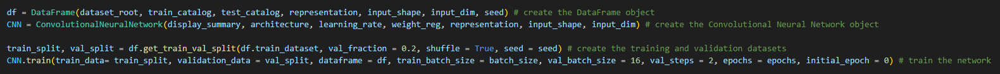

*Basic use of main.py file as of 22/03/2024*

26/03/2024

had bug where network wouldn't learn, loss either exploded towards infinity or hovered around value.

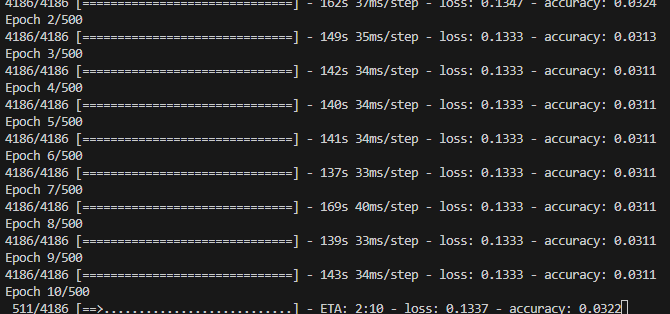

*loss hovering around value*

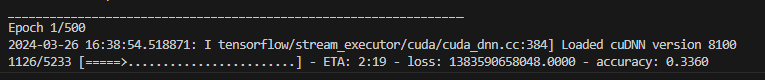

*exploding loss*

issue was with how dataset was being constructed.

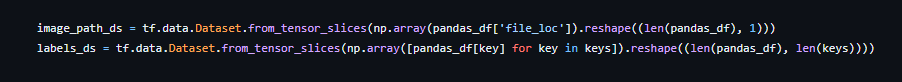

*problematic lines*

gave every image the a part of the column corresponding to a label key up to a the number of labels. So it looked correct shape/length wise but instead every image was getting like 3 smooth vote fractions then the next was getting 3 featured-disk votes ect (absolute nonsense labels).

managed to fix it!!

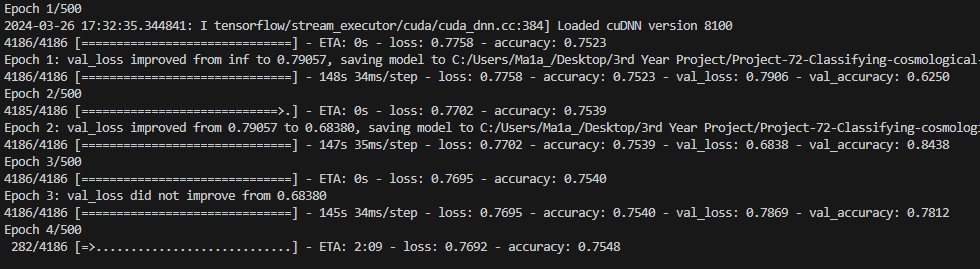



main code is now a collection of seperate python files that interact.

imports.py contains the imports used throughout the files
dataframe.py constructs a dataframe and peforms operations on it related to loading of images and creating training and validation splits of the dataset
keys.py contains the class labels, keys, used when acessing the catalog files
network.py constructs a CNN of a specified architecture and performs training and testing of the network, along with saving and loading of weights 

these files interact through main.py, which contaians command line arguments to allow variables to be changed.

In [ ]:
"""
imports.py - 26/03/2024
"""

import matplotlib.pyplot as plt
import numpy as np
import time as time
import datetime as datetime
import os
import pandas as pd
import argparse

import tensorflow as tf
import keras as keras

from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import MaxPooling3D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model

from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

In [ ]:
"""
keys.py - 26/03/2024
"""

def get_keys(class_labels):
    """
    Obtain the keys of the class labels when accessing the class labels from a Pandas DataFrame.
    
    args:
    class_labels (str): the class labels to consider.
    
    returns:
    keys (list): the keys of the class labels
    """
    if class_labels == 'binary':
        keys = [
        'smooth-or-featured-gz2_smooth_fraction',
        ]
        return keys
    
    elif class_labels == 'Q1':
        keys = [
            'smooth-or-featured-gz2_smooth_fraction',
            'smooth-or-featured-gz2_featured-or-disk_fraction',
            'smooth-or-featured-gz2_artifact_fraction',
        ] 
        return keys
    
    elif class_labels == 'all':
        keys = [
            'smooth-or-featured-gz2_smooth_fraction',
            'smooth-or-featured-gz2_featured-or-disk_fraction',
            'smooth-or-featured-gz2_artifact_fraction',
            'disk-edge-on-gz2_yes_fraction',
            'disk-edge-on-gz2_no_fraction',
            'bar-gz2_yes_fraction',
            'bar-gz2_no_fraction',
            'has-spiral-arms-gz2_yes_fraction',
            'has-spiral-arms-gz2_no_fraction',
            'bulge-size-gz2_no_fraction',
            'bulge-size-gz2_just-noticeable_fraction',
            'bulge-size-gz2_obvious_fraction',
            'bulge-size-gz2_dominant_fraction',
            'something-odd-gz2_yes_fraction',
            'something-odd-gz2_no_fraction',
            'how-rounded-gz2_round_fraction',
            'how-rounded-gz2_in-between_fraction',
            'how-rounded-gz2_cigar_fraction',
            'bulge-shape-gz2_round_fraction',
            'bulge-shape-gz2_boxy_fraction',
            'bulge-shape-gz2_no-bulge_fraction',
            'spiral-winding-gz2_tight_fraction',
            'spiral-winding-gz2_medium_fraction',
            'spiral-winding-gz2_loose_fraction',
            'spiral-arm-count-gz2_1_fraction',
            'spiral-arm-count-gz2_2_fraction',
            'spiral-arm-count-gz2_3_fraction',
            'spiral-arm-count-gz2_4_fraction',
            'spiral-arm-count-gz2_more-than-4_fraction',
            'spiral-arm-count-gz2_cant-tell_fraction',
        ]
        return keys
    else:
        raise ValueError(f"Invalid representation parameter provided: {class_labels}")

In [ ]:
"""
dataframe.py - 26/03/2024
"""

from packages.imports import os, tf, pd, np
from dataframe.keys import get_keys

class DataFrame():
    def __init__(self, dataset_root, train_catalog, test_catalog, classes, one_hot, input_shape, input_dim, seed, ds_fraction):
        """
        Construct a DataFrame containing the represenation of the training and test data
        
        args:
        dataset_root (str): path to the dataset root directory
        train_catalog (str): name of the training catalog file
        test_catalog (str): name of the test catalog file
        keys (list): list of the keys to be used when acessing the class labels
        class_labels (str): the class labels of the dataset to use, i.e smooth-or-featured-gz2_smooth_fraction, spiral-arm-count-gz2_2_fraction ect
        one_hot (bool): whether to one-hot encode the labels
        input_shape (tuple): the input shape of the data, x, y
        input_dim (int): the input dimension of the data, i.e 3 for RGB image
        seed (int): the seed for the random number generator
        ds_fraction (float): the fraction of the dataset to use, range: [0, 1]
        """
        
        self.dataset_root = dataset_root
        
        self.train_parquet_file_path = os.path.join(self.dataset_root, train_catalog)
        self.test_parquet_file_path = os.path.join(self.dataset_root, test_catalog)
        
        self.classes = classes
        self.input_shape = input_shape
        self.input_dim = input_dim
        self.keys = get_keys(classes)
        self.one_hot = one_hot
        self.seed = seed
        
        if ds_fraction < 0 or ds_fraction > 1:
            raise ValueError("The fraction of the dataset to use must be in the range [0, 1]")
        else:
            self.ds_fraction = ds_fraction
        
        self.train_dataset = self.__init_dataset(self.keys, self.train_parquet_file_path, self.one_hot)
        self.test_dataset = self.__init_dataset(self.keys, self.test_parquet_file_path, self.one_hot)
        
        tf.random.set_seed(seed)
        
    #--------------------------------------------------------------------- DATASET(S) INITIALIZATION ---------------------------------------------------------------------------------------
    def __init_dataset(self, keys, catalog_path, one_hot):
        """
        Initialise a dataset, containing paths to the image files and the labels.
        
        args:
        keys (list): the keys of the class labels
        catalog_path (str): the path to the catalog file
        one_hot (bool): whether to one-hot encode the labels
        
        returns:
        dataset (tf.data.Dataset): a zipped dataset containing a tuple of a tf.data.Dataset of image paths and a tf.data.Dataset of labels 
        """      
        
        pandas_df = pd.read_parquet(catalog_path)
        pandas_df = pandas_df.fillna(0)
        
        pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
        
        for idx, _ in enumerate(pandas_df['id_str']):  
            pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))

            if not os.path.exists(pandas_df['file_loc'][idx]): 
                pandas_df = pandas_df.drop(idx)
                
        image_path_ds = tf.data.Dataset.from_tensor_slices(pandas_df['file_loc'])
        labels_ds = tf.data.Dataset.from_tensor_slices(pandas_df[keys]) 
        
        if one_hot: # round the labels to the nearest integer to encode as one-hot (0 or 1)
            labels_ds = labels_ds.map(tf.round)
            
        return tf.data.Dataset.zip((image_path_ds, labels_ds)).take(int(len(labels_ds) * self.ds_fraction)) # take a fraction of the dataset if you want to use a smaller dataset
        
    #--------------------------------------------------------------------------------- IMAGE PROCESSING -------------------------------------------------------------------------------------
    def fetch_image_label_pair(self, image_path, label):
        """
        Fetches an image and its corresponding label from the dataset.
        
        args:
        image_path (tf.Tensor): the path to the image file
        label (tf.Tensor): the label of the image
        
        returns:
        (tuple): of the image and its corresponding label
            image (tf.Tensor): the requested image
            label (tf.Tensor): the requested label
        """
        image_path = tf.squeeze(image_path)
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels = self.input_dim)
        image = tf.image.convert_image_dtype(image, tf.float32) # Convert image dtype from tf.uint8 to tf.float32 to allow for image normalisation
        #image = tf.image.resize(image, self.input_shape) 
        
        return image, label
    
    #TODO: implement image augmentation methods here, i.e rotation, flipping, scaling, translation, brightness, contrast, saturation, hue, denoising, adding noise, reducing resolution, blurring
    #----------------------------------------------------------------------------- VALIDATION DATA SPLITTING ---------------------------------------------------------------------------------
    def get_train_val_split(self, data, val_fraction, shuffle, seed):
        """
        Split the training dataset into a training and validation dataset.
        
        args:
        data (tf.data.Dataset): the input dataset to be split
        val_fraction (float): the fraction of the dataset to be used for validation, range: [0, 1]
        shuffle (bool): shuffle the dataset before splitting
        seed (int): the seed for the random number generator
        
        returns: 
        (tuple): of training and validation datasets
            train_split (tf.data.Dataset): the training dataset
            validation_split (tf.data.Dataset): the validation dataset
        """ 
        if val_fraction < 0 or val_fraction > 1:
            raise ValueError("The fraction of the dataset to use must be in the range [0, 1]")
        else:
            if shuffle:
                data = data.shuffle(buffer_size = len(data), seed = seed)
                
            train_size = int(len(data) * (1 - val_fraction))
            
        return data.take(train_size), data.skip(train_size)
    
    def get_kfolds(self):
        pass


In [ ]:
"""
network.py - 26/03/2024
"""

from packages.imports import os, datetime, tf, keras, MaxPooling2D, MaxPooling3D, Conv2D, Conv3D, Sequential, Flatten, Dense, Dropout, KFold, StratifiedKFold, ResNet50, Model
from dataframe.keys import get_keys

class ConvolutionalNeuralNetwork():
    def __init__(self, display_summary, architecture, learning_rate, weight_reg, representation, input_shape, input_dim):
        """
        Construct a Convolutional Neural Network of a specified architecture.
        
        args:
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        learning_rate (float): the learning rate of the network
        weight_reg (str): the weight regularization of the network
        train_class_labels (list): the class labels of the training data
        test_class_labels (list): the class labels of the test data
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_dim (int): the input dimension of the data
        """
        
        self.display_summary = display_summary
        self.architecture = architecture
        self.learning_rate = learning_rate
        self.weight_reg = weight_reg
        
        self.representation = representation
        self.label_length = len(get_keys(representation))
        
        self.input_x, self.input_y = input_shape
        self.input_dim = input_dim
        
        self.network = self.__init_network(display_summary, architecture)
        
        self.train_history = None
        self.test_history = None
    #------------------------------------------------------------------------- NETWORK INITIALIZATION -----------------------------------------------------------------------    
    def __init_network(self, display_summary: bool = False, architecture: str = "216x64") -> tf.keras.Model:
        """
        Initalise a Convolutional Neural Network of a specified architecture using the Keras Sequential API.
        
        args:
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        """
        lr = self.learning_rate
        
        # Weight regularization
        if self.weight_reg is None:
            wr = None
        else:
            wr = tf.keras.regularizers.l2(self.weight_reg)
        
        if architecture == '128x64xn':
            
            network = Sequential()
            network.add(Conv2D(filters = 32, kernel_size = (7, 7), strides = 3, activation = 'relu', kernel_regularizer = wr, input_shape = (self.input_x, self.input_y, self.input_dim), name = "Convolutional_1")) # input_shape doesn't work, issue with combining tuple self.input_shape and int self.input_dim
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
            network.add(MaxPooling2D(pool_size = (2,2)))
            network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_3"))
            network.add(Flatten())
            network.add(Dense(units = 128, activation = 'relu', kernel_regularizer = wr, name = "Dense_1"))
            network.add(Dropout(0.5))
            network.add(Dense(units = 64, activation = 'relu', kernel_regularizer = wr, name = "Dense_2"))
            network.add(Dropout(0.5))
            network.add(Dense(self.label_length, activation = 'softmax', kernel_regularizer = wr)) 
            
            network.compile(loss = 'categorical_crossentropy', optimizer = tf.keras.optimizers.Adam(learning_rate = lr, epsilon = 1e-07), metrics = ['accuracy'])
            # TRY CROSS ENTROPY LOSS
        elif architecture == '400xn':
            
            pass
        
        elif architecture == 'ResNet50':
                       
            network = Sequential()
            
            pretrained_model = ResNet50(include_top=False, input_shape = (self.input_x, self.input_y, self.input_dim), pooling='avg', weights='imagenet')
            
            for layer in pretrained_model.layers:
                layer.trainable = True
                
            network.add(pretrained_model)
            network.add(Flatten())
            network.add(Dense(512, activation = 'relu'))
            network.add(Dense(self.label_length, activation = 'softmax')) 
            
            network.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy']) 
             
        else:
            raise ValueError(f"Invalid architecture parameter provided: {architecture}")
        
        if (display_summary):
            network.summary()
            
        return network
    #------------------------------------------------------------------------- NETWORK TRAINING AND TESTING ---------------------------------------------------------------------------
    def train(self, train_data, validation_data, dataframe, train_batch_size, val_batch_size, val_steps, epochs, initial_epoch, checkpointfolder):
        """
        Train the network on the training data using model.fit().
        
        args:
        train_data (tf.data.Dataset): the training dataset
        validation_data (tf.data.Dataset): the validation dataset
        dataframe (DataFrame): An instance of DataFrame containing the representation of the training and test data
        train_batch_size (int): the batch size of the training data
        val_batch_size (int): the batch size of the validation data
        val_steps (int): the number of steps to run the validation data
        epochs (int): the number of epochs to train the network
        initial_epoch (int): the initial epoch to start training the network from
        """
        train_data = train_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE # allow for tensorflow to dynamically decide the number of parallel calls to make
        ).batch(
            train_batch_size # batch the dataset into batches of size batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE # allow for prefetching to parallelize the loading of the images and labels with the training of the network
        )
        
        validation_data = validation_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE
        ).batch(
            val_batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE
        )
        
        self.train_history = self.network.fit(
            train_data,
            epochs = epochs,
            verbose = 1,
            callbacks = [self.__checkpoint_callback(checkpointfolder)],
            validation_data = validation_data,
            shuffle = True,
            initial_epoch = initial_epoch,
            steps_per_epoch = None,
            validation_steps = val_steps,
            validation_batch_size = val_batch_size,
            validation_freq = 1,
            # max_queue_size = 10,
            # workers = 1,
            # use_multiprocessing = True
        )
        
    def test(self, test_data, dataframe, test_batch_size, test_steps):
        """
        Evaluate the network on the test data using model.evaluate().
        
        args:
        test_data (tf.data.Dataset): the test dataset
        dataframe (DataFrame): An instance of DataFrame containing the representation of the training and test data
        test_batch_size (int): the batch size of the test data
        test_steps (int): the number of steps to run the test data
        """
        
        test_data = test_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE
        ).batch(
            test_batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE
        )
        
        self.test_history = self.network.evaluate(
            test_data,
            batch_size = test_batch_size,
            verbose = 1,
            steps = test_steps,
            callbacks = None,
            # max_queue_size = 10,
            # workers = 1,
            # use_multiprocessing = True,
            return_dict = True
        )
        
    #----------------------------------------------------------------- NETWORK WEIGHTS AND BIASES SAVING AND LOADING ----------------------------------------------------------------   
    def save(self, checkpoint_path):
        """
        Save the network weights and biases to a file.
        
        args:
        checkpoint_path (str): the path to the directory to save the network weights and biases
        """
        timestamp = datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.save_weights(path)
        
    
    def load(self, checkpoint_path, timestamp):
        """
        Load the network weights and biases from a file.
        
        args:
        checkpoint_path (str): the path to the directory to load the network weights and biases
        """
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.load_weights(path)
    
    def __checkpoint_callback(self, checkpointfolder):
        """
        A ModelCheckpoint callback to save the best model during training.
        
        args:
        checkpointfolder (str): the path to the directory to save the model checkpoint
        
        returns:
        tf.keras.callbacks.ModelCheckpoint: a ModelCheckpoint callback
        """
            
        return tf.keras.callbacks.ModelCheckpoint(
            filepath = os.path.join(checkpointfolder, "model-checkpoint-" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + ".keras"),
            save_weights_only = False,
            save_freq = 'epoch',
            monitor = 'val_loss',
            mode = 'min',
            save_best_only = True,
            verbose = 1
        )


In [ ]:
"""
main.py - 26/03/2024
"""

from packages.imports import argparse, os
from dataframe.dataframe import DataFrame
from network.network import ConvolutionalNeuralNetwork

def main(root, dataset_root, checkpointroot, train_catalog, test_catalog, classes, one_hot, ds_fraction, input_shape, input_dim, display_summary, architecture, learning_rate, weight_reg, batch_size, epochs, seed):
    
    if not os.path.exists(os.path.join(root, checkpointroot)):
        os.makedirs(os.path.join(root, checkpointroot))
        
    dataset_root = os.path.join(root, dataset_root)
    checkpoint_path = os.path.join(root, checkpointroot)
     
    df = DataFrame(dataset_root, train_catalog, test_catalog, classes, one_hot, input_shape, input_dim, seed, ds_fraction = ds_fraction)
    CNN = ConvolutionalNeuralNetwork(display_summary, architecture, learning_rate, weight_reg, classes, input_shape, input_dim)
    
    train_split, val_split = df.get_train_val_split(df.train_dataset, val_fraction = 0.2, shuffle = True, seed = seed)
    CNN.train(train_data = train_split, validation_data = val_split, dataframe = df, train_batch_size = batch_size, val_batch_size = 16, val_steps = 2, epochs = epochs, initial_epoch = 0, checkpointfolder =  checkpoint_path)
    
    #TODO: implement loading of the network weights and biases
    # implement kfold cross validation with tf.datasets or sklearn
    # implement training and testing metrics, i.e accuracy, precision, recall, f1-score, confusion matrix
    # implement plotting of the training and testing metrics
 
if __name__ == "__main__":
    """run `python network.py --help` for argument information""" 
    # ensure you are in the correct directory where py file is located, can change directory by running `cd "<directory path>"`
    # i.e run `cd "C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/main"` to change directory
    
    parser = argparse.ArgumentParser(prog = "network.py")
    
    parser.add_argument("-dim",       "--inputdim", type = int,   default = 3,          help = "(int) The input dimension of the data")
    parser.add_argument("-ixy",     "--inputshape", type = tuple, default = (424, 424), help = "(tuple) The input shape of the data, i.e (424, 424) for 424x424 images")
    
    parser.add_argument("-r",             "--root", type = str,   default = r"C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning", help = "(str) The path to the root directory")
    parser.add_argument("-dsr",    "--datasetroot", type = str,   default = r"galaxyzoo2-dataset/",       help = "(str) The path to the dataset root directory")
    parser.add_argument("-l",           "--labels", type = str,   default = r"gz2_train_catalog.parquet", help = "(str) The name of the training catalog file")
    parser.add_argument("-tl",      "--testlabels", type = str,   default = r"gz2_test_catalog.parquet",  help = "(str) The name of the test catalog file") 
    parser.add_argument("-cpr", "--checkpointroot", type = str,   default = r"checkpoints/", help = "(str) The path to the checkpoint directory")
    parser.add_argument("-c",          "--classes", type = str,   default = "Q1",       help = "(str) The classes to consider for each image, summarised as one 'representation'.")
    parser.add_argument("-oh",          "--onehot", type = bool,  default = False,      help = "(bool) If to one-hot encode the labels")
    parser.add_argument("-dsf",     "--dsfraction", type = float, default = 0.5,        help = "(float) The fraction of the dataset to use, range: [0, 1]")
    
    parser.add_argument("-sum",        "--summary", type = bool,  default = True,       help = "(bool) Display the summary of the network")
    parser.add_argument("-a",     "--architecture", type = str,   default = "128x64xn", help = "(str) The architecture of the network")
    parser.add_argument("-lr",    "--learningrate", type = float, default = 0.001,      help = "(float) The learning rate of the network")
    parser.add_argument("-wr",       "--weightreg", type = str,   default = None,       help = "(str) The weight regularization of the network")
    parser.add_argument("-bs",       "--batchsize", type = int,   default = 32,         help = "(int) The batch size of the network")
    parser.add_argument("-e",           "--epochs", type = int,   default = 500,        help = "(int) The number of epochs to train the network")
    parser.add_argument("-s",             "--seed", type = int,   default = 0,          help = "(int) The seed for the random number generator")
    
    args = parser.parse_args()

    main(
        input_dim = args.inputdim,
        input_shape = args.inputshape,
        root = args.root,
        dataset_root = args.datasetroot,
        train_catalog = args.labels,
        test_catalog = args.testlabels,
        checkpointroot = args.checkpointroot,
        classes = args.classes,
        one_hot = args.onehot,
        ds_fraction = args.dsfraction,
        display_summary = args.summary,
        architecture = args.architecture,
        learning_rate = args.learningrate,
        weight_reg = args.weightreg,
        batch_size = args.batchsize,
        epochs = args.epochs,
        seed = args.seed
    )       

Trained for 75 epochs, 20% val split, 32 batch size, 0.001 learning rate, 128x64xn architecture, 3 input dimension, vote-fraction representation, 424x424 input shape, no weight regularization
Used keys: 
'smooth-or-featured-gz2_smooth_fraction',
'smooth-or-featured-gz2_featured-or-disk_fraction',
'smooth-or-featured-gz2_artifact_fraction',

(first question in decision tree)

output:

In [ ]:
"""
PS C:\Users\Ma1a_\Desktop\3rd Year Project> & C:/Users/Ma1a_/AppData/Local/Programs/Python/Python310/python.exe "c:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/main/main.py"
2024-03-26 17:52:32.913764: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-26 17:52:33.463858: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5941 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2080 SUPER, pci bus id: 0000:0a:00.0, compute capability: 7.5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 Convolutional_1 (Conv2D)    (None, 140, 140, 32)      4736      

 max_pooling2d (MaxPooling2D  (None, 70, 70, 32)       0
 )

 Convolutional_2 (Conv2D)    (None, 68, 68, 64)        18496     

 max_pooling2d_1 (MaxPooling  (None, 34, 34, 64)       0
 2D)

 Convolutional_3 (Conv2D)    (None, 32, 32, 64)        36928     

 flatten (Flatten)           (None, 65536)             0

 Dense_1 (Dense)             (None, 128)               8388736

 dropout (Dropout)           (None, 128)               0

 Dense_2 (Dense)             (None, 64)                8256

 dropout_1 (Dropout)         (None, 64)                0

 dense (Dense)               (None, 3)                 195

=================================================================
Total params: 8,457,347
Trainable params: 8,457,347
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
2024-03-26 17:52:47.244629: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2093/2093 [==============================] - ETA: 0s - loss: 0.6844 - accuracy: 0.8290     
Epoch 1: val_loss improved from inf to 0.59793, saving model to C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning\checkpoints\model-checkpoint-20240326-175245.keras
2093/2093 [==============================] - 60s 27ms/step - loss: 0.6844 - accuracy: 0.8290 - val_loss: 0.5979 - val_accuracy: 0.9062
Epoch 2/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.6343 - accuracy: 0.8776  
Epoch 2: val_loss did not improve from 0.59793
2093/2093 [==============================] - 57s 27ms/step - loss: 0.6343 - accuracy: 0.8776 - val_loss: 0.6510 - val_accuracy: 0.8125
Epoch 3/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.6203 - accuracy: 0.8929  
Epoch 3: val_loss did not improve from 0.59793
2093/2093 [==============================] - 55s 26ms/step - loss: 0.6203 - accuracy: 0.8930 - val_loss: 0.6620 - val_accuracy: 0.9375
Epoch 4/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.6142 - accuracy: 0.9018  
Epoch 4: val_loss improved from 0.59793 to 0.54981, saving model to C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning\checkpoints\model-checkpoint-20240326-175245.keras
2093/2093 [==============================] - 59s 28ms/step - loss: 0.6142 - accuracy: 0.9018 - val_loss: 0.5498 - val_accuracy: 0.9375
Epoch 5/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.6079 - accuracy: 0.9083  
Epoch 5: val_loss did not improve from 0.54981
2093/2093 [==============================] - 56s 27ms/step - loss: 0.6079 - accuracy: 0.9083 - val_loss: 0.5513 - val_accuracy: 1.0000
Epoch 6/500
2093/2093 [==============================] - ETA: 0s - loss: 0.6045 - accuracy: 0.9138  
Epoch 6: val_loss did not improve from 0.54981
2093/2093 [==============================] - 57s 27ms/step - loss: 0.6045 - accuracy: 0.9138 - val_loss: 0.6043 - val_accuracy: 0.9375
Epoch 7/500
2093/2093 [==============================] - ETA: 0s - loss: 0.6010 - accuracy: 0.9173  
Epoch 7: val_loss improved from 0.54981 to 0.50042, saving model to C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning\checkpoints\model-checkpoint-20240326-175245.keras
2093/2093 [==============================] - 58s 28ms/step - loss: 0.6010 - accuracy: 0.9173 - val_loss: 0.5004 - val_accuracy: 1.0000
Epoch 8/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5989 - accuracy: 0.9206  
Epoch 8: val_loss did not improve from 0.50042
2093/2093 [==============================] - 58s 28ms/step - loss: 0.5989 - accuracy: 0.9206 - val_loss: 0.5894 - val_accuracy: 0.8750
Epoch 9/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5967 - accuracy: 0.9245  
Epoch 9: val_loss did not improve from 0.50042
2093/2093 [==============================] - 60s 28ms/step - loss: 0.5968 - accuracy: 0.9245 - val_loss: 0.6108 - val_accuracy: 0.8750
Epoch 10/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5950 - accuracy: 0.9253  
Epoch 10: val_loss did not improve from 0.50042
2093/2093 [==============================] - 63s 30ms/step - loss: 0.5950 - accuracy: 0.9253 - val_loss: 0.5850 - val_accuracy: 0.8750
Epoch 11/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5936 - accuracy: 0.9290  
Epoch 11: val_loss did not improve from 0.50042
2093/2093 [==============================] - 64s 30ms/step - loss: 0.5936 - accuracy: 0.9290 - val_loss: 0.5309 - val_accuracy: 1.0000
Epoch 12/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5913 - accuracy: 0.9312  
Epoch 12: val_loss did not improve from 0.50042
2093/2093 [==============================] - 63s 30ms/step - loss: 0.5913 - accuracy: 0.9312 - val_loss: 0.5724 - val_accuracy: 0.9688
Epoch 13/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5899 - accuracy: 0.9330  
Epoch 13: val_loss did not improve from 0.50042
2093/2093 [==============================] - 62s 30ms/step - loss: 0.5900 - accuracy: 0.9329 - val_loss: 0.5684 - val_accuracy: 1.0000
Epoch 14/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5887 - accuracy: 0.9352  
Epoch 14: val_loss did not improve from 0.50042
2093/2093 [==============================] - 62s 30ms/step - loss: 0.5887 - accuracy: 0.9352 - val_loss: 0.5553 - val_accuracy: 0.9688
Epoch 15/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5876 - accuracy: 0.9347  
Epoch 15: val_loss did not improve from 0.50042
2093/2093 [==============================] - 62s 29ms/step - loss: 0.5876 - accuracy: 0.9348 - val_loss: 0.5179 - val_accuracy: 0.9375
Epoch 16/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5871 - accuracy: 0.9353  
Epoch 16: val_loss did not improve from 0.50042
2093/2093 [==============================] - 62s 30ms/step - loss: 0.5871 - accuracy: 0.9353 - val_loss: 0.5757 - val_accuracy: 1.0000
Epoch 17/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5861 - accuracy: 0.9377  
Epoch 17: val_loss did not improve from 0.50042
2093/2093 [==============================] - 62s 30ms/step - loss: 0.5861 - accuracy: 0.9377 - val_loss: 0.5635 - val_accuracy: 0.9688
Epoch 18/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5854 - accuracy: 0.9380  
Epoch 18: val_loss did not improve from 0.50042
2093/2093 [==============================] - 61s 29ms/step - loss: 0.5854 - accuracy: 0.9380 - val_loss: 0.5957 - val_accuracy: 1.0000
Epoch 19/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5851 - accuracy: 0.9388  
Epoch 19: val_loss did not improve from 0.50042
2093/2093 [==============================] - 60s 29ms/step - loss: 0.5851 - accuracy: 0.9388 - val_loss: 0.6050 - val_accuracy: 0.8438
Epoch 20/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5847 - accuracy: 0.9376  
Epoch 20: val_loss did not improve from 0.50042
2093/2093 [==============================] - 60s 29ms/step - loss: 0.5847 - accuracy: 0.9376 - val_loss: 0.6469 - val_accuracy: 0.8750
Epoch 21/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5842 - accuracy: 0.9401  
Epoch 21: val_loss did not improve from 0.50042
2093/2093 [==============================] - 60s 28ms/step - loss: 0.5842 - accuracy: 0.9401 - val_loss: 0.6039 - val_accuracy: 1.0000
Epoch 22/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5835 - accuracy: 0.9414  
Epoch 22: val_loss did not improve from 0.50042
2093/2093 [==============================] - 63s 30ms/step - loss: 0.5835 - accuracy: 0.9414 - val_loss: 0.5377 - val_accuracy: 0.8750
Epoch 23/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5822 - accuracy: 0.9415  
Epoch 23: val_loss did not improve from 0.50042
2093/2093 [==============================] - 64s 30ms/step - loss: 0.5822 - accuracy: 0.9415 - val_loss: 0.5087 - val_accuracy: 1.0000
Epoch 24/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5813 - accuracy: 0.9420  
Epoch 24: val_loss did not improve from 0.50042
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5813 - accuracy: 0.9420 - val_loss: 0.5586 - val_accuracy: 0.9375
Epoch 25/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5810 - accuracy: 0.9419  
Epoch 25: val_loss did not improve from 0.50042
2093/2093 [==============================] - 58s 27ms/step - loss: 0.5810 - accuracy: 0.9419 - val_loss: 0.5870 - val_accuracy: 0.9375
Epoch 26/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5811 - accuracy: 0.9430  
Epoch 26: val_loss did not improve from 0.50042
2093/2093 [==============================] - 60s 28ms/step - loss: 0.5811 - accuracy: 0.9429 - val_loss: 0.5825 - val_accuracy: 0.9375
Epoch 27/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5802 - accuracy: 0.9430  
Epoch 27: val_loss improved from 0.50042 to 0.49558, saving model to C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning\checkpoints\model-checkpoint-20240326-175245.keras
2093/2093 [==============================] - 63s 30ms/step - loss: 0.5802 - accuracy: 0.9430 - val_loss: 0.4956 - val_accuracy: 0.9688
Epoch 28/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5808 - accuracy: 0.9437  
Epoch 28: val_loss did not improve from 0.49558
2093/2093 [==============================] - 59s 28ms/step - loss: 0.5809 - accuracy: 0.9438 - val_loss: 0.5429 - val_accuracy: 0.9062
Epoch 29/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5801 - accuracy: 0.9445   
Epoch 29: val_loss did not improve from 0.49558
2093/2093 [==============================] - 59s 28ms/step - loss: 0.5801 - accuracy: 0.9445 - val_loss: 0.6043 - val_accuracy: 0.9688
Epoch 30/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5794 - accuracy: 0.9454  
Epoch 30: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5794 - accuracy: 0.9454 - val_loss: 0.5670 - val_accuracy: 1.0000
Epoch 31/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5795 - accuracy: 0.9440  
Epoch 31: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5795 - accuracy: 0.9440 - val_loss: 0.5460 - val_accuracy: 1.0000
Epoch 32/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5782 - accuracy: 0.9445  
Epoch 32: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5782 - accuracy: 0.9445 - val_loss: 0.5701 - val_accuracy: 0.9375
Epoch 33/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5786 - accuracy: 0.9458  
Epoch 33: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5786 - accuracy: 0.9458 - val_loss: 0.6732 - val_accuracy: 0.9375
Epoch 34/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5780 - accuracy: 0.9461  
Epoch 34: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5780 - accuracy: 0.9461 - val_loss: 0.5661 - val_accuracy: 0.9062
Epoch 35/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5780 - accuracy: 0.9444  
Epoch 35: val_loss did not improve from 0.49558
2093/2093 [==============================] - 72s 34ms/step - loss: 0.5780 - accuracy: 0.9445 - val_loss: 0.5659 - val_accuracy: 0.9375
Epoch 36/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5770 - accuracy: 0.9449  
Epoch 36: val_loss did not improve from 0.49558
2093/2093 [==============================] - 58s 27ms/step - loss: 0.5770 - accuracy: 0.9449 - val_loss: 0.5969 - val_accuracy: 0.9688
Epoch 37/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5776 - accuracy: 0.9458  
Epoch 37: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5776 - accuracy: 0.9458 - val_loss: 0.5058 - val_accuracy: 1.0000
Epoch 38/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5773 - accuracy: 0.9454  
Epoch 38: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5773 - accuracy: 0.9454 - val_loss: 0.6048 - val_accuracy: 0.9375
Epoch 39/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5769 - accuracy: 0.9471  
Epoch 39: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5769 - accuracy: 0.9471 - val_loss: 0.5573 - val_accuracy: 1.0000
Epoch 40/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5760 - accuracy: 0.9467  
Epoch 40: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5760 - accuracy: 0.9467 - val_loss: 0.5073 - val_accuracy: 1.0000
Epoch 41/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5762 - accuracy: 0.9472  
Epoch 41: val_loss did not improve from 0.49558
2093/2093 [==============================] - 58s 28ms/step - loss: 0.5762 - accuracy: 0.9472 - val_loss: 0.6121 - val_accuracy: 1.0000
Epoch 42/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5767 - accuracy: 0.9460   
Epoch 42: val_loss did not improve from 0.49558
2093/2093 [==============================] - 58s 27ms/step - loss: 0.5767 - accuracy: 0.9460 - val_loss: 0.6336 - val_accuracy: 0.9062
Epoch 43/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5757 - accuracy: 0.9474  
Epoch 43: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5758 - accuracy: 0.9474 - val_loss: 0.5659 - val_accuracy: 1.0000
Epoch 44/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5760 - accuracy: 0.9481  
Epoch 44: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5760 - accuracy: 0.9481 - val_loss: 0.6135 - val_accuracy: 0.9688
Epoch 45/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5761 - accuracy: 0.9491  
Epoch 45: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5761 - accuracy: 0.9491 - val_loss: 0.5865 - val_accuracy: 1.0000
Epoch 46/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5755 - accuracy: 0.9475  
Epoch 46: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5755 - accuracy: 0.9475 - val_loss: 0.5311 - val_accuracy: 0.9688
Epoch 47/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5751 - accuracy: 0.9475  
Epoch 47: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5751 - accuracy: 0.9475 - val_loss: 0.5840 - val_accuracy: 0.9688
Epoch 48/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5752 - accuracy: 0.9489  
Epoch 48: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5752 - accuracy: 0.9489 - val_loss: 0.5302 - val_accuracy: 0.9375
Epoch 49/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5746 - accuracy: 0.9486  
Epoch 49: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5746 - accuracy: 0.9486 - val_loss: 0.5163 - val_accuracy: 0.9375
Epoch 50/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5748 - accuracy: 0.9476  
Epoch 50: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5749 - accuracy: 0.9476 - val_loss: 0.6176 - val_accuracy: 0.9688
Epoch 51/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5745 - accuracy: 0.9481  
Epoch 51: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5745 - accuracy: 0.9481 - val_loss: 0.5083 - val_accuracy: 1.0000
Epoch 52/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5737 - accuracy: 0.9484  
Epoch 52: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5737 - accuracy: 0.9484 - val_loss: 0.5986 - val_accuracy: 0.9062
Epoch 53/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5745 - accuracy: 0.9469  
Epoch 53: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5745 - accuracy: 0.9469 - val_loss: 0.5899 - val_accuracy: 1.0000
Epoch 54/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5739 - accuracy: 0.9480  
Epoch 54: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5739 - accuracy: 0.9480 - val_loss: 0.5440 - val_accuracy: 0.9688
Epoch 55/500
2091/2093 [============================>.] - ETA: 0s - loss: 0.5738 - accuracy: 0.9491  
Epoch 55: val_loss did not improve from 0.49558
2093/2093 [==============================] - 57s 27ms/step - loss: 0.5738 - accuracy: 0.9490 - val_loss: 0.5072 - val_accuracy: 1.0000
Epoch 56/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5741 - accuracy: 0.9490  
Epoch 56: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5741 - accuracy: 0.9490 - val_loss: 0.5391 - val_accuracy: 0.9375
Epoch 57/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5733 - accuracy: 0.9500  
Epoch 57: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5733 - accuracy: 0.9500 - val_loss: 0.5576 - val_accuracy: 1.0000
Epoch 58/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5734 - accuracy: 0.9505   
Epoch 58: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5734 - accuracy: 0.9505 - val_loss: 0.5337 - val_accuracy: 1.0000
Epoch 59/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5742 - accuracy: 0.9489  
Epoch 59: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5742 - accuracy: 0.9489 - val_loss: 0.5577 - val_accuracy: 0.9688
Epoch 60/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5737 - accuracy: 0.9500  
Epoch 60: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5737 - accuracy: 0.9500 - val_loss: 0.5684 - val_accuracy: 0.9688
Epoch 61/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5734 - accuracy: 0.9492  
Epoch 61: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5734 - accuracy: 0.9492 - val_loss: 0.5480 - val_accuracy: 1.0000
Epoch 62/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5731 - accuracy: 0.9495  
Epoch 62: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5731 - accuracy: 0.9495 - val_loss: 0.6172 - val_accuracy: 0.9688
Epoch 63/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5728 - accuracy: 0.9502  
Epoch 63: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5728 - accuracy: 0.9502 - val_loss: 0.5477 - val_accuracy: 0.9688
Epoch 64/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5723 - accuracy: 0.9487  
Epoch 64: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5723 - accuracy: 0.9487 - val_loss: 0.5474 - val_accuracy: 0.9062
Epoch 65/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5723 - accuracy: 0.9505  
Epoch 65: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5723 - accuracy: 0.9505 - val_loss: 0.5268 - val_accuracy: 0.8438
Epoch 66/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5732 - accuracy: 0.9500  
Epoch 66: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5732 - accuracy: 0.9500 - val_loss: 0.5385 - val_accuracy: 0.9688
Epoch 67/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5723 - accuracy: 0.9497  
Epoch 67: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5723 - accuracy: 0.9497 - val_loss: 0.5370 - val_accuracy: 0.9688
Epoch 68/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5722 - accuracy: 0.9500  
Epoch 68: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5722 - accuracy: 0.9500 - val_loss: 0.5685 - val_accuracy: 1.0000
Epoch 69/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5719 - accuracy: 0.9515  
Epoch 69: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5718 - accuracy: 0.9515 - val_loss: 0.5527 - val_accuracy: 1.0000
Epoch 70/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5720 - accuracy: 0.9510  
Epoch 70: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5720 - accuracy: 0.9510 - val_loss: 0.5720 - val_accuracy: 0.9688
Epoch 71/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5721 - accuracy: 0.9519  
Epoch 71: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5721 - accuracy: 0.9519 - val_loss: 0.5641 - val_accuracy: 0.9062
Epoch 72/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5725 - accuracy: 0.9490  
Epoch 72: val_loss did not improve from 0.49558
2093/2093 [==============================] - 56s 27ms/step - loss: 0.5725 - accuracy: 0.9490 - val_loss: 0.5603 - val_accuracy: 0.9688
Epoch 73/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5714 - accuracy: 0.9509  
Epoch 73: val_loss did not improve from 0.49558
2093/2093 [==============================] - 61s 29ms/step - loss: 0.5714 - accuracy: 0.9509 - val_loss: 0.5978 - val_accuracy: 0.9688
Epoch 74/500
2093/2093 [==============================] - ETA: 0s - loss: 0.5716 - accuracy: 0.9507  
Epoch 74: val_loss did not improve from 0.49558
2093/2093 [==============================] - 58s 28ms/step - loss: 0.5716 - accuracy: 0.9507 - val_loss: 0.5538 - val_accuracy: 1.0000
Epoch 75/500
2092/2093 [============================>.] - ETA: 0s - loss: 0.5717 - accuracy: 0.9510  
Epoch 75: val_loss did not improve from 0.49558
2093/2093 [==============================] - 59s 28ms/step - loss: 0.5717 - accuracy: 0.9510 - val_loss: 0.5444 - val_accuracy: 1.0000
"""

need to implement:

- loading of saved network
- early stopping
- saving network weights once training has finished
- displaying of metrics in tensorboard or with matplotlib
- kfold-cross validation using sklearn

In [ ]:
"""
PS C:\Users\Ma1a_\Desktop\3rd Year Project> & C:/Users/Ma1a_/AppData/Local/Programs/Python/Python310/python.exe "c:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/main/main.py"
2024-03-26 19:43:41.523633: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-26 19:43:42.074554: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5941 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2080 SUPER, pci bus id: 0000:0a:00.0, compute capability: 7.5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 Convolutional_1 (Conv2D)    (None, 140, 140, 32)      4736      

 max_pooling2d (MaxPooling2D  (None, 70, 70, 32)       0
 )

 Convolutional_2 (Conv2D)    (None, 68, 68, 64)        18496     

 max_pooling2d_1 (MaxPooling  (None, 34, 34, 64)       0
 2D)

 Convolutional_3 (Conv2D)    (None, 32, 32, 64)        36928     

 flatten (Flatten)           (None, 65536)             0

 Dense_1 (Dense)             (None, 128)               8388736

 dropout (Dropout)           (None, 128)               0

 Dense_2 (Dense)             (None, 64)                8256

 dropout_1 (Dropout)         (None, 64)                0

 dense (Dense)               (None, 30)                1950

=================================================================
Total params: 8,459,102
Trainable params: 8,459,102
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
2024-03-26 19:43:55.782316: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
419/419 [==============================] - ETA: 0s - loss: 13394953371648.0000 - accuracy: 0.1460
Epoch 1: val_loss improved from inf to 61264613081088.00000, saving model to C:/Users/Ma1a_/Desktop/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning\checkpoints\model-checkpoint-20240326-194354.keras
419/419 [==============================] - 15s 28ms/step - loss: 13394953371648.0000 - accuracy: 0.1460 - val_loss: 61264613081088.0000 - val_accuracy: 0.5000
Epoch 2/500
417/419 [============================>.] - ETA: 0s - loss: 1885763507585024.0000 - accuracy: 0.1710
Epoch 2: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 1901604554932224.0000 - accuracy: 0.1713 - val_loss: 4891130768392192.0000 - val_accuracy: 0.5000
Epoch 3/500
418/419 [============================>.] - ETA: 0s - loss: 26762351390752768.0000 - accuracy: 0.1662
Epoch 3: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 26787747532374016.0000 - accuracy: 0.1661 - val_loss: 52150360491425792.0000 - val_accuracy: 0.6250
Epoch 4/500
416/419 [============================>.] - ETA: 0s - loss: 150429941052211200.0000 - accuracy: 0.1716
Epoch 4: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 151064788758167552.0000 - accuracy: 0.1716 - val_loss: 297512144075751424.0000 - val_accuracy: 0.3438
Epoch 5/500
418/419 [============================>.] - ETA: 0s - loss: 533146041483001856.0000 - accuracy: 0.1647 
Epoch 5: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 533591652929896448.0000 - accuracy: 0.1646 - val_loss: 723407457698709504.0000 - val_accuracy: 0.5312
Epoch 6/500
418/419 [============================>.] - ETA: 0s - loss: 1444021743546007552.0000 - accuracy: 0.1695
Epoch 6: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 1445483956571996160.0000 - accuracy: 0.1694 - val_loss: 2036317112556847104.0000 - val_accuracy: 0.5938
Epoch 7/500
416/419 [============================>.] - ETA: 0s - loss: 3238939978713006080.0000 - accuracy: 0.1720 
Epoch 7: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 3245738259107545088.0000 - accuracy: 0.1717 - val_loss: 4670222368222740480.0000 - val_accuracy: 0.5312
Epoch 8/500
417/419 [============================>.] - ETA: 0s - loss: 6346505910092824576.0000 - accuracy: 0.1687 
Epoch 8: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 6356006240312623104.0000 - accuracy: 0.1688 - val_loss: 7950049061204131840.0000 - val_accuracy: 0.3438
Epoch 9/500
419/419 [==============================] - ETA: 0s - loss: 11274639621331353600.0000 - accuracy: 0.1703
Epoch 9: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 11274639621331353600.0000 - accuracy: 0.1703 - val_loss: 14811850991258828800.0000 - val_accuracy: 0.4062
Epoch 10/500
418/419 [============================>.] - ETA: 0s - loss: 18903872630027190272.0000 - accuracy: 0.1678 
Epoch 10: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 18904367410259689472.0000 - accuracy: 0.1677 - val_loss: 19380343794900664320.0000 - val_accuracy: 0.0938
Epoch 11/500
418/419 [============================>.] - ETA: 0s - loss: 29680854596929454080.0000 - accuracy: 0.1663 
Epoch 11: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 29697369261578649600.0000 - accuracy: 0.1663 - val_loss: 36417678888545550336.0000 - val_accuracy: 0.5312
Epoch 12/500
418/419 [============================>.] - ETA: 0s - loss: 44594309258687807488.0000 - accuracy: 0.1685 
Epoch 12: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 44614878922220240896.0000 - accuracy: 0.1685 - val_loss: 44532890539160240128.0000 - val_accuracy: 0.5938
Epoch 13/500
418/419 [============================>.] - ETA: 0s - loss: 64916912528359948288.0000 - accuracy: 0.1696 
Epoch 13: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 64921816350219829248.0000 - accuracy: 0.1698 - val_loss: 76396258125039009792.0000 - val_accuracy: 0.4688
Epoch 14/500
418/419 [============================>.] - ETA: 0s - loss: 90862629368711086080.0000 - accuracy: 0.1650 
Epoch 14: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 90863051581176152064.0000 - accuracy: 0.1650 - val_loss: 110908080941392986112.0000 - val_accuracy: 0.4688
Epoch 15/500
418/419 [============================>.] - ETA: 0s - loss: 125591003199178801152.0000 - accuracy: 0.1669 
Epoch 15: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 125589059262620893184.0000 - accuracy: 0.1669 - val_loss: 165498261514424942592.0000 - val_accuracy: 0.5312
Epoch 16/500
418/419 [============================>.] - ETA: 0s - loss: 167267595625842081792.0000 - accuracy: 0.1683 
Epoch 16: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 167389104854850863104.0000 - accuracy: 0.1686 - val_loss: 205017453797717311488.0000 - val_accuracy: 0.5000
Epoch 17/500
418/419 [============================>.] - ETA: 0s - loss: 220263686648738349056.0000 - accuracy: 0.1719
Epoch 17: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 12s 28ms/step - loss: 220305151431245037568.0000 - accuracy: 0.1718 - val_loss: 270708998656124518400.0000 - val_accuracy: 0.4688
Epoch 18/500
416/419 [============================>.] - ETA: 0s - loss: 284267736245207040000.0000 - accuracy: 0.1665
Epoch 18: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 284613106041631014912.0000 - accuracy: 0.1669 - val_loss: 298296343531349868544.0000 - val_accuracy: 0.0312
Epoch 19/500
416/419 [============================>.] - ETA: 0s - loss: 364103785711417688064.0000 - accuracy: 0.1667
Epoch 19: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 364299446004603682816.0000 - accuracy: 0.1665 - val_loss: 367187203343794569216.0000 - val_accuracy: 0.5312
Epoch 20/500
418/419 [============================>.] - ETA: 0s - loss: 459777306217230106624.0000 - accuracy: 0.1661
Epoch 20: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 12s 27ms/step - loss: 460126229635235053568.0000 - accuracy: 0.1661 - val_loss: 643960562780964126720.0000 - val_accuracy: 0.0312
Epoch 21/500
417/419 [============================>.] - ETA: 0s - loss: 572899460529336090624.0000 - accuracy: 0.1708
Epoch 21: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 12s 27ms/step - loss: 573077810111454380032.0000 - accuracy: 0.1708 - val_loss: 516607104015111553024.0000 - val_accuracy: 0.6250
Epoch 22/500
417/419 [============================>.] - ETA: 0s - loss: 707578200010967220224.0000 - accuracy: 0.1658
Epoch 22: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: 708141501808109420544.0000 - accuracy: 0.1659 - val_loss: 874715437538220179456.0000 - val_accuracy: 0.3125
Epoch 23/500
418/419 [============================>.] - ETA: 0s - loss: 867701714437288230912.0000 - accuracy: 0.1641 
Epoch 23: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 26ms/step - loss: 867645208335713566720.0000 - accuracy: 0.1642 - val_loss: 811522194204352577536.0000 - val_accuracy: 0.5312
Epoch 24/500
419/419 [==============================] - ETA: 0s - loss: 1047811852166158614528.0000 - accuracy: 0.1686
Epoch 24: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 12s 28ms/step - loss: 1047811852166158614528.0000 - accuracy: 0.1686 - val_loss: 1166991453530194182144.0000 - val_accuracy: 0.5938
Epoch 25/500
419/419 [==============================] - ETA: 0s - loss: 1266519316445221879808.0000 - accuracy: 0.1713 
Epoch 25: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 12s 28ms/step - loss: 1266519316445221879808.0000 - accuracy: 0.1713 - val_loss: 1045847086459974057984.0000 - val_accuracy: 0.0000e+00
Epoch 26/500
419/419 [==============================] - ETA: 0s - loss: 1511639548113882972160.0000 - accuracy: 0.1656 
Epoch 26: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 13s 32ms/step - loss: 1511639548113882972160.0000 - accuracy: 0.1656 - val_loss: 1572476986630170738688.0000 - val_accuracy: 0.5312
Epoch 27/500
418/419 [============================>.] - ETA: 0s - loss: 1794668829645935214592.0000 - accuracy: 0.1627 
Epoch 27: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 13s 32ms/step - loss: 1794539773369113378816.0000 - accuracy: 0.1628 - val_loss: 1696790832306897027072.0000 - val_accuracy: 0.5000
Epoch 28/500
419/419 [==============================] - ETA: 0s - loss: 2131412403196147007488.0000 - accuracy: 0.1710 
Epoch 28: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 13s 31ms/step - loss: 2131412403196147007488.0000 - accuracy: 0.1710 - val_loss: 2809117734297556484096.0000 - val_accuracy: 0.3750
Epoch 29/500
418/419 [============================>.] - ETA: 0s - loss: 2468068860241066852352.0000 - accuracy: 0.1658 
Epoch 29: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 13s 31ms/step - loss: 2468033675868978020352.0000 - accuracy: 0.1658 - val_loss: 1994941794012775841792.0000 - val_accuracy: 0.5312
Epoch 30/500
417/419 [============================>.] - ETA: 0s - loss: 2892569435392731774976.0000 - accuracy: 0.1733 
Epoch 30: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 13s 30ms/step - loss: 2892813192722563203072.0000 - accuracy: 0.1732 - val_loss: 3199013212862459936768.0000 - val_accuracy: 0.1250
Epoch 31/500
417/419 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.0114 
Epoch 31: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 11s 27ms/step - loss: nan - accuracy: 0.0113 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 32/500
418/419 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.0062     
Epoch 32: val_loss did not improve from 61264613081088.00000
419/419 [==============================] - 12s 28ms/step - loss: nan - accuracy: 0.0062 - val_loss: nan - val_accuracy: 0.0000e+00
"""

31/03/2024: - Malachy:

implemented label binarisation:
labels for features are binarised by splitting label vectors into the constituent questions, Q0,Q1,Q2...
the maximum value for a feature per question is taken to be 1 the rest are zero. i.e. for Q1 could have 0.1,0.1,0.8 -> 0,0,1
so full label vector then beomes -> 0,0,1,0,1,1,0,...,0,0,1,0,0 ect encoded as a binary bit string.

ran this for 10 epochs with binary_crosentropy loss with the following 9 labels...

- Q0/ Smooth or Featured?
'smooth-or-featured-gz2_smooth_fraction',
'smooth-or-featured-gz2_featured-or-disk_fraction',
'smooth-or-featured-gz2_artifact_fraction',

- Q1/ Disk Edge On?
'disk-edge-on-gz2_yes_fraction',
'disk-edge-on-gz2_no_fraction',

- Q2/ Has spiral arms?
'has-spiral-arms-gz2_yes_fraction',
'has-spiral-arms-gz2_no_fraction',

- Q3/ Bar?
'bar-gz2_yes_fraction',
'bar-gz2_no_fraction',

achived 56% accuracy with 128x64xn architecture.

In [ ]:
"""
Model: "sequential"
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Convolutional_1 (Conv2D)             │ (None, 140, 140, 32)        │           4,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 70, 70, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolutional_2 (Conv2D)             │ (None, 68, 68, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 34, 34, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolutional_3 (Conv2D)             │ (None, 32, 32, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense_1 (Dense)                      │ (None, 128)                 │       8,388,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense_2 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 9)                   │             585 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘
 Total params: 8,457,737 (32.26 MB)
 Trainable params: 8,457,737 (32.26 MB)
 Non-trainable params: 0 (0.00 B)
Epoch 1/500
2024-03-31 19:07:40.632657: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3683 - loss: 0.4275       
Epoch 1: val_loss improved from inf to 0.36607, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 258s 61ms/step - accuracy: 0.3684 - loss: 0.4275 - val_accuracy: 0.6250 - val_loss: 0.3661
Epoch 2/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.5325 - loss: 0.3256    
Epoch 2: val_loss improved from 0.36607 to 0.33331, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 249s 60ms/step - accuracy: 0.5325 - loss: 0.3256 - val_accuracy: 0.6875 - val_loss: 0.3333
Epoch 3/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5506 - loss: 0.3074    
Epoch 3: val_loss improved from 0.33331 to 0.24896, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 250s 60ms/step - accuracy: 0.5506 - loss: 0.3074 - val_accuracy: 0.5312 - val_loss: 0.2490
Epoch 4/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5549 - loss: 0.2943    
Epoch 4: val_loss improved from 0.24896 to 0.24350, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 250s 60ms/step - accuracy: 0.5549 - loss: 0.2943 - val_accuracy: 0.6562 - val_loss: 0.2435
Epoch 5/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.5652 - loss: 0.2851    
Epoch 5: val_loss did not improve from 0.24350
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 247s 59ms/step - accuracy: 0.5652 - loss: 0.2851 - val_accuracy: 0.5938 - val_loss: 0.2921
Epoch 6/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.5645 - loss: 0.2781   
Epoch 6: val_loss improved from 0.24350 to 0.22548, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 2042s 488ms/step - accuracy: 0.5645 - loss: 0.2781 - val_accuracy: 0.6875 - val_loss: 0.2255
Epoch 7/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - accuracy: 0.5692 - loss: 0.2684   
Epoch 7: val_loss did not improve from 0.22548
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 1617s 386ms/step - accuracy: 0.5692 - loss: 0.2684 - val_accuracy: 0.5938 - val_loss: 0.3121
Epoch 8/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5705 - loss: 0.2625    
Epoch 8: val_loss did not improve from 0.22548
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 251s 60ms/step - accuracy: 0.5705 - loss: 0.2625 - val_accuracy: 0.6562 - val_loss: 0.2606
Epoch 9/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5734 - loss: 0.2552    
Epoch 9: val_loss improved from 0.22548 to 0.19378, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 251s 60ms/step - accuracy: 0.5734 - loss: 0.2552 - val_accuracy: 0.5000 - val_loss: 0.1938
Epoch 10/500
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.5708 - loss: 0.2473    
Epoch 10: val_loss improved from 0.19378 to 0.16957, saving model to /Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/checkpoints/model-checkpoint-20240331-190740.keras
4186/4186 ━━━━━━━━━━━━━━━━━━━━ 255s 61ms/step - accuracy: 0.5708 - loss: 0.2473 - val_accuracy: 0.5625 - val_loss: 0.1696
"""

current state of dataframe.py and network.py:

In [ ]:
from packages.imports import os, tf, pd, np
from dataframe.keys import get_keys, class_labels_to_question

class DataFrame():
    def __init__(self, dataset_root, train_catalog, test_catalog, classes, binarised_labels, input_shape, input_dim, seed, ds_fraction):
        """
        Construct a DataFrame containing the represenation of the training and test data
        
        args:
        dataset_root (str): path to the dataset root directory
        train_catalog (str): name of the training catalog file
        test_catalog (str): name of the test catalog file
        keys (list): list of the keys to be used when acessing the class labels
        classes (str): the class labels of the dataset to use, i.e smooth-or-featured-gz2_smooth_fraction, spiral-arm-count-gz2_2_fraction ect
        binarised_labels (bool): whether to binarise the labels
        input_shape (tuple): the input shape of the data, x, y
        input_dim (int): the input dimension of the data, i.e 3 for RGB image
        seed (int): the seed for the random number generator
        ds_fraction (float): the fraction of the dataset to use, range: [0, 1]
        """
        # RNG
        self.seed = seed
        self.RNG = np.random.default_rng(seed)
        tf.random.set_seed(seed)
        
        # File paths
        self.dataset_root = dataset_root
        self.train_parquet_file_path = os.path.join(self.dataset_root, train_catalog)
        self.test_parquet_file_path = os.path.join(self.dataset_root, test_catalog)
        
        # Class labels to use
        self.keys = get_keys(classes)
        self.question_dict = class_labels_to_question()
        self.group_sizes = self.__init_group_sizes()
        
        # Data properties
        self.input_shape = input_shape
        self.input_dim = input_dim
        
        # Dataset properties
        self.binarised_labels = binarised_labels
        
        if ds_fraction <= 0 or ds_fraction > 1:
            raise ValueError("The fraction of the dataset to use must be in the range (0, 1]")
        else:
            self.ds_fraction = ds_fraction
        
        # Initialise the datasets
        self.train_dataset = self.__init_dataset(self.train_parquet_file_path)
        self.test_dataset = self.__init_dataset(self.test_parquet_file_path)
        
    #--------------------------------------------------------------------- DATASET(S) INITIALIZATION ---------------------------------------------------------------------------------------
    def __init_dataset(self, catalog_path):
        """
        Initialise a dataset, containing paths to the image files and the labels.
        
        args:
        catalog_path (str): the path to the catalog file
        
        returns:
        dataset (tf.data.Dataset): a zipped dataset containing a tuple of a tf.data.Dataset of image paths and a tf.data.Dataset of labels 
        """ 
        
        print(f"Initialising dataset [{catalog_path}]...")
        pandas_df = pd.read_parquet(catalog_path)
        pandas_df = pandas_df.fillna(0)
        
        pandas_df['file_loc'] = np.empty(len(pandas_df['id_str']), dtype = str) 
        
        for idx, _ in enumerate(pandas_df['id_str']):  
            pandas_df.loc[idx, 'file_loc'] = os.path.join(self.dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx]))

            if not os.path.exists(pandas_df['file_loc'][idx]): 
                pandas_df = pandas_df.drop(idx)
                
        image_path_ds = tf.data.Dataset.from_tensor_slices(pandas_df['file_loc'])
        
        labels = pandas_df[self.keys]
        
        if self.binarised_labels:
            
            print("Binarising labels... (this may take a while)")
            labels = labels.apply(self.__to_binary, axis = 1, result_type = 'broadcast') 
            print("Labels binarised.")
            
        labels_ds = tf.data.Dataset.from_tensor_slices(labels)
        
        print("Dataset initialised.")
        
        return tf.data.Dataset.zip((image_path_ds, labels_ds)).take(int(len(labels_ds) * self.ds_fraction)) # take a fraction of the dataset if you want to use a smaller dataset
    
    def __init_group_sizes(self):
        """
        Initialise the group sizes of the class labels to be used for label binarisation.
        
        returns:
        group_sizes (np.array): the group sizes of the class labels
        """
        values = np.zeros(10, dtype=int) # there are 10 unique questions in the decision tree
        
        for key in self.keys:
            values[self.question_dict[key]] += 1
            
        group_sizes = values[values != 0]
        print(f"Group sizes: {group_sizes}")
        
        return group_sizes
        
    def __to_binary(self, label):
        """
        Split each label vector into each of its constituent questions, i.e. Q1, Q2,..
        for each question convert the answer to binary, i.e. 0.1,0.1,0.8 -> 0,0,1
        
        args:
        label (pd.Series): the label to be binarised
        
        returns:
        new_label (pd.Series): the binarised label
        """
        new_label = np.zeros(len(label))
        offset = 0
        
        for size in self.group_sizes:
            
            group = label[offset:offset + size]
            max_indices = np.flatnonzero(group == np.max(group)) 
            # takes the first instance of the maximum value for simplicity, should maybe choose randomly from the max values
            max_idx = max_indices[0]
            new_label[max_idx + offset] = 1
            
            offset += size
        
        return pd.Series(new_label)
                
    #--------------------------------------------------------------------------------- IMAGE PROCESSING -------------------------------------------------------------------------------------
    def fetch_image_label_pair(self, image_path, label):
        """
        Fetches an image and its corresponding label from the dataset.
        
        args:
        image_path (tf.Tensor): the path to the image file
        label (tf.Tensor): the label of the image
        
        returns:
        (tuple): of the image and its corresponding label
            image (tf.Tensor): the requested image
            label (tf.Tensor): the requested label
        """
        image_path = tf.squeeze(image_path)
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels = self.input_dim)
        image = tf.image.convert_image_dtype(image, tf.float32) # Convert image dtype from tf.uint8 to tf.float32 when passing to the model
        image = tf.image.resize(image, self.input_shape) 
        
        return image, label
    
    #TODO: implement image augmentation methods here, i.e rotation, flipping, scaling, translation, brightness, contrast, saturation, hue, denoising, adding noise, reducing resolution, blurring
    #----------------------------------------------------------------------------- VALIDATION DATA SPLITTING ---------------------------------------------------------------------------------
    def get_train_val_split(self, data, val_fraction, shuffle, seed):
        """
        Split the training dataset into a training and validation dataset.
        
        args:
        data (tf.data.Dataset): the input dataset to be split
        val_fraction (float): the fraction of the dataset to be used for validation, range: [0, 1]
        shuffle (bool): shuffle the dataset before splitting
        seed (int): the seed for the random number generator
        
        returns: 
        (tuple): of training and validation datasets
            train_split (tf.data.Dataset): the training dataset
            validation_split (tf.data.Dataset): the validation dataset
        """ 
        if val_fraction < 0 or val_fraction > 1:
            raise ValueError("The fraction of the dataset to use must be in the range [0, 1]")
        else:
            if shuffle:
                data = data.shuffle(buffer_size = len(data), seed = seed)
                
            train_size = int(len(data) * (1 - val_fraction))
            
        return data.take(train_size), data.skip(train_size)
    
    def get_kfolds(self, data, k, shuffle, seed):
        """
        Split the training dataset into k-1 folds for training and 1 fold for validation
        to perform k-fold cross validation.
        
        args:
        data (tf.data.Dataset): the input dataset to be split
        k (int): the number of folds
        shuffle (bool): shuffle the dataset before splitting
        seed (int): the seed for the random number generator
        
        returns:
        """
        if shuffle:
            data = data.shuffle(buffer_size = len(data), seed = seed)
            
        folds = []
        
        for split in range(k):
            validation_data = data.skip(split * (len(data) // k)).take(len(data) // k)
            training_data = data.take(split * (len(data) // k)).concatenate(data.skip((split + 1) * (len(data) // k)))
            folds.append((training_data, validation_data))
        
        return folds


In [ ]:
from packages.imports import os, datetime, tf, keras, MaxPooling2D, MaxPooling3D, Conv2D, Conv3D, Sequential, Flatten, Dense, Dropout, KFold, StratifiedKFold, ResNet50, Model
from dataframe.keys import get_keys

class ConvolutionalNeuralNetwork():
    def __init__(self, display_summary, architecture, learning_rate, weight_reg, representation, input_shape, input_dim, loss):
        """
        Construct a Convolutional Neural Network of a specified architecture.
        
        args:
        display_summary (bool): display the summary of the network
        architecture (str): the architecture of the network
        learning_rate (float): the learning rate of the network
        weight_reg (str): the weight regularization of the network
        train_class_labels (list): the class labels of the training data
        test_class_labels (list): the class labels of the test data
        representation (str): the representation of the data, i.e one-hot or vote fraction
        input_dim (int): the input dimension of the data
        loss (str): the loss function to use
        """
        # network parameters
        self.display_summary = display_summary
        self.architecture = architecture
        self.learning_rate = learning_rate
        self.weight_reg = weight_reg
        self.loss = loss
        
        # data parameters
        self.label_length = len(get_keys(representation))
        self.input_x, self.input_y = input_shape
        self.input_dim = input_dim
        
        # network
        self.network = self.__init_network()
        self.train_history = None
        self.test_history = None
    #------------------------------------------------------------------------- NETWORK INITIALIZATION -----------------------------------------------------------------------    
    def __init_network(self) -> tf.keras.Model:
        """
        Initalise a Convolutional Neural Network of a specified architecture using the Keras Sequential API.
        
        returns:
        network (tf.keras.Model): the Convolutional Neural Network
        """
        lr = self.learning_rate
        
        # Weight regularization
        if self.weight_reg is None:
            wr = None
        else:
            wr = tf.keras.regularizers.l2(self.weight_reg)
        
        match self.architecture: # initalise weights and biases to random values
            case '128x64xn':
                network = Sequential()
                network.add(Conv2D(filters = 32, kernel_size = (7, 7), strides = 3, activation = 'relu', kernel_regularizer = wr, input_shape = (self.input_x, self.input_y, self.input_dim), name = "Convolutional_1"))
                network.add(MaxPooling2D(pool_size = (2,2)))
                network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
                network.add(MaxPooling2D(pool_size = (2,2)))
                network.add(Conv2D(filters = 64, kernel_size = (3,3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_3"))
                network.add(Flatten())
                network.add(Dense(units = 128, activation = 'relu', kernel_regularizer = wr, name = "Dense_1"))
                network.add(Dropout(0.5))
                network.add(Dense(units = 64, activation = 'relu', kernel_regularizer = wr, name = "Dense_2"))
                network.add(Dropout(0.5))
                network.add(Dense(self.label_length, activation = 'softmax', kernel_regularizer = wr)) 
                
                network.compile(loss = self.loss, optimizer = tf.keras.optimizers.Adam(learning_rate = lr, epsilon = 1e-07), metrics = ['accuracy'])
                
            case '400xn':
                
                network = Sequential()
                network.add(Conv2D(filters = 8, kernel_size = (7, 7), strides = 4, activation = 'relu', kernel_regularizer = wr, input_shape = (self.input_x, self.input_y, self.input_dim), name = "Convolutional_1"))
                network.add(MaxPooling2D(pool_size = (2, 2)))
                network.add(Conv2D(filters = 16, kernel_size = (3, 3), strides = 1, activation = 'relu', kernel_regularizer = wr, name = "Convolutional_2"))
                network.add(MaxPooling2D(pool_size = (2, 2)))
                network.add(Flatten())
                network.add(Dense(400, activation = 'relu', kernel_regularizer = wr, name = "Dense1"))
                network.add(Dense(self.label_length, activation = 'softmax', kernel_regularizer = wr))

                network.compile(loss = self.loss, optimizer = tf.keras.optimizers.Adam(learning_rate=lr, epsilon=1e-7), metrics=['accuracy'])

            case 'ResNet50':
                        
                network = Sequential()
                
                pretrained_model = ResNet50(include_top=False, input_shape = (self.input_x, self.input_y, self.input_dim), pooling='avg', weights='imagenet')
                
                for layer in pretrained_model.layers:
                    layer.trainable = True
                    
                network.add(pretrained_model)
                network.add(Flatten())
                network.add(Dense(512, activation = 'relu'))
                network.add(Dense(self.label_length, activation = 'softmax')) 
                
                network.compile(loss = self.loss, optimizer = 'adam', metrics = ['accuracy']) 
             
            case _:
                raise ValueError(f"Invalid architecture parameter provided: {self.architecture}")
        
        if (self.display_summary):
            network.summary()
            
        return network
    #------------------------------------------------------------------------- NETWORK TRAINING AND TESTING ---------------------------------------------------------------------------
    def train(self, train_data, validation_data, dataframe, train_batch_size, val_batch_size, val_steps, epochs, initial_epoch, checkpointfolder):
        """
        Train the network on the training data using model.fit().
        
        args:
        train_data (tf.data.Dataset): the training dataset
        validation_data (tf.data.Dataset): the validation dataset
        dataframe (DataFrame): An instance of DataFrame containing the representation of the training and test data
        train_batch_size (int): the batch size of the training data
        val_batch_size (int): the batch size of the validation data
        val_steps (int): the number of steps to run the validation data
        epochs (int): the number of epochs to train the network
        initial_epoch (int): the initial epoch to start training the network from
        """
        train_data = train_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE # allow for tensorflow to dynamically decide the number of parallel calls to make
        ).batch(
            train_batch_size # batch the dataset into batches of size batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE # allow for prefetching to parallelize the loading of the images and labels with the training of the network
        )
        
        validation_data = validation_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE
        ).batch(
            val_batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE
        )
        
        self.train_history = self.network.fit(
            train_data,
            epochs = epochs,
            verbose = 1,
            callbacks = [self.__checkpoint_callback(checkpointfolder)],
            validation_data = validation_data,
            shuffle = True,
            initial_epoch = initial_epoch,
            steps_per_epoch = None,
            validation_steps = val_steps,
            validation_batch_size = val_batch_size,
            validation_freq = 1,
            # max_queue_size = 10,
            # workers = 1,
            # use_multiprocessing = True
        )
        
    def test(self, test_data, dataframe, test_batch_size, test_steps):
        """
        Evaluate the network on the test data using model.evaluate().
        
        args:
        test_data (tf.data.Dataset): the test dataset
        dataframe (DataFrame): An instance of DataFrame containing the representation of the training and test data
        test_batch_size (int): the batch size of the test data
        test_steps (int): the number of steps to run the test data
        """
        
        test_data = test_data.map(
            lambda image, label: dataframe.fetch_image_label_pair(image, label),
            num_parallel_calls = tf.data.experimental.AUTOTUNE
        ).batch(
            test_batch_size
        ).prefetch(
            tf.data.experimental.AUTOTUNE
        )
        
        self.test_history = self.network.evaluate(
            test_data,
            batch_size = test_batch_size,
            verbose = 1,
            steps = test_steps,
            callbacks = None,
            # max_queue_size = 10,
            # workers = 1,
            # use_multiprocessing = True,
            return_dict = True
        )
        
    #----------------------------------------------------------------- NETWORK WEIGHTS AND BIASES SAVING AND LOADING ----------------------------------------------------------------   
    def save(self, checkpoint_path):
        """
        Save the network weights and biases to a file.
        
        args:
        checkpoint_path (str): the path to the directory to save the network weights and biases
        """
        timestamp = datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.save_weights(path)
        
    
    def load(self, checkpoint_path, timestamp):
        """
        Load the network weights and biases from a file.
        
        args:
        checkpoint_path (str): the path to the directory to load the network weights and biases
        """
        path = os.path.join(checkpoint_path, 'checkpoint-' + timestamp)
        self.network.load_weights(path)
    
    def __checkpoint_callback(self, checkpointfolder):
        """
        A ModelCheckpoint callback to save the best model during training.
        
        args:
        checkpointfolder (str): the path to the directory to save the model checkpoint
        
        returns:
        tf.keras.callbacks.ModelCheckpoint: a ModelCheckpoint callback
        """
            
        return tf.keras.callbacks.ModelCheckpoint(
            filepath = os.path.join(checkpointfolder, "model-checkpoint-" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + ".keras"),
            save_weights_only = False,
            save_freq = 'epoch',
            monitor = 'val_loss',
            mode = 'min',
            save_best_only = True,
            verbose = 1
        )


full problem might be solvable with a more complex architecture like resnet30 or resnet50 with data augmentation applied.
still need to clean up dataset from the error message images

need to focus on getting tensorboard working with this now so I can visualise different training metrics.

1/04/2024 - 
Malachy -

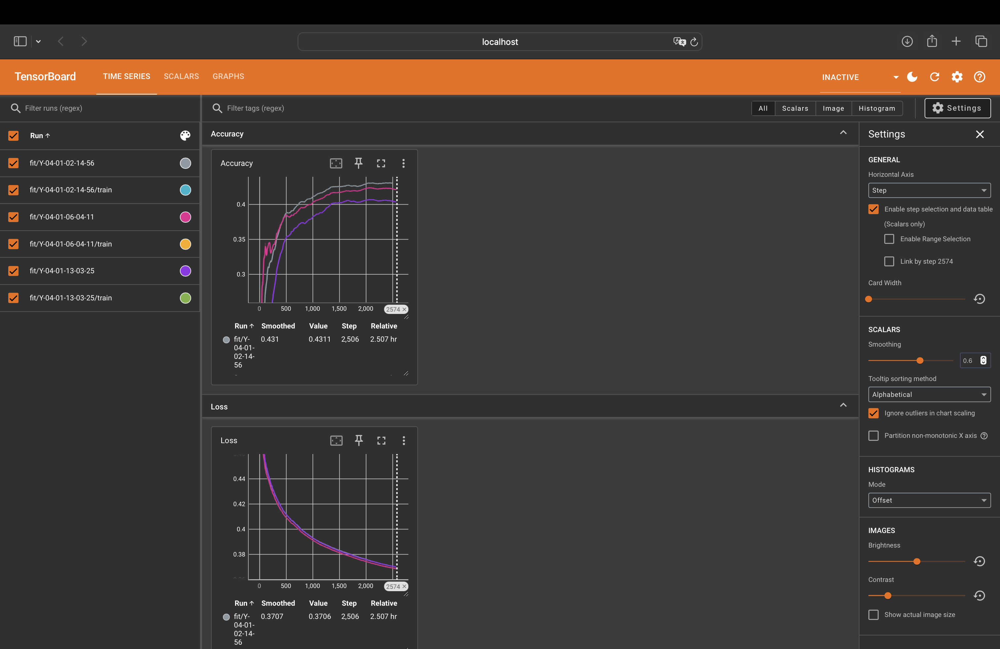

Tensorboard displaying results of 3 different runs of the neural network for approx 2500 batches of size 32 for each run using the pretrained ResNet50 model architecture. Used all 30 class labels but converted into binary labels.

Accuracy appears to level off at around 0.45 
Loss appears to level off at round 0.37

In [ ]:
    """
    Malachy -
    I have created a new script to remove missing paths from the catalog dataframe and remove any images from the dataframe and folders where the bottom half of the image is only black.
    """

# go through the dataset and remove any images from the dataframe and folders that do not have a file path that exists
# remove any images from the dataframe and folders where the bottom half of the image is only black
import os, cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def remove_missing_paths(dataset_root, catalog_path):
    """
    Remove missing paths from the catalog dataframe and return a new dataframe with the missing paths removed
    
    Args:
    dataset_root (str): path to the root of the dataset
    catalog_path (str): path to the catalog dataframe
    
    Returns:
    pandas_df (pd.DataFrame): new dataframe with missing paths removed
    """
    pandas_df = pd.read_parquet(catalog_path)
    
    missing_indices = []
    missing_paths = 0

    for idx, _ in enumerate(pandas_df['id_str']):
        file_loc = os.path.join(dataset_root, 'images/', str(pandas_df['subfolder'][idx]) + '/', str(pandas_df['filename'][idx])) 
        pandas_df.at[idx, 'file_loc'] = file_loc  # write new file_loc to file_loc column

        if not os.path.exists(file_loc): 
            missing_indices.append(idx)
            missing_paths += 1
            print(f"Missing path: {pandas_df['subfolder'][idx]}/{pandas_df['filename'][idx]}", end = '\r', flush = True)

    print("\n")
    for idx in missing_indices:
        pandas_df = pandas_df.drop(idx)

    pandas_df = pandas_df.reset_index(drop=True)

    print("Missing paths removed")
    print(f"Number of missing paths removed: {missing_paths}")

    return pandas_df
    
def remove_error_msg_images(pandas_df, show_images, delete_paths):
    """
    Remove error message images from the dataset
    
    Args:
    pandas_df (pd.DataFrame): dataframe to remove error message images from
    show_images (bool): show images that are removed
    delete_paths (bool): delete the paths of the removed images
    
    Returns:
    pandas_df (pd.DataFrame): new dataframe with error message images removed
    """
    
    print("Removing error message images")
    erorr_count = 0
    removed_paths = []
    
    for idx, _ in enumerate(pandas_df['id_str']):
        print(f"Reading: {pandas_df.loc[idx, 'subfolder']}/{pandas_df.loc[idx, 'filename']}", end = '\r', flush = True)
        image_path = os.path.join(dataset_root, 'images/', str(pandas_df.loc[idx, 'subfolder']) + '/', str(pandas_df.loc[idx, 'filename']))
        
        if os.path.exists(image_path):
            image = cv2.imread(image_path)
            cropped_image = image[image.shape[0]//2:, :]
        
            if np.all(cropped_image == 0):
                removed_paths.append(image_path)
                print(f"Error message image found: {pandas_df.loc[idx, 'subfolder']}/{pandas_df.loc[idx, 'filename']}")
                if show_images:
                    plt.imshow(image)
                    plt.title(f"{pandas_df['subfolder'][idx]}/{pandas_df['filename'][idx]}")
                    plt.show()
                
                erorr_count += 1 
    
    for image_path in removed_paths:
        if delete_paths:
            print("Removing: ", image_path, end = '\r', flush = True) 
            try:
                os.remove(image_path)
                print(f"Deleted: {image_path}")
            except Exception as e:
                print(f"Failed to delete {image_path}: {e}")
        
    pandas_df = pandas_df.reset_index(drop=True)         
        
    print(f"Number of error message images removed: {erorr_count}")
            
    return pandas_df

def build_new_catalog(pandas_df, catalog_path):
    """
    Build a new catalog dataframe and save it to a parquet file
    
    Args:
    pandas_df (pd.DataFrame): dataframe to build new catalog from
    catalog_path (str): path to save the new catalog
    """
    print("Building new catalog")
    os.remove(catalog_path)
    pandas_df = pandas_df.reset_index(drop=True)
    pandas_df['iauname'] = pandas_df['iauname'].astype(str)
    pandas_df['summary'] = pandas_df['summary'].astype(str)
    pandas_df.to_parquet(catalog_path)
    print(f"New catalog saved to: {catalog_path}")

dataset_root = "/Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset-processed"
train_catalog = "/Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset-processed/gz2_train_catalog.parquet"
test_catalog = "/Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset-processed/gz2_test_catalog.parquet"

paths_dataframe = remove_missing_paths(dataset_root, train_catalog)
processed_dataframe = remove_error_msg_images(paths_dataframe, show_images = False, delete_paths = True)
build_new_catalog(processed_dataframe, catalog_path = train_catalog)

paths_dataframe = remove_missing_paths(dataset_root, test_catalog)
processed_dataframe = remove_error_msg_images(paths_dataframe, show_images = False, delete_paths = True)
build_new_catalog(processed_dataframe, catalog_path = test_catalog)

8-4-2024
Malachy-
Created image preprocessing and image augmentation scripts

In [ ]:
    """
    Malachy -
    Image augmentation script, pre-processing the images in the dataset by applying augmentations to them.
    """

import os, cv2
import pandas as pd
import numpy as np
import time

# duplicate images in dataset by applying augmentations to them.
# create new subfolder with A appended to the start of the subfolder name and save the augmented images there.
# do this for all images in the dataset, 4 times for each image, add an extra A to the subfolder name each time.
# append the new images to the end of the catalog, keeping the original data associated with the image, but replace the file_loc with the new file_loc.
# can apply multiple augmentations to the same image, i.e rotation by random angle, flipping, zoom, adding noise, de-noising ect.

def read_parquet(path):
    """
    Read the parquet file at the path.
    
    args:
    path (str): The path to the parquet file.
    
    returns:
    pandas_df (pd.DataFrame): The dataframe containing the data from the parquet file.
    """
    return pd.read_parquet(path)

def open_image(image_path):
    """
    Open the image at the image_path.
    
    args:
    image_path (str): The path to the image.
    
    returns:
    image (tf.Tensor): The image.
    """
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def get_augmentations(image, RNG):
    """
    Get a random set of 3 augmentations to apply to the image.
    
    args:
    image (tf.Tensor): The image to apply augmentations to.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (tf.Tensor): The image with the augmentations applied.
    aug_1 (str): The first augmentation applied.
    aug_2 (str): The second augmentation applied.
    aug_3 (str): The third augmentation applied.
    """
    
    augmentations = np.random.choice(['None', 'Flip', 'Rotation', 'Scale', 'Blurr', 'Noise', 'Translation'], 3, replace = False)
    aug_1, aug_2, aug_3 = augmentations
    
    for aug in augmentations:
        match aug:
            case 'None':
                image = no_augmentations(image)
            case 'Flip':
                image = random_flip(image, RNG)
            case 'Rotation':
                image = random_rotation(image, RNG)
            case 'Scale':
                image = random_zoom(image, RNG)
            case 'Hue':
                image = random_hue(image, RNG)
            case 'Blurr':
                image = random_blurr(image, RNG)
            case 'Noise':
                image = noise_denoise(image, RNG)
            case 'Translation':
                image = random_translation(image, RNG)
    
    image = cv2.convertScaleAbs(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image, aug_1, aug_2, aug_3

def no_augmentations(image):
    """
    Do not apply any augmentations to the image.
    
    args:
    image (tf.Tensor): The image to not apply augmentations to.
    
    returns:
    image (tf.Tensor): The original image.
    """
    return image

def random_flip(image, RNG):
    """
    Flip the image along a random axis.
    axis = 0 -> flip up-down
    axis = 1 -> flip left-right
    
    args:
    image (np.array): The image to flip.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The flipped image.
    """
    axis = RNG.integers(0, 1, endpoint = True)
    image = cv2.flip(image, axis)
    return image
    
def random_rotation(image, RNG):
    """
    Rotate the image by a random angle between -180 and 180 degrees.
    
    args:
    image (tf.Tensor): The image to rotate.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The rotated image
    """
    rows, cols, dim = image.shape
    angle = RNG.uniform(-180, 180)
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    image = cv2.warpAffine(image, M, (cols, rows))
    return image
    
def random_zoom(image, RNG):
    """
    Zoom the image by a random value between -0.5 and 0.5.
    Ensure the aspect ratio of the zoomed image is square.
    
    args:
    image (np.array): The image to zoom.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The zoomed image.
    """
    scale = RNG.uniform(-0.75, 1.5)
    rows, cols, dim = image.shape
    M = cv2.getRotationMatrix2D((cols/2, rows/2), 0, scale)
    image = cv2.warpAffine(image, M, (cols, rows))
    return image

def random_hue(image, RNG):
    """
    Change the hue of the image by a random value between -180 and 180.
    
    args:
    image (np.array): The image to change the hue of.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The image with the hue changed.
    """
    delta = RNG.uniform(-180, 180)  
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(image)
    h = np.clip(h + delta, 0, 255)
    image = cv2.merge((h, s, v))
    image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    return image

def random_blurr(image, RNG):
    """
    Apply a random blurring filter to the image.
    
    args:
    image (np.array): The image to apply the blurring filter to.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The image with the blurring filter applied.
    """
    k = RNG.choice([3, 5, 7])
    image = cv2.GaussianBlur(image, ksize = (k, k), sigmaX = 0, sigmaY = 0)
    return image

def noise_denoise(image, RNG):
    """
    Add random noise to the image or denoise the image.
    50% chance of adding noise, 50% chance of denoising the image.
    
    args:
    image (np.array): The image to add noise to or denoise.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The image with noise added or denoised.
    """
    choice = RNG.integers(0, 1, endpoint=True)
 
    if choice == 0:
        noise = np.random.normal(0, 1, image.shape)
        image = image + noise
        image = np.clip(image, 0, 255)
        return image
    else:
        image = cv2.fastNlMeansDenoisingColored(image, h = 10, hColor = 10, templateWindowSize = 7, searchWindowSize = 21)
        return image

def random_translation(image, RNG):
    """
    Translate the image by a random value between -0.5 and 0.5.
    
    args:
    image (np.array): The image to translate.
    RNG (np.random.Generator): The random number generator.
    
    returns:
    image (np.array): The translated image.
    """
    rows, cols, dim = image.shape
    tx = RNG.uniform(-0.25, 0.25) * cols
    ty = RNG.uniform(-0.25, 0.25) * rows
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    image = cv2.warpAffine(image, M, (cols, rows))
    return image

def augment_images(pandas_df, max_iter, dataset_root, catalog, RNG):
    """
    Augment the images in the pandas_df by applying random augmentations to them.
    Save the augmented images to a new subfolder in the images directory.
    Append the new image data to the end of the pandas_df.
    Repeat this process max_iter times.
    
    Parameters:
    pandas_df (pd.DataFrame): The dataframe containing the image data.
    max_iter (int): The number of times to augment the images.
    dataset_root (str): The root directory of the dataset.
    catalog (str): The name of the catalog.
    RNG (np.random.Generator): The random number generator.
    """
    
    times = []
    
    for iter in range(1, max_iter + 1):

        new_pandas_df = pd.DataFrame()
        
        for idx, _ in enumerate(pandas_df['file_loc']):
            
            start_time = time.time()
            image = pandas_df.loc[idx, 'file_loc']
            image_data = pandas_df.loc[idx].copy()
            image = open_image(image)
            image, aug_1, aug_2, aug_3  = get_augmentations(image, RNG)
            
            image_subfolder = f"Augmented-{iter}-{image_data['subfolder']}"
            image_name = f"A{iter}-{aug_1}-{aug_2}-{aug_3}-{image_data['filename']}"
            
            sub_folder_path = os.path.join(dataset_root, 'images/', image_subfolder)
            
            if not os.path.exists(sub_folder_path):
                os.mkdir(sub_folder_path)
            
            image_path = os.path.join(sub_folder_path, image_name)
        
            image_data['subfolder'] = image_subfolder
            image_data['filename'] = image_name
            image_data['file_loc'] = image_path
            
            new_pandas_df = new_pandas_df._append(image_data, ignore_index = True)
            
            cv2.imwrite(image_data['file_loc'], image)
            
            end_time = time.time()
            iter_time = end_time - start_time
            times.append(iter_time)
            
            if len(times) > 1024:
                times = times[:len(times)//2]

            if times == []:
                mean_time = None
            else:
                mean_time = np.mean(times)
            
            print(f"iter: {iter}/{max_iter} \t | {idx}/{len(pandas_df['file_loc'])} \t | ETA: {mean_time * (len(pandas_df['file_loc']) - idx):.2e}s \t | [{image_subfolder}/{image_name}] \t\t\t", end = '\r', flush
            = True)
            
        # save the new_pandas_df to file
        new_pandas_df.to_parquet(f"{dataset_root}/augmented_{iter}_{catalog}")

dataset_root = "/Users/malachy/Documents/3rd Year Project/Project-72-Classifying-cosmological-data-with-machine-learning/galaxyzoo2-dataset-processed"
train_catalog = "gz2_train_catalog.parquet"
test_catalog = "gz2_test_catalog.parquet"

train_catalog_path = os.path.join(dataset_root, train_catalog)
test_catalog_path = os.path.join(dataset_root, test_catalog)

train_df = read_parquet(train_catalog_path)
test_df = read_parquet(test_catalog_path)
max_iter = 1

seed = 1
RNG = np.random.default_rng(seed)

augment_images(pandas_df = train_df, max_iter = max_iter, dataset_root = dataset_root, catalog = train_catalog, RNG = RNG)
augment_images(pandas_df = test_df, max_iter = max_iter, dataset_root = dataset_root, catalog = test_catalog, RNG = RNG)

# should probably manually delete the duplicate catalogs created by the augmentation process, but
# I won't make a script to do that as its also handy to keep them around incase something breaks.

11-4-2024
Malachy -
Implemented on the fly augmentation in training dataset pipline map function.

In [ ]:
def fetch_image_label_pair(self, image_path, label, architecture, augmentation):
    """
    Fetches an image and its corresponding label from the dataset.
    
    args:
    image_path (tf.Tensor): the path to the image file
    label (tf.Tensor): the label of the image
    architecture (str): the architecture of the model to be used
    augmentation (bool): whether to apply image augmentation
    
    returns:
    (tuple): of the image and its corresponding label
        image (tf.Tensor): the requested image
        label (tf.Tensor): the requested label
    """ 
    image_path = tf.squeeze(image_path)
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels = self.input_dim)
    image = tf.image.convert_image_dtype(image, tf.float32) # Convert image dtype from tf.uint8 to tf.float32 when passing to the model
    image = tf.image.resize(image, self.input_shape)
    
    if augmentation:
        augs = tf.random.shuffle(['None', 'flip-lr', 'flip-ud', 'rot90'])[:1]
        for a in augs:
            if a == 'None':
                image = image
            elif a == 'flip-lr':
                image = tf.image.random_flip_left_right(image)
            elif a == 'flip-ud':
                image = tf.image.random_flip_up_down(image)
            elif a == 'rot90':
                image = tf.image.rot90(image, k = tf.random.uniform(shape = [], minval = 0, maxval = 4, dtype = tf.int32))
    
    # Pre trained models require the input to be preprocessed before passing to the model
    if architecture == "ResNet50":
        image = tf.keras.applications.resnet.preprocess_input(image)
    elif architecture == "ResNet50V2":
        image = tf.keras.applications.resnet_v2.preprocess_input(image)
    elif architecture == "VGG16":
        image = tf.keras.applications.vgg16.preprocess_input(image)
    elif architecture == "VGG19":
        image = tf.keras.applications.vgg19.preprocess_input(image)
    elif architecture == "MobileNetV3Small":
        image = tf.keras.applications.MobileNetV3Small.preprocess_input(image)
    elif architecture == "MobileNetV3Large":
        image = tf.keras.applications.MobileNetV3Large.preprocess_input(image)
    
    return image, label